In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')
%cd /content/gdrive/MyDrive/ECE5242_AutonomousSystems/ECE5242Proj3-train/

Mounted at /content/gdrive/
/content/gdrive/MyDrive/ECE5242_AutonomousSystems/ECE5242Proj3-train


In [2]:
import load_data as ld
import MapUtils as mu
import numpy as np
import matplotlib.pyplot as plt

In [3]:
%cd /content/gdrive/MyDrive/ECE5242_AutonomousSystems/

/content/gdrive/MyDrive/ECE5242_AutonomousSystems


In [4]:
training_folder = 'ECE5242Proj3-train/data/'

In [ ]:
test_folder = 'ECE5242Proj3-test/'

In [6]:
encoder_files = {0: training_folder + 'Encoders20', 3: training_folder + 'Encoders23', 2: test_folder + 'Encoders22', 4: test_folder + 'Encoders24'}
lidar_files = {0: training_folder + 'Hokuyo20', 3: training_folder + 'Hokuyo23', 2: test_folder + 'Hokuyo22', 4: test_folder + 'Hokuyo24'}

In [7]:
wheel_radius = 0.127
circumference = 2 * np.pi * wheel_radius
encoder_counts_per_revolution = 360
encoder_ticks_to_meters = circumference / encoder_counts_per_revolution
width_between_wheels = 0.427

In [8]:
# load encoders data
FL_0, FR_0, RL_0, RR_0, ts_enc_0 = ld.get_encoder(encoder_files[0])
FL_3, FR_3, RL_3, RR_3, ts_enc_3 = ld.get_encoder(encoder_files[3])
FL_2, FR_2, RL_2, RR_2, ts_enc_2 = ld.get_encoder(encoder_files[2])
FL_4, FR_4, RL_4, RR_4, ts_enc_4 = ld.get_encoder(encoder_files[4])

Odometry

In [9]:
def odometry_update(fl,rl,fr,rr,encoder_ticks_to_meters,width_between_wheels):
      left_ticks = (fl + rl) / 2.0
      right_ticks = (fr + rr) / 2.0

      dist_left = left_ticks * encoder_ticks_to_meters
      dist_right = right_ticks * encoder_ticks_to_meters
      dist = (dist_left + dist_right) / 2.0

      delta_theta = (dist_right - dist_left) / width_between_wheels

      return delta_theta, dist

In [10]:
def particle_pose_update(heading,x,y,delta_theta, dist):

      heading += delta_theta
      heading = heading % (2 * np.pi)

      delta_x = dist * np.cos(heading)
      delta_y = dist * np.sin(heading)

      x += delta_x
      y += delta_y

      return heading,x,y

In [11]:
def calculate_trajectory_2(FL, FR, RL, RR, ts_enc,encoder_ticks_to_meters,width_between_wheels,tuning_factor):

  width_between_wheels *= tuning_factor

  heading = 0
  x = 0
  y = 0

  trajectory_x = [x]  # Start at origin
  trajectory_y = [y]
  headings = []

  for i in range(len(ts_enc)):
    delta_theta, dist = odometry_update(FL[i],RL[i],FR[i],RR[i],encoder_ticks_to_meters,width_between_wheels)
    heading,x,y = particle_pose_update(heading,x,y,delta_theta, dist)
    trajectory_x.append(x)
    trajectory_y.append(y)
    headings.append(heading)

    # print('i {} LE {:.2f} RE {:.2f} \t dh_re {:.2f} \t h_re {:.2f} \t dx {:.2f} x {:.2f} \t  dy {:.2f} y {:.2f}'.format(i, left_ticks, right_ticks, delta_theta, heading, delta_x, x, delta_y, y))

  return trajectory_x,trajectory_y, headings

In [12]:
def plot_trajectories(trajectory_x, trajectory_y):
  plt.plot(trajectory_x, trajectory_y)
  plt.xlabel('X (m)')
  plt.ylabel('Y (m)')
  plt.title('Robot Trajectory')
  plt.grid(True)

In [13]:
tuning_factor_0 = 1.7
tuning_factor_3 = 1.7
tuning_factor_2 = 1.7
tuning_factor_4 = 1.7

In [14]:
trajectory_x_0_2, trajectory_y_0_2, headings_0_2= calculate_trajectory_2(FL_0, FR_0, RL_0, RR_0, ts_enc_0,encoder_ticks_to_meters,width_between_wheels,tuning_factor_0)

In [15]:
trajectory_x_3_2, trajectory_y_3_2, headings_3_2 = calculate_trajectory_2(FL_3, FR_3, RL_3, RR_3, ts_enc_3,encoder_ticks_to_meters,width_between_wheels,tuning_factor_3)

In [16]:
trajectory_x_2_2, trajectory_y_2_2, headings_2_2 = calculate_trajectory_2(FL_2, FR_2, RL_2, RR_2, ts_enc_2,encoder_ticks_to_meters,width_between_wheels,tuning_factor_3)

In [17]:
trajectory_x_4_2, trajectory_y_4_2, headings_4_2 = calculate_trajectory_2(FL_4, FR_4, RL_4, RR_4, ts_enc_4,encoder_ticks_to_meters,width_between_wheels,tuning_factor_3)

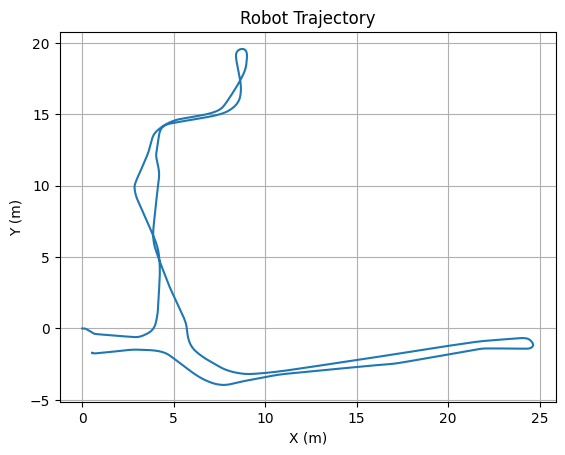

In [18]:
plot_trajectories(trajectory_x_0_2,trajectory_y_0_2)

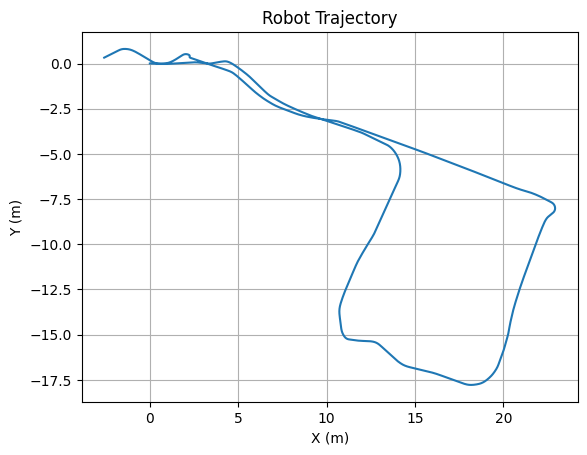

In [19]:
plot_trajectories(trajectory_x_3_2,trajectory_y_3_2)

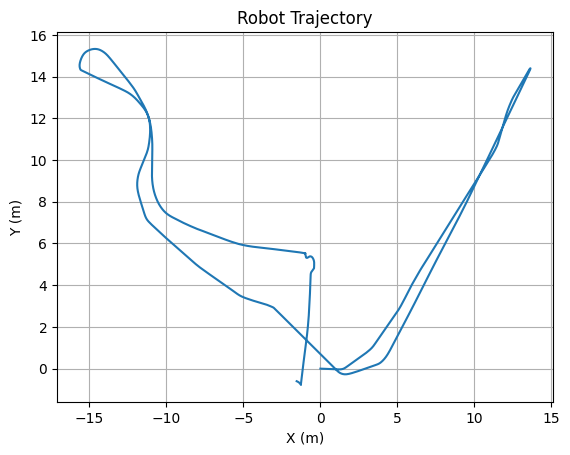

In [20]:
plot_trajectories(trajectory_x_2_2,trajectory_y_2_2)

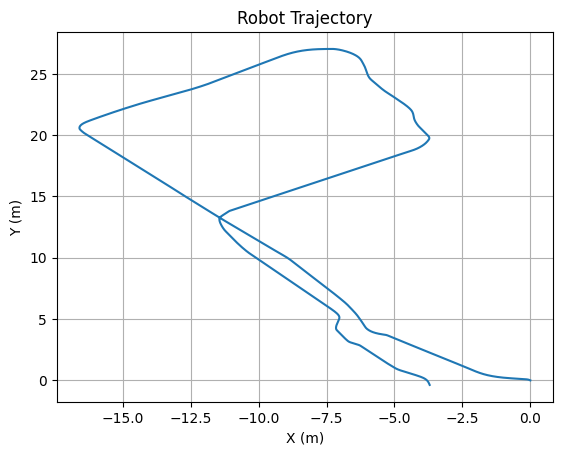

In [21]:
plot_trajectories(trajectory_x_4_2,trajectory_y_4_2)

In [22]:
# match lidar data to encoder data timesteps, for each encoder index, record matching lidar index

def match_lidar_indices_to_encoder(ts_enc,ts_lidar):
  matched_lidar_indices = []
  for i, encoder_timestamp in enumerate(ts_enc):
      cur_closest_lidar_index = np.argmin(np.abs(ts_lidar - encoder_timestamp))
      matched_lidar_indices.append(cur_closest_lidar_index)
  return matched_lidar_indices

In [23]:
lidar_0 = ld.get_lidar(lidar_files[0])
lidar_3 = ld.get_lidar(lidar_files[3])
lidar_2 = ld.get_lidar(lidar_files[2])
lidar_4 = ld.get_lidar(lidar_files[4])

In [24]:
lidar_timestamps_consolidated_0 = np.array([lidar_0[i]['t'] for i in range(len(lidar_0))])
lidar_timestamps_consolidated_3 = np.array([lidar_3[i]['t'] for i in range(len(lidar_3))])
lidar_timestamps_consolidated_2 = np.array([lidar_2[i]['t'] for i in range(len(lidar_2))])
lidar_timestamps_consolidated_4 = np.array([lidar_4[i]['t'] for i in range(len(lidar_4))])

In [25]:
matched_lidar_indices_0 = match_lidar_indices_to_encoder(ts_enc_0,lidar_timestamps_consolidated_0)
matched_lidar_indices_3 = match_lidar_indices_to_encoder(ts_enc_3,lidar_timestamps_consolidated_3)
matched_lidar_indices_2 = match_lidar_indices_to_encoder(ts_enc_2,lidar_timestamps_consolidated_2)
matched_lidar_indices_4 = match_lidar_indices_to_encoder(ts_enc_4,lidar_timestamps_consolidated_4)

In [26]:
log_odds_for_occupied = 0.9
log_odds_for_empty = -0.5

In [27]:
map_cell_size = 0.1
map_side_size = 100

In [28]:
map_cells_side_len = int((map_side_size // map_cell_size) + 1)
init_map_size = (map_cells_side_len,map_cells_side_len)

In [29]:
adjust_x = 25
adjust_y = 25

In [30]:
maxmap = 100

In [31]:
def particle_pose_update_single(x, y, heading, delta_theta, dist):
    heading = (heading + delta_theta) % (2 * np.pi)
    delta_x = dist * np.cos(heading)
    delta_y = dist * np.sin(heading)
    x += delta_x
    y += delta_y
    return x, y, heading

In [32]:
def calculate_endpts_for_single_particle(lidar_angles, lidar_scans, x, y, heading):
    lidar_angles_with_heading = lidar_angles.reshape(-1) + heading
    endpts_x = lidar_scans * np.cos(lidar_angles_with_heading) + x
    endpts_y = lidar_scans * np.sin(lidar_angles_with_heading) + y
    return endpts_x, endpts_y

In [33]:
def plot_occupancy_map(occupancy_map):
    plt.imshow(occupancy_map, cmap='gray', origin='lower')
    plt.colorbar()
    plt.title('Occupancy Map')
    plt.xlabel('X Cells')
    plt.ylabel('Y Cells')
    plt.show()

In [34]:
def update_occupancy_map(FL, FR, RL, RR, ts_enc, encoder_ticks_to_meters, width_between_wheels, tuning_factor, lidar, matched_lidar_indices, adjust_x, adjust_y, map_cell_size, maxmap, init_map_size, log_odds_for_occupied, log_odds_for_empty, occmap_min_value, occmap_max_value, period):
    occupancymap = np.zeros(init_map_size)

    # Initialize particle pose
    heading = 0
    x = 0
    y = 0
    width_between_wheels_use = width_between_wheels * tuning_factor

    occupancymapslist = []

    # Main Loop
    for i, ts in enumerate(ts_enc):
        # Common to all particles
        delta_theta, dist = odometry_update(FL[i], RL[i], FR[i], RR[i], encoder_ticks_to_meters, width_between_wheels_use)
        lidar_data = lidar[matched_lidar_indices[i]]
        lidar_angles = lidar_data['angle']
        lidar_scans = lidar_data['scan']

        # Update particle pose
        x, y, heading = particle_pose_update_single(x, y, heading, delta_theta, dist)

        # Calculate endpoints for the particle
        endpts_x_0, endpts_y_0 = calculate_endpts_for_single_particle(lidar_angles, lidar_scans, x, y, heading)

        # Convert particle positions and endpoints to map cells
        x_cell, y_cell, endpts_x_0_cells, endpts_y_0_cells = convert_to_map_cells(x, y, endpts_x_0, endpts_y_0, adjust_x, adjust_y, map_cell_size)

        # Update occupancy map
        free_map_cells = mu.getMapCellsFromRay(x_cell, y_cell, endpts_x_0_cells, endpts_y_0_cells, maxmap)
        occupancymap[endpts_y_0_cells.astype(int), endpts_x_0_cells.astype(int)] += log_odds_for_occupied
        occupancymap[free_map_cells[1].astype(int), free_map_cells[0].astype(int)] += log_odds_for_empty
        occupancymap = np.clip(occupancymap, occmap_min_value, occmap_max_value)

        if i % period == 0:
            occupancymapslist.append(occupancymap.copy())
            plot_occupancy_map(occupancymap.copy())

    # Append the final occupancy map to the list
    occupancymapslist.append(occupancymap)
    plot_occupancy_map(occupancymap)

    return occupancymapslist, occupancymap


In [35]:
occmap_minval = -100
occmap_maxval = 100
period = 250

In [36]:
# Usage
params_odom_0 = {
    'FL': FL_0,
    'FR': FR_0,
    'RL': RL_0,
    'RR': RR_0,
    'ts_enc': ts_enc_0,
    'encoder_ticks_to_meters': encoder_ticks_to_meters,
    'width_between_wheels': width_between_wheels,
    'tuning_factor': tuning_factor_0,
    'lidar': lidar_0,
    'matched_lidar_indices': matched_lidar_indices_0,
    'adjust_x': adjust_x,
    'adjust_y': adjust_y,
    'map_cell_size': map_cell_size,
    'maxmap': maxmap,
    'init_map_size': init_map_size,
    'log_odds_for_occupied': log_odds_for_occupied,
    'log_odds_for_empty': log_odds_for_empty,
    'occmap_min_value': occmap_minval,
    'occmap_max_value': occmap_maxval,
    'period': period
}

In [37]:
# Usage
params_odom_3 = {
    'FL': FL_3,
    'FR': FR_3,
    'RL': RL_3,
    'RR': RR_3,
    'ts_enc': ts_enc_3,
    'encoder_ticks_to_meters': encoder_ticks_to_meters,
    'width_between_wheels': width_between_wheels,
    'tuning_factor': tuning_factor_3,
    'lidar': lidar_3,
    'matched_lidar_indices': matched_lidar_indices_3,
    'adjust_x': adjust_x,
    'adjust_y': adjust_y,
    'map_cell_size': map_cell_size,
    'maxmap': maxmap,
    'init_map_size': init_map_size,
    'log_odds_for_occupied': log_odds_for_occupied,
    'log_odds_for_empty': log_odds_for_empty,
    'occmap_min_value': occmap_minval,
    'occmap_max_value': occmap_maxval,
    'period': period
}

In [38]:
# Usage
params_odom_2 = {
    'FL': FL_2,
    'FR': FR_2,
    'RL': RL_2,
    'RR': RR_2,
    'ts_enc': ts_enc_2,
    'encoder_ticks_to_meters': encoder_ticks_to_meters,
    'width_between_wheels': width_between_wheels,
    'tuning_factor': tuning_factor_2,
    'lidar': lidar_2,
    'matched_lidar_indices': matched_lidar_indices_2,
    'adjust_x': adjust_x,
    'adjust_y': adjust_y,
    'map_cell_size': map_cell_size,
    'maxmap': maxmap,
    'init_map_size': init_map_size,
    'log_odds_for_occupied': log_odds_for_occupied,
    'log_odds_for_empty': log_odds_for_empty,
    'occmap_min_value': occmap_minval,
    'occmap_max_value': occmap_maxval,
    'period': period
}

In [39]:
# Usage
params_odom_4 = {
    'FL': FL_4,
    'FR': FR_4,
    'RL': RL_4,
    'RR': RR_4,
    'ts_enc': ts_enc_4,
    'encoder_ticks_to_meters': encoder_ticks_to_meters,
    'width_between_wheels': width_between_wheels,
    'tuning_factor': tuning_factor_4,
    'lidar': lidar_4,
    'matched_lidar_indices': matched_lidar_indices_4,
    'adjust_x': adjust_x,
    'adjust_y': adjust_y,
    'map_cell_size': map_cell_size,
    'maxmap': maxmap,
    'init_map_size': init_map_size,
    'log_odds_for_occupied': log_odds_for_occupied,
    'log_odds_for_empty': log_odds_for_empty,
    'occmap_min_value': occmap_minval,
    'occmap_max_value': occmap_maxval,
    'period': period
}

In [40]:
def grid_to_map(coord, map_cell_size):
    return (coord // map_cell_size).astype(int)

In [41]:
def convert_to_map_cells(x,y,endpts_x,endpts_y,adjust_x,adjust_y,map_cell_size):
  x_shifted = x + adjust_x
  # print('x {}'.format(x))
  y_shifted = y+  adjust_y
  # print('y {}'.format(y))
  endpts_x_shifted = endpts_x + adjust_x
  endpts_y_shifted = endpts_y + adjust_y

  x_map_cell = grid_to_map(x_shifted,map_cell_size)
  # print('x_map_cell {}'.format(x_map_cell))
  y_map_cell = grid_to_map(y_shifted,map_cell_size)
  # print('y_map_cell {}'.format(y_map_cell))
  endpts_x_map_cells = grid_to_map(endpts_x_shifted,map_cell_size)
  endpts_y_map_cells = grid_to_map(endpts_y_shifted,map_cell_size)

  return x_map_cell, y_map_cell, endpts_x_map_cells, endpts_y_map_cells

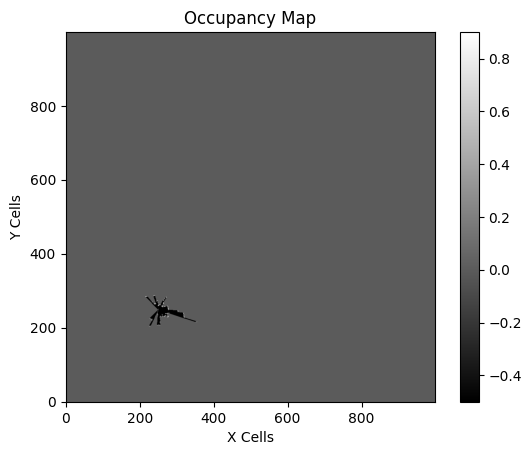

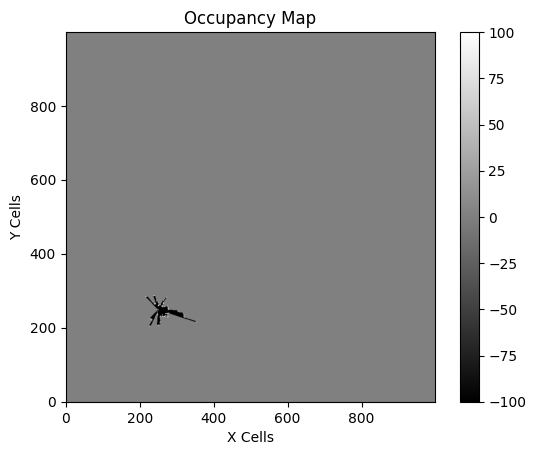

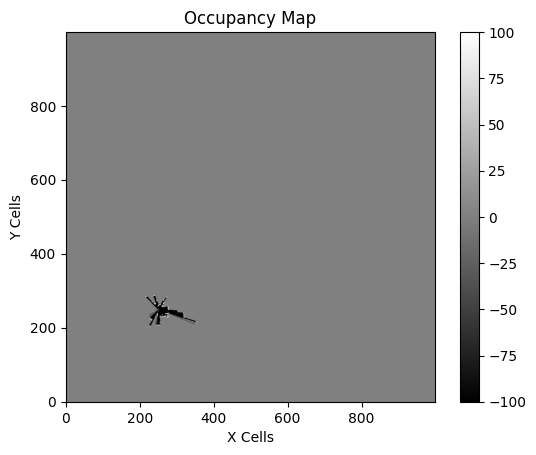

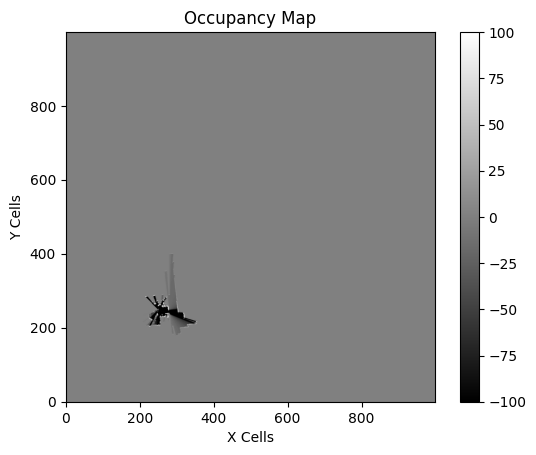

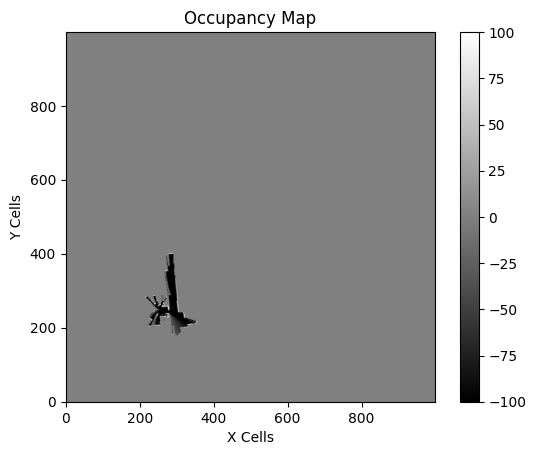

...

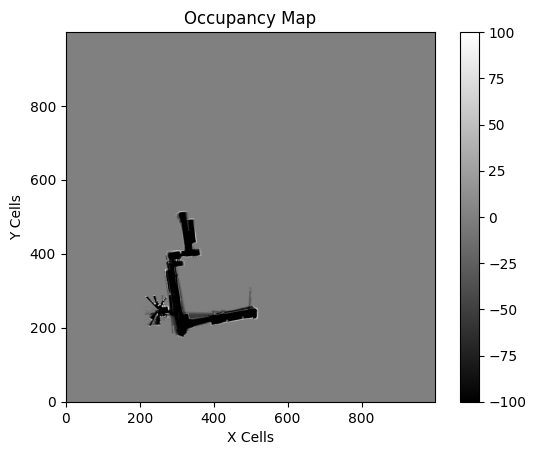

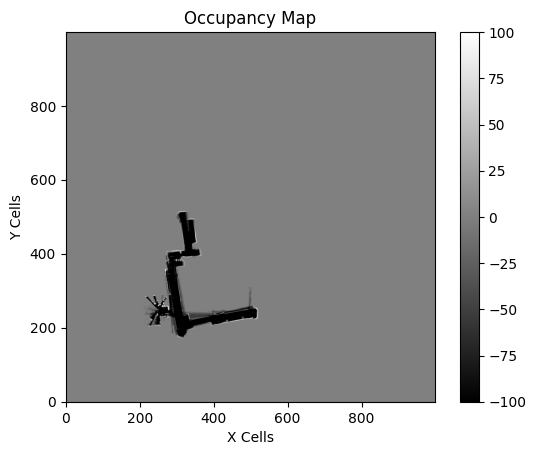

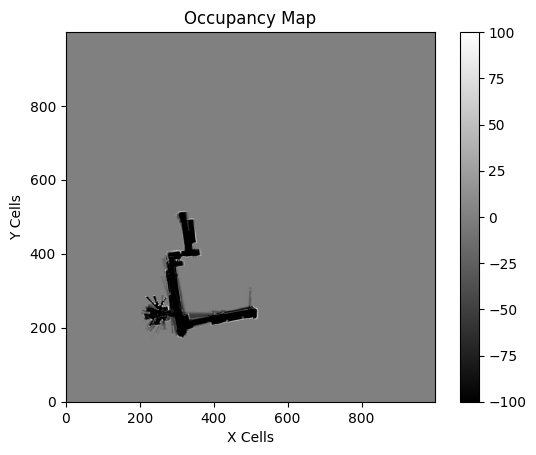

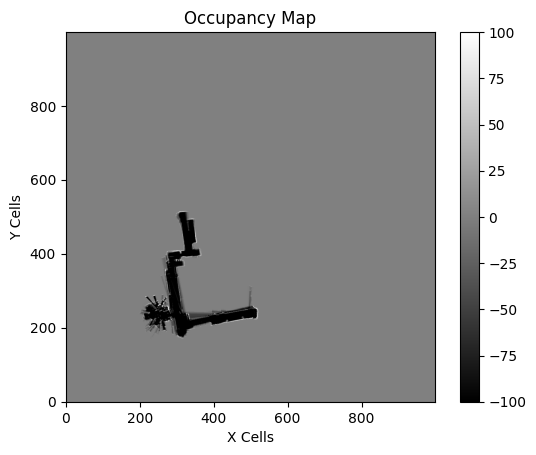

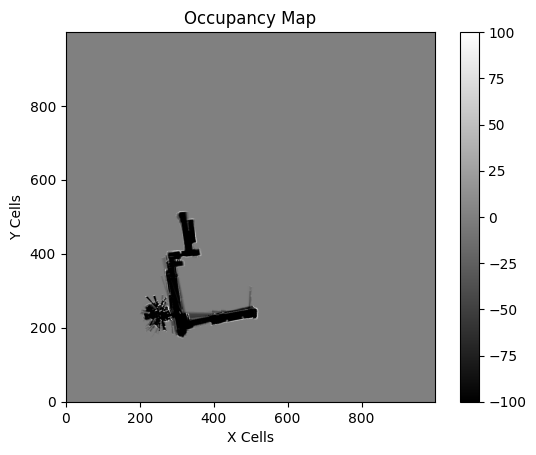

In [42]:
occupancymapslist_0_odometry_only, final_occupancymap_0_odometry_only = update_occupancy_map(**params_odom_0)

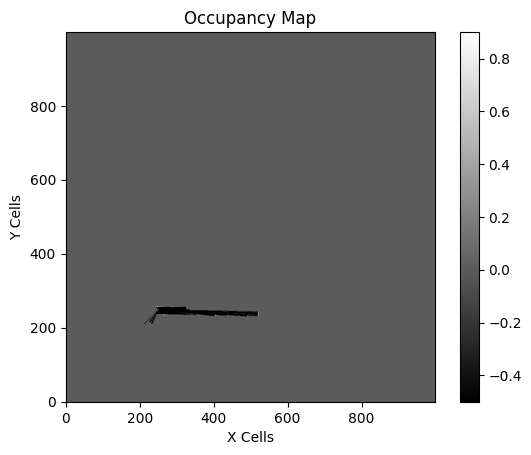

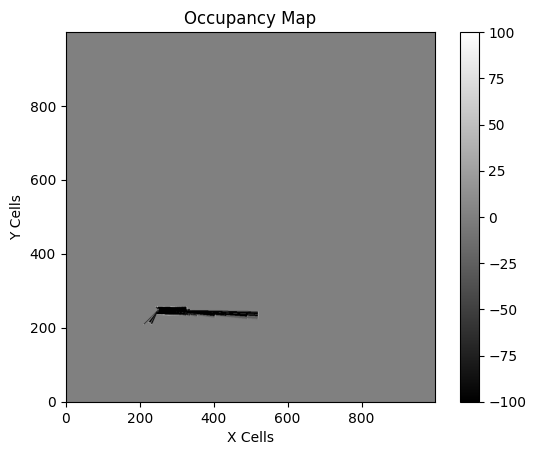

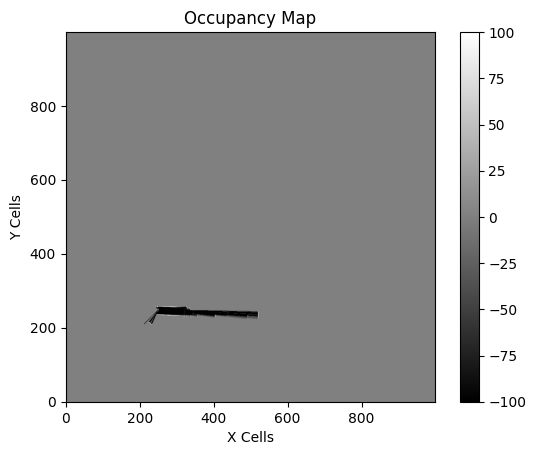

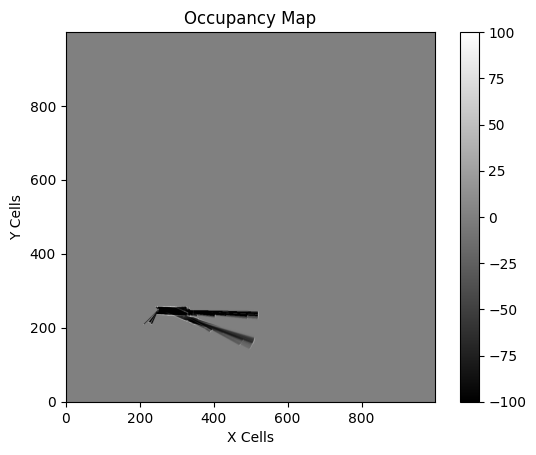

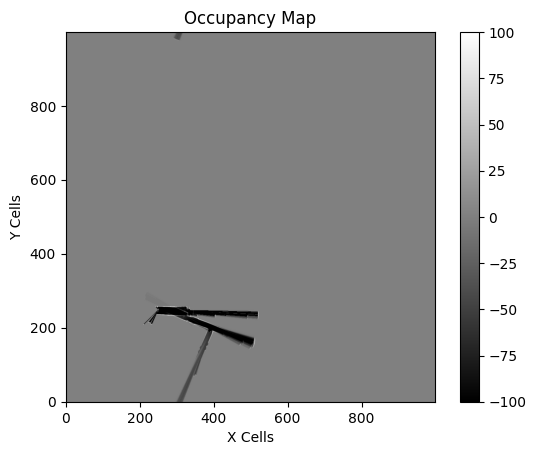

...

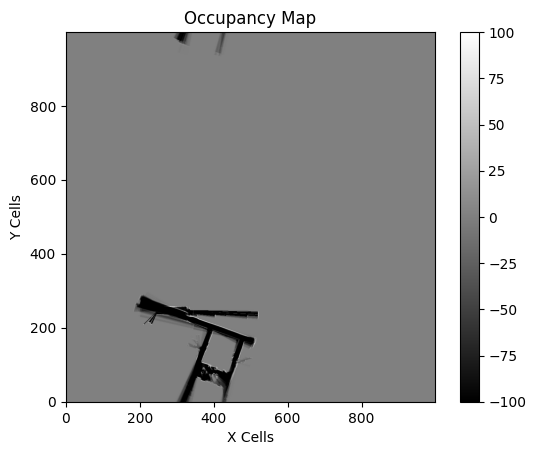

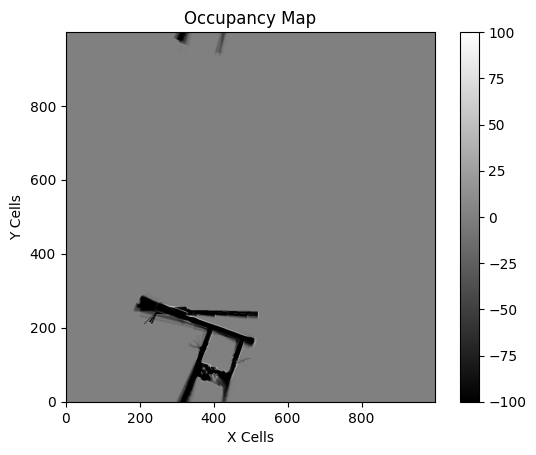

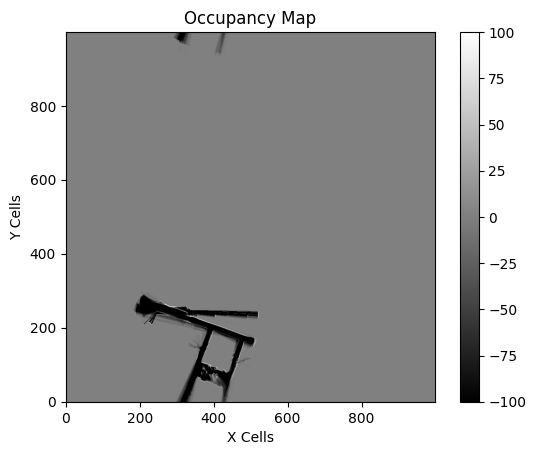

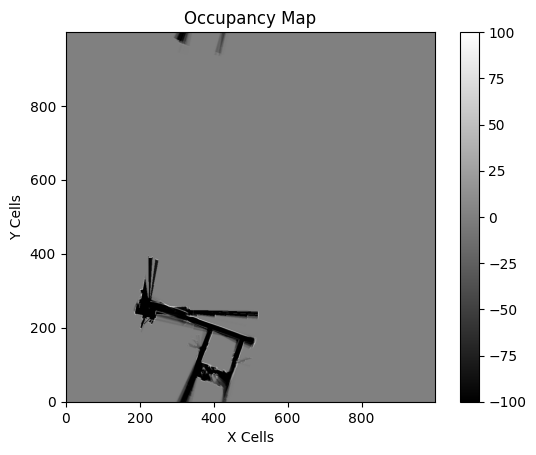

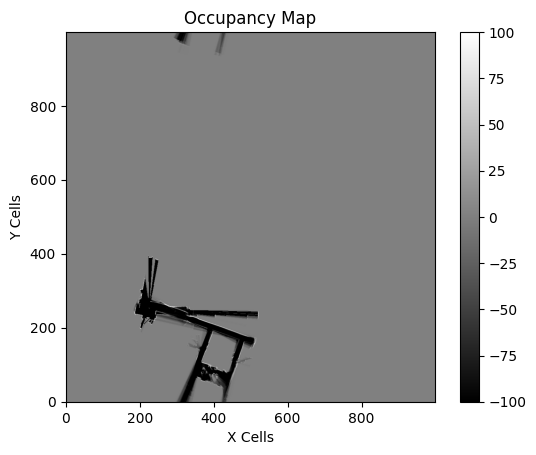

In [43]:
occupancymapslist_3_odometry_only, final_occupancymap_3_odometry_only = update_occupancy_map(**params_odom_3)

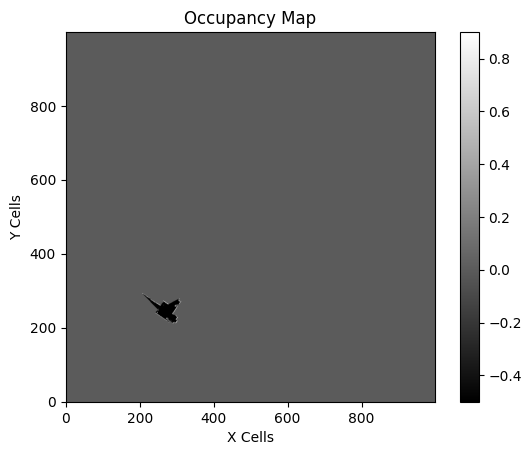

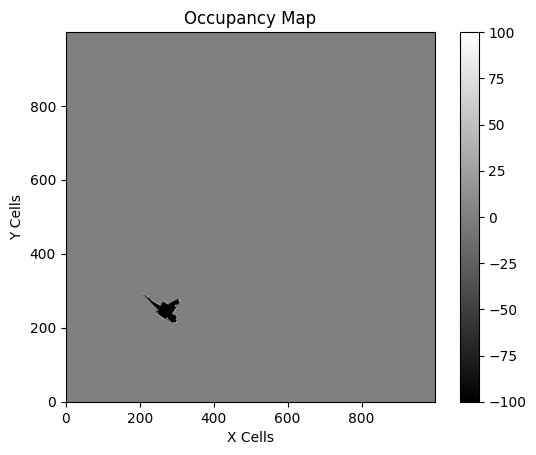

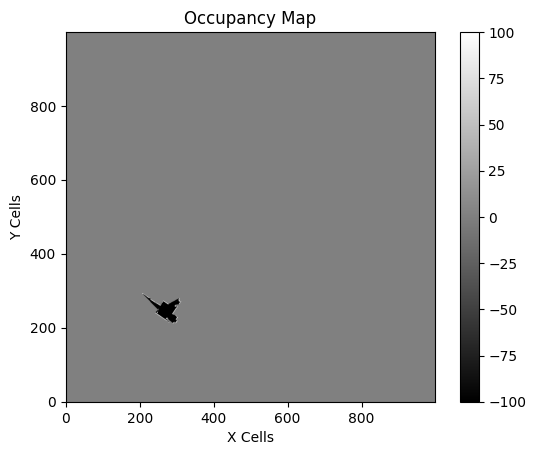

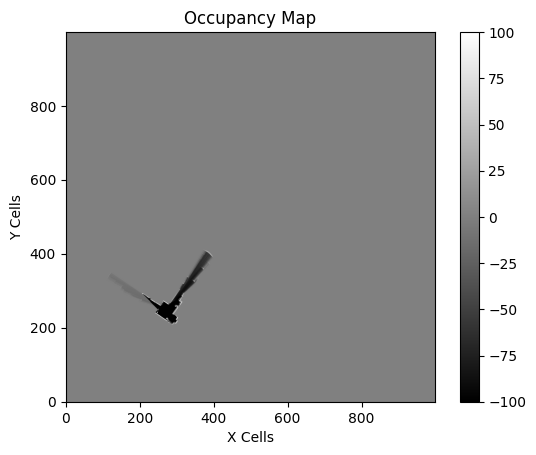

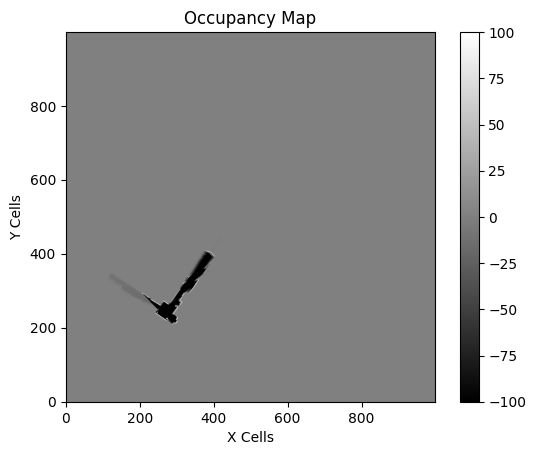

...

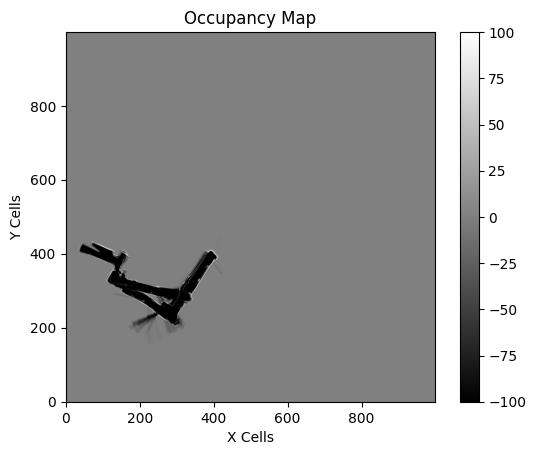

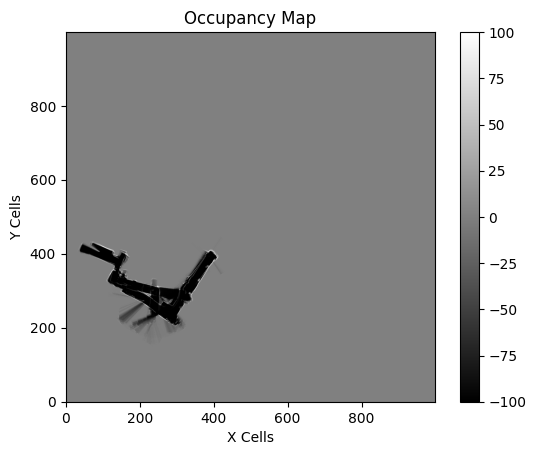

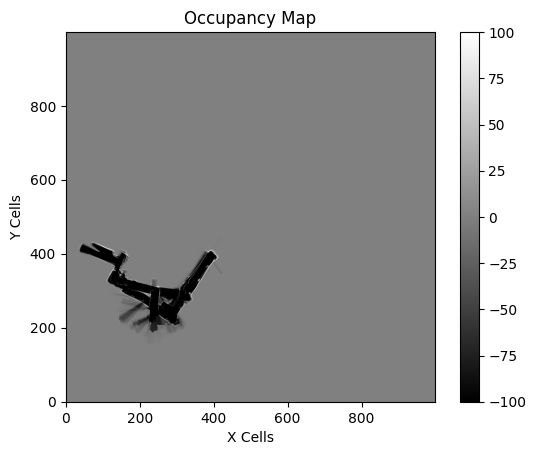

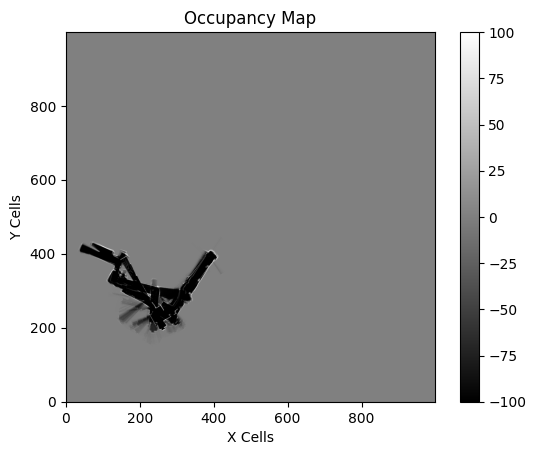

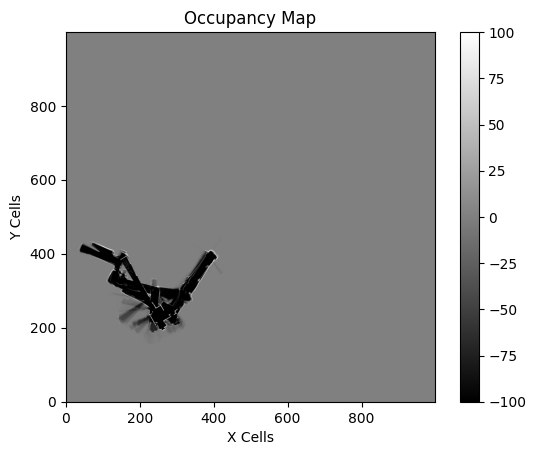

In [44]:
occupancymapslist_2_odometry_only, final_occupancymap_2_odometry_only = update_occupancy_map(**params_odom_2)

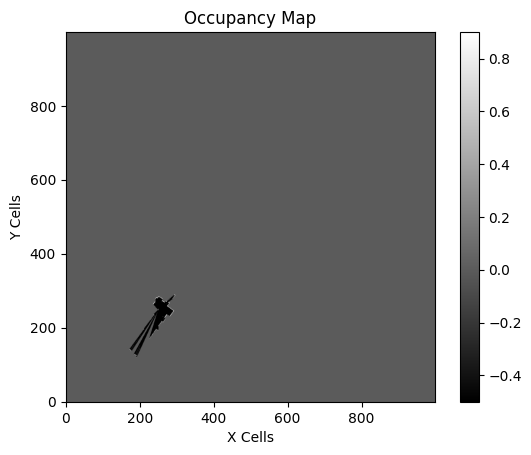

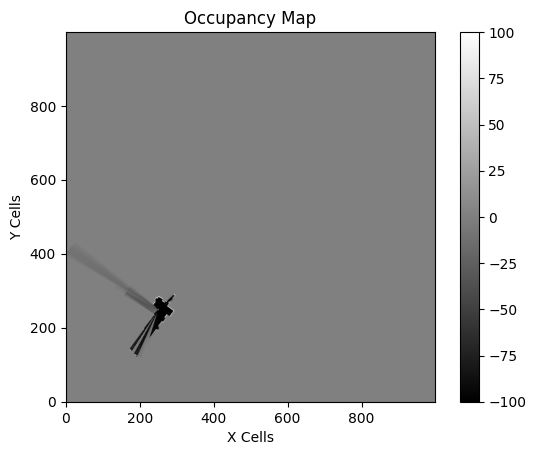

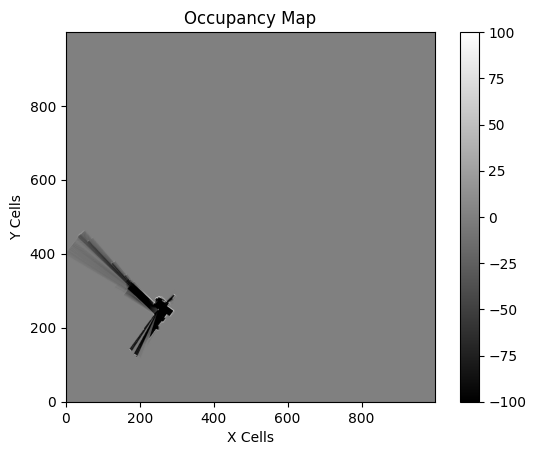

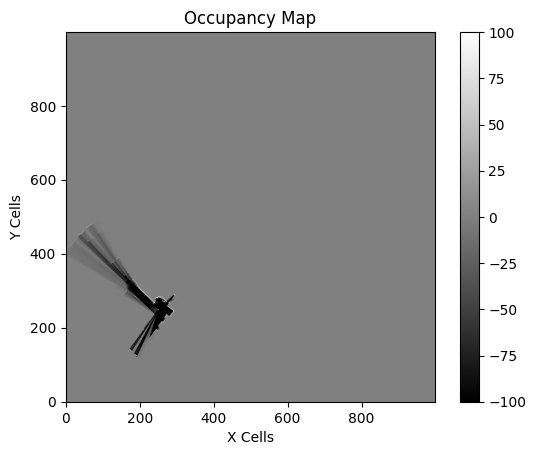

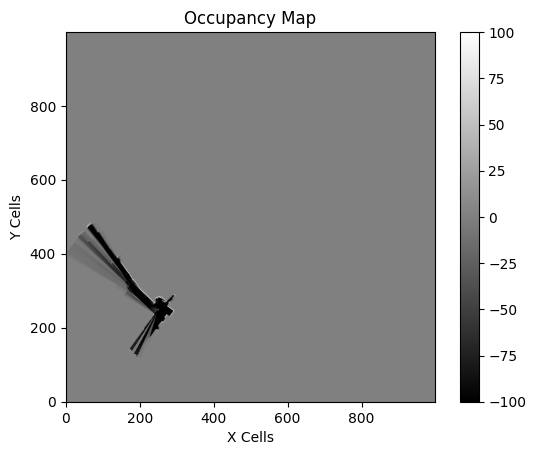

...

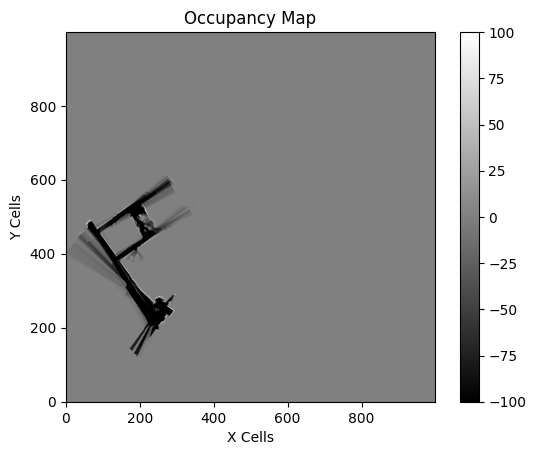

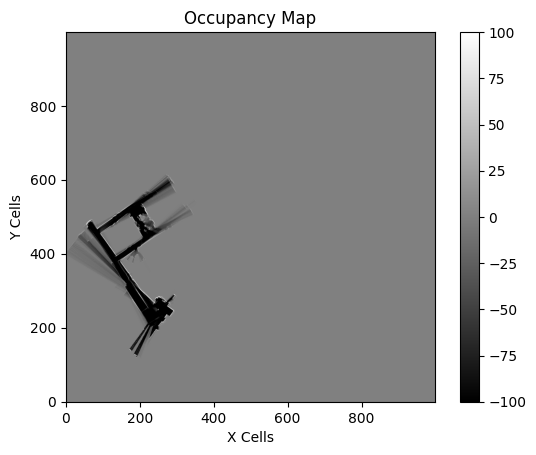

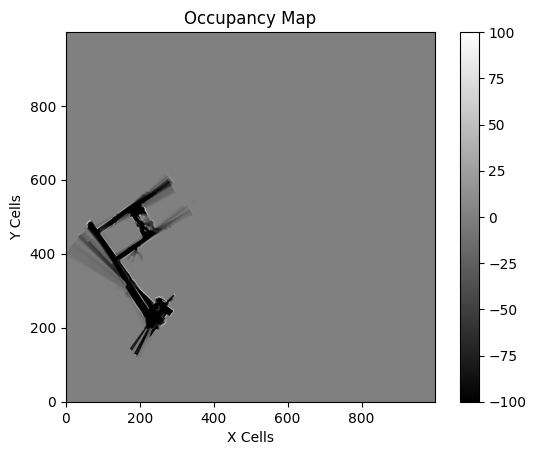

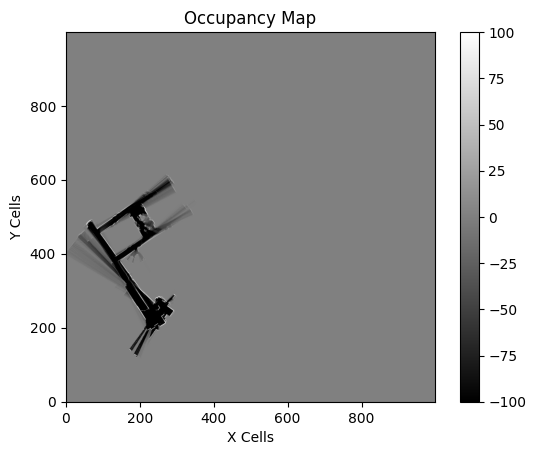

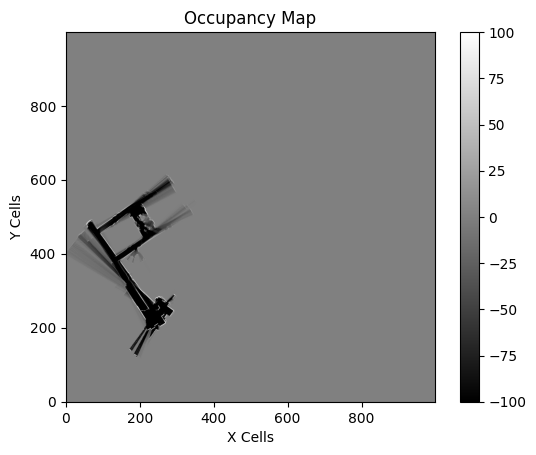

In [45]:
occupancymapslist_4_odometry_only, final_occupancymap_4_odometry_only = update_occupancy_map(**params_odom_4)

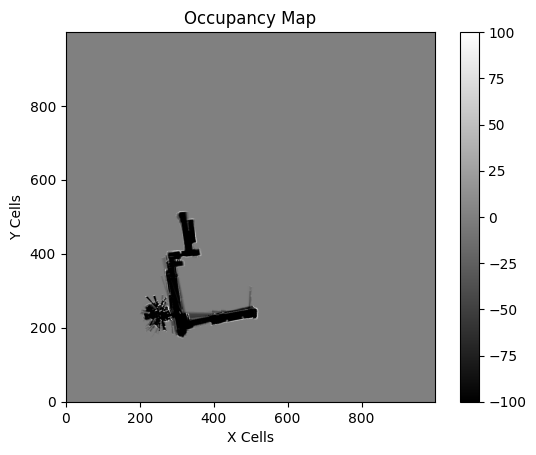

In [46]:
plot_occupancy_map(final_occupancymap_0_odometry_only)

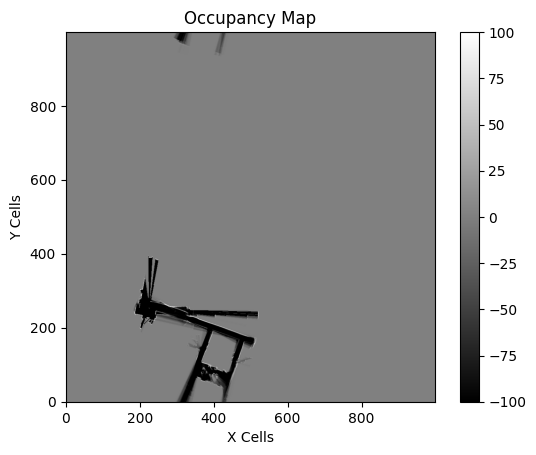

In [47]:
plot_occupancy_map(final_occupancymap_3_odometry_only)

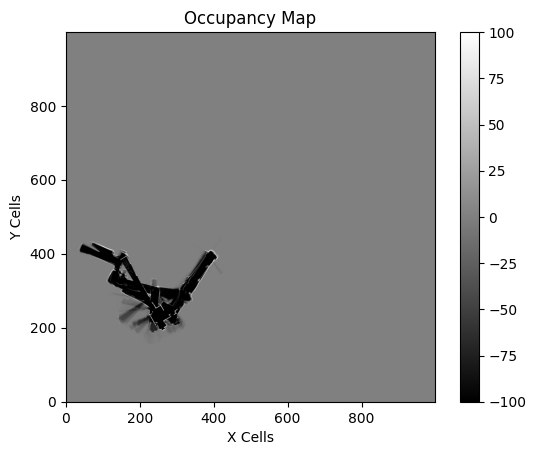

In [48]:
plot_occupancy_map(final_occupancymap_2_odometry_only)

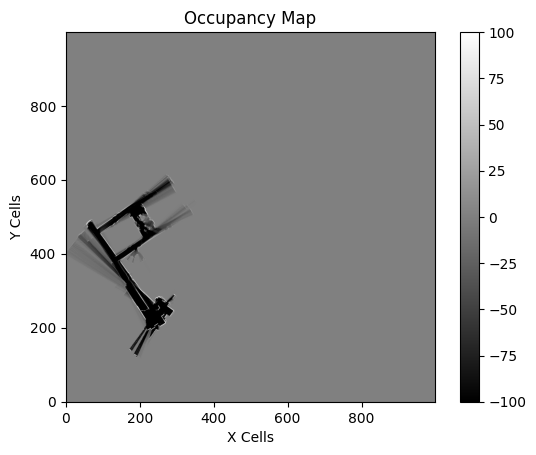

In [49]:
plot_occupancy_map(final_occupancymap_4_odometry_only)

SLAM

In [50]:
def generate_noise_2(num_particles, noise_covariance):
    noise_samples = np.random.multivariate_normal(mean=[0, 0, 0], cov=noise_covariance, size=num_particles)
    return noise_samples.T

In [51]:
# def particle_pose_update_4(x, y, heading, delta_theta, dist,noise_covariance):
#     heading = (heading + delta_theta) % (2 * np.pi)
#     delta_x = dist * np.cos(heading)
#     delta_y = dist * np.sin(heading)
#     x += delta_x
#     y += delta_y
#     intermediate = np.array([x, y, heading])
#     # print('intermediate: {}'.format(intermediate))
#     noise = generate_noise_2(len(heading), noise_covariance)
#     # print('noise {}'.format(noise))
#     noisy_particles = intermediate + noise
#     return noisy_particles[0,:],noisy_particles[1,:],noisy_particles[2,:]

In [52]:
def particle_pose_update_5(x, y, heading, delta_theta, dist, noise_covariance):
    # Add noise to each particle pose
    noise = generate_noise_2(len(heading), noise_covariance)
    # print('noise {}'.format(noise))
    x += dist * np.cos(heading) + noise[0]
    y += dist * np.sin(heading) + noise[1]
    heading = (heading + delta_theta + noise[2]) % (2 * np.pi)
    return x, y, heading

In [53]:
# def particle_pose_update_6(x, y, heading, delta_theta, dist, noise_covariance):
#     heading = (heading + delta_theta) % (2 * np.pi)
#     x += dist * np.cos(heading)
#     y += dist * np.sin(heading)
#     print('x: {}, y: {}, heading: {}'.format(x,y,heading))
#     return x, y, heading

In [54]:
def calculate_endpts_for_particle_2(lidar_angles,lidar_scans,x,y,heading):
    lidar_angles_replicated = np.repeat(lidar_angles.reshape(-1)[np.newaxis, :], len(heading), axis=0)
    lidar_angles_with_heading = lidar_angles_replicated + heading[:,np.newaxis]
    endpts_x = lidar_scans * np.cos(lidar_angles_with_heading) + x[:,np.newaxis]
    endpts_y = lidar_scans * np.sin(lidar_angles_with_heading) + y[:,np.newaxis]
    return endpts_x, endpts_y

In [55]:
from scipy.special import expit

In [56]:
def calculate_correlation(occupancymap,endpts_x_cells_all,endpts_y_cells_all):
  num_particles = endpts_x_cells_all.shape[0]
  sums_of_occupied_cells = np.zeros(num_particles)
  # values_of_occupied_cells = np.zeros(num_particles,num_lidar_scans)

  for i in range(num_particles):
    sums_of_occupied_cells[i] = np.mean(occupancymap[endpts_y_cells_all[i,:].astype(int),endpts_x_cells_all[i,:].astype(int)])
  return expit(sums_of_occupied_cells)
  # return sums_of_occupied_cells

In [57]:
def normalize_weights(weights):
    total_sum = np.sum(weights)
    normalized_weights = weights / total_sum
    return normalized_weights

In [58]:
def calculate_n_eff(weights):
  # print('num {}'.format(np.sum(weights)**2))
  # print('den {}'.format(np.sum(weights**2)))
  n_eff = np.sum(weights)**2/np.sum(weights**2)
  return n_eff

In [59]:
def resample_particles_indices_2(weights):
    indices = np.arange(len(weights))
    cumulative_sum = np.cumsum(weights)
    random_numbers = np.random.uniform(0, 1, len(weights))
    selected_indices = []
    i = 0

    for j in range(len(weights)):
        while cumulative_sum[i] < random_numbers[j]:
            i += 1
        selected_indices.append(i)

    return selected_indices

In [60]:
def lidar_hits_2(FL, FR, RL, RR, ts_enc,encoder_ticks_to_meters,width_between_wheels,tuning_factor,lidar,matched_lidar_indices,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,logoddsocc,logoddsfree,num_particles,num_effective_particles,noise_cov,occmap_min_value, occmap_max_value):

  period = 100
  width_between_wheels *= tuning_factor
  num_lidar_scans = 1081
  occupancymap = np.zeros(init_map_size)

  heading = np.zeros(num_particles)
  x = np.zeros(num_particles)
  y = np.zeros(num_particles)

  # trajectory_x = np.zeros((num_particles,len(ts_enc)))  # Start at origin
  # trajectory_y = np.zeros((num_particles,len(ts_enc)))
  # headings = np.zeros((num_particles,len(ts_enc)))
  # endpts_x_0_all = np.zeros((num_particles,num_lidar_scans,len(ts_enc)))
  # endpts_y_0_all = np.zeros((num_particles,num_lidar_scans,len(ts_enc)))

  # x_cells = np.zeros((num_particles,len(ts_enc)))
  # y_cells = np.zeros((num_particles,len(ts_enc)))
  # endpts_x_0_cells_all = np.zeros((num_particles,num_lidar_scans,len(ts_enc)))
  # endpts_y_0_cells_all = np.zeros((num_particles,num_lidar_scans,len(ts_enc)))

  particle_weights = np.ones(num_particles)/num_particles
  particle_correlations = np.zeros(num_particles)

  # free_map_cells_list = []
  occupancymapslist = []

  for i in range(len(ts_enc)):
    # print('iteration {}'.format(i))

    # common to all particles
    delta_theta, dist = odometry_update(FL[i],RL[i],FR[i],RR[i],encoder_ticks_to_meters,width_between_wheels)
    lidar_data = lidar[matched_lidar_indices[i]]
    lidar_angles = lidar_data['angle']
    lidar_scans = lidar_data['scan']

    x,y,heading = particle_pose_update_5(x,y,heading,delta_theta, dist,noise_cov)

    # calculate endpoints for each particle
    endpts_x_0, endpts_y_0 = calculate_endpts_for_particle_2(lidar_angles, lidar_scans, x, y, heading)

    # convert all particle positions and endpoints to map cells
    x_cell, y_cell, endpts_x_0_cells, endpts_y_0_cells = convert_to_map_cells(x,y,endpts_x_0,endpts_y_0,adjust_x,adjust_y,map_cell_size)

    # calculate particle weights and find best particle
    particle_correlations = calculate_correlation(occupancymap,endpts_x_0_cells,endpts_y_0_cells)
    particle_weights = normalize_weights(particle_correlations)
    k = np.argmax(particle_weights)
    n_eff = calculate_n_eff(particle_weights)
    print('for iteration i {} best particle index is {}, n_eff is {}, weights are {}'.format(i,k,n_eff,particle_weights))

    # # only best particle
    free_map_cells = mu.getMapCellsFromRay(x_cell[k],y_cell[k],endpts_x_0_cells[k,:], endpts_y_0_cells[k,:],maxmap)
    occupancymap[endpts_y_0_cells[k,:].astype(int), endpts_x_0_cells[k,:].astype(int)] += logoddsocc
    occupancymap[free_map_cells[1,:].astype(int),free_map_cells[0,:].astype(int)] += logoddsfree
    occupancymap = np.clip(occupancymap, occmap_min_value, occmap_max_value)

    # storage updates
    # trajectory_x[:,i] = x.T
    # trajectory_y[:,i] = y.T
    # headings[:,i] = heading.T
    # endpts_x_0_all[:,:,i] = endpts_x_0
    # endpts_y_0_all[:,:,i] = endpts_y_0
    # # endpts_y_0_list.append(endpts_y_0)

    # x_cells[:,i] = x_cell.T
    # y_cells[:,i] = y_cell.T
    # endpts_x_0_cells_all[:,:,i] = endpts_x_0_cells
    # endpts_y_0_cells_all[:,:,i] = endpts_y_0_cells

    # free_map_cells_list.append(free_map_cells)

    if n_eff < num_effective_particles:
      # Perform resampling
      indices = resample_particles_indices_2(particle_weights)
      x = x[indices]
      y = y[indices]
      heading = heading[indices]
      particle_weights = np.ones(num_particles) / num_particles  # Reset weights to uniform distribution after resampling
      print('resampling done')

    if i% period == 0:
      occupancymapslist.append(occupancymap.copy())
      plot_occupancy_map(occupancymap)

  occupancymapslist.append(occupancymap.copy())
  plot_occupancy_map(occupancymap)

  # return trajectory_x,trajectory_y, headings, endpts_x_0_all, endpts_y_0_all, x_cells, y_cells, endpts_x_0_cells_all, endpts_y_0_cells_all, free_map_cells_list, occupancymapslist
  return occupancymapslist

In [61]:
var_x = 0.0001
var_y = 0.0001
var_theta = 0.0001
noise_covariance = np.diag([var_x, var_y, var_theta])

In [62]:
# particles data
num_particles = 30
participation_rate = 0.75
n_eff_min = participation_rate * num_particles

iteration 0


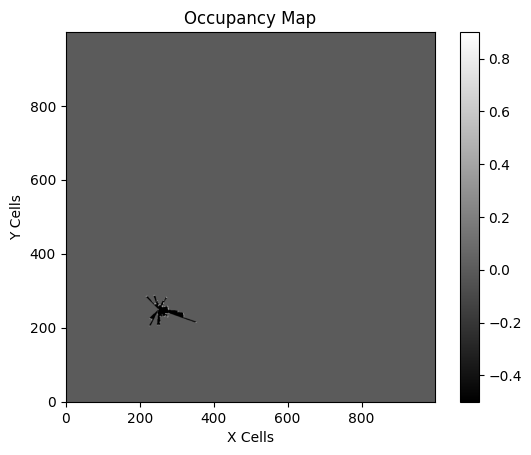

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
resampling done
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
resampling done
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
iteration 75
it

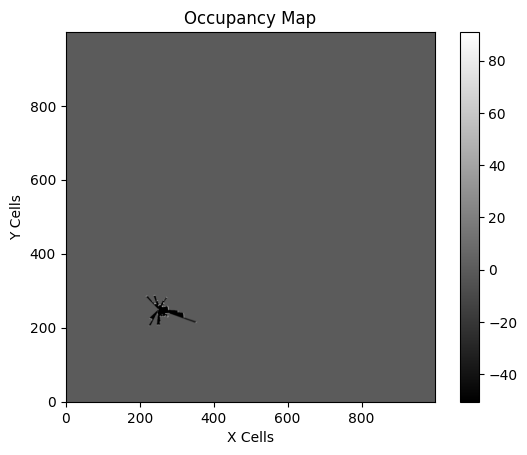

iteration 101
iteration 102
iteration 103
iteration 104
iteration 105
iteration 106
iteration 107
iteration 108
iteration 109
iteration 110
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
resampling done
iteration 116
iteration 117
resampling done
iteration 118
iteration 119
iteration 120
iteration 121
iteration 122
iteration 123
resampling done
iteration 124
resampling done
iteration 125
resampling done
iteration 126
iteration 127
iteration 128
iteration 129
resampling done
iteration 130
iteration 131
iteration 132
iteration 133
iteration 134
resampling done
iteration 135
iteration 136
iteration 137
iteration 138
iteration 139
iteration 140
iteration 141
iteration 142
iteration 143
resampling done
iteration 144
iteration 145
iteration 146
iteration 147
iteration 148
resampling done
iteration 149
iteration 150
iteration 151
iteration 152
iteration 153
iteration 154
iteration 155
iteration 156
iteration 157
iteration 158
iteration 159
iteration 160
iteration 161
it

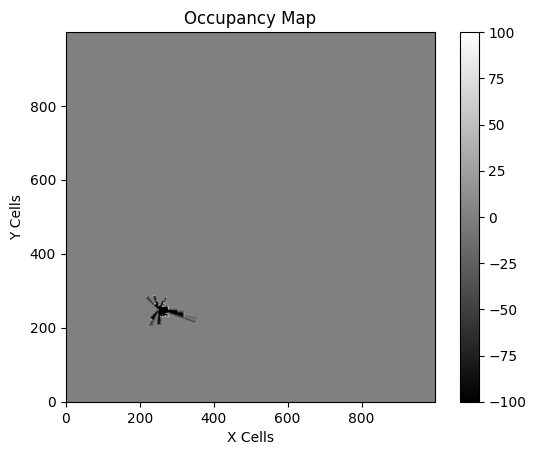

iteration 201
iteration 202
resampling done
iteration 203
iteration 204
iteration 205
iteration 206
iteration 207
iteration 208
iteration 209
iteration 210
iteration 211
iteration 212
iteration 213
iteration 214
iteration 215
iteration 216
iteration 217
iteration 218
iteration 219
iteration 220
iteration 221
iteration 222
iteration 223
iteration 224
iteration 225
iteration 226
iteration 227
iteration 228
iteration 229
resampling done
iteration 230
iteration 231
iteration 232
iteration 233
resampling done
iteration 234
resampling done
iteration 235
resampling done
iteration 236
iteration 237
iteration 238
iteration 239
iteration 240
resampling done
iteration 241
iteration 242
iteration 243
iteration 244
iteration 245
iteration 246
iteration 247
iteration 248
iteration 249
iteration 250
iteration 251
resampling done
iteration 252
iteration 253
iteration 254
iteration 255
iteration 256
iteration 257
iteration 258
iteration 259
iteration 260
resampling done
iteration 261
iteration 262
iter

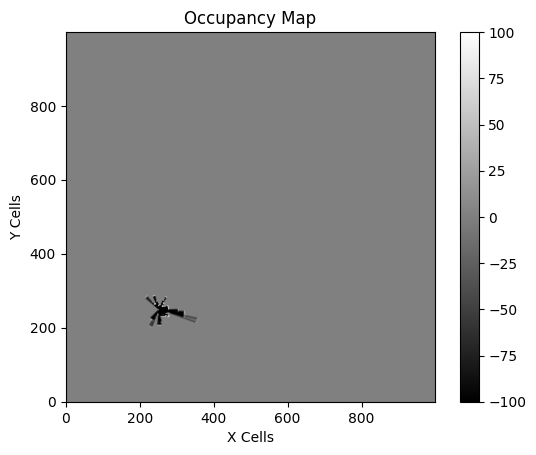

iteration 301
iteration 302
resampling done
iteration 303
iteration 304
iteration 305
iteration 306
iteration 307
iteration 308
iteration 309
iteration 310
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
iteration 317
iteration 318
iteration 319
iteration 320
resampling done
iteration 321
iteration 322
iteration 323
iteration 324
iteration 325
iteration 326
iteration 327
iteration 328
resampling done
iteration 329
iteration 330
iteration 331
iteration 332
iteration 333
iteration 334
iteration 335
iteration 336
iteration 337
iteration 338
iteration 339
resampling done
iteration 340
iteration 341
iteration 342
iteration 343
iteration 344
resampling done
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
iteration 353
iteration 354
iteration 355
resampling done
iteration 356
iteration 357
iteration 358
iteration 359
resampling done
iteration 360
resampling done
iteration 361
iteration 362
iter

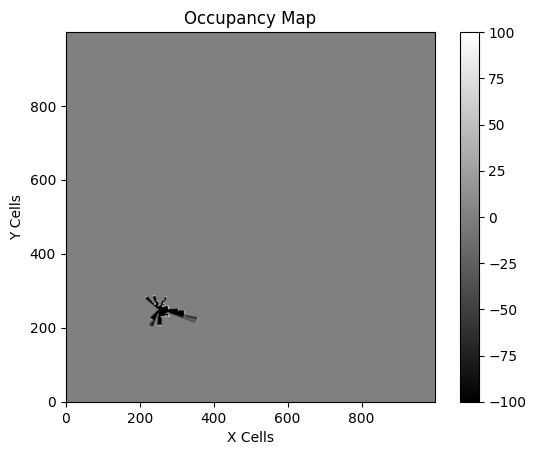

iteration 401
iteration 402
iteration 403
iteration 404
iteration 405
iteration 406
resampling done
iteration 407
iteration 408
iteration 409
iteration 410
iteration 411
iteration 412
iteration 413
iteration 414
iteration 415
iteration 416
resampling done
iteration 417
iteration 418
iteration 419
iteration 420
iteration 421
iteration 422
iteration 423
iteration 424
iteration 425
iteration 426
iteration 427
iteration 428
iteration 429
iteration 430
iteration 431
iteration 432
iteration 433
resampling done
iteration 434
iteration 435
iteration 436
iteration 437
iteration 438
iteration 439
iteration 440
resampling done
iteration 441
iteration 442
iteration 443
iteration 444
iteration 445
iteration 446
iteration 447
iteration 448
iteration 449
iteration 450
resampling done
iteration 451
iteration 452
iteration 453
iteration 454
iteration 455
iteration 456
resampling done
iteration 457
iteration 458
iteration 459
iteration 460
iteration 461
iteration 462
iteration 463
iteration 464
iteratio

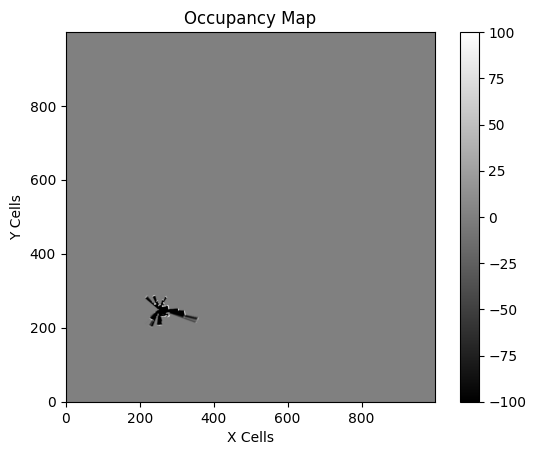

iteration 501
resampling done
iteration 502
iteration 503
iteration 504
iteration 505
iteration 506
iteration 507
iteration 508
iteration 509
iteration 510
iteration 511
resampling done
iteration 512
iteration 513
iteration 514
iteration 515
iteration 516
iteration 517
iteration 518
iteration 519
iteration 520
iteration 521
iteration 522
iteration 523
iteration 524
iteration 525
iteration 526
iteration 527
iteration 528
iteration 529
iteration 530
resampling done
iteration 531
iteration 532
iteration 533
iteration 534
iteration 535
iteration 536
iteration 537
iteration 538
iteration 539
iteration 540
iteration 541
iteration 542
iteration 543
iteration 544
iteration 545
iteration 546
iteration 547
iteration 548
resampling done
iteration 549
iteration 550
iteration 551
iteration 552
iteration 553
resampling done
iteration 554
iteration 555
iteration 556
iteration 557
iteration 558
resampling done
iteration 559
resampling done
iteration 560
iteration 561
iteration 562
iteration 563
resamp

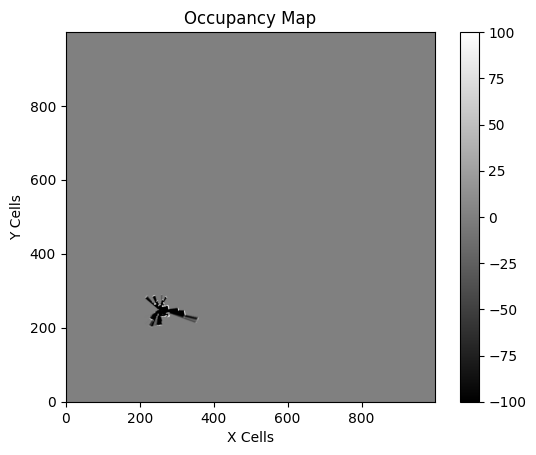

iteration 601
iteration 602
iteration 603
iteration 604
iteration 605
iteration 606
iteration 607
iteration 608
iteration 609
iteration 610
iteration 611
iteration 612
iteration 613
iteration 614
iteration 615
iteration 616
iteration 617
iteration 618
iteration 619
iteration 620
iteration 621
iteration 622
iteration 623
iteration 624
iteration 625
iteration 626
iteration 627
iteration 628
iteration 629
iteration 630
iteration 631
iteration 632
iteration 633
iteration 634
iteration 635
iteration 636
iteration 637
iteration 638
iteration 639
iteration 640
iteration 641
iteration 642
iteration 643
iteration 644
iteration 645
iteration 646
iteration 647
iteration 648
iteration 649
iteration 650
iteration 651
iteration 652
resampling done
iteration 653
iteration 654
iteration 655
iteration 656
iteration 657
iteration 658
iteration 659
iteration 660
iteration 661
iteration 662
iteration 663
iteration 664
iteration 665
iteration 666
iteration 667
iteration 668
iteration 669
resampling done
it

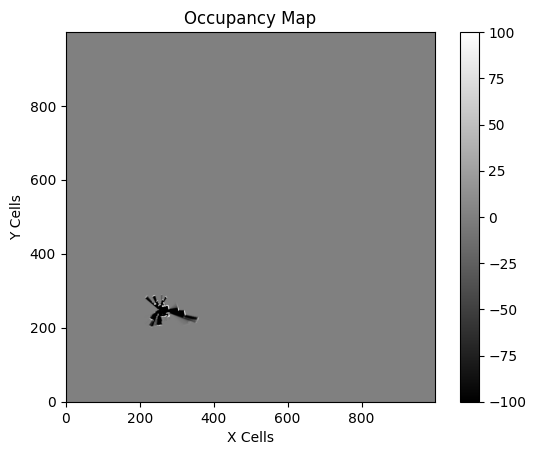

iteration 701
iteration 702
iteration 703
iteration 704
iteration 705
iteration 706
iteration 707
iteration 708
iteration 709
iteration 710
iteration 711
iteration 712
iteration 713
iteration 714
iteration 715
iteration 716
iteration 717
iteration 718
resampling done
iteration 719
iteration 720
iteration 721
iteration 722
iteration 723
iteration 724
iteration 725
iteration 726
iteration 727
iteration 728
iteration 729
iteration 730
iteration 731
iteration 732
iteration 733
iteration 734
iteration 735
iteration 736
iteration 737
iteration 738
iteration 739
iteration 740
iteration 741
iteration 742
iteration 743
iteration 744
iteration 745
iteration 746
iteration 747
resampling done
iteration 748
iteration 749
iteration 750
iteration 751
iteration 752
iteration 753
iteration 754
iteration 755
iteration 756
iteration 757
iteration 758
iteration 759
iteration 760
iteration 761
iteration 762
iteration 763
iteration 764
iteration 765
iteration 766
iteration 767
iteration 768
iteration 769
re

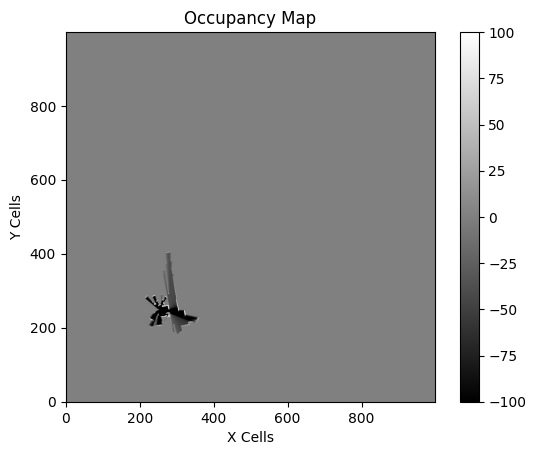

iteration 801
iteration 802
iteration 803
iteration 804
iteration 805
iteration 806
iteration 807
iteration 808
iteration 809
iteration 810
resampling done
iteration 811
iteration 812
iteration 813
resampling done
iteration 814
iteration 815
iteration 816
resampling done
iteration 817
iteration 818
iteration 819
iteration 820
iteration 821
iteration 822
iteration 823
resampling done
iteration 824
iteration 825
iteration 826
iteration 827
iteration 828
iteration 829
iteration 830
iteration 831
resampling done
iteration 832
iteration 833
iteration 834
iteration 835
iteration 836
iteration 837
iteration 838
iteration 839
iteration 840
iteration 841
iteration 842
iteration 843
resampling done
iteration 844
iteration 845
iteration 846
iteration 847
iteration 848
iteration 849
iteration 850
iteration 851
iteration 852
resampling done
iteration 853
iteration 854
iteration 855
resampling done
iteration 856
iteration 857
iteration 858
iteration 859
iteration 860
iteration 861
resampling done
it

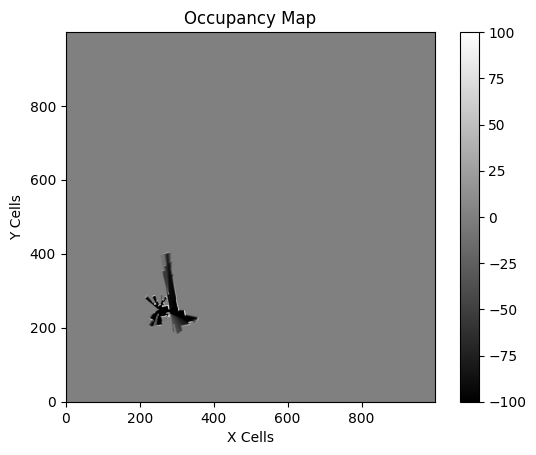

iteration 901
iteration 902
iteration 903
resampling done
iteration 904
resampling done
iteration 905
iteration 906
iteration 907
iteration 908
iteration 909
iteration 910
iteration 911
iteration 912
iteration 913
iteration 914
iteration 915
resampling done
iteration 916
iteration 917
iteration 918
iteration 919
resampling done
iteration 920
iteration 921
iteration 922
iteration 923
iteration 924
iteration 925
iteration 926
iteration 927
iteration 928
iteration 929
iteration 930
iteration 931
iteration 932
resampling done
iteration 933
iteration 934
iteration 935
iteration 936
iteration 937
iteration 938
iteration 939
iteration 940
iteration 941
iteration 942
iteration 943
resampling done
iteration 944
iteration 945
iteration 946
iteration 947
iteration 948
iteration 949
iteration 950
iteration 951
iteration 952
iteration 953
iteration 954
iteration 955
iteration 956
iteration 957
iteration 958
iteration 959
iteration 960
resampling done
iteration 961
iteration 962
iteration 963
iterat

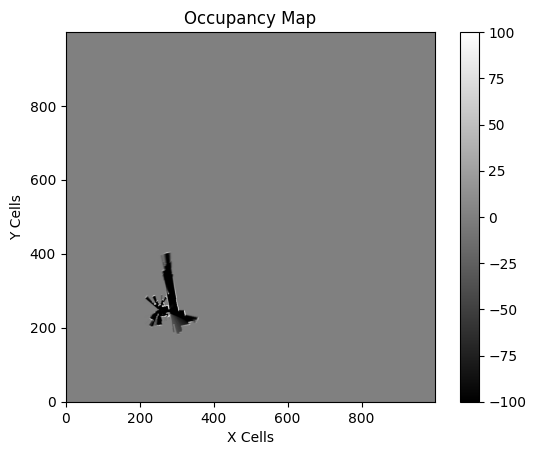

iteration 1001
resampling done
iteration 1002
iteration 1003
iteration 1004
resampling done
iteration 1005
resampling done
iteration 1006
resampling done
iteration 1007
resampling done
iteration 1008
resampling done
iteration 1009
iteration 1010
iteration 1011
resampling done
iteration 1012
resampling done
iteration 1013
iteration 1014
iteration 1015
resampling done
iteration 1016
resampling done
iteration 1017
resampling done
iteration 1018
resampling done
iteration 1019
resampling done
iteration 1020
iteration 1021
resampling done
iteration 1022
iteration 1023
iteration 1024
resampling done
iteration 1025
iteration 1026
iteration 1027
resampling done
iteration 1028
resampling done
iteration 1029
resampling done
iteration 1030
resampling done
iteration 1031
iteration 1032
iteration 1033
iteration 1034
iteration 1035
resampling done
iteration 1036
iteration 1037
iteration 1038
iteration 1039
resampling done
iteration 1040
iteration 1041
iteration 1042
iteration 1043
iteration 1044
iter

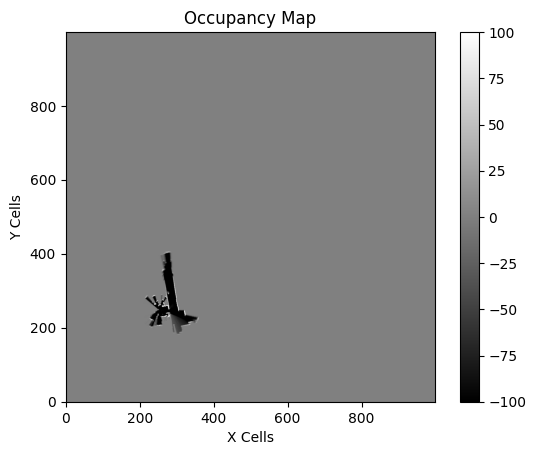

iteration 1101
resampling done
iteration 1102
resampling done
iteration 1103
resampling done
iteration 1104
iteration 1105
resampling done
iteration 1106
iteration 1107
resampling done
iteration 1108
resampling done
iteration 1109
iteration 1110
iteration 1111
resampling done
iteration 1112
iteration 1113
resampling done
iteration 1114
iteration 1115
resampling done
iteration 1116
resampling done
iteration 1117
resampling done
iteration 1118
resampling done
iteration 1119
iteration 1120
resampling done
iteration 1121
iteration 1122
iteration 1123
resampling done
iteration 1124
iteration 1125
iteration 1126
iteration 1127
iteration 1128
resampling done
iteration 1129
resampling done
iteration 1130
resampling done
iteration 1131
resampling done
iteration 1132
iteration 1133
iteration 1134
resampling done
iteration 1135
iteration 1136
resampling done
iteration 1137
resampling done
iteration 1138
resampling done
iteration 1139
iteration 1140
resampling done
iteration 1141
resampling done
i

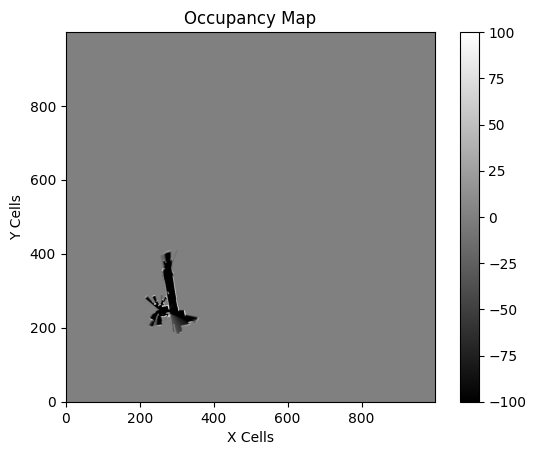

iteration 1201
iteration 1202
iteration 1203
iteration 1204
resampling done
iteration 1205
resampling done
iteration 1206
iteration 1207
iteration 1208
iteration 1209
iteration 1210
resampling done
iteration 1211
iteration 1212
iteration 1213
resampling done
iteration 1214
iteration 1215
iteration 1216
iteration 1217
iteration 1218
resampling done
iteration 1219
iteration 1220
iteration 1221
iteration 1222
iteration 1223
iteration 1224
iteration 1225
iteration 1226
iteration 1227
iteration 1228
iteration 1229
iteration 1230
resampling done
iteration 1231
iteration 1232
iteration 1233
iteration 1234
iteration 1235
iteration 1236
iteration 1237
iteration 1238
iteration 1239
iteration 1240
iteration 1241
resampling done
iteration 1242
iteration 1243
iteration 1244
iteration 1245
iteration 1246
iteration 1247
iteration 1248
iteration 1249
resampling done
iteration 1250
iteration 1251
iteration 1252
iteration 1253
resampling done
iteration 1254
resampling done
iteration 1255
resampling done

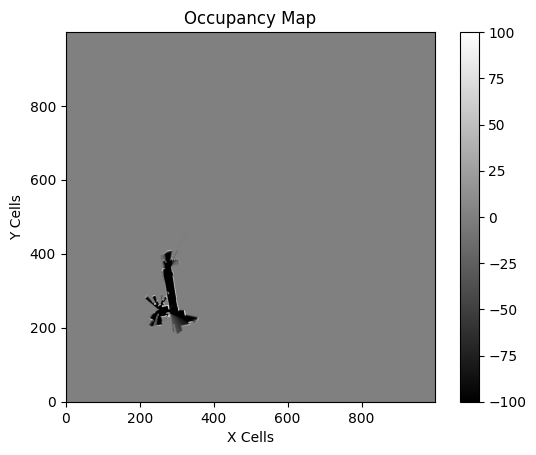

iteration 1301
resampling done
iteration 1302
iteration 1303
resampling done
iteration 1304
iteration 1305
resampling done
iteration 1306
resampling done
iteration 1307
resampling done
iteration 1308
resampling done
iteration 1309
resampling done
iteration 1310
resampling done
iteration 1311
resampling done
iteration 1312
resampling done
iteration 1313
resampling done
iteration 1314
iteration 1315
iteration 1316
resampling done
iteration 1317
iteration 1318
resampling done
iteration 1319
resampling done
iteration 1320
resampling done
iteration 1321
iteration 1322
iteration 1323
iteration 1324
resampling done
iteration 1325
resampling done
iteration 1326
resampling done
iteration 1327
iteration 1328
iteration 1329
iteration 1330
iteration 1331
iteration 1332
resampling done
iteration 1333
resampling done
iteration 1334
iteration 1335
iteration 1336
iteration 1337
resampling done
iteration 1338
iteration 1339
iteration 1340
iteration 1341
resampling done
iteration 1342
iteration 1343
ite

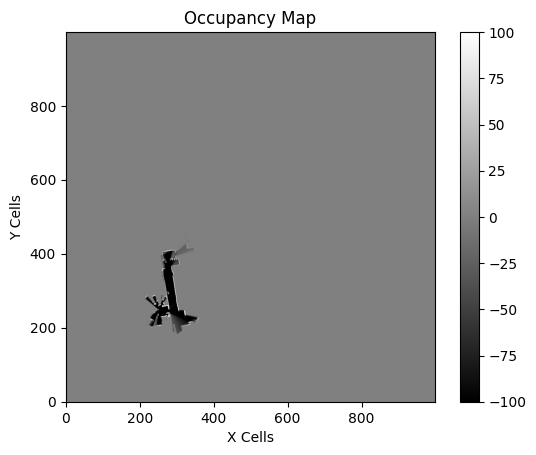

iteration 1401
iteration 1402
iteration 1403
iteration 1404
iteration 1405
iteration 1406
iteration 1407
iteration 1408
iteration 1409
iteration 1410
iteration 1411
iteration 1412
iteration 1413
iteration 1414
iteration 1415
iteration 1416
iteration 1417
iteration 1418
iteration 1419
iteration 1420
iteration 1421
iteration 1422
iteration 1423
iteration 1424
iteration 1425
iteration 1426
iteration 1427
iteration 1428
resampling done
iteration 1429
iteration 1430
iteration 1431
iteration 1432
iteration 1433
iteration 1434
iteration 1435
iteration 1436
iteration 1437
iteration 1438
iteration 1439
iteration 1440
iteration 1441
iteration 1442
iteration 1443
resampling done
iteration 1444
iteration 1445
iteration 1446
iteration 1447
iteration 1448
iteration 1449
resampling done
iteration 1450
iteration 1451
iteration 1452
iteration 1453
iteration 1454
iteration 1455
resampling done
iteration 1456
iteration 1457
iteration 1458
iteration 1459
iteration 1460
iteration 1461
resampling done
itera

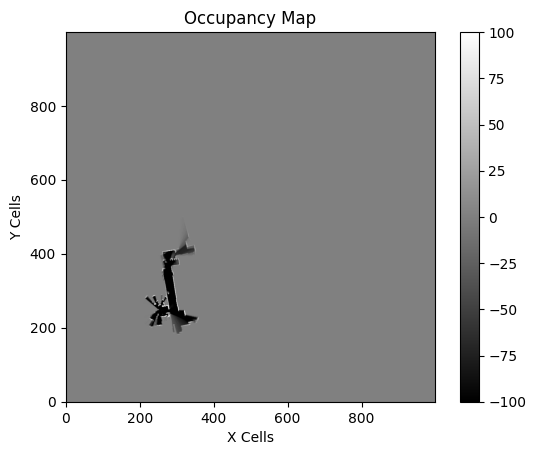

iteration 1501
iteration 1502
iteration 1503
iteration 1504
iteration 1505
resampling done
iteration 1506
iteration 1507
iteration 1508
resampling done
iteration 1509
resampling done
iteration 1510
resampling done
iteration 1511
resampling done
iteration 1512
resampling done
iteration 1513
iteration 1514
resampling done
iteration 1515
iteration 1516
resampling done
iteration 1517
resampling done
iteration 1518
iteration 1519
iteration 1520
iteration 1521
resampling done
iteration 1522
iteration 1523
iteration 1524
iteration 1525
iteration 1526
iteration 1527
iteration 1528
iteration 1529
iteration 1530
resampling done
iteration 1531
resampling done
iteration 1532
resampling done
iteration 1533
iteration 1534
resampling done
iteration 1535
iteration 1536
iteration 1537
iteration 1538
resampling done
iteration 1539
iteration 1540
iteration 1541
iteration 1542
iteration 1543
resampling done
iteration 1544
iteration 1545
iteration 1546
iteration 1547
iteration 1548
iteration 1549
iteration

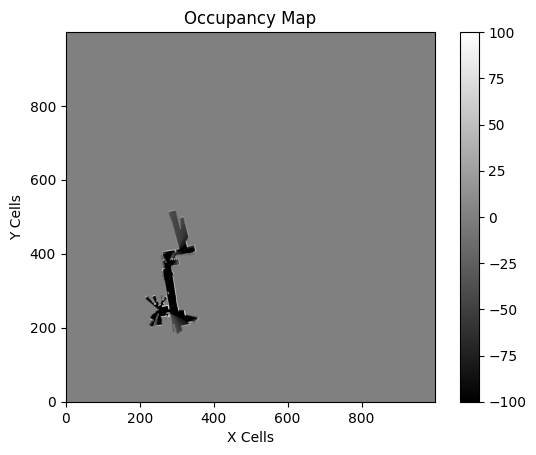

iteration 1601
iteration 1602
iteration 1603
iteration 1604
iteration 1605
iteration 1606
iteration 1607
iteration 1608
iteration 1609
resampling done
iteration 1610
iteration 1611
iteration 1612
iteration 1613
iteration 1614
iteration 1615
iteration 1616
iteration 1617
iteration 1618
iteration 1619
iteration 1620
iteration 1621
resampling done
iteration 1622
iteration 1623
iteration 1624
iteration 1625
iteration 1626
iteration 1627
iteration 1628
resampling done
iteration 1629
resampling done
iteration 1630
iteration 1631
iteration 1632
resampling done
iteration 1633
iteration 1634
iteration 1635
iteration 1636
resampling done
iteration 1637
iteration 1638
iteration 1639
iteration 1640
resampling done
iteration 1641
iteration 1642
iteration 1643
iteration 1644
iteration 1645
resampling done
iteration 1646
resampling done
iteration 1647
iteration 1648
iteration 1649
resampling done
iteration 1650
resampling done
iteration 1651
iteration 1652
iteration 1653
resampling done
iteration 165

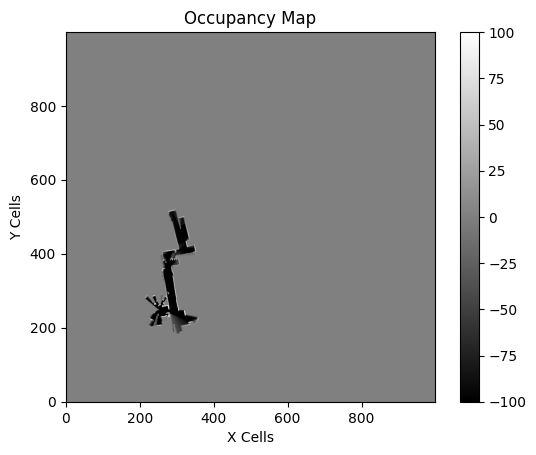

iteration 1701
iteration 1702
iteration 1703
iteration 1704
iteration 1705
resampling done
iteration 1706
iteration 1707
iteration 1708
iteration 1709
iteration 1710
iteration 1711
iteration 1712
iteration 1713
iteration 1714
iteration 1715
resampling done
iteration 1716
iteration 1717
iteration 1718
resampling done
iteration 1719
resampling done
iteration 1720
resampling done
iteration 1721
resampling done
iteration 1722
iteration 1723
iteration 1724
resampling done
iteration 1725
resampling done
iteration 1726
resampling done
iteration 1727
resampling done
iteration 1728
resampling done
iteration 1729
resampling done
iteration 1730
resampling done
iteration 1731
iteration 1732
resampling done
iteration 1733
resampling done
iteration 1734
resampling done
iteration 1735
resampling done
iteration 1736
resampling done
iteration 1737
iteration 1738
resampling done
iteration 1739
resampling done
iteration 1740
iteration 1741
resampling done
iteration 1742
resampling done
iteration 1743
res

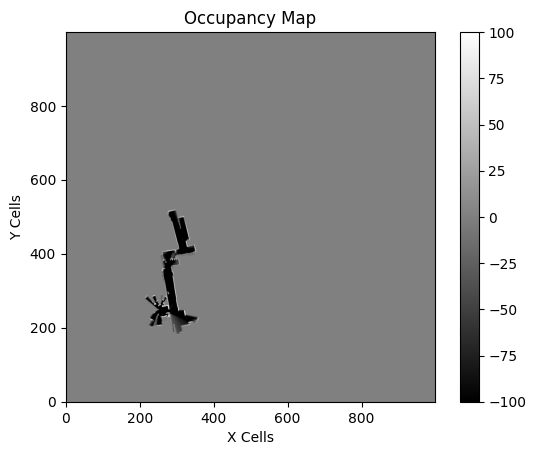

iteration 1801
resampling done
iteration 1802
iteration 1803
iteration 1804
resampling done
iteration 1805
iteration 1806
resampling done
iteration 1807
iteration 1808
iteration 1809
resampling done
iteration 1810
iteration 1811
iteration 1812
iteration 1813
iteration 1814
iteration 1815
iteration 1816
iteration 1817
resampling done
iteration 1818
iteration 1819
iteration 1820
iteration 1821
iteration 1822
iteration 1823
iteration 1824
resampling done
iteration 1825
iteration 1826
iteration 1827
iteration 1828
iteration 1829
iteration 1830
iteration 1831
iteration 1832
resampling done
iteration 1833
iteration 1834
iteration 1835
iteration 1836
iteration 1837
iteration 1838
resampling done
iteration 1839
iteration 1840
iteration 1841
iteration 1842
iteration 1843
iteration 1844
iteration 1845
iteration 1846
iteration 1847
iteration 1848
iteration 1849
iteration 1850
iteration 1851
iteration 1852
iteration 1853
iteration 1854
iteration 1855
iteration 1856
iteration 1857
resampling done
i

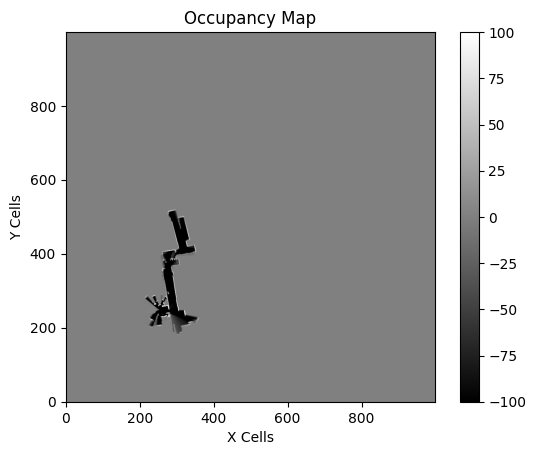

iteration 1901
resampling done
iteration 1902
iteration 1903
resampling done
iteration 1904
resampling done
iteration 1905
iteration 1906
resampling done
iteration 1907
resampling done
iteration 1908
resampling done
iteration 1909
resampling done
iteration 1910
resampling done
iteration 1911
iteration 1912
resampling done
iteration 1913
resampling done
iteration 1914
resampling done
iteration 1915
resampling done
iteration 1916
iteration 1917
iteration 1918
iteration 1919
resampling done
iteration 1920
iteration 1921
resampling done
iteration 1922
iteration 1923
resampling done
iteration 1924
iteration 1925
resampling done
iteration 1926
iteration 1927
resampling done
iteration 1928
resampling done
iteration 1929
resampling done
iteration 1930
iteration 1931
resampling done
iteration 1932
resampling done
iteration 1933
iteration 1934
resampling done
iteration 1935
resampling done
iteration 1936
resampling done
iteration 1937
iteration 1938
resampling done
iteration 1939
iteration 1940


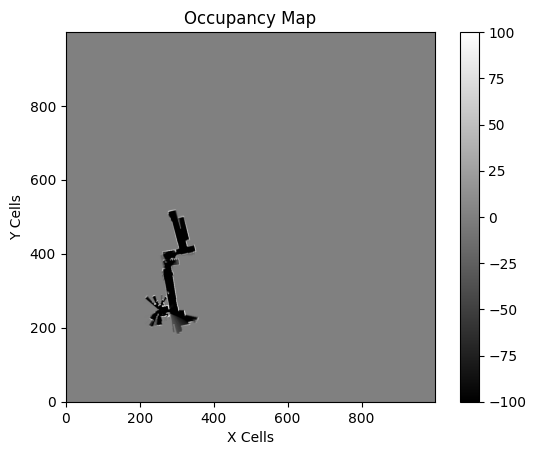

iteration 2001
iteration 2002
iteration 2003
resampling done
iteration 2004
iteration 2005
iteration 2006
iteration 2007
iteration 2008
iteration 2009
iteration 2010
iteration 2011
iteration 2012
iteration 2013
iteration 2014
resampling done
iteration 2015
iteration 2016
iteration 2017
iteration 2018
iteration 2019
resampling done
iteration 2020
iteration 2021
iteration 2022
iteration 2023
iteration 2024
iteration 2025
resampling done
iteration 2026
resampling done
iteration 2027
resampling done
iteration 2028
iteration 2029
resampling done
iteration 2030
iteration 2031
resampling done
iteration 2032
iteration 2033
resampling done
iteration 2034
iteration 2035
iteration 2036
iteration 2037
resampling done
iteration 2038
iteration 2039
iteration 2040
iteration 2041
resampling done
iteration 2042
iteration 2043
iteration 2044
iteration 2045
iteration 2046
iteration 2047
iteration 2048
iteration 2049
resampling done
iteration 2050
iteration 2051
iteration 2052
resampling done
iteration 20

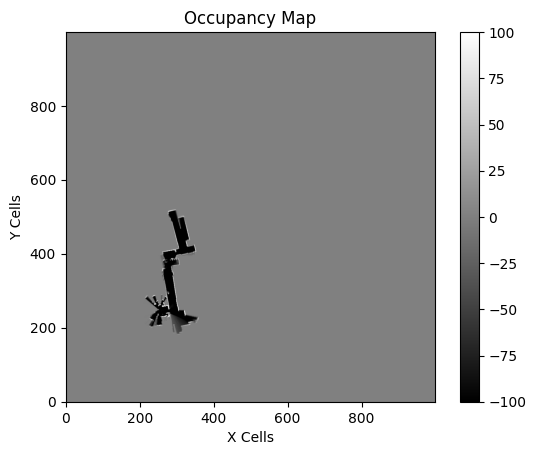

iteration 2101
resampling done
iteration 2102
iteration 2103
resampling done
iteration 2104
iteration 2105
iteration 2106
resampling done
iteration 2107
resampling done
iteration 2108
resampling done
iteration 2109
iteration 2110
resampling done
iteration 2111
resampling done
iteration 2112
resampling done
iteration 2113
iteration 2114
resampling done
iteration 2115
iteration 2116
resampling done
iteration 2117
resampling done
iteration 2118
resampling done
iteration 2119
resampling done
iteration 2120
resampling done
iteration 2121
iteration 2122
resampling done
iteration 2123
iteration 2124
resampling done
iteration 2125
resampling done
iteration 2126
resampling done
iteration 2127
resampling done
iteration 2128
resampling done
iteration 2129
resampling done
iteration 2130
resampling done
iteration 2131
resampling done
iteration 2132
resampling done
iteration 2133
resampling done
iteration 2134
resampling done
iteration 2135
resampling done
iteration 2136
resampling done
iteration 21

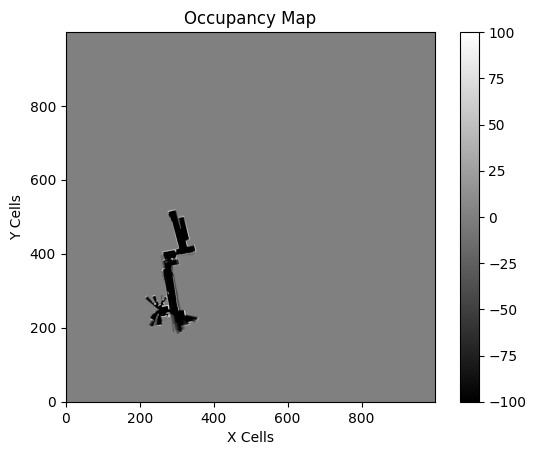

iteration 2201
resampling done
iteration 2202
resampling done
iteration 2203
resampling done
iteration 2204
resampling done
iteration 2205
resampling done
iteration 2206
resampling done
iteration 2207
resampling done
iteration 2208
resampling done
iteration 2209
resampling done
iteration 2210
resampling done
iteration 2211
resampling done
iteration 2212
resampling done
iteration 2213
resampling done
iteration 2214
resampling done
iteration 2215
resampling done
iteration 2216
resampling done
iteration 2217
resampling done
iteration 2218
resampling done
iteration 2219
resampling done
iteration 2220
resampling done
iteration 2221
resampling done
iteration 2222
resampling done
iteration 2223
resampling done
iteration 2224
resampling done
iteration 2225
resampling done
iteration 2226
resampling done
iteration 2227
resampling done
iteration 2228
resampling done
iteration 2229
resampling done
iteration 2230
resampling done
iteration 2231
resampling done
iteration 2232
resampling done
iteratio

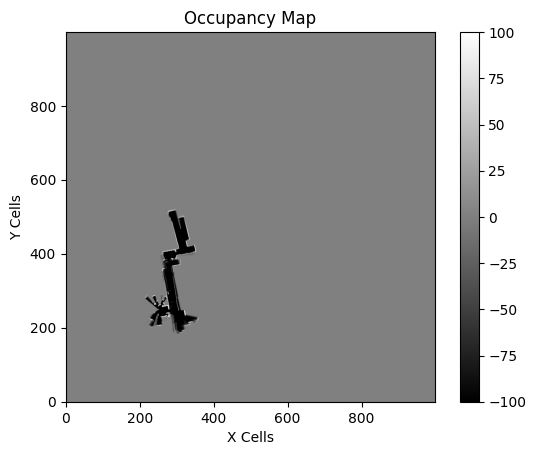

iteration 2301
resampling done
iteration 2302
resampling done
iteration 2303
resampling done
iteration 2304
resampling done
iteration 2305
resampling done
iteration 2306
resampling done
iteration 2307
resampling done
iteration 2308
resampling done
iteration 2309
resampling done
iteration 2310
resampling done
iteration 2311
resampling done
iteration 2312
resampling done
iteration 2313
resampling done
iteration 2314
resampling done
iteration 2315
resampling done
iteration 2316
resampling done
iteration 2317
resampling done
iteration 2318
resampling done
iteration 2319
resampling done
iteration 2320
resampling done
iteration 2321
resampling done
iteration 2322
resampling done
iteration 2323
resampling done
iteration 2324
resampling done
iteration 2325
resampling done
iteration 2326
resampling done
iteration 2327
resampling done
iteration 2328
resampling done
iteration 2329
resampling done
iteration 2330
resampling done
iteration 2331
resampling done
iteration 2332
resampling done
iteratio

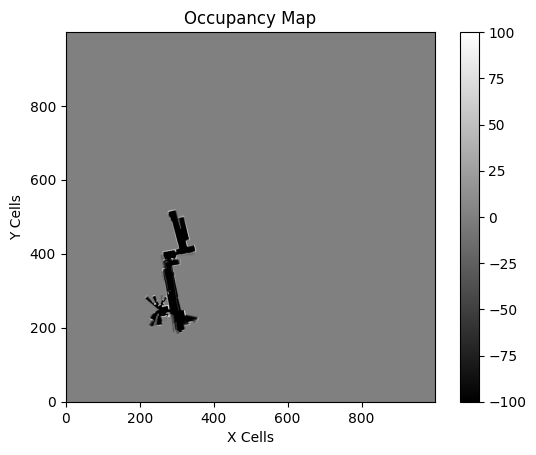

iteration 2401
resampling done
iteration 2402
resampling done
iteration 2403
resampling done
iteration 2404
resampling done
iteration 2405
resampling done
iteration 2406
resampling done
iteration 2407
resampling done
iteration 2408
resampling done
iteration 2409
resampling done
iteration 2410
resampling done
iteration 2411
resampling done
iteration 2412
resampling done
iteration 2413
iteration 2414
resampling done
iteration 2415
resampling done
iteration 2416
resampling done
iteration 2417
resampling done
iteration 2418
resampling done
iteration 2419
resampling done
iteration 2420
iteration 2421
resampling done
iteration 2422
resampling done
iteration 2423
resampling done
iteration 2424
iteration 2425
resampling done
iteration 2426
iteration 2427
resampling done
iteration 2428
iteration 2429
resampling done
iteration 2430
iteration 2431
resampling done
iteration 2432
resampling done
iteration 2433
resampling done
iteration 2434
resampling done
iteration 2435
iteration 2436
resampling d

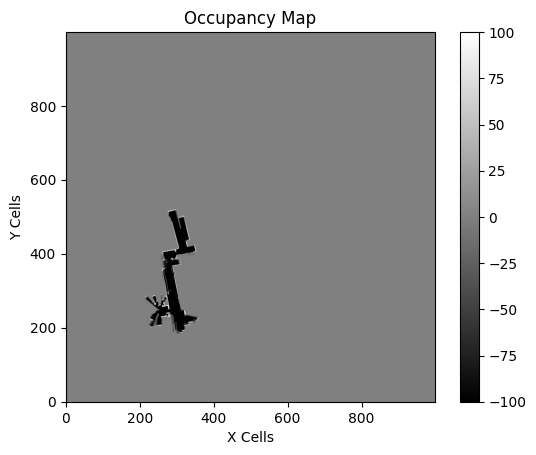

iteration 2501
resampling done
iteration 2502
resampling done
iteration 2503
resampling done
iteration 2504
iteration 2505
resampling done
iteration 2506
resampling done
iteration 2507
resampling done
iteration 2508
resampling done
iteration 2509
iteration 2510
resampling done
iteration 2511
iteration 2512
resampling done
iteration 2513
iteration 2514
resampling done
iteration 2515
resampling done
iteration 2516
resampling done
iteration 2517
resampling done
iteration 2518
resampling done
iteration 2519
resampling done
iteration 2520
resampling done
iteration 2521
resampling done
iteration 2522
resampling done
iteration 2523
resampling done
iteration 2524
resampling done
iteration 2525
resampling done
iteration 2526
resampling done
iteration 2527
resampling done
iteration 2528
resampling done
iteration 2529
resampling done
iteration 2530
resampling done
iteration 2531
resampling done
iteration 2532
resampling done
iteration 2533
resampling done
iteration 2534
resampling done
iteration 

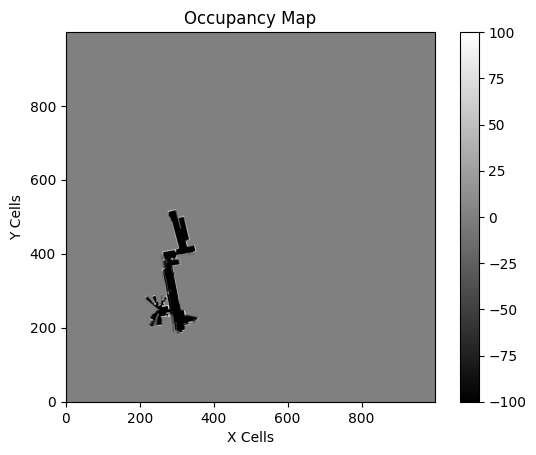

iteration 2601
resampling done
iteration 2602
resampling done
iteration 2603
resampling done
iteration 2604
resampling done
iteration 2605
resampling done
iteration 2606
resampling done
iteration 2607
resampling done
iteration 2608
resampling done
iteration 2609
resampling done
iteration 2610
resampling done
iteration 2611
resampling done
iteration 2612
resampling done
iteration 2613
resampling done
iteration 2614
resampling done
iteration 2615
resampling done
iteration 2616
resampling done
iteration 2617
resampling done
iteration 2618
resampling done
iteration 2619
resampling done
iteration 2620
resampling done
iteration 2621
resampling done
iteration 2622
resampling done
iteration 2623
resampling done
iteration 2624
resampling done
iteration 2625
resampling done
iteration 2626
resampling done
iteration 2627
resampling done
iteration 2628
resampling done
iteration 2629
resampling done
iteration 2630
resampling done
iteration 2631
resampling done
iteration 2632
resampling done
iteratio

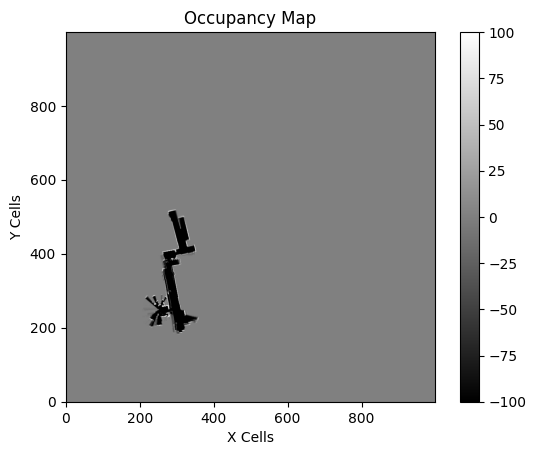

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
resampling done
iteration 2704
resampling done
iteration 2705
iteration 2706
iteration 2707
resampling done
iteration 2708
iteration 2709
iteration 2710
resampling done
iteration 2711
iteration 2712
resampling done
iteration 2713
iteration 2714
resampling done
iteration 2715
iteration 2716
iteration 2717
iteration 2718
resampling done
iteration 2719
iteration 2720
resampling done
iteration 2721
resampling done
iteration 2722
resampling done
iteration 2723
resampling done
iteration 2724
resampling done
iteration 2725
resampling done
iteration 2726
resampling done
iteration 2727
resampling done
iteration 2728
resampling done
iteration 2729
iteration 2730
resampling done
iteration 2731
iteration 2732
iteration 2733
resampling done
iteration 2734
resampling done
iteration 2735
resampling done
iteration 2736
resampling done
iteration 2737
iteration 2738
iteration 2739
resampling done
iteration 2740
resampling done


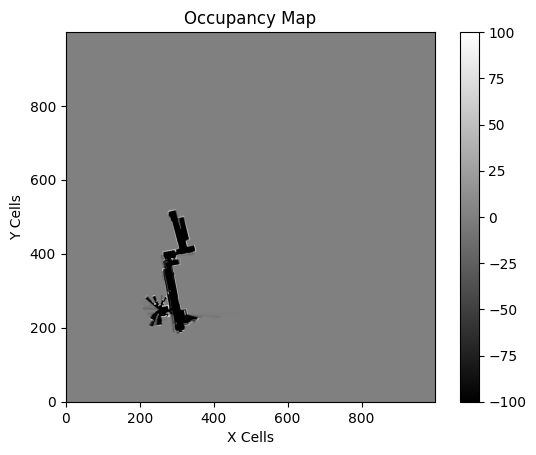

iteration 2801
iteration 2802
iteration 2803
iteration 2804
iteration 2805
iteration 2806
iteration 2807
iteration 2808
iteration 2809
iteration 2810
iteration 2811
resampling done
iteration 2812
iteration 2813
resampling done
iteration 2814
iteration 2815
iteration 2816
resampling done
iteration 2817
iteration 2818
iteration 2819
iteration 2820
resampling done
iteration 2821
iteration 2822
resampling done
iteration 2823
iteration 2824
resampling done
iteration 2825
iteration 2826
iteration 2827
resampling done
iteration 2828
iteration 2829
iteration 2830
resampling done
iteration 2831
resampling done
iteration 2832
iteration 2833
iteration 2834
resampling done
iteration 2835
iteration 2836
resampling done
iteration 2837
resampling done
iteration 2838
iteration 2839
resampling done
iteration 2840
resampling done
iteration 2841
resampling done
iteration 2842
iteration 2843
iteration 2844
resampling done
iteration 2845
iteration 2846
resampling done
iteration 2847
resampling done
iterati

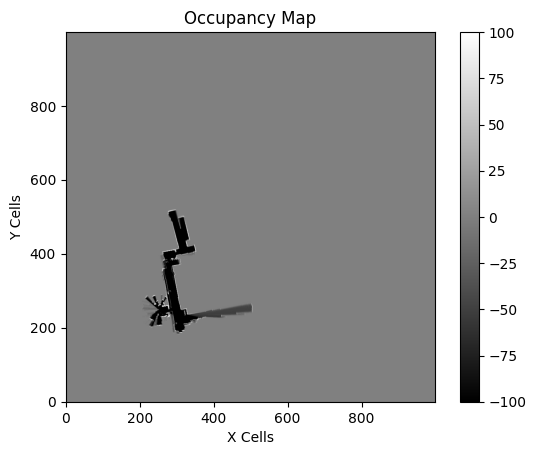

iteration 2901
iteration 2902
iteration 2903
iteration 2904
resampling done
iteration 2905
iteration 2906
iteration 2907
iteration 2908
iteration 2909
iteration 2910
iteration 2911
iteration 2912
iteration 2913
resampling done
iteration 2914
iteration 2915
iteration 2916
iteration 2917
iteration 2918
iteration 2919
iteration 2920
iteration 2921
iteration 2922
iteration 2923
iteration 2924
iteration 2925
iteration 2926
iteration 2927
iteration 2928
resampling done
iteration 2929
iteration 2930
iteration 2931
iteration 2932
iteration 2933
iteration 2934
iteration 2935
iteration 2936
iteration 2937
iteration 2938
iteration 2939
iteration 2940
iteration 2941
iteration 2942
iteration 2943
iteration 2944
iteration 2945
iteration 2946
iteration 2947
iteration 2948
iteration 2949
iteration 2950
resampling done
iteration 2951
iteration 2952
iteration 2953
iteration 2954
iteration 2955
iteration 2956
iteration 2957
iteration 2958
iteration 2959
resampling done
iteration 2960
resampling done
iter

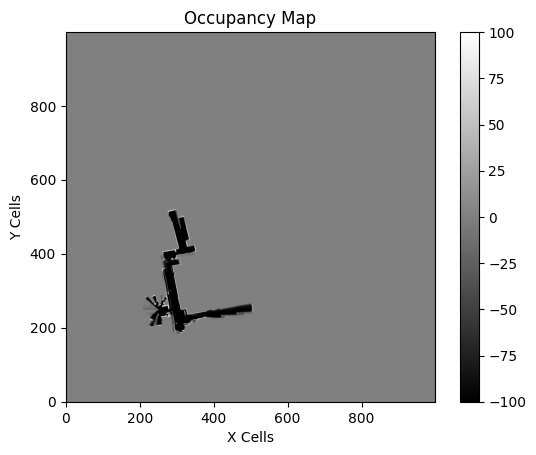

iteration 3001
iteration 3002
resampling done
iteration 3003
iteration 3004
iteration 3005
iteration 3006
iteration 3007
iteration 3008
iteration 3009
iteration 3010
resampling done
iteration 3011
iteration 3012
iteration 3013
iteration 3014
iteration 3015
iteration 3016
iteration 3017
resampling done
iteration 3018
iteration 3019
iteration 3020
iteration 3021
iteration 3022
iteration 3023
iteration 3024
resampling done
iteration 3025
iteration 3026
iteration 3027
iteration 3028
iteration 3029
resampling done
iteration 3030
iteration 3031
iteration 3032
resampling done
iteration 3033
iteration 3034
iteration 3035
iteration 3036
resampling done
iteration 3037
resampling done
iteration 3038
resampling done
iteration 3039
iteration 3040
resampling done
iteration 3041
iteration 3042
resampling done
iteration 3043
iteration 3044
iteration 3045
resampling done
iteration 3046
iteration 3047
iteration 3048
resampling done
iteration 3049
iteration 3050
iteration 3051
resampling done
iteration 3

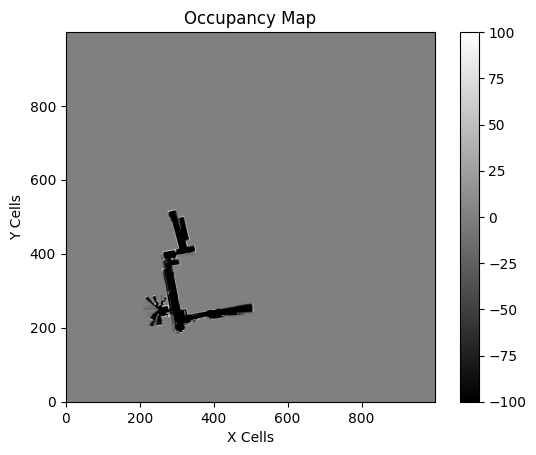

iteration 3101
iteration 3102
resampling done
iteration 3103
iteration 3104
iteration 3105
iteration 3106
iteration 3107
iteration 3108
iteration 3109
iteration 3110
resampling done
iteration 3111
resampling done
iteration 3112
resampling done
iteration 3113
resampling done
iteration 3114
iteration 3115
iteration 3116
iteration 3117
resampling done
iteration 3118
iteration 3119
iteration 3120
iteration 3121
iteration 3122
iteration 3123
iteration 3124
resampling done
iteration 3125
iteration 3126
iteration 3127
resampling done
iteration 3128
iteration 3129
iteration 3130
iteration 3131
iteration 3132
iteration 3133
resampling done
iteration 3134
iteration 3135
iteration 3136
iteration 3137
iteration 3138
iteration 3139
iteration 3140
iteration 3141
resampling done
iteration 3142
iteration 3143
iteration 3144
iteration 3145
iteration 3146
iteration 3147
iteration 3148
iteration 3149
resampling done
iteration 3150
iteration 3151
iteration 3152
iteration 3153
iteration 3154
iteration 3155

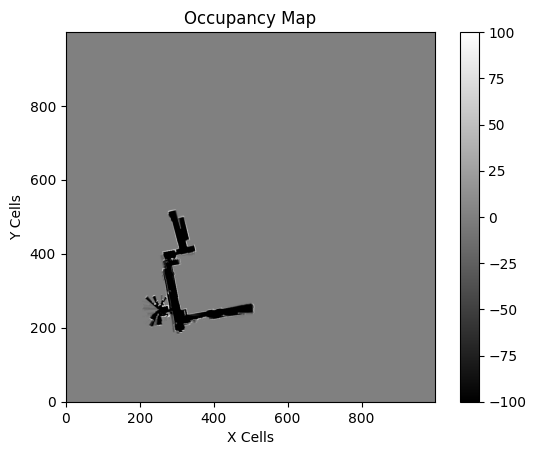

iteration 3201
iteration 3202
resampling done
iteration 3203
iteration 3204
iteration 3205
resampling done
iteration 3206
iteration 3207
iteration 3208
iteration 3209
iteration 3210
iteration 3211
resampling done
iteration 3212
resampling done
iteration 3213
iteration 3214
iteration 3215
iteration 3216
iteration 3217
iteration 3218
resampling done
iteration 3219
iteration 3220
iteration 3221
resampling done
iteration 3222
iteration 3223
iteration 3224
resampling done
iteration 3225
iteration 3226
iteration 3227
resampling done
iteration 3228
iteration 3229
iteration 3230
resampling done
iteration 3231
resampling done
iteration 3232
resampling done
iteration 3233
iteration 3234
iteration 3235
iteration 3236
resampling done
iteration 3237
resampling done
iteration 3238
resampling done
iteration 3239
resampling done
iteration 3240
resampling done
iteration 3241
resampling done
iteration 3242
iteration 3243
iteration 3244
iteration 3245
iteration 3246
resampling done
iteration 3247
iterati

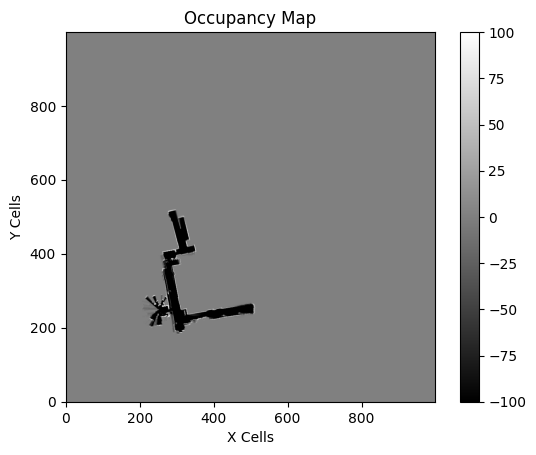

iteration 3301
resampling done
iteration 3302
resampling done
iteration 3303
resampling done
iteration 3304
resampling done
iteration 3305
resampling done
iteration 3306
resampling done
iteration 3307
resampling done
iteration 3308
resampling done
iteration 3309
resampling done
iteration 3310
resampling done
iteration 3311
resampling done
iteration 3312
resampling done
iteration 3313
resampling done
iteration 3314
resampling done
iteration 3315
resampling done
iteration 3316
resampling done
iteration 3317
resampling done
iteration 3318
resampling done
iteration 3319
resampling done
iteration 3320
resampling done
iteration 3321
resampling done
iteration 3322
resampling done
iteration 3323
resampling done
iteration 3324
resampling done
iteration 3325
resampling done
iteration 3326
resampling done
iteration 3327
resampling done
iteration 3328
resampling done
iteration 3329
resampling done
iteration 3330
resampling done
iteration 3331
resampling done
iteration 3332
resampling done
iteratio

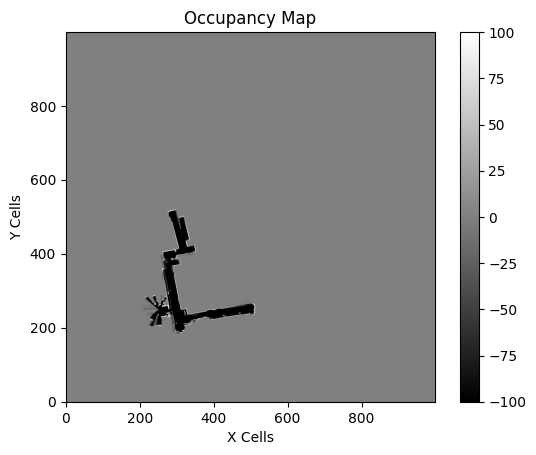

iteration 3401
iteration 3402
iteration 3403
iteration 3404
resampling done
iteration 3405
iteration 3406
iteration 3407
iteration 3408
iteration 3409
iteration 3410
resampling done
iteration 3411
iteration 3412
iteration 3413
iteration 3414
resampling done
iteration 3415
iteration 3416
resampling done
iteration 3417
resampling done
iteration 3418
resampling done
iteration 3419
resampling done
iteration 3420
resampling done
iteration 3421
resampling done
iteration 3422
resampling done
iteration 3423
iteration 3424
resampling done
iteration 3425
iteration 3426
resampling done
iteration 3427
iteration 3428
iteration 3429
iteration 3430
iteration 3431
resampling done
iteration 3432
iteration 3433
iteration 3434
iteration 3435
iteration 3436
iteration 3437
iteration 3438
iteration 3439
iteration 3440
iteration 3441
iteration 3442
iteration 3443
iteration 3444
iteration 3445
iteration 3446
iteration 3447
iteration 3448
iteration 3449
resampling done
iteration 3450
iteration 3451
iteration 3

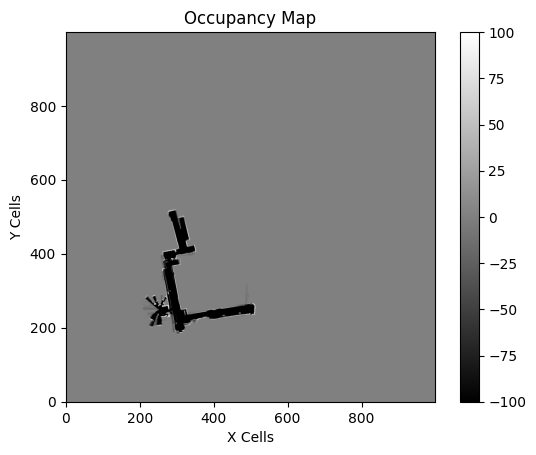

iteration 3501
resampling done
iteration 3502
resampling done
iteration 3503
resampling done
iteration 3504
iteration 3505
resampling done
iteration 3506
iteration 3507
iteration 3508
iteration 3509
resampling done
iteration 3510
resampling done
iteration 3511
resampling done
iteration 3512
resampling done
iteration 3513
resampling done
iteration 3514
iteration 3515
iteration 3516
resampling done
iteration 3517
resampling done
iteration 3518
resampling done
iteration 3519
resampling done
iteration 3520
resampling done
iteration 3521
resampling done
iteration 3522
resampling done
iteration 3523
resampling done
iteration 3524
resampling done
iteration 3525
resampling done
iteration 3526
iteration 3527
resampling done
iteration 3528
resampling done
iteration 3529
resampling done
iteration 3530
resampling done
iteration 3531
resampling done
iteration 3532
iteration 3533
resampling done
iteration 3534
iteration 3535
resampling done
iteration 3536
iteration 3537
iteration 3538
iteration 3539

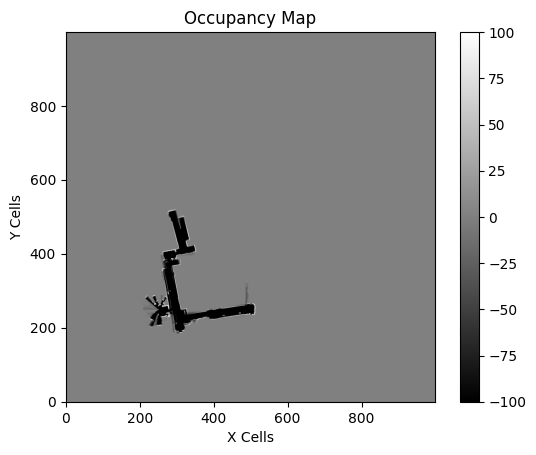

iteration 3601
iteration 3602
iteration 3603
resampling done
iteration 3604
iteration 3605
iteration 3606
resampling done
iteration 3607
iteration 3608
iteration 3609
iteration 3610
iteration 3611
iteration 3612
resampling done
iteration 3613
iteration 3614
iteration 3615
iteration 3616
iteration 3617
iteration 3618
iteration 3619
iteration 3620
iteration 3621
resampling done
iteration 3622
iteration 3623
iteration 3624
iteration 3625
iteration 3626
iteration 3627
iteration 3628
resampling done
iteration 3629
resampling done
iteration 3630
resampling done
iteration 3631
resampling done
iteration 3632
resampling done
iteration 3633
resampling done
iteration 3634
iteration 3635
resampling done
iteration 3636
iteration 3637
iteration 3638
resampling done
iteration 3639
iteration 3640
resampling done
iteration 3641
iteration 3642
iteration 3643
resampling done
iteration 3644
iteration 3645
iteration 3646
iteration 3647
iteration 3648
iteration 3649
iteration 3650
iteration 3651
iteration 3

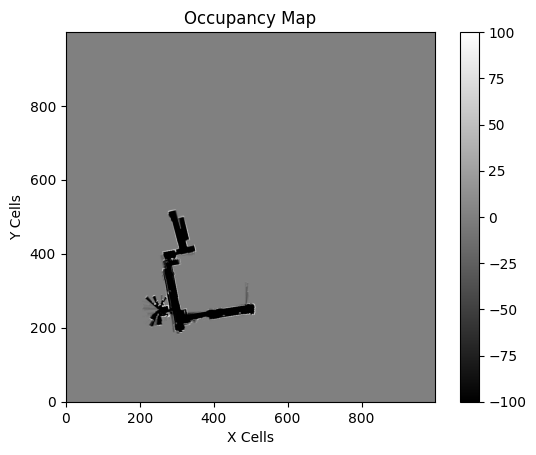

iteration 3701
iteration 3702
iteration 3703
iteration 3704
iteration 3705
resampling done
iteration 3706
iteration 3707
iteration 3708
iteration 3709
iteration 3710
iteration 3711
iteration 3712
iteration 3713
iteration 3714
iteration 3715
iteration 3716
iteration 3717
iteration 3718
iteration 3719
iteration 3720
iteration 3721
resampling done
iteration 3722
iteration 3723
iteration 3724
iteration 3725
iteration 3726
iteration 3727
resampling done
iteration 3728
iteration 3729
iteration 3730
iteration 3731
iteration 3732
iteration 3733
iteration 3734
resampling done
iteration 3735
resampling done
iteration 3736
resampling done
iteration 3737
iteration 3738
iteration 3739
resampling done
iteration 3740
resampling done
iteration 3741
resampling done
iteration 3742
iteration 3743
iteration 3744
iteration 3745
iteration 3746
iteration 3747
iteration 3748
iteration 3749
iteration 3750
iteration 3751
iteration 3752
resampling done
iteration 3753
iteration 3754
iteration 3755
iteration 3756


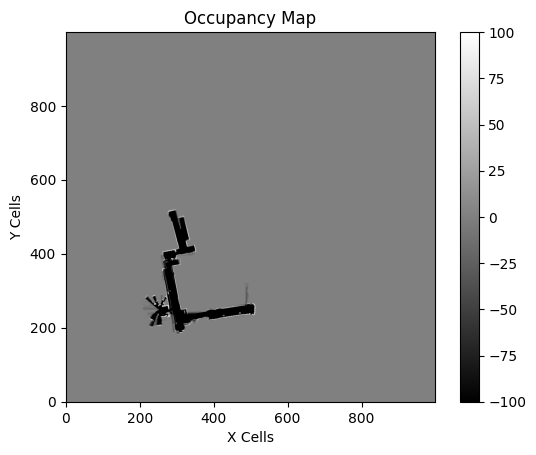

iteration 3801
iteration 3802
iteration 3803
iteration 3804
iteration 3805
iteration 3806
iteration 3807
iteration 3808
iteration 3809
iteration 3810
iteration 3811
iteration 3812
iteration 3813
iteration 3814
iteration 3815
iteration 3816
resampling done
iteration 3817
iteration 3818
iteration 3819
resampling done
iteration 3820
iteration 3821
iteration 3822
iteration 3823
iteration 3824
iteration 3825
iteration 3826
iteration 3827
iteration 3828
iteration 3829
resampling done
iteration 3830
iteration 3831
iteration 3832
iteration 3833
iteration 3834
resampling done
iteration 3835
iteration 3836
iteration 3837
iteration 3838
iteration 3839
iteration 3840
iteration 3841
iteration 3842
iteration 3843
iteration 3844
iteration 3845
iteration 3846
iteration 3847
resampling done
iteration 3848
iteration 3849
iteration 3850
iteration 3851
iteration 3852
iteration 3853
iteration 3854
iteration 3855
iteration 3856
iteration 3857
iteration 3858
iteration 3859
resampling done
iteration 3860
iter

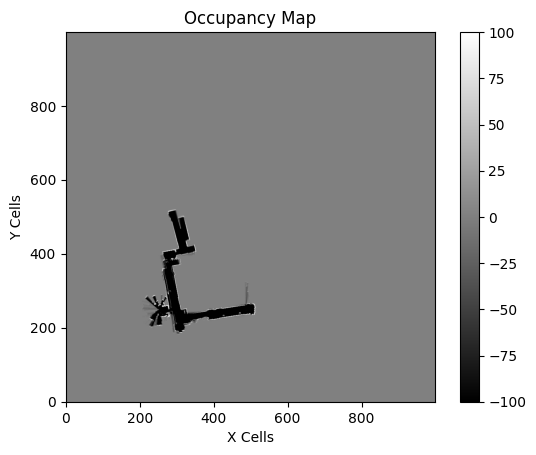

iteration 3901
iteration 3902
iteration 3903
resampling done
iteration 3904
iteration 3905
iteration 3906
iteration 3907
resampling done
iteration 3908
iteration 3909
iteration 3910
iteration 3911
resampling done
iteration 3912
iteration 3913
iteration 3914
resampling done
iteration 3915
resampling done
iteration 3916
iteration 3917
resampling done
iteration 3918
resampling done
iteration 3919
resampling done
iteration 3920
iteration 3921
iteration 3922
resampling done
iteration 3923
resampling done
iteration 3924
resampling done
iteration 3925
iteration 3926
resampling done
iteration 3927
iteration 3928
iteration 3929
iteration 3930
iteration 3931
resampling done
iteration 3932
iteration 3933
iteration 3934
iteration 3935
resampling done
iteration 3936
resampling done
iteration 3937
resampling done
iteration 3938
iteration 3939
iteration 3940
resampling done
iteration 3941
iteration 3942
resampling done
iteration 3943
iteration 3944
iteration 3945
iteration 3946
resampling done
iterat

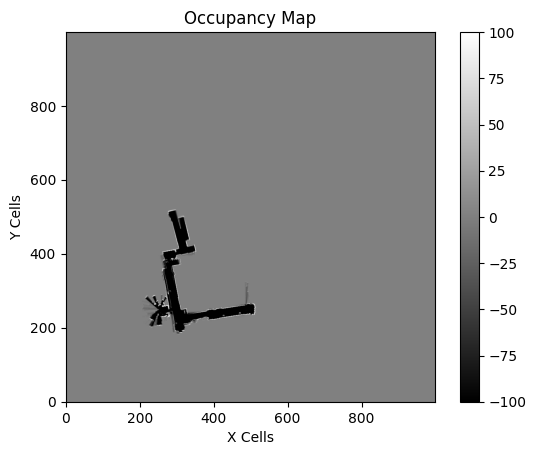

iteration 4001
resampling done
iteration 4002
iteration 4003
resampling done
iteration 4004
resampling done
iteration 4005
resampling done
iteration 4006
resampling done
iteration 4007
resampling done
iteration 4008
resampling done
iteration 4009
resampling done
iteration 4010
resampling done
iteration 4011
iteration 4012
resampling done
iteration 4013
resampling done
iteration 4014
resampling done
iteration 4015
resampling done
iteration 4016
resampling done
iteration 4017
resampling done
iteration 4018
resampling done
iteration 4019
iteration 4020
iteration 4021
resampling done
iteration 4022
resampling done
iteration 4023
resampling done
iteration 4024
resampling done
iteration 4025
resampling done
iteration 4026
resampling done
iteration 4027
resampling done
iteration 4028
iteration 4029
resampling done
iteration 4030
iteration 4031
resampling done
iteration 4032
resampling done
iteration 4033
resampling done
iteration 4034
resampling done
iteration 4035
iteration 4036
resampling d

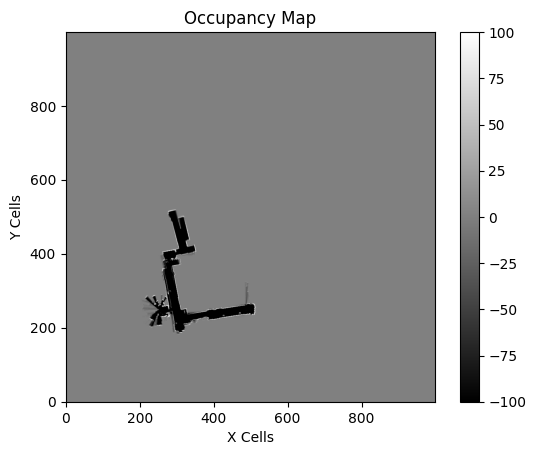

iteration 4101
iteration 4102
iteration 4103
resampling done
iteration 4104
iteration 4105
resampling done
iteration 4106
resampling done
iteration 4107
resampling done
iteration 4108
iteration 4109
resampling done
iteration 4110
resampling done
iteration 4111
resampling done
iteration 4112
resampling done
iteration 4113
resampling done
iteration 4114
iteration 4115
iteration 4116
iteration 4117
resampling done
iteration 4118
iteration 4119
iteration 4120
iteration 4121
iteration 4122
iteration 4123
resampling done
iteration 4124
iteration 4125
iteration 4126
iteration 4127
iteration 4128
iteration 4129
resampling done
iteration 4130
resampling done
iteration 4131
resampling done
iteration 4132
resampling done
iteration 4133
resampling done
iteration 4134
iteration 4135
resampling done
iteration 4136
iteration 4137
resampling done
iteration 4138
iteration 4139
iteration 4140
iteration 4141
resampling done
iteration 4142
iteration 4143
iteration 4144
iteration 4145
iteration 4146
iterat

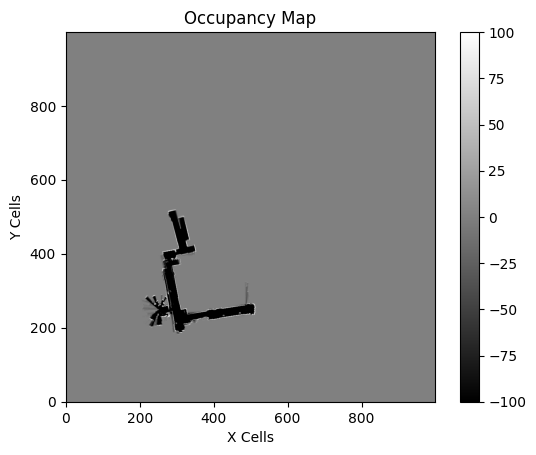

iteration 4201
resampling done
iteration 4202
resampling done
iteration 4203
resampling done
iteration 4204
iteration 4205
resampling done
iteration 4206
iteration 4207
resampling done
iteration 4208
iteration 4209
resampling done
iteration 4210
iteration 4211
iteration 4212
iteration 4213
iteration 4214
resampling done
iteration 4215
iteration 4216
iteration 4217
resampling done
iteration 4218
iteration 4219
iteration 4220
resampling done
iteration 4221
iteration 4222
iteration 4223
iteration 4224
iteration 4225
iteration 4226
iteration 4227
iteration 4228
iteration 4229
resampling done
iteration 4230
iteration 4231
iteration 4232
iteration 4233
resampling done
iteration 4234
iteration 4235
iteration 4236
iteration 4237
iteration 4238
iteration 4239
iteration 4240
resampling done
iteration 4241
resampling done
iteration 4242
resampling done
iteration 4243
iteration 4244
resampling done
iteration 4245
iteration 4246
resampling done
iteration 4247
resampling done
iteration 4248
resampli

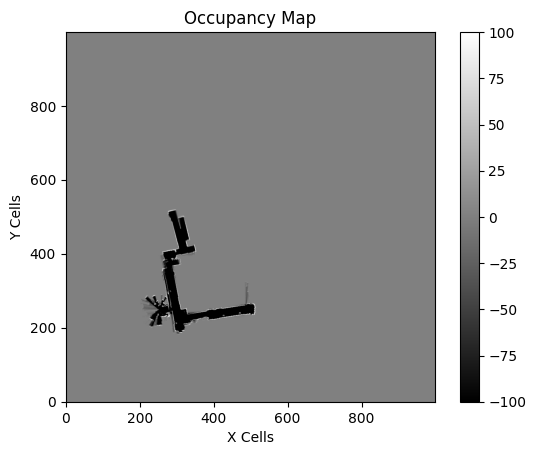

iteration 4301
resampling done
iteration 4302
resampling done
iteration 4303
iteration 4304
resampling done
iteration 4305
resampling done
iteration 4306
resampling done
iteration 4307
resampling done
iteration 4308
resampling done
iteration 4309
resampling done
iteration 4310
resampling done
iteration 4311
resampling done
iteration 4312
resampling done
iteration 4313
resampling done
iteration 4314
resampling done
iteration 4315
resampling done
iteration 4316
resampling done
iteration 4317
resampling done
iteration 4318
resampling done
iteration 4319
resampling done
iteration 4320
resampling done
iteration 4321
resampling done
iteration 4322
resampling done
iteration 4323
resampling done
iteration 4324
resampling done
iteration 4325
resampling done
iteration 4326
resampling done
iteration 4327
resampling done
iteration 4328
resampling done
iteration 4329
resampling done
iteration 4330
resampling done
iteration 4331
resampling done
iteration 4332
resampling done
iteration 4333
resamplin

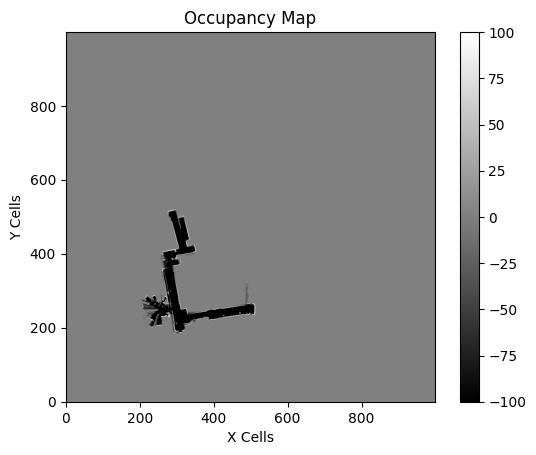

iteration 4401
resampling done
iteration 4402
resampling done
iteration 4403
resampling done
iteration 4404
resampling done
iteration 4405
resampling done
iteration 4406
resampling done
iteration 4407
resampling done
iteration 4408
resampling done
iteration 4409
resampling done
iteration 4410
resampling done
iteration 4411
resampling done
iteration 4412
resampling done
iteration 4413
resampling done
iteration 4414
resampling done
iteration 4415
resampling done
iteration 4416
resampling done
iteration 4417
resampling done
iteration 4418
resampling done
iteration 4419
resampling done
iteration 4420
resampling done
iteration 4421
resampling done
iteration 4422
resampling done
iteration 4423
resampling done
iteration 4424
resampling done
iteration 4425
resampling done
iteration 4426
resampling done
iteration 4427
resampling done
iteration 4428
resampling done
iteration 4429
resampling done
iteration 4430
resampling done
iteration 4431
resampling done
iteration 4432
resampling done
iteratio

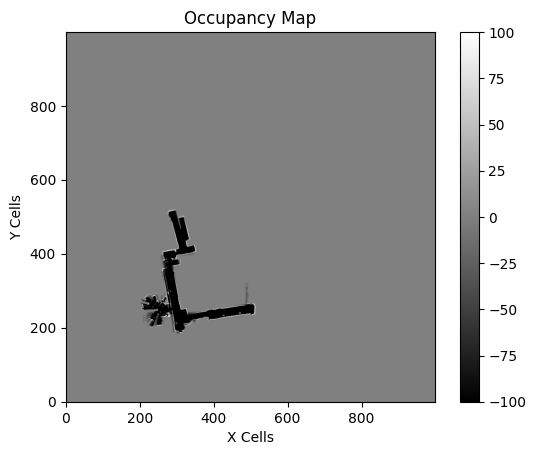

iteration 4501
resampling done
iteration 4502
resampling done
iteration 4503
resampling done
iteration 4504
resampling done
iteration 4505
resampling done
iteration 4506
resampling done
iteration 4507
resampling done
iteration 4508
resampling done
iteration 4509
resampling done
iteration 4510
resampling done
iteration 4511
resampling done
iteration 4512
iteration 4513
resampling done
iteration 4514
resampling done
iteration 4515
resampling done
iteration 4516
resampling done
iteration 4517
resampling done
iteration 4518
iteration 4519
resampling done
iteration 4520
resampling done
iteration 4521
resampling done
iteration 4522
iteration 4523
resampling done
iteration 4524
iteration 4525
iteration 4526
resampling done
iteration 4527
iteration 4528
iteration 4529
iteration 4530
resampling done
iteration 4531
iteration 4532
iteration 4533
iteration 4534
resampling done
iteration 4535
iteration 4536
resampling done
iteration 4537
resampling done
iteration 4538
resampling done
iteration 4539

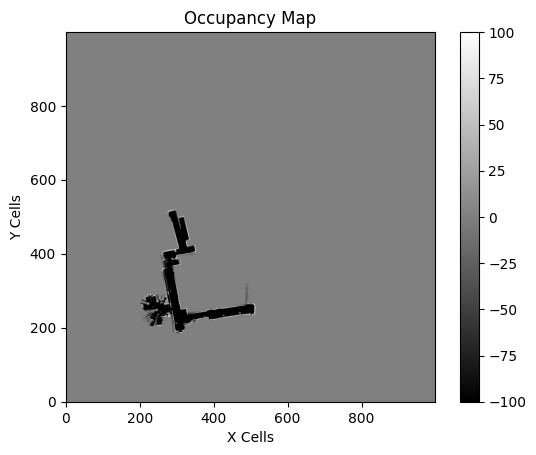

iteration 4601
resampling done
iteration 4602
resampling done
iteration 4603
iteration 4604
resampling done
iteration 4605
resampling done
iteration 4606
resampling done
iteration 4607
resampling done
iteration 4608
resampling done
iteration 4609
iteration 4610
resampling done
iteration 4611
resampling done
iteration 4612
resampling done
iteration 4613
resampling done
iteration 4614
resampling done
iteration 4615
resampling done
iteration 4616
resampling done
iteration 4617
resampling done
iteration 4618
resampling done
iteration 4619
iteration 4620
resampling done
iteration 4621
iteration 4622
resampling done
iteration 4623
iteration 4624
resampling done
iteration 4625
iteration 4626
iteration 4627
resampling done
iteration 4628
iteration 4629
resampling done
iteration 4630
iteration 4631
iteration 4632
resampling done
iteration 4633
iteration 4634
resampling done
iteration 4635
resampling done
iteration 4636
resampling done
iteration 4637
iteration 4638
iteration 4639
resampling done

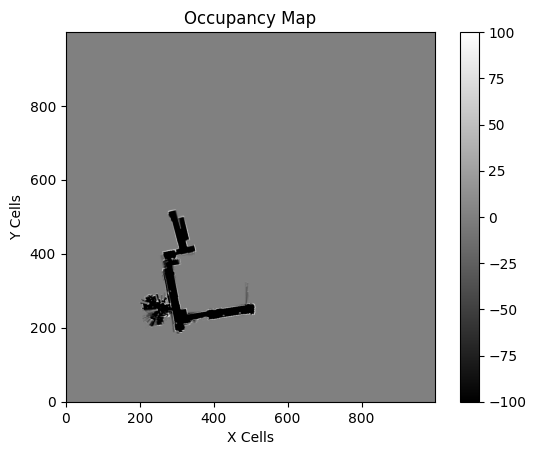

iteration 4701
resampling done
iteration 4702
iteration 4703
resampling done
iteration 4704
iteration 4705
resampling done
iteration 4706
resampling done
iteration 4707
iteration 4708
resampling done
iteration 4709
iteration 4710
iteration 4711
iteration 4712
iteration 4713
resampling done
iteration 4714
resampling done
iteration 4715
iteration 4716
resampling done
iteration 4717
iteration 4718
iteration 4719
iteration 4720
resampling done
iteration 4721
iteration 4722
iteration 4723
iteration 4724
iteration 4725
resampling done
iteration 4726
iteration 4727
iteration 4728
iteration 4729
iteration 4730
resampling done
iteration 4731
iteration 4732
iteration 4733
iteration 4734
resampling done
iteration 4735
resampling done
iteration 4736
iteration 4737
iteration 4738
iteration 4739
iteration 4740
resampling done
iteration 4741
iteration 4742
iteration 4743
resampling done
iteration 4744
iteration 4745
iteration 4746
resampling done
iteration 4747
iteration 4748
iteration 4749
iteration

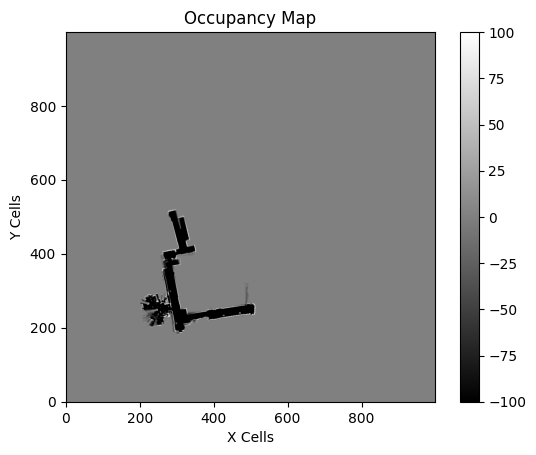

iteration 4801
iteration 4802
iteration 4803
resampling done
iteration 4804
iteration 4805
iteration 4806
iteration 4807
iteration 4808
iteration 4809
resampling done
iteration 4810
iteration 4811
iteration 4812
iteration 4813
resampling done
iteration 4814
iteration 4815
iteration 4816
resampling done
iteration 4817
iteration 4818
resampling done
iteration 4819
resampling done
iteration 4820
resampling done
iteration 4821
iteration 4822
iteration 4823
resampling done
iteration 4824
iteration 4825
iteration 4826
iteration 4827
resampling done
iteration 4828
iteration 4829
iteration 4830
iteration 4831
iteration 4832
iteration 4833
resampling done
iteration 4834
iteration 4835
resampling done
iteration 4836
resampling done
iteration 4837
iteration 4838
iteration 4839
resampling done
iteration 4840
resampling done
iteration 4841
resampling done
iteration 4842
resampling done
iteration 4843
iteration 4844
iteration 4845
resampling done
iteration 4846
iteration 4847
iteration 4848
resampli

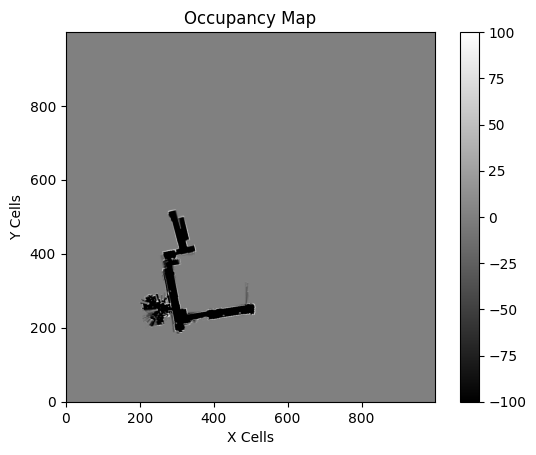

iteration 4901
iteration 4902
iteration 4903
iteration 4904
resampling done
iteration 4905
iteration 4906
iteration 4907
iteration 4908
iteration 4909
iteration 4910
resampling done
iteration 4911
iteration 4912
iteration 4913
resampling done
iteration 4914
iteration 4915
iteration 4916
iteration 4917
iteration 4918
iteration 4919
iteration 4920
resampling done
iteration 4921
iteration 4922
iteration 4923
resampling done
iteration 4924
iteration 4925
iteration 4926
iteration 4927
iteration 4928
iteration 4929
iteration 4930
resampling done
iteration 4931
iteration 4932
iteration 4933
iteration 4934
iteration 4935
iteration 4936
resampling done
iteration 4937
iteration 4938
resampling done
iteration 4939
iteration 4940
iteration 4941
iteration 4942
resampling done
iteration 4943
iteration 4944
iteration 4945
iteration 4946
resampling done
iteration 4947
resampling done
iteration 4948
iteration 4949
resampling done
iteration 4950
iteration 4951
iteration 4952
resampling done
iteration 49

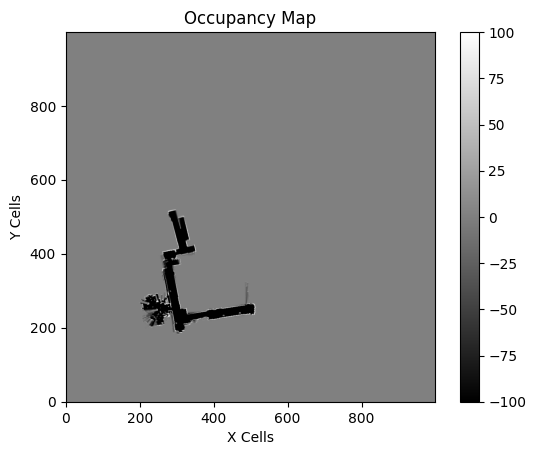

In [63]:
occupancymaps_all_0_good_width = lidar_hits_2(FL_0,FR_0,RL_0,RR_0,ts_enc_0,encoder_ticks_to_meters,width_between_wheels,1.7,lidar_0,matched_lidar_indices_0,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

iteration 0


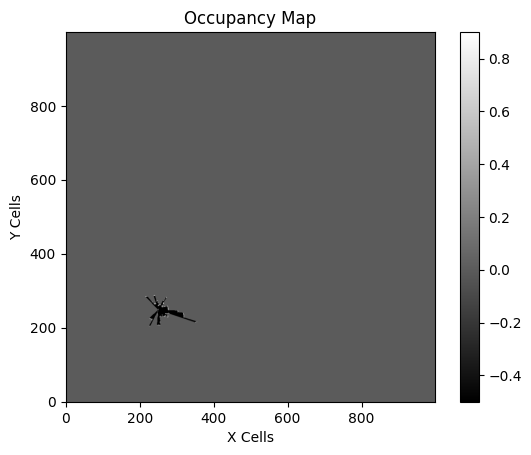

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
resampling done
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
resampling done
iteration 60
resampling done
iteration 61
resampling done
iteration 62
iteration 63
iteration 64
iteration 65
resampling done
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iterat

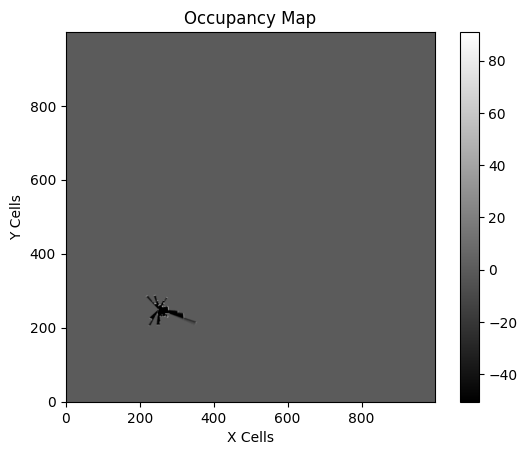

iteration 101
iteration 102
iteration 103
iteration 104
iteration 105
iteration 106
iteration 107
iteration 108
iteration 109
iteration 110
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
iteration 116
resampling done
iteration 117
iteration 118
iteration 119
iteration 120
iteration 121
iteration 122
iteration 123
iteration 124
iteration 125
iteration 126
iteration 127
iteration 128
iteration 129
iteration 130
iteration 131
iteration 132
iteration 133
iteration 134
iteration 135
iteration 136
iteration 137
iteration 138
iteration 139
iteration 140
iteration 141
iteration 142
iteration 143
iteration 144
iteration 145
iteration 146
iteration 147
iteration 148
iteration 149
iteration 150
iteration 151
iteration 152
resampling done
iteration 153
iteration 154
iteration 155
iteration 156
iteration 157
iteration 158
resampling done
iteration 159
iteration 160
iteration 161
iteration 162
iteration 163
iteration 164
iteration 165
iteration 166
iteration 167
iteration 168


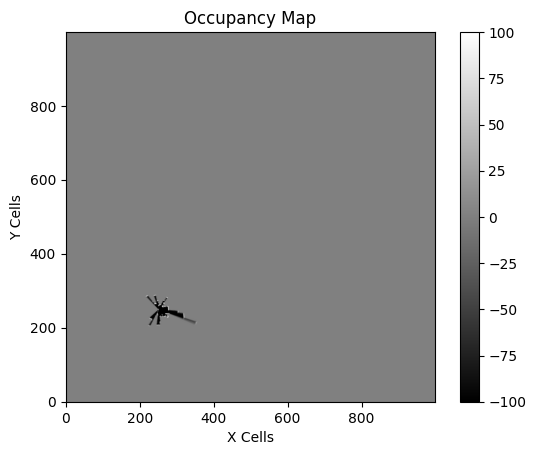

iteration 201
iteration 202
iteration 203
iteration 204
iteration 205
iteration 206
iteration 207
iteration 208
iteration 209
iteration 210
iteration 211
iteration 212
iteration 213
iteration 214
iteration 215
iteration 216
iteration 217
iteration 218
iteration 219
iteration 220
iteration 221
iteration 222
iteration 223
iteration 224
iteration 225
resampling done
iteration 226
iteration 227
iteration 228
iteration 229
iteration 230
iteration 231
iteration 232
iteration 233
iteration 234
iteration 235
iteration 236
iteration 237
iteration 238
iteration 239
iteration 240
iteration 241
iteration 242
iteration 243
resampling done
iteration 244
iteration 245
iteration 246
iteration 247
iteration 248
iteration 249
iteration 250
iteration 251
iteration 252
iteration 253
iteration 254
iteration 255
iteration 256
iteration 257
iteration 258
iteration 259
iteration 260
iteration 261
iteration 262
iteration 263
iteration 264
iteration 265
iteration 266
iteration 267
iteration 268
iteration 269
re

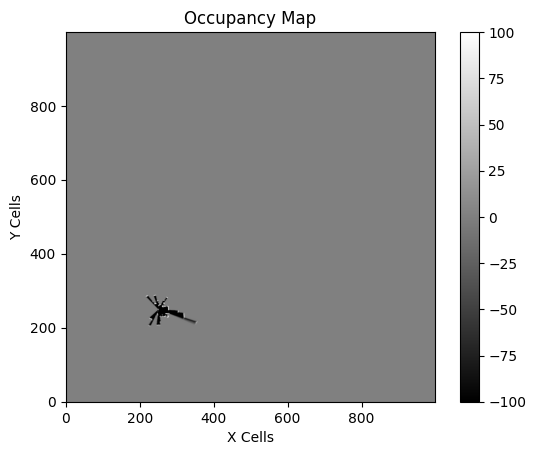

iteration 301
iteration 302
iteration 303
iteration 304
iteration 305
iteration 306
resampling done
iteration 307
iteration 308
iteration 309
iteration 310
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
resampling done
iteration 317
iteration 318
iteration 319
iteration 320
iteration 321
iteration 322
iteration 323
resampling done
iteration 324
iteration 325
iteration 326
iteration 327
iteration 328
iteration 329
iteration 330
iteration 331
iteration 332
iteration 333
resampling done
iteration 334
iteration 335
iteration 336
iteration 337
iteration 338
iteration 339
iteration 340
iteration 341
iteration 342
iteration 343
iteration 344
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
resampling done
iteration 353
iteration 354
iteration 355
iteration 356
iteration 357
iteration 358
resampling done
iteration 359
iteration 360
iteration 361
iteration 362
iteration 363
iteration 364
iteratio

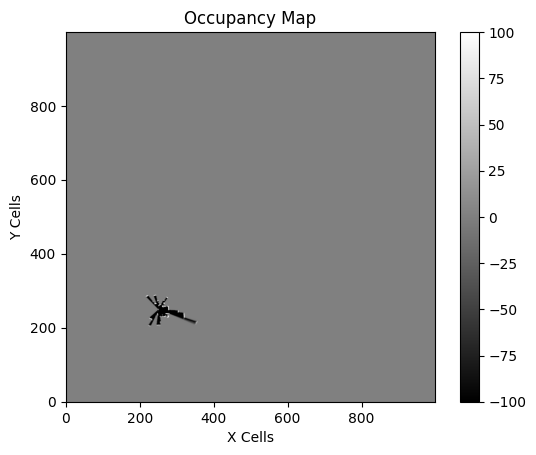

iteration 401
iteration 402
iteration 403
iteration 404
iteration 405
iteration 406
iteration 407
iteration 408
iteration 409
iteration 410
iteration 411
iteration 412
iteration 413
iteration 414
iteration 415
iteration 416
iteration 417
resampling done
iteration 418
iteration 419
iteration 420
iteration 421
iteration 422
iteration 423
iteration 424
iteration 425
iteration 426
iteration 427
iteration 428
resampling done
iteration 429
iteration 430
iteration 431
iteration 432
iteration 433
iteration 434
iteration 435
iteration 436
iteration 437
resampling done
iteration 438
iteration 439
iteration 440
resampling done
iteration 441
iteration 442
iteration 443
iteration 444
resampling done
iteration 445
resampling done
iteration 446
iteration 447
iteration 448
resampling done
iteration 449
iteration 450
resampling done
iteration 451
resampling done
iteration 452
resampling done
iteration 453
iteration 454
iteration 455
resampling done
iteration 456
resampling done
iteration 457
resampling

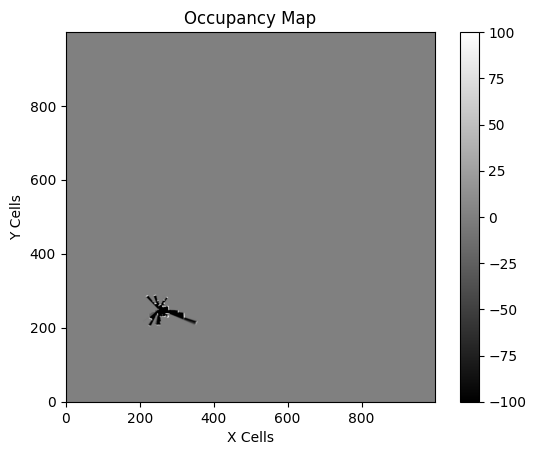

iteration 501
iteration 502
iteration 503
iteration 504
iteration 505
resampling done
iteration 506
iteration 507
iteration 508
iteration 509
iteration 510
iteration 511
resampling done
iteration 512
iteration 513
iteration 514
iteration 515
resampling done
iteration 516
iteration 517
iteration 518
iteration 519
resampling done
iteration 520
iteration 521
resampling done
iteration 522
iteration 523
iteration 524
iteration 525
iteration 526
iteration 527
resampling done
iteration 528
iteration 529
resampling done
iteration 530
iteration 531
resampling done
iteration 532
iteration 533
iteration 534
resampling done
iteration 535
iteration 536
iteration 537
iteration 538
iteration 539
resampling done
iteration 540
iteration 541
iteration 542
iteration 543
iteration 544
resampling done
iteration 545
iteration 546
iteration 547
iteration 548
iteration 549
iteration 550
iteration 551
iteration 552
iteration 553
iteration 554
iteration 555
iteration 556
iteration 557
iteration 558
iteration 55

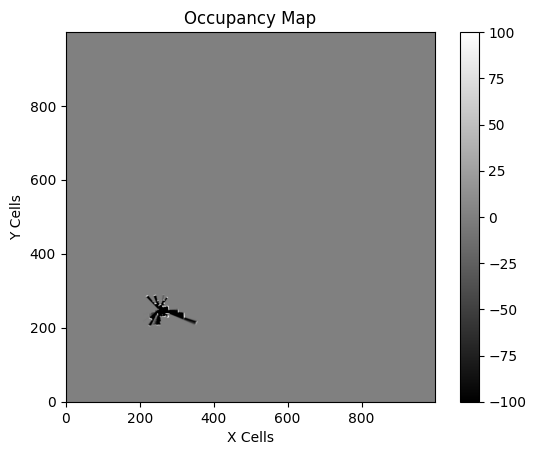

iteration 601
iteration 602
iteration 603
iteration 604
iteration 605
iteration 606
iteration 607
iteration 608
iteration 609
iteration 610
iteration 611
iteration 612
iteration 613
iteration 614
iteration 615
iteration 616
iteration 617
iteration 618
iteration 619
iteration 620
iteration 621
iteration 622
iteration 623
iteration 624
iteration 625
iteration 626
iteration 627
iteration 628
iteration 629
resampling done
iteration 630
iteration 631
iteration 632
resampling done
iteration 633
iteration 634
iteration 635
iteration 636
iteration 637
iteration 638
iteration 639
iteration 640
resampling done
iteration 641
iteration 642
resampling done
iteration 643
iteration 644
iteration 645
iteration 646
iteration 647
iteration 648
iteration 649
iteration 650
iteration 651
resampling done
iteration 652
iteration 653
iteration 654
iteration 655
iteration 656
iteration 657
iteration 658
iteration 659
iteration 660
iteration 661
iteration 662
iteration 663
iteration 664
iteration 665
resampling

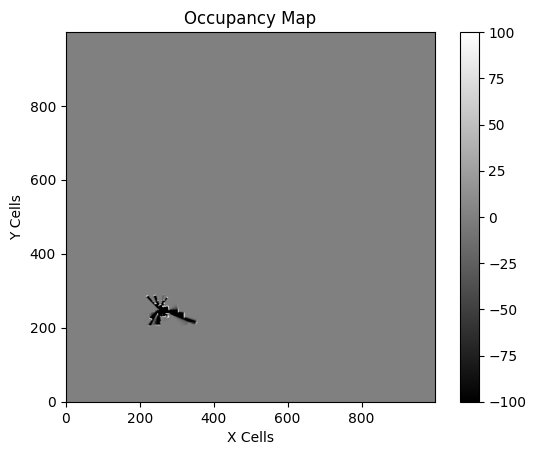

iteration 701
iteration 702
resampling done
iteration 703
resampling done
iteration 704
iteration 705
resampling done
iteration 706
resampling done
iteration 707
resampling done
iteration 708
iteration 709
iteration 710
iteration 711
iteration 712
iteration 713
iteration 714
iteration 715
iteration 716
iteration 717
iteration 718
iteration 719
resampling done
iteration 720
iteration 721
resampling done
iteration 722
iteration 723
resampling done
iteration 724
iteration 725
iteration 726
iteration 727
iteration 728
iteration 729
resampling done
iteration 730
resampling done
iteration 731
iteration 732
iteration 733
iteration 734
iteration 735
iteration 736
iteration 737
resampling done
iteration 738
resampling done
iteration 739
resampling done
iteration 740
resampling done
iteration 741
resampling done
iteration 742
iteration 743
resampling done
iteration 744
resampling done
iteration 745
resampling done
iteration 746
iteration 747
resampling done
iteration 748
resampling done
iteratio

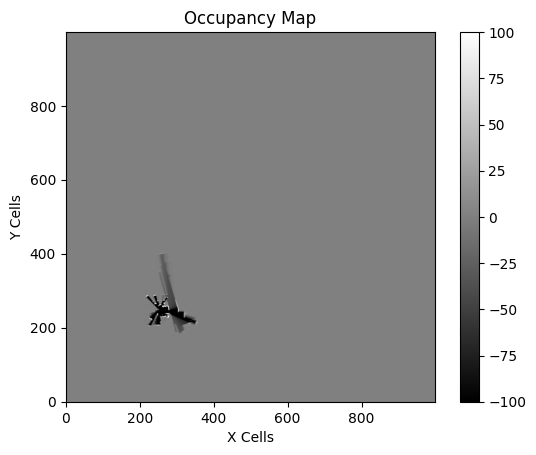

iteration 801
iteration 802
iteration 803
resampling done
iteration 804
iteration 805
iteration 806
iteration 807
iteration 808
iteration 809
iteration 810
iteration 811
resampling done
iteration 812
iteration 813
iteration 814
iteration 815
iteration 816
iteration 817
iteration 818
iteration 819
iteration 820
resampling done
iteration 821
iteration 822
iteration 823
resampling done
iteration 824
iteration 825
iteration 826
resampling done
iteration 827
resampling done
iteration 828
iteration 829
resampling done
iteration 830
iteration 831
resampling done
iteration 832
resampling done
iteration 833
resampling done
iteration 834
resampling done
iteration 835
resampling done
iteration 836
resampling done
iteration 837
resampling done
iteration 838
iteration 839
resampling done
iteration 840
resampling done
iteration 841
resampling done
iteration 842
resampling done
iteration 843
resampling done
iteration 844
resampling done
iteration 845
iteration 846
iteration 847
resampling done
iterat

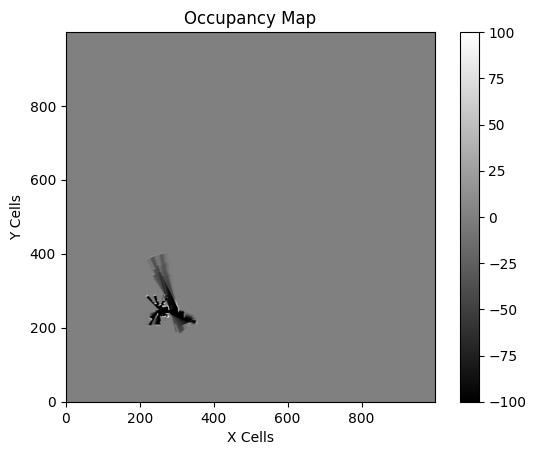

iteration 901
resampling done
iteration 902
iteration 903
iteration 904
resampling done
iteration 905
iteration 906
resampling done
iteration 907
resampling done
iteration 908
iteration 909
iteration 910
iteration 911
iteration 912
resampling done
iteration 913
iteration 914
iteration 915
iteration 916
iteration 917
iteration 918
resampling done
iteration 919
iteration 920
iteration 921
iteration 922
resampling done
iteration 923
resampling done
iteration 924
resampling done
iteration 925
resampling done
iteration 926
iteration 927
resampling done
iteration 928
iteration 929
iteration 930
resampling done
iteration 931
iteration 932
iteration 933
resampling done
iteration 934
iteration 935
iteration 936
resampling done
iteration 937
iteration 938
resampling done
iteration 939
iteration 940
resampling done
iteration 941
iteration 942
iteration 943
iteration 944
iteration 945
resampling done
iteration 946
iteration 947
iteration 948
iteration 949
iteration 950
resampling done
iteration 95

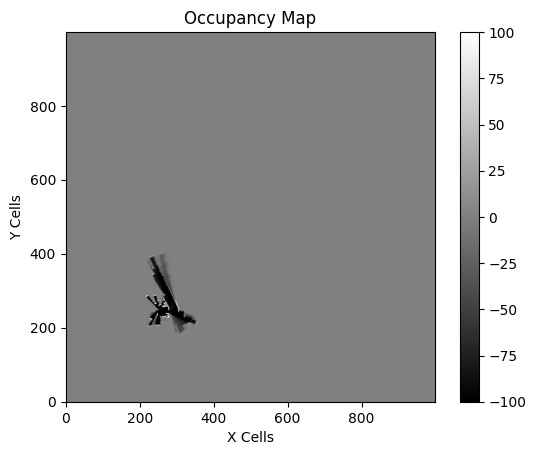

iteration 1001
resampling done
iteration 1002
resampling done
iteration 1003
resampling done
iteration 1004
resampling done
iteration 1005
iteration 1006
iteration 1007
resampling done
iteration 1008
iteration 1009
iteration 1010
iteration 1011
resampling done
iteration 1012
iteration 1013
iteration 1014
resampling done
iteration 1015
iteration 1016
resampling done
iteration 1017
iteration 1018
iteration 1019
iteration 1020
iteration 1021
resampling done
iteration 1022
iteration 1023
iteration 1024
resampling done
iteration 1025
resampling done
iteration 1026
iteration 1027
iteration 1028
iteration 1029
resampling done
iteration 1030
resampling done
iteration 1031
iteration 1032
iteration 1033
resampling done
iteration 1034
iteration 1035
iteration 1036
iteration 1037
resampling done
iteration 1038
iteration 1039
iteration 1040
resampling done
iteration 1041
iteration 1042
iteration 1043
resampling done
iteration 1044
iteration 1045
iteration 1046
resampling done
iteration 1047
iterati

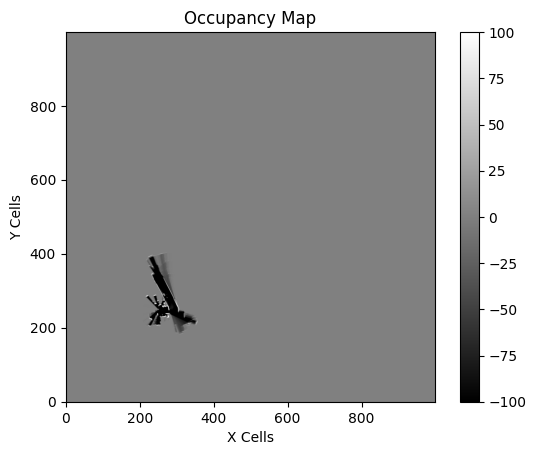

iteration 1101
iteration 1102
iteration 1103
resampling done
iteration 1104
iteration 1105
iteration 1106
iteration 1107
iteration 1108
iteration 1109
resampling done
iteration 1110
iteration 1111
iteration 1112
iteration 1113
iteration 1114
resampling done
iteration 1115
iteration 1116
iteration 1117
iteration 1118
iteration 1119
iteration 1120
iteration 1121
iteration 1122
resampling done
iteration 1123
iteration 1124
iteration 1125
iteration 1126
iteration 1127
resampling done
iteration 1128
iteration 1129
iteration 1130
iteration 1131
iteration 1132
iteration 1133
iteration 1134
resampling done
iteration 1135
iteration 1136
iteration 1137
iteration 1138
iteration 1139
iteration 1140
iteration 1141
iteration 1142
iteration 1143
iteration 1144
resampling done
iteration 1145
iteration 1146
iteration 1147
iteration 1148
iteration 1149
iteration 1150
iteration 1151
iteration 1152
iteration 1153
resampling done
iteration 1154
iteration 1155
iteration 1156
iteration 1157
resampling done
i

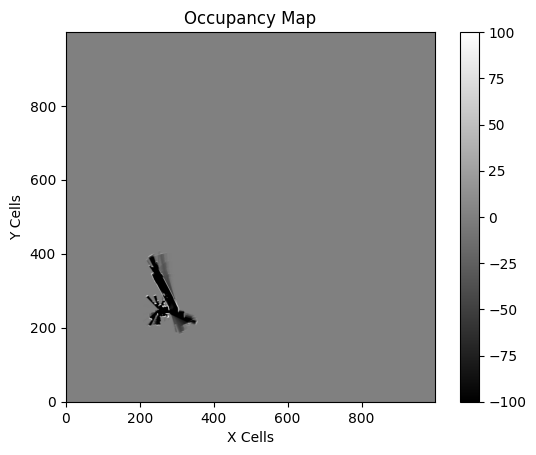

iteration 1201
iteration 1202
iteration 1203
iteration 1204
iteration 1205
iteration 1206
resampling done
iteration 1207
iteration 1208
iteration 1209
iteration 1210
resampling done
iteration 1211
iteration 1212
resampling done
iteration 1213
resampling done
iteration 1214
resampling done
iteration 1215
iteration 1216
resampling done
iteration 1217
iteration 1218
resampling done
iteration 1219
resampling done
iteration 1220
resampling done
iteration 1221
resampling done
iteration 1222
resampling done
iteration 1223
resampling done
iteration 1224
resampling done
iteration 1225
resampling done
iteration 1226
resampling done
iteration 1227
resampling done
iteration 1228
resampling done
iteration 1229
resampling done
iteration 1230
resampling done
iteration 1231
resampling done
iteration 1232
resampling done
iteration 1233
resampling done
iteration 1234
resampling done
iteration 1235
resampling done
iteration 1236
resampling done
iteration 1237
resampling done
iteration 1238
resampling don

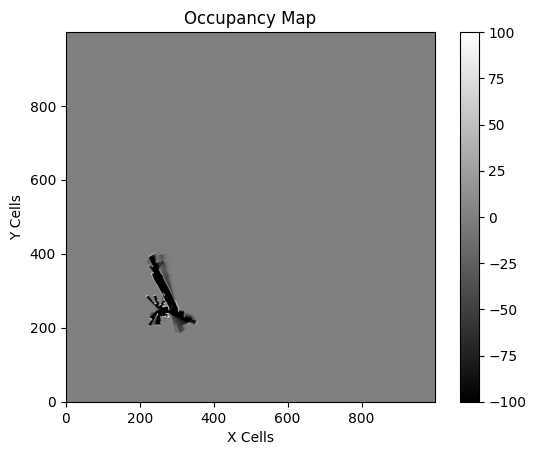

iteration 1301
resampling done
iteration 1302
resampling done
iteration 1303
resampling done
iteration 1304
resampling done
iteration 1305
resampling done
iteration 1306
resampling done
iteration 1307
resampling done
iteration 1308
resampling done
iteration 1309
resampling done
iteration 1310
resampling done
iteration 1311
resampling done
iteration 1312
resampling done
iteration 1313
resampling done
iteration 1314
resampling done
iteration 1315
resampling done
iteration 1316
resampling done
iteration 1317
resampling done
iteration 1318
resampling done
iteration 1319
resampling done
iteration 1320
resampling done
iteration 1321
resampling done
iteration 1322
resampling done
iteration 1323
resampling done
iteration 1324
resampling done
iteration 1325
resampling done
iteration 1326
resampling done
iteration 1327
resampling done
iteration 1328
resampling done
iteration 1329
iteration 1330
iteration 1331
iteration 1332
resampling done
iteration 1333
iteration 1334
iteration 1335
iteration 1

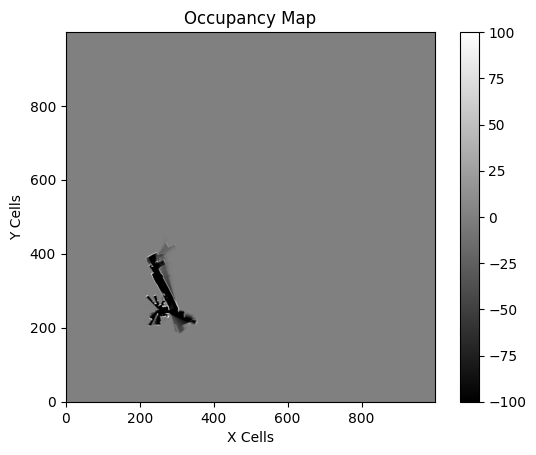

iteration 1401
iteration 1402
iteration 1403
iteration 1404
iteration 1405
iteration 1406
iteration 1407
iteration 1408
iteration 1409
resampling done
iteration 1410
resampling done
iteration 1411
resampling done
iteration 1412
iteration 1413
iteration 1414
iteration 1415
iteration 1416
iteration 1417
resampling done
iteration 1418
iteration 1419
iteration 1420
iteration 1421
iteration 1422
iteration 1423
resampling done
iteration 1424
iteration 1425
iteration 1426
iteration 1427
iteration 1428
iteration 1429
iteration 1430
iteration 1431
iteration 1432
resampling done
iteration 1433
iteration 1434
iteration 1435
iteration 1436
iteration 1437
iteration 1438
iteration 1439
iteration 1440
iteration 1441
iteration 1442
iteration 1443
resampling done
iteration 1444
iteration 1445
iteration 1446
iteration 1447
iteration 1448
iteration 1449
iteration 1450
resampling done
iteration 1451
iteration 1452
iteration 1453
iteration 1454
iteration 1455
resampling done
iteration 1456
iteration 1457
i

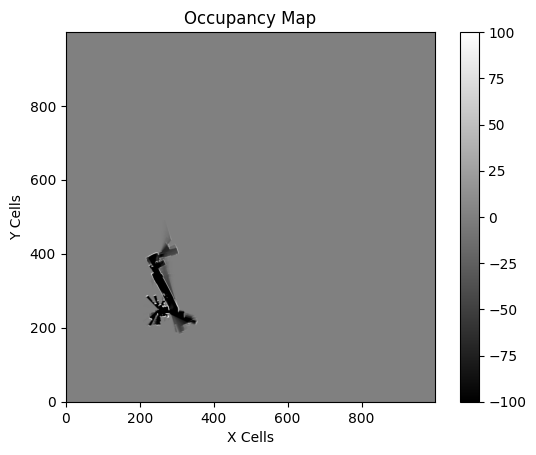

iteration 1501
resampling done
iteration 1502
iteration 1503
iteration 1504
iteration 1505
iteration 1506
resampling done
iteration 1507
iteration 1508
iteration 1509
iteration 1510
resampling done
iteration 1511
iteration 1512
resampling done
iteration 1513
resampling done
iteration 1514
resampling done
iteration 1515
resampling done
iteration 1516
resampling done
iteration 1517
resampling done
iteration 1518
resampling done
iteration 1519
resampling done
iteration 1520
iteration 1521
resampling done
iteration 1522
resampling done
iteration 1523
resampling done
iteration 1524
resampling done
iteration 1525
iteration 1526
resampling done
iteration 1527
resampling done
iteration 1528
iteration 1529
resampling done
iteration 1530
iteration 1531
iteration 1532
resampling done
iteration 1533
iteration 1534
iteration 1535
iteration 1536
iteration 1537
resampling done
iteration 1538
iteration 1539
resampling done
iteration 1540
resampling done
iteration 1541
resampling done
iteration 1542
re

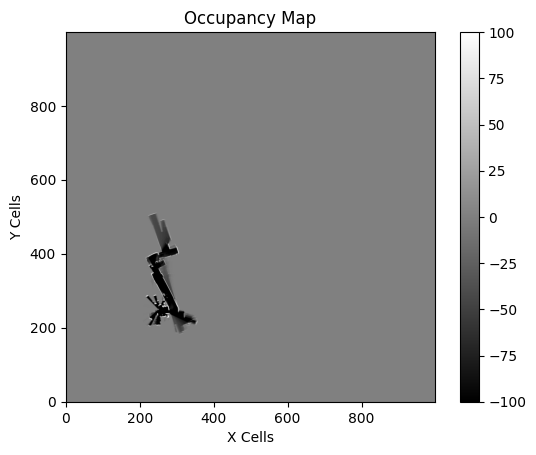

iteration 1601
iteration 1602
iteration 1603
iteration 1604
iteration 1605
iteration 1606
iteration 1607
iteration 1608
iteration 1609
iteration 1610
iteration 1611
iteration 1612
iteration 1613
iteration 1614
iteration 1615
iteration 1616
iteration 1617
iteration 1618
iteration 1619
iteration 1620
iteration 1621
resampling done
iteration 1622
iteration 1623
iteration 1624
iteration 1625
iteration 1626
iteration 1627
iteration 1628
iteration 1629
iteration 1630
iteration 1631
iteration 1632
iteration 1633
iteration 1634
iteration 1635
iteration 1636
iteration 1637
iteration 1638
iteration 1639
iteration 1640
iteration 1641
iteration 1642
iteration 1643
resampling done
iteration 1644
iteration 1645
iteration 1646
iteration 1647
iteration 1648
iteration 1649
iteration 1650
iteration 1651
iteration 1652
iteration 1653
resampling done
iteration 1654
iteration 1655
iteration 1656
iteration 1657
iteration 1658
resampling done
iteration 1659
iteration 1660
resampling done
iteration 1661
resam

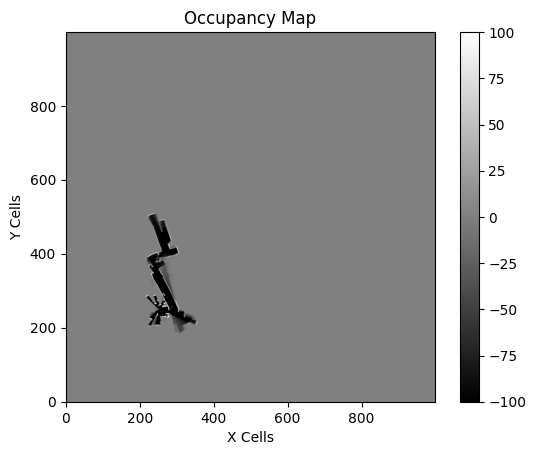

iteration 1701
iteration 1702
resampling done
iteration 1703
resampling done
iteration 1704
resampling done
iteration 1705
resampling done
iteration 1706
resampling done
iteration 1707
resampling done
iteration 1708
iteration 1709
resampling done
iteration 1710
iteration 1711
resampling done
iteration 1712
resampling done
iteration 1713
resampling done
iteration 1714
resampling done
iteration 1715
resampling done
iteration 1716
resampling done
iteration 1717
resampling done
iteration 1718
resampling done
iteration 1719
resampling done
iteration 1720
resampling done
iteration 1721
resampling done
iteration 1722
resampling done
iteration 1723
resampling done
iteration 1724
resampling done
iteration 1725
resampling done
iteration 1726
resampling done
iteration 1727
resampling done
iteration 1728
resampling done
iteration 1729
resampling done
iteration 1730
resampling done
iteration 1731
resampling done
iteration 1732
resampling done
iteration 1733
resampling done
iteration 1734
resampling

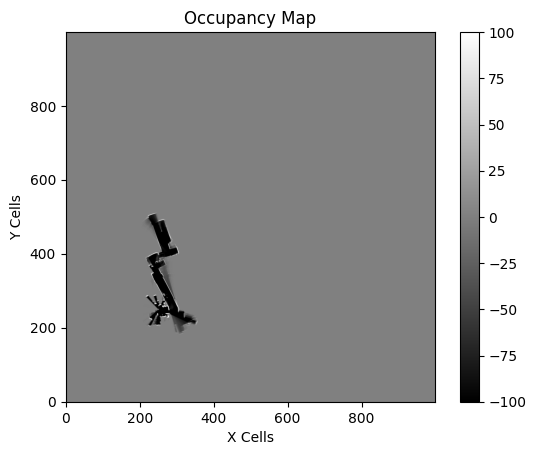

iteration 1801
resampling done
iteration 1802
resampling done
iteration 1803
resampling done
iteration 1804
resampling done
iteration 1805
resampling done
iteration 1806
resampling done
iteration 1807
resampling done
iteration 1808
resampling done
iteration 1809
iteration 1810
resampling done
iteration 1811
resampling done
iteration 1812
resampling done
iteration 1813
resampling done
iteration 1814
resampling done
iteration 1815
resampling done
iteration 1816
resampling done
iteration 1817
iteration 1818
resampling done
iteration 1819
resampling done
iteration 1820
resampling done
iteration 1821
iteration 1822
resampling done
iteration 1823
iteration 1824
resampling done
iteration 1825
resampling done
iteration 1826
resampling done
iteration 1827
resampling done
iteration 1828
resampling done
iteration 1829
resampling done
iteration 1830
resampling done
iteration 1831
resampling done
iteration 1832
resampling done
iteration 1833
resampling done
iteration 1834
resampling done
iteration 

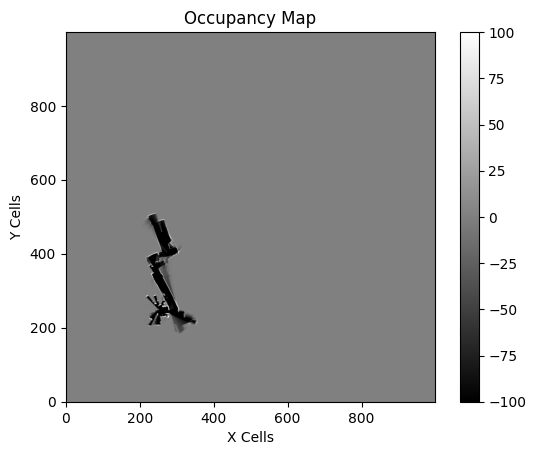

iteration 1901
resampling done
iteration 1902
resampling done
iteration 1903
resampling done
iteration 1904
resampling done
iteration 1905
resampling done
iteration 1906
resampling done
iteration 1907
resampling done
iteration 1908
resampling done
iteration 1909
resampling done
iteration 1910
resampling done
iteration 1911
resampling done
iteration 1912
resampling done
iteration 1913
resampling done
iteration 1914
resampling done
iteration 1915
resampling done
iteration 1916
resampling done
iteration 1917
resampling done
iteration 1918
resampling done
iteration 1919
resampling done
iteration 1920
resampling done
iteration 1921
resampling done
iteration 1922
resampling done
iteration 1923
resampling done
iteration 1924
resampling done
iteration 1925
resampling done
iteration 1926
resampling done
iteration 1927
resampling done
iteration 1928
resampling done
iteration 1929
resampling done
iteration 1930
resampling done
iteration 1931
resampling done
iteration 1932
resampling done
iteratio

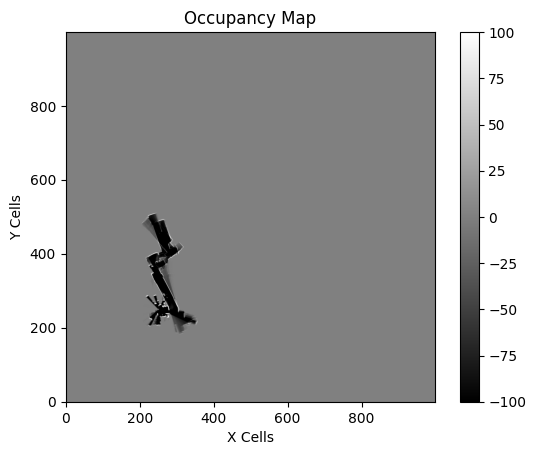

iteration 2001
resampling done
iteration 2002
resampling done
iteration 2003
resampling done
iteration 2004
resampling done
iteration 2005
resampling done
iteration 2006
resampling done
iteration 2007
resampling done
iteration 2008
resampling done
iteration 2009
resampling done
iteration 2010
resampling done
iteration 2011
resampling done
iteration 2012
resampling done
iteration 2013
resampling done
iteration 2014
resampling done
iteration 2015
resampling done
iteration 2016
resampling done
iteration 2017
resampling done
iteration 2018
resampling done
iteration 2019
resampling done
iteration 2020
resampling done
iteration 2021
resampling done
iteration 2022
resampling done
iteration 2023
resampling done
iteration 2024
resampling done
iteration 2025
resampling done
iteration 2026
resampling done
iteration 2027
resampling done
iteration 2028
resampling done
iteration 2029
resampling done
iteration 2030
resampling done
iteration 2031
resampling done
iteration 2032
resampling done
iteratio

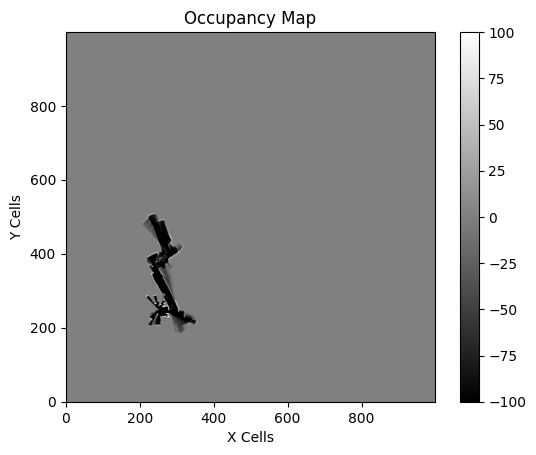

iteration 2101
resampling done
iteration 2102
resampling done
iteration 2103
resampling done
iteration 2104
resampling done
iteration 2105
resampling done
iteration 2106
resampling done
iteration 2107
resampling done
iteration 2108
resampling done
iteration 2109
resampling done
iteration 2110
resampling done
iteration 2111
resampling done
iteration 2112
resampling done
iteration 2113
resampling done
iteration 2114
resampling done
iteration 2115
resampling done
iteration 2116
resampling done
iteration 2117
resampling done
iteration 2118
resampling done
iteration 2119
resampling done
iteration 2120
resampling done
iteration 2121
resampling done
iteration 2122
resampling done
iteration 2123
resampling done
iteration 2124
resampling done
iteration 2125
resampling done
iteration 2126
resampling done
iteration 2127
resampling done
iteration 2128
resampling done
iteration 2129
resampling done
iteration 2130
resampling done
iteration 2131
resampling done
iteration 2132
resampling done
iteratio

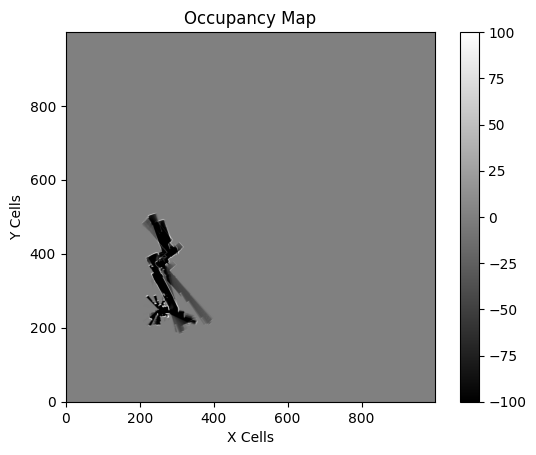

iteration 2201
resampling done
iteration 2202
resampling done
iteration 2203
resampling done
iteration 2204
resampling done
iteration 2205
resampling done
iteration 2206
resampling done
iteration 2207
resampling done
iteration 2208
iteration 2209
resampling done
iteration 2210
resampling done
iteration 2211
resampling done
iteration 2212
resampling done
iteration 2213
resampling done
iteration 2214
resampling done
iteration 2215
resampling done
iteration 2216
iteration 2217
resampling done
iteration 2218
iteration 2219
resampling done
iteration 2220
iteration 2221
iteration 2222
iteration 2223
resampling done
iteration 2224
iteration 2225
iteration 2226
iteration 2227
iteration 2228
iteration 2229
resampling done
iteration 2230
iteration 2231
resampling done
iteration 2232
resampling done
iteration 2233
resampling done
iteration 2234
resampling done
iteration 2235
resampling done
iteration 2236
resampling done
iteration 2237
resampling done
iteration 2238
resampling done
iteration 2239

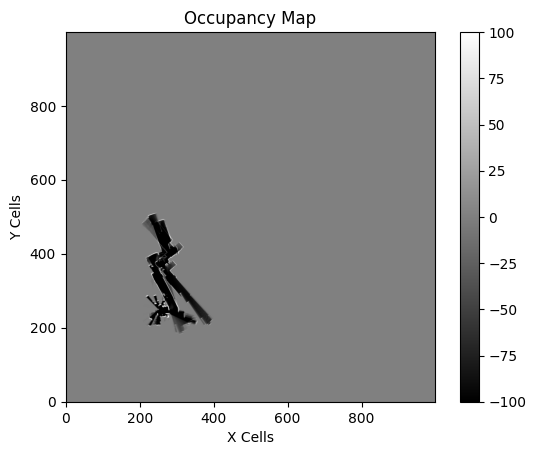

iteration 2301
iteration 2302
resampling done
iteration 2303
resampling done
iteration 2304
iteration 2305
iteration 2306
resampling done
iteration 2307
iteration 2308
resampling done
iteration 2309
resampling done
iteration 2310
iteration 2311
resampling done
iteration 2312
resampling done
iteration 2313
resampling done
iteration 2314
resampling done
iteration 2315
resampling done
iteration 2316
resampling done
iteration 2317
resampling done
iteration 2318
resampling done
iteration 2319
iteration 2320
iteration 2321
resampling done
iteration 2322
resampling done
iteration 2323
iteration 2324
iteration 2325
iteration 2326
resampling done
iteration 2327
iteration 2328
iteration 2329
resampling done
iteration 2330
iteration 2331
iteration 2332
iteration 2333
resampling done
iteration 2334
resampling done
iteration 2335
resampling done
iteration 2336
iteration 2337
resampling done
iteration 2338
iteration 2339
iteration 2340
iteration 2341
iteration 2342
resampling done
iteration 2343
ite

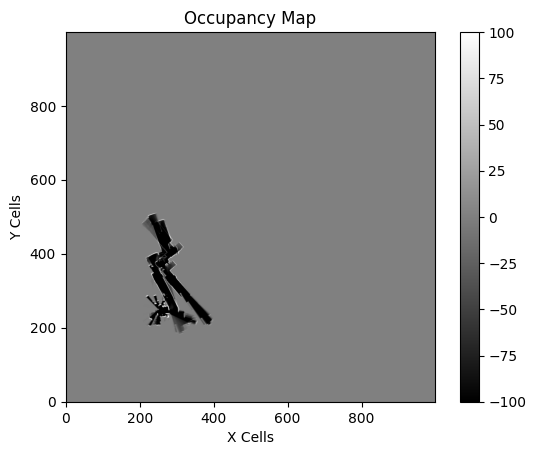

iteration 2401
iteration 2402
iteration 2403
iteration 2404
iteration 2405
iteration 2406
iteration 2407
iteration 2408
iteration 2409
iteration 2410
resampling done
iteration 2411
iteration 2412
iteration 2413
iteration 2414
iteration 2415
iteration 2416
iteration 2417
resampling done
iteration 2418
iteration 2419
iteration 2420
iteration 2421
iteration 2422
resampling done
iteration 2423
iteration 2424
resampling done
iteration 2425
iteration 2426
iteration 2427
resampling done
iteration 2428
iteration 2429
resampling done
iteration 2430
iteration 2431
iteration 2432
iteration 2433
iteration 2434
iteration 2435
iteration 2436
iteration 2437
iteration 2438
resampling done
iteration 2439
iteration 2440
resampling done
iteration 2441
iteration 2442
iteration 2443
iteration 2444
iteration 2445
iteration 2446
iteration 2447
iteration 2448
iteration 2449
iteration 2450
resampling done
iteration 2451
iteration 2452
iteration 2453
resampling done
iteration 2454
iteration 2455
iteration 2456


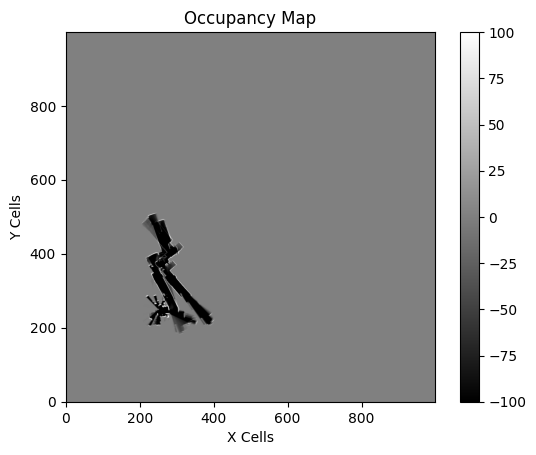

iteration 2501
iteration 2502
iteration 2503
iteration 2504
iteration 2505
iteration 2506
iteration 2507
iteration 2508
iteration 2509
resampling done
iteration 2510
iteration 2511
iteration 2512
iteration 2513
iteration 2514
iteration 2515
resampling done
iteration 2516
iteration 2517
iteration 2518
iteration 2519
iteration 2520
resampling done
iteration 2521
iteration 2522
iteration 2523
iteration 2524
iteration 2525
iteration 2526
iteration 2527
iteration 2528
iteration 2529
iteration 2530
iteration 2531
iteration 2532
iteration 2533
iteration 2534
iteration 2535
iteration 2536
iteration 2537
iteration 2538
iteration 2539
resampling done
iteration 2540
iteration 2541
iteration 2542
iteration 2543
iteration 2544
iteration 2545
iteration 2546
iteration 2547
iteration 2548
iteration 2549
iteration 2550
iteration 2551
iteration 2552
iteration 2553
iteration 2554
iteration 2555
iteration 2556
iteration 2557
iteration 2558
iteration 2559
iteration 2560
resampling done
iteration 2561
resam

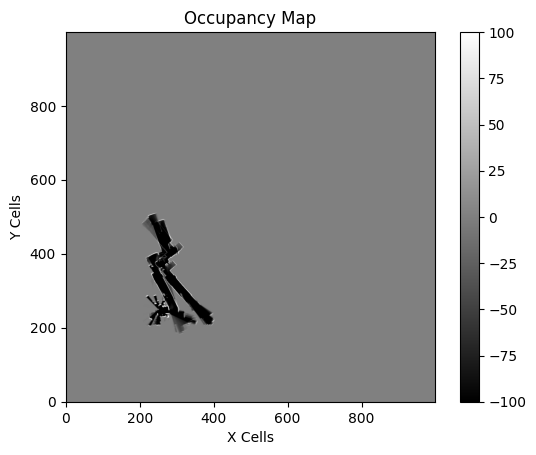

iteration 2601
iteration 2602
resampling done
iteration 2603
resampling done
iteration 2604
resampling done
iteration 2605
resampling done
iteration 2606
iteration 2607
iteration 2608
resampling done
iteration 2609
iteration 2610
iteration 2611
resampling done
iteration 2612
resampling done
iteration 2613
resampling done
iteration 2614
resampling done
iteration 2615
resampling done
iteration 2616
iteration 2617
resampling done
iteration 2618
iteration 2619
iteration 2620
resampling done
iteration 2621
resampling done
iteration 2622
resampling done
iteration 2623
resampling done
iteration 2624
resampling done
iteration 2625
resampling done
iteration 2626
iteration 2627
resampling done
iteration 2628
resampling done
iteration 2629
resampling done
iteration 2630
iteration 2631
resampling done
iteration 2632
resampling done
iteration 2633
iteration 2634
resampling done
iteration 2635
iteration 2636
resampling done
iteration 2637
iteration 2638
resampling done
iteration 2639
iteration 2640


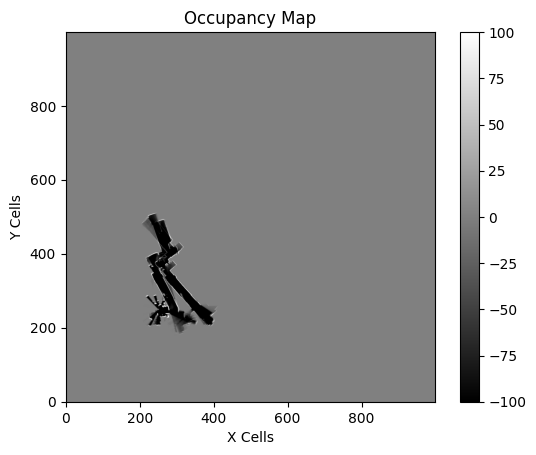

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
iteration 2704
resampling done
iteration 2705
resampling done
iteration 2706
resampling done
iteration 2707
resampling done
iteration 2708
resampling done
iteration 2709
resampling done
iteration 2710
resampling done
iteration 2711
resampling done
iteration 2712
resampling done
iteration 2713
resampling done
iteration 2714
iteration 2715
resampling done
iteration 2716
resampling done
iteration 2717
resampling done
iteration 2718
iteration 2719
resampling done
iteration 2720
resampling done
iteration 2721
iteration 2722
iteration 2723
iteration 2724
resampling done
iteration 2725
iteration 2726
iteration 2727
iteration 2728
resampling done
iteration 2729
iteration 2730
iteration 2731
iteration 2732
resampling done
iteration 2733
iteration 2734
iteration 2735
resampling done
iteration 2736
resampling done
iteration 2737
iteration 2738
iteration 2739
iteration 2740
resampling done
iteration 2741
iteration 2742
re

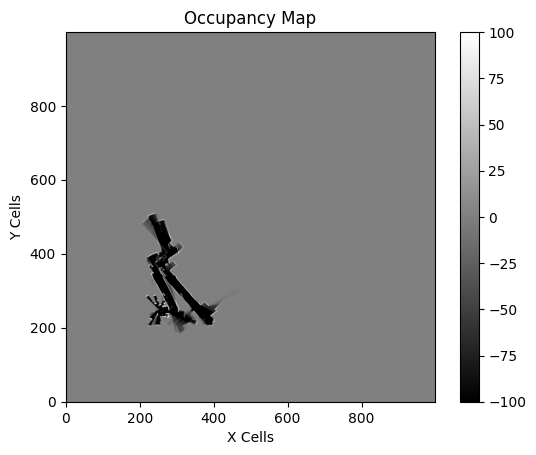

iteration 2801
iteration 2802
iteration 2803
iteration 2804
iteration 2805
iteration 2806
iteration 2807
resampling done
iteration 2808
iteration 2809
iteration 2810
iteration 2811
iteration 2812
resampling done
iteration 2813
iteration 2814
iteration 2815
iteration 2816
iteration 2817
iteration 2818
iteration 2819
resampling done
iteration 2820
iteration 2821
iteration 2822
iteration 2823
iteration 2824
iteration 2825
iteration 2826
iteration 2827
iteration 2828
iteration 2829
iteration 2830
resampling done
iteration 2831
iteration 2832
resampling done
iteration 2833
resampling done
iteration 2834
iteration 2835
iteration 2836
resampling done
iteration 2837
iteration 2838
iteration 2839
resampling done
iteration 2840
iteration 2841
iteration 2842
resampling done
iteration 2843
resampling done
iteration 2844
resampling done
iteration 2845
resampling done
iteration 2846
resampling done
iteration 2847
resampling done
iteration 2848
resampling done
iteration 2849
resampling done
iteration

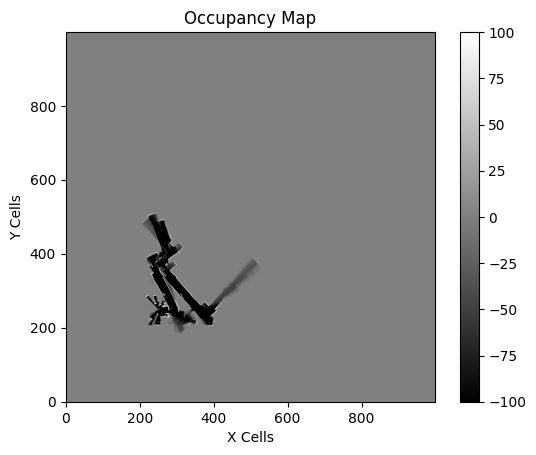

iteration 2901
iteration 2902
iteration 2903
iteration 2904
iteration 2905
iteration 2906
iteration 2907
iteration 2908
iteration 2909
iteration 2910
iteration 2911
iteration 2912
iteration 2913
iteration 2914
iteration 2915
iteration 2916
iteration 2917
resampling done
iteration 2918
iteration 2919
iteration 2920
iteration 2921
iteration 2922
iteration 2923
iteration 2924
iteration 2925
iteration 2926
iteration 2927
iteration 2928
iteration 2929
iteration 2930
iteration 2931
iteration 2932
iteration 2933
iteration 2934
iteration 2935
iteration 2936
iteration 2937
iteration 2938
iteration 2939
iteration 2940
iteration 2941
resampling done
iteration 2942
iteration 2943
iteration 2944
iteration 2945
iteration 2946
iteration 2947
iteration 2948
iteration 2949
iteration 2950
iteration 2951
iteration 2952
iteration 2953
iteration 2954
iteration 2955
resampling done
iteration 2956
iteration 2957
iteration 2958
iteration 2959
iteration 2960
iteration 2961
iteration 2962
resampling done
iterat

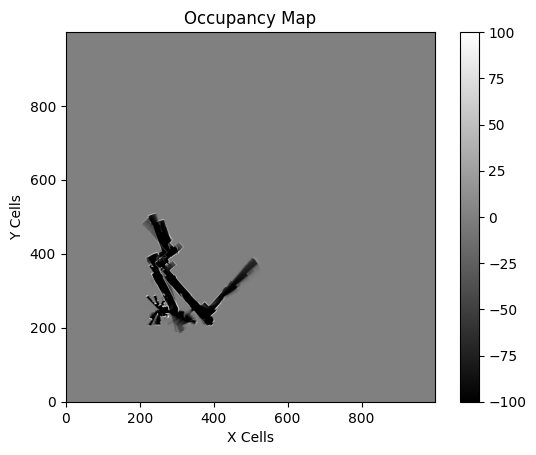

iteration 3001
resampling done
iteration 3002
iteration 3003
resampling done
iteration 3004
iteration 3005
iteration 3006
resampling done
iteration 3007
iteration 3008
iteration 3009
iteration 3010
iteration 3011
iteration 3012
iteration 3013
resampling done
iteration 3014
iteration 3015
iteration 3016
iteration 3017
resampling done
iteration 3018
iteration 3019
iteration 3020
iteration 3021
iteration 3022
iteration 3023
iteration 3024
resampling done
iteration 3025
iteration 3026
iteration 3027
resampling done
iteration 3028
iteration 3029
iteration 3030
iteration 3031
resampling done
iteration 3032
resampling done
iteration 3033
resampling done
iteration 3034
resampling done
iteration 3035
resampling done
iteration 3036
iteration 3037
resampling done
iteration 3038
iteration 3039
iteration 3040
resampling done
iteration 3041
iteration 3042
iteration 3043
resampling done
iteration 3044
iteration 3045
iteration 3046
iteration 3047
resampling done
iteration 3048
iteration 3049
resamplin

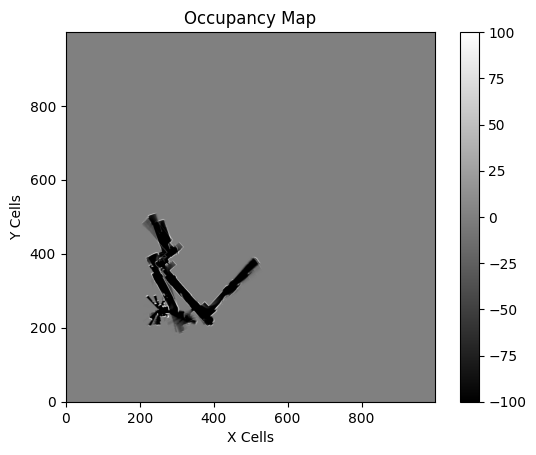

iteration 3101
iteration 3102
iteration 3103
iteration 3104
resampling done
iteration 3105
iteration 3106
resampling done
iteration 3107
iteration 3108
iteration 3109
iteration 3110
iteration 3111
iteration 3112
iteration 3113
iteration 3114
iteration 3115
resampling done
iteration 3116
iteration 3117
iteration 3118
iteration 3119
iteration 3120
resampling done
iteration 3121
iteration 3122
iteration 3123
iteration 3124
iteration 3125
resampling done
iteration 3126
iteration 3127
iteration 3128
iteration 3129
resampling done
iteration 3130
iteration 3131
resampling done
iteration 3132
iteration 3133
iteration 3134
iteration 3135
iteration 3136
resampling done
iteration 3137
iteration 3138
iteration 3139
resampling done
iteration 3140
resampling done
iteration 3141
iteration 3142
resampling done
iteration 3143
iteration 3144
resampling done
iteration 3145
iteration 3146
iteration 3147
resampling done
iteration 3148
iteration 3149
iteration 3150
resampling done
iteration 3151
iteration 3

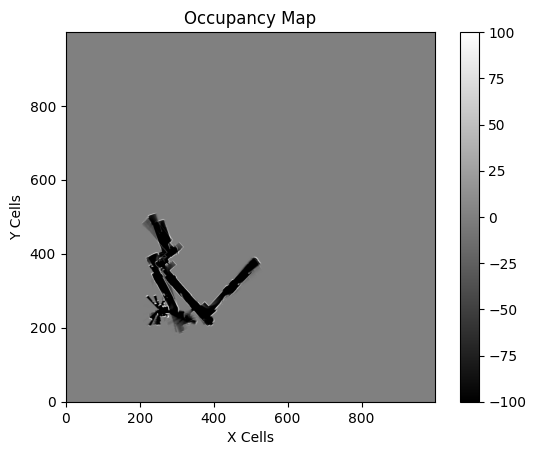

iteration 3201
iteration 3202
resampling done
iteration 3203
iteration 3204
iteration 3205
iteration 3206
resampling done
iteration 3207
iteration 3208
resampling done
iteration 3209
iteration 3210
iteration 3211
iteration 3212
iteration 3213
iteration 3214
resampling done
iteration 3215
iteration 3216
resampling done
iteration 3217
iteration 3218
resampling done
iteration 3219
iteration 3220
iteration 3221
resampling done
iteration 3222
resampling done
iteration 3223
iteration 3224
resampling done
iteration 3225
resampling done
iteration 3226
iteration 3227
iteration 3228
iteration 3229
resampling done
iteration 3230
iteration 3231
iteration 3232
resampling done
iteration 3233
iteration 3234
iteration 3235
resampling done
iteration 3236
iteration 3237
iteration 3238
iteration 3239
iteration 3240
resampling done
iteration 3241
iteration 3242
iteration 3243
iteration 3244
iteration 3245
resampling done
iteration 3246
resampling done
iteration 3247
resampling done
iteration 3248
resampli

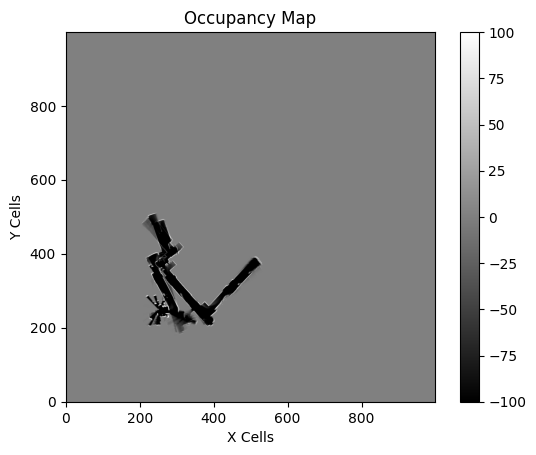

iteration 3301
resampling done
iteration 3302
resampling done
iteration 3303
resampling done
iteration 3304
resampling done
iteration 3305
resampling done
iteration 3306
resampling done
iteration 3307
resampling done
iteration 3308
resampling done
iteration 3309
resampling done
iteration 3310
resampling done
iteration 3311
resampling done
iteration 3312
resampling done
iteration 3313
resampling done
iteration 3314
resampling done
iteration 3315
iteration 3316
iteration 3317
resampling done
iteration 3318
resampling done
iteration 3319
iteration 3320
resampling done
iteration 3321
resampling done
iteration 3322
resampling done
iteration 3323
resampling done
iteration 3324
resampling done
iteration 3325
resampling done
iteration 3326
resampling done
iteration 3327
resampling done
iteration 3328
resampling done
iteration 3329
resampling done
iteration 3330
iteration 3331
resampling done
iteration 3332
iteration 3333
resampling done
iteration 3334
resampling done
iteration 3335
iteration 3

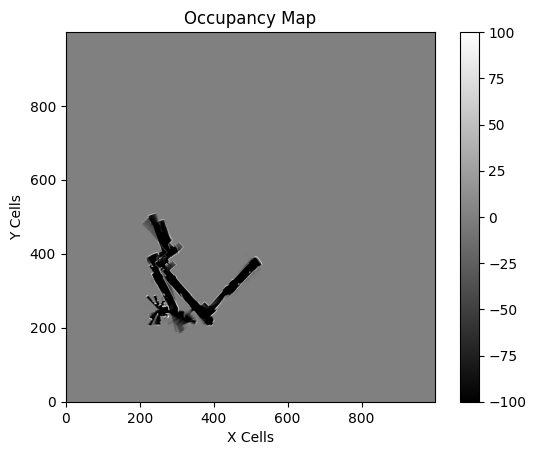

iteration 3401
resampling done
iteration 3402
resampling done
iteration 3403
iteration 3404
resampling done
iteration 3405
resampling done
iteration 3406
resampling done
iteration 3407
resampling done
iteration 3408
resampling done
iteration 3409
iteration 3410
resampling done
iteration 3411
resampling done
iteration 3412
resampling done
iteration 3413
resampling done
iteration 3414
resampling done
iteration 3415
resampling done
iteration 3416
resampling done
iteration 3417
resampling done
iteration 3418
resampling done
iteration 3419
resampling done
iteration 3420
resampling done
iteration 3421
resampling done
iteration 3422
resampling done
iteration 3423
resampling done
iteration 3424
resampling done
iteration 3425
resampling done
iteration 3426
resampling done
iteration 3427
resampling done
iteration 3428
resampling done
iteration 3429
resampling done
iteration 3430
resampling done
iteration 3431
resampling done
iteration 3432
resampling done
iteration 3433
resampling done
iteration

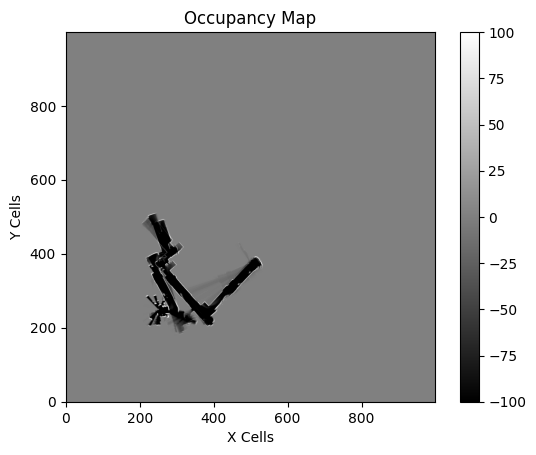

iteration 3501
resampling done
iteration 3502
resampling done
iteration 3503
resampling done
iteration 3504
resampling done
iteration 3505
resampling done
iteration 3506
resampling done
iteration 3507
resampling done
iteration 3508
resampling done
iteration 3509
resampling done
iteration 3510
resampling done
iteration 3511
resampling done
iteration 3512
resampling done
iteration 3513
resampling done
iteration 3514
resampling done
iteration 3515
resampling done
iteration 3516
resampling done
iteration 3517
resampling done
iteration 3518
resampling done
iteration 3519
resampling done
iteration 3520
resampling done
iteration 3521
resampling done
iteration 3522
resampling done
iteration 3523
resampling done
iteration 3524
resampling done
iteration 3525
resampling done
iteration 3526
resampling done
iteration 3527
resampling done
iteration 3528
resampling done
iteration 3529
resampling done
iteration 3530
resampling done
iteration 3531
resampling done
iteration 3532
resampling done
iteratio

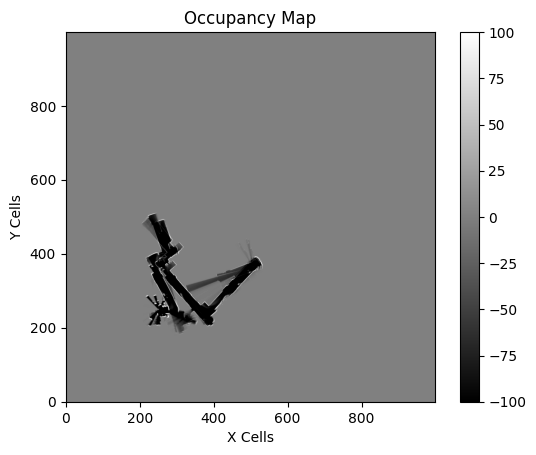

iteration 3601
resampling done
iteration 3602
resampling done
iteration 3603
resampling done
iteration 3604
resampling done
iteration 3605
resampling done
iteration 3606
resampling done
iteration 3607
resampling done
iteration 3608
resampling done
iteration 3609
resampling done
iteration 3610
resampling done
iteration 3611
resampling done
iteration 3612
resampling done
iteration 3613
resampling done
iteration 3614
resampling done
iteration 3615
resampling done
iteration 3616
resampling done
iteration 3617
resampling done
iteration 3618
resampling done
iteration 3619
resampling done
iteration 3620
resampling done
iteration 3621
resampling done
iteration 3622
resampling done
iteration 3623
resampling done
iteration 3624
resampling done
iteration 3625
resampling done
iteration 3626
resampling done
iteration 3627
resampling done
iteration 3628
resampling done
iteration 3629
resampling done
iteration 3630
resampling done
iteration 3631
resampling done
iteration 3632
resampling done
iteratio

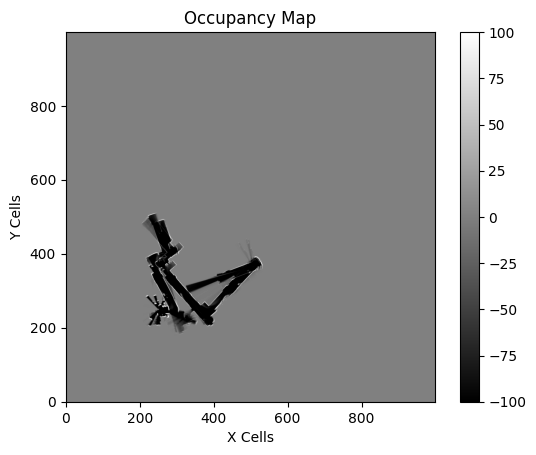

iteration 3701
resampling done
iteration 3702
iteration 3703
iteration 3704
iteration 3705
resampling done
iteration 3706
iteration 3707
resampling done
iteration 3708
iteration 3709
resampling done
iteration 3710
resampling done
iteration 3711
iteration 3712
resampling done
iteration 3713
iteration 3714
iteration 3715
resampling done
iteration 3716
iteration 3717
resampling done
iteration 3718
iteration 3719
iteration 3720
resampling done
iteration 3721
iteration 3722
iteration 3723
resampling done
iteration 3724
iteration 3725
iteration 3726
resampling done
iteration 3727
iteration 3728
iteration 3729
iteration 3730
iteration 3731
resampling done
iteration 3732
iteration 3733
iteration 3734
iteration 3735
iteration 3736
iteration 3737
iteration 3738
iteration 3739
resampling done
iteration 3740
resampling done
iteration 3741
resampling done
iteration 3742
iteration 3743
resampling done
iteration 3744
iteration 3745
resampling done
iteration 3746
iteration 3747
resampling done
iterati

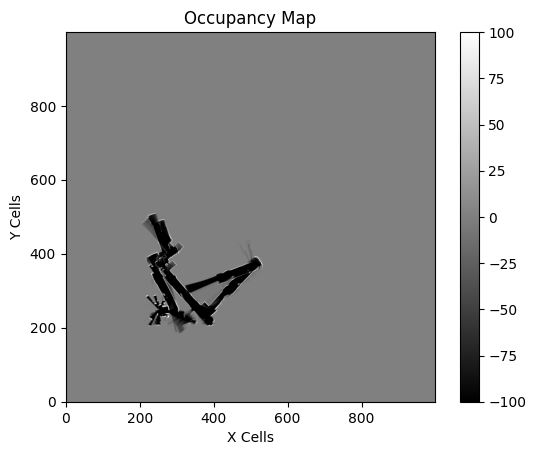

iteration 3801
iteration 3802
resampling done
iteration 3803
iteration 3804
resampling done
iteration 3805
resampling done
iteration 3806
resampling done
iteration 3807
resampling done
iteration 3808
resampling done
iteration 3809
resampling done
iteration 3810
resampling done
iteration 3811
resampling done
iteration 3812
iteration 3813
resampling done
iteration 3814
resampling done
iteration 3815
resampling done
iteration 3816
resampling done
iteration 3817
iteration 3818
resampling done
iteration 3819
iteration 3820
iteration 3821
resampling done
iteration 3822
iteration 3823
iteration 3824
resampling done
iteration 3825
iteration 3826
iteration 3827
iteration 3828
iteration 3829
iteration 3830
iteration 3831
iteration 3832
iteration 3833
iteration 3834
resampling done
iteration 3835
iteration 3836
iteration 3837
iteration 3838
iteration 3839
iteration 3840
iteration 3841
iteration 3842
iteration 3843
resampling done
iteration 3844
iteration 3845
iteration 3846
iteration 3847
iterati

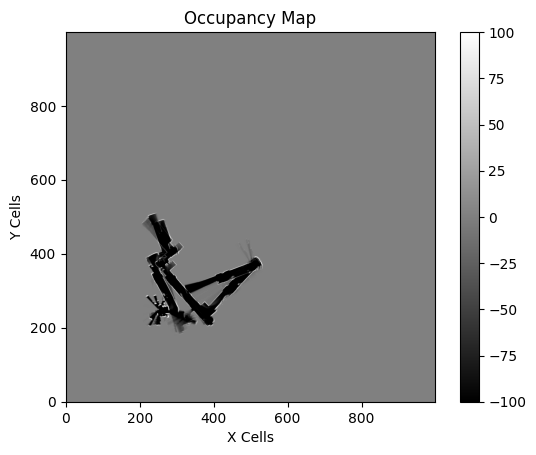

iteration 3901
iteration 3902
iteration 3903
resampling done
iteration 3904
iteration 3905
resampling done
iteration 3906
iteration 3907
resampling done
iteration 3908
iteration 3909
resampling done
iteration 3910
iteration 3911
iteration 3912
resampling done
iteration 3913
iteration 3914
iteration 3915
resampling done
iteration 3916
resampling done
iteration 3917
iteration 3918
iteration 3919
resampling done
iteration 3920
iteration 3921
resampling done
iteration 3922
iteration 3923
iteration 3924
resampling done
iteration 3925
iteration 3926
iteration 3927
iteration 3928
resampling done
iteration 3929
iteration 3930
resampling done
iteration 3931
iteration 3932
resampling done
iteration 3933
resampling done
iteration 3934
resampling done
iteration 3935
iteration 3936
iteration 3937
resampling done
iteration 3938
resampling done
iteration 3939
resampling done
iteration 3940
resampling done
iteration 3941
resampling done
iteration 3942
resampling done
iteration 3943
resampling done
ite

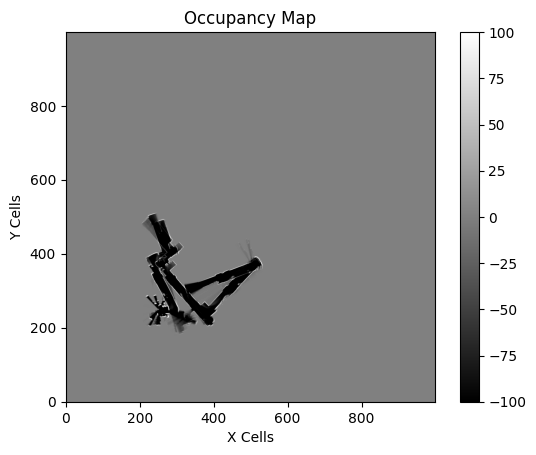

iteration 4001
resampling done
iteration 4002
resampling done
iteration 4003
resampling done
iteration 4004
resampling done
iteration 4005
resampling done
iteration 4006
resampling done
iteration 4007
iteration 4008
resampling done
iteration 4009
iteration 4010
resampling done
iteration 4011
resampling done
iteration 4012
resampling done
iteration 4013
resampling done
iteration 4014
resampling done
iteration 4015
resampling done
iteration 4016
resampling done
iteration 4017
resampling done
iteration 4018
resampling done
iteration 4019
iteration 4020
iteration 4021
resampling done
iteration 4022
iteration 4023
resampling done
iteration 4024
resampling done
iteration 4025
resampling done
iteration 4026
iteration 4027
iteration 4028
resampling done
iteration 4029
iteration 4030
resampling done
iteration 4031
iteration 4032
iteration 4033
resampling done
iteration 4034
iteration 4035
resampling done
iteration 4036
iteration 4037
resampling done
iteration 4038
iteration 4039
resampling done

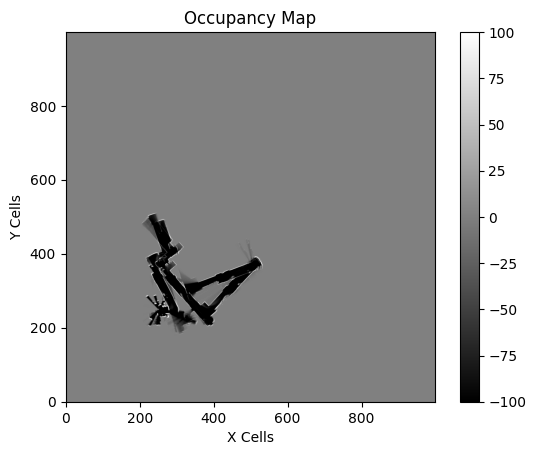

iteration 4101
resampling done
iteration 4102
resampling done
iteration 4103
resampling done
iteration 4104
resampling done
iteration 4105
resampling done
iteration 4106
resampling done
iteration 4107
resampling done
iteration 4108
iteration 4109
resampling done
iteration 4110
resampling done
iteration 4111
resampling done
iteration 4112
resampling done
iteration 4113
resampling done
iteration 4114
resampling done
iteration 4115
iteration 4116
resampling done
iteration 4117
resampling done
iteration 4118
resampling done
iteration 4119
iteration 4120
resampling done
iteration 4121
resampling done
iteration 4122
resampling done
iteration 4123
resampling done
iteration 4124
iteration 4125
resampling done
iteration 4126
resampling done
iteration 4127
resampling done
iteration 4128
resampling done
iteration 4129
resampling done
iteration 4130
resampling done
iteration 4131
resampling done
iteration 4132
resampling done
iteration 4133
resampling done
iteration 4134
resampling done
iteration 

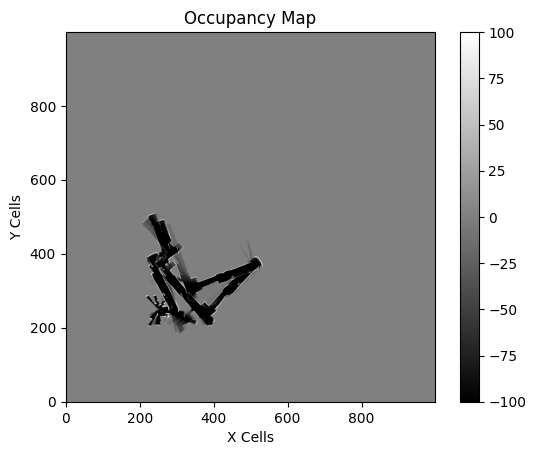

iteration 4201
resampling done
iteration 4202
resampling done
iteration 4203
resampling done
iteration 4204
resampling done
iteration 4205
resampling done
iteration 4206
iteration 4207
resampling done
iteration 4208
iteration 4209
iteration 4210
iteration 4211
iteration 4212
resampling done
iteration 4213
iteration 4214
iteration 4215
resampling done
iteration 4216
iteration 4217
iteration 4218
iteration 4219
resampling done
iteration 4220
iteration 4221
iteration 4222
iteration 4223
resampling done
iteration 4224
resampling done
iteration 4225
iteration 4226
iteration 4227
resampling done
iteration 4228
resampling done
iteration 4229
resampling done
iteration 4230
iteration 4231
iteration 4232
resampling done
iteration 4233
iteration 4234
iteration 4235
iteration 4236
iteration 4237
iteration 4238
iteration 4239
iteration 4240
iteration 4241
iteration 4242
iteration 4243
resampling done
iteration 4244
iteration 4245
resampling done
iteration 4246
iteration 4247
iteration 4248
iteratio

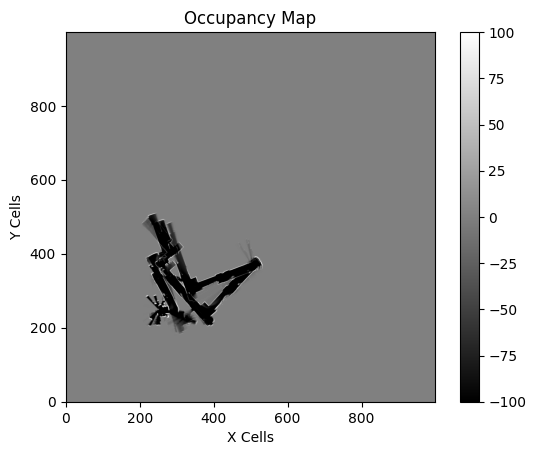

iteration 4301
resampling done
iteration 4302
resampling done
iteration 4303
resampling done
iteration 4304
resampling done
iteration 4305
resampling done
iteration 4306
resampling done
iteration 4307
resampling done
iteration 4308
resampling done
iteration 4309
resampling done
iteration 4310
resampling done
iteration 4311
resampling done
iteration 4312
resampling done
iteration 4313
resampling done
iteration 4314
resampling done
iteration 4315
resampling done
iteration 4316
resampling done
iteration 4317
resampling done
iteration 4318
resampling done
iteration 4319
resampling done
iteration 4320
resampling done
iteration 4321
resampling done
iteration 4322
resampling done
iteration 4323
resampling done
iteration 4324
resampling done
iteration 4325
resampling done
iteration 4326
resampling done
iteration 4327
resampling done
iteration 4328
resampling done
iteration 4329
resampling done
iteration 4330
resampling done
iteration 4331
resampling done
iteration 4332
resampling done
iteratio

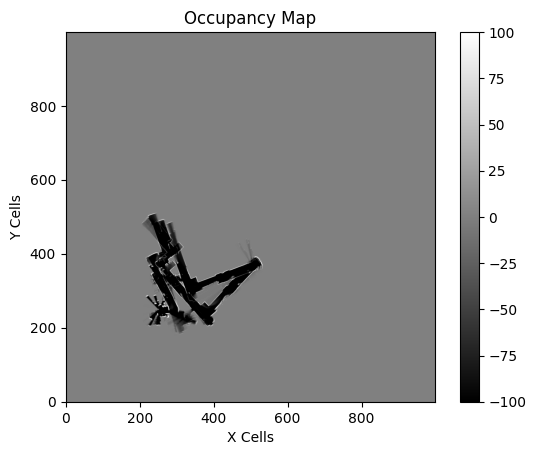

iteration 4401
resampling done
iteration 4402
resampling done
iteration 4403
resampling done
iteration 4404
resampling done
iteration 4405
resampling done
iteration 4406
resampling done
iteration 4407
resampling done
iteration 4408
resampling done
iteration 4409
resampling done
iteration 4410
resampling done
iteration 4411
resampling done
iteration 4412
resampling done
iteration 4413
resampling done
iteration 4414
resampling done
iteration 4415
resampling done
iteration 4416
resampling done
iteration 4417
resampling done
iteration 4418
resampling done
iteration 4419
resampling done
iteration 4420
resampling done
iteration 4421
resampling done
iteration 4422
resampling done
iteration 4423
resampling done
iteration 4424
resampling done
iteration 4425
resampling done
iteration 4426
resampling done
iteration 4427
resampling done
iteration 4428
resampling done
iteration 4429
resampling done
iteration 4430
resampling done
iteration 4431
resampling done
iteration 4432
resampling done
iteratio

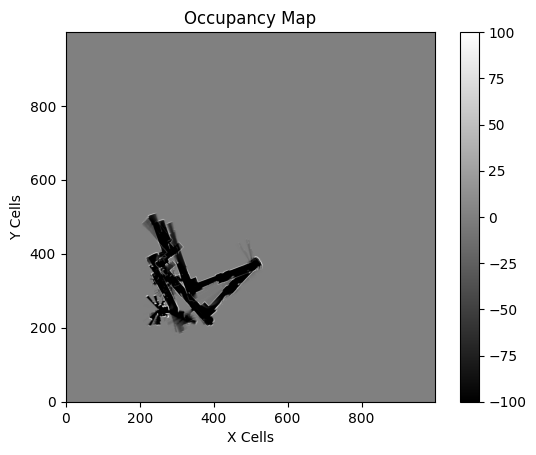

iteration 4501
resampling done
iteration 4502
resampling done
iteration 4503
resampling done
iteration 4504
resampling done
iteration 4505
resampling done
iteration 4506
resampling done
iteration 4507
resampling done
iteration 4508
resampling done
iteration 4509
resampling done
iteration 4510
resampling done
iteration 4511
resampling done
iteration 4512
resampling done
iteration 4513
resampling done
iteration 4514
resampling done
iteration 4515
resampling done
iteration 4516
resampling done
iteration 4517
resampling done
iteration 4518
resampling done
iteration 4519
resampling done
iteration 4520
resampling done
iteration 4521
resampling done
iteration 4522
resampling done
iteration 4523
resampling done
iteration 4524
resampling done
iteration 4525
resampling done
iteration 4526
resampling done
iteration 4527
resampling done
iteration 4528
resampling done
iteration 4529
resampling done
iteration 4530
resampling done
iteration 4531
resampling done
iteration 4532
resampling done
iteratio

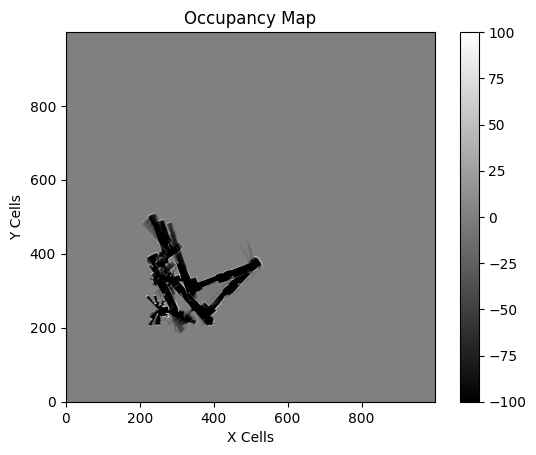

iteration 4601
resampling done
iteration 4602
resampling done
iteration 4603
resampling done
iteration 4604
resampling done
iteration 4605
resampling done
iteration 4606
resampling done
iteration 4607
resampling done
iteration 4608
resampling done
iteration 4609
resampling done
iteration 4610
resampling done
iteration 4611
resampling done
iteration 4612
resampling done
iteration 4613
resampling done
iteration 4614
resampling done
iteration 4615
resampling done
iteration 4616
resampling done
iteration 4617
resampling done
iteration 4618
resampling done
iteration 4619
resampling done
iteration 4620
resampling done
iteration 4621
iteration 4622
resampling done
iteration 4623
resampling done
iteration 4624
resampling done
iteration 4625
resampling done
iteration 4626
resampling done
iteration 4627
resampling done
iteration 4628
iteration 4629
iteration 4630
resampling done
iteration 4631
iteration 4632
resampling done
iteration 4633
resampling done
iteration 4634
iteration 4635
resampling 

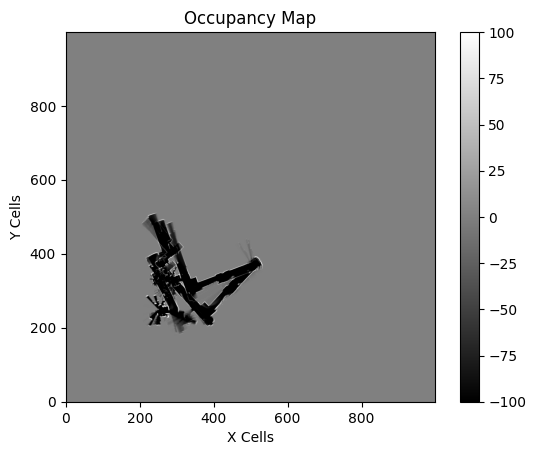

iteration 4701
iteration 4702
iteration 4703
resampling done
iteration 4704
iteration 4705
resampling done
iteration 4706
iteration 4707
iteration 4708
iteration 4709
iteration 4710
resampling done
iteration 4711
iteration 4712
iteration 4713
iteration 4714
resampling done
iteration 4715
iteration 4716
iteration 4717
iteration 4718
resampling done
iteration 4719
iteration 4720
resampling done
iteration 4721
resampling done
iteration 4722
iteration 4723
iteration 4724
resampling done
iteration 4725
iteration 4726
resampling done
iteration 4727
iteration 4728
iteration 4729
resampling done
iteration 4730
iteration 4731
iteration 4732
iteration 4733
iteration 4734
iteration 4735
iteration 4736
resampling done
iteration 4737
iteration 4738
iteration 4739
iteration 4740
resampling done
iteration 4741
iteration 4742
iteration 4743
iteration 4744
iteration 4745
iteration 4746
iteration 4747
iteration 4748
iteration 4749
iteration 4750
resampling done
iteration 4751
iteration 4752
iteration 47

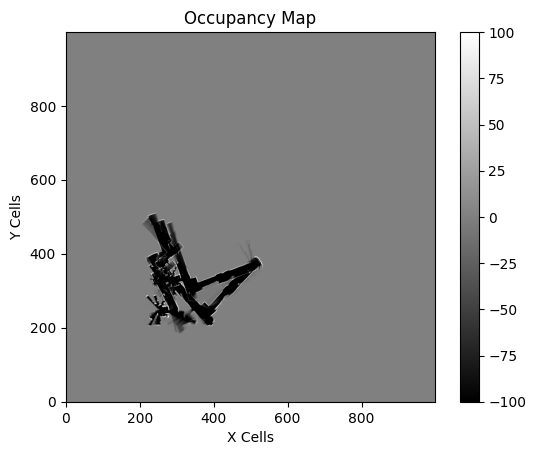

iteration 4801
iteration 4802
iteration 4803
resampling done
iteration 4804
iteration 4805
iteration 4806
iteration 4807
iteration 4808
iteration 4809
iteration 4810
iteration 4811
iteration 4812
iteration 4813
resampling done
iteration 4814
iteration 4815
resampling done
iteration 4816
resampling done
iteration 4817
iteration 4818
resampling done
iteration 4819
iteration 4820
iteration 4821
iteration 4822
iteration 4823
resampling done
iteration 4824
iteration 4825
iteration 4826
iteration 4827
iteration 4828
resampling done
iteration 4829
iteration 4830
iteration 4831
iteration 4832
iteration 4833
resampling done
iteration 4834
iteration 4835
iteration 4836
iteration 4837
iteration 4838
iteration 4839
iteration 4840
iteration 4841
iteration 4842
iteration 4843
iteration 4844
resampling done
iteration 4845
iteration 4846
iteration 4847
iteration 4848
iteration 4849
iteration 4850
resampling done
iteration 4851
iteration 4852
iteration 4853
iteration 4854
resampling done
iteration 4855

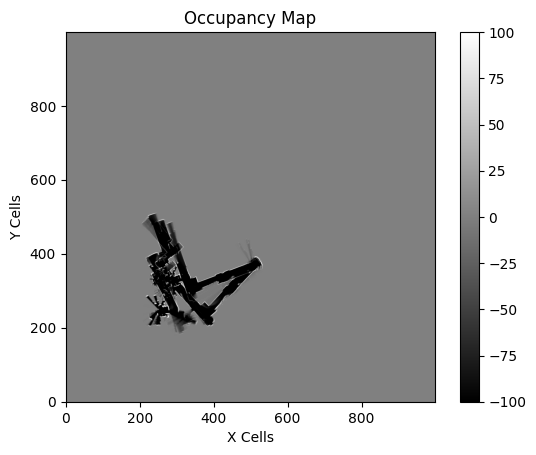

iteration 4901
resampling done
iteration 4902
iteration 4903
iteration 4904
iteration 4905
iteration 4906
iteration 4907
iteration 4908
iteration 4909
resampling done
iteration 4910
iteration 4911
iteration 4912
iteration 4913
iteration 4914
iteration 4915
iteration 4916
iteration 4917
iteration 4918
iteration 4919
iteration 4920
resampling done
iteration 4921
iteration 4922
iteration 4923
iteration 4924
iteration 4925
iteration 4926
iteration 4927
iteration 4928
iteration 4929
iteration 4930
resampling done
iteration 4931
iteration 4932
iteration 4933
iteration 4934
iteration 4935
iteration 4936
iteration 4937
iteration 4938
resampling done
iteration 4939
iteration 4940
iteration 4941
iteration 4942
iteration 4943
iteration 4944
resampling done
iteration 4945
resampling done
iteration 4946
resampling done
iteration 4947
iteration 4948
iteration 4949
iteration 4950
iteration 4951
resampling done
iteration 4952
iteration 4953
iteration 4954
iteration 4955


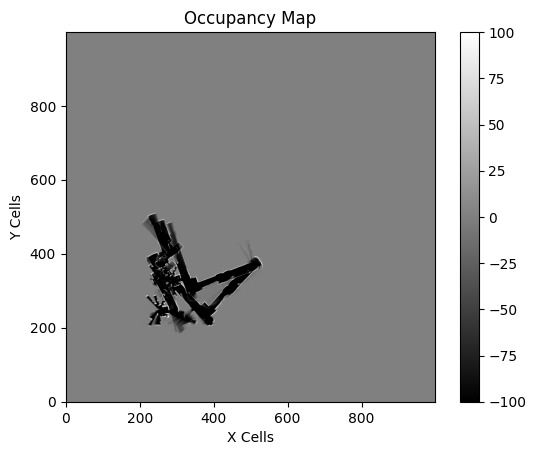

In [64]:
occupancymaps_all_0_bad_width = lidar_hits_2(FL_0,FR_0,RL_0,RR_0,ts_enc_0,encoder_ticks_to_meters,width_between_wheels,1.2,lidar_0,matched_lidar_indices_0,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

iteration 0


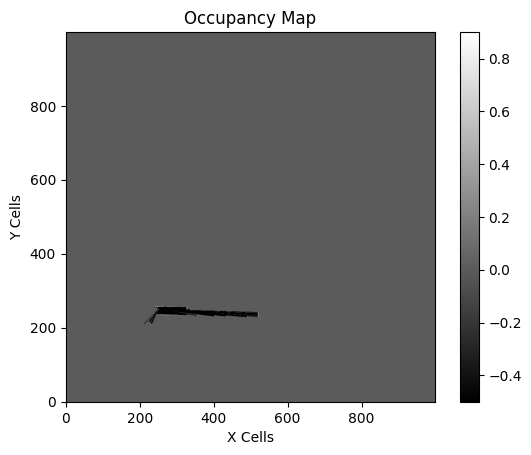

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
resampling done
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
resampling done
iteration 75
it

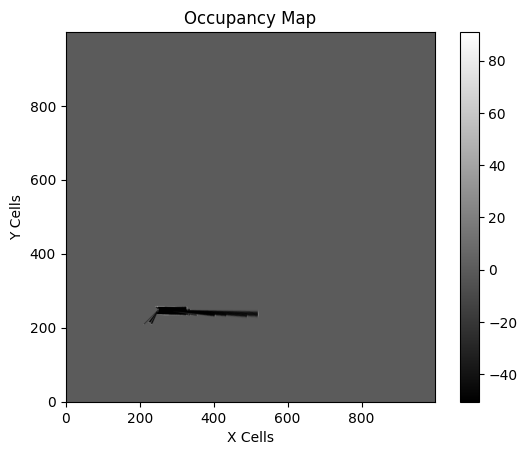

iteration 101
iteration 102
iteration 103
iteration 104
iteration 105
iteration 106
iteration 107
iteration 108
iteration 109
iteration 110
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
iteration 116
iteration 117
iteration 118
iteration 119
iteration 120
iteration 121
iteration 122
iteration 123
iteration 124
iteration 125
iteration 126
iteration 127
iteration 128
iteration 129
iteration 130
iteration 131
iteration 132
iteration 133
iteration 134
iteration 135
resampling done
iteration 136
iteration 137
iteration 138
iteration 139
iteration 140
iteration 141
iteration 142
iteration 143
iteration 144
iteration 145
iteration 146
iteration 147
iteration 148
iteration 149
iteration 150
iteration 151
iteration 152
resampling done
iteration 153
iteration 154
iteration 155
iteration 156
iteration 157
iteration 158
iteration 159
iteration 160
iteration 161
iteration 162
iteration 163
iteration 164
iteration 165
iteration 166
iteration 167
iteration 168
iteration 169
re

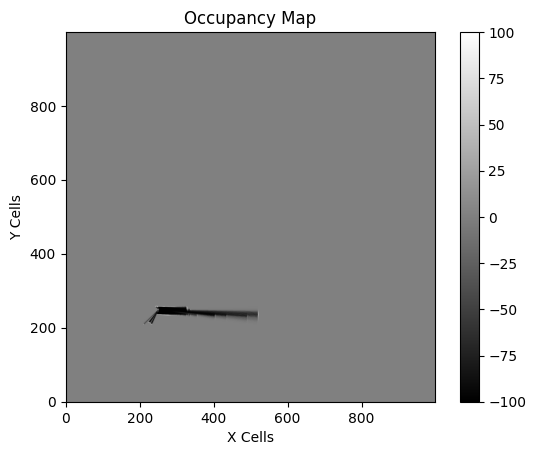

iteration 201
iteration 202
iteration 203
iteration 204
resampling done
iteration 205
iteration 206
iteration 207
iteration 208
iteration 209
iteration 210
iteration 211
iteration 212
iteration 213
iteration 214
iteration 215
iteration 216
iteration 217
resampling done
iteration 218
iteration 219
iteration 220
iteration 221
iteration 222
iteration 223
iteration 224
iteration 225
iteration 226
resampling done
iteration 227
iteration 228
iteration 229
iteration 230
iteration 231
iteration 232
iteration 233
iteration 234
iteration 235
iteration 236
iteration 237
iteration 238
resampling done
iteration 239
iteration 240
iteration 241
iteration 242
iteration 243
iteration 244
iteration 245
iteration 246
iteration 247
iteration 248
iteration 249
iteration 250
iteration 251
iteration 252
iteration 253
iteration 254
resampling done
iteration 255
iteration 256
iteration 257
resampling done
iteration 258
iteration 259
resampling done
iteration 260
iteration 261
resampling done
iteration 262
iter

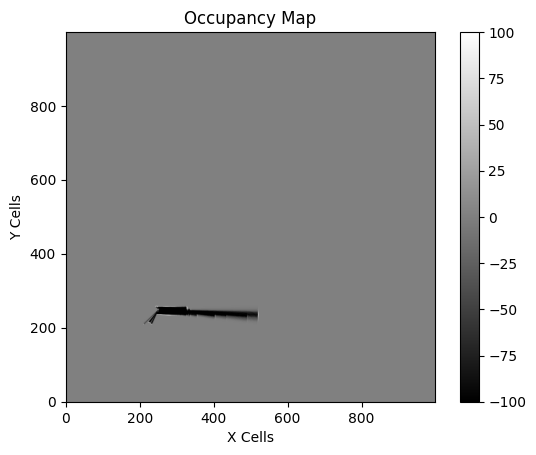

iteration 301
iteration 302
iteration 303
iteration 304
iteration 305
iteration 306
iteration 307
iteration 308
iteration 309
iteration 310
resampling done
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
iteration 317
iteration 318
iteration 319
iteration 320
iteration 321
iteration 322
iteration 323
iteration 324
iteration 325
iteration 326
resampling done
iteration 327
iteration 328
iteration 329
iteration 330
iteration 331
iteration 332
iteration 333
iteration 334
iteration 335
iteration 336
iteration 337
resampling done
iteration 338
iteration 339
iteration 340
iteration 341
iteration 342
iteration 343
iteration 344
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
iteration 353
iteration 354
iteration 355
iteration 356
resampling done
iteration 357
resampling done
iteration 358
iteration 359
iteration 360
iteration 361
iteration 362
iteration 363
iteration 364
iteration 365
iteration 

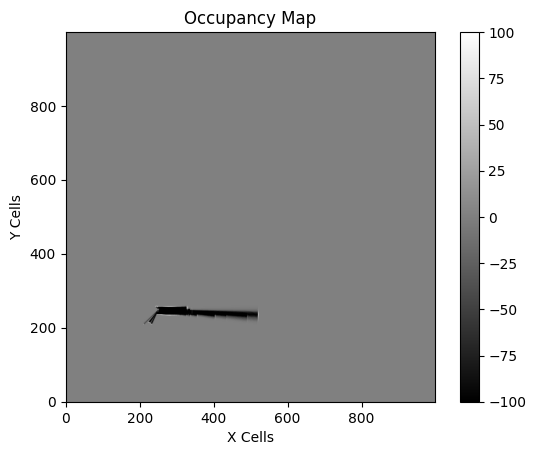

iteration 401
iteration 402
iteration 403
iteration 404
iteration 405
resampling done
iteration 406
iteration 407
iteration 408
iteration 409
iteration 410
iteration 411
iteration 412
resampling done
iteration 413
iteration 414
iteration 415
iteration 416
iteration 417
iteration 418
iteration 419
iteration 420
iteration 421
iteration 422
iteration 423
iteration 424
iteration 425
iteration 426
iteration 427
iteration 428
iteration 429
iteration 430
resampling done
iteration 431
iteration 432
iteration 433
iteration 434
iteration 435
iteration 436
iteration 437
iteration 438
iteration 439
iteration 440
iteration 441
iteration 442
iteration 443
iteration 444
resampling done
iteration 445
iteration 446
iteration 447
iteration 448
iteration 449
iteration 450
iteration 451
iteration 452
resampling done
iteration 453
iteration 454
resampling done
iteration 455
iteration 456
iteration 457
iteration 458
iteration 459
iteration 460
iteration 461
iteration 462
iteration 463
iteration 464
iteratio

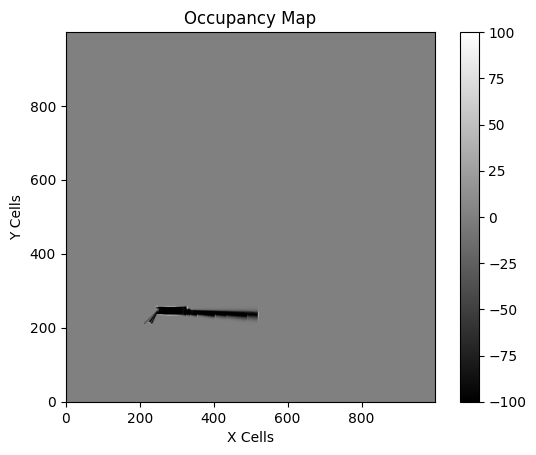

iteration 501
resampling done
iteration 502
resampling done
iteration 503
resampling done
iteration 504
resampling done
iteration 505
resampling done
iteration 506
resampling done
iteration 507
resampling done
iteration 508
resampling done
iteration 509
resampling done
iteration 510
resampling done
iteration 511
resampling done
iteration 512
resampling done
iteration 513
resampling done
iteration 514
resampling done
iteration 515
resampling done
iteration 516
resampling done
iteration 517
resampling done
iteration 518
resampling done
iteration 519
resampling done
iteration 520
resampling done
iteration 521
resampling done
iteration 522
iteration 523
iteration 524
iteration 525
resampling done
iteration 526
iteration 527
iteration 528
iteration 529
resampling done
iteration 530
iteration 531
resampling done
iteration 532
iteration 533
resampling done
iteration 534
resampling done
iteration 535
resampling done
iteration 536
resampling done
iteration 537
resampling done
iteration 538
resa

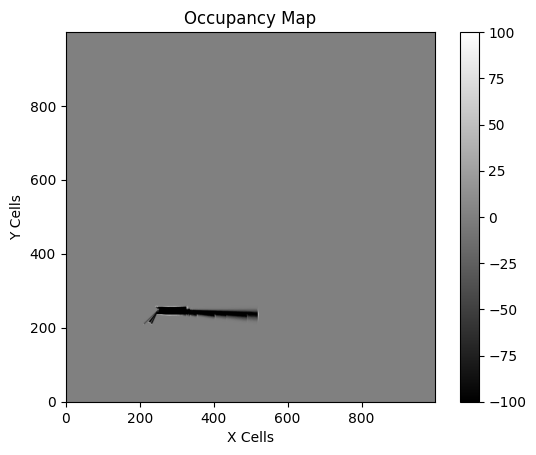

iteration 601
resampling done
iteration 602
resampling done
iteration 603
resampling done
iteration 604
resampling done
iteration 605
resampling done
iteration 606
resampling done
iteration 607
resampling done
iteration 608
resampling done
iteration 609
iteration 610
resampling done
iteration 611
resampling done
iteration 612
resampling done
iteration 613
resampling done
iteration 614
resampling done
iteration 615
iteration 616
resampling done
iteration 617
iteration 618
resampling done
iteration 619
iteration 620
resampling done
iteration 621
iteration 622
resampling done
iteration 623
resampling done
iteration 624
resampling done
iteration 625
resampling done
iteration 626
resampling done
iteration 627
resampling done
iteration 628
iteration 629
resampling done
iteration 630
resampling done
iteration 631
resampling done
iteration 632
resampling done
iteration 633
iteration 634
resampling done
iteration 635
resampling done
iteration 636
resampling done
iteration 637
resampling done
it

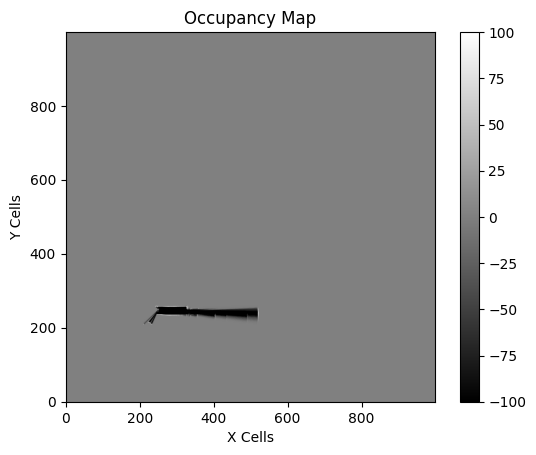

iteration 701
resampling done
iteration 702
resampling done
iteration 703
resampling done
iteration 704
resampling done
iteration 705
resampling done
iteration 706
resampling done
iteration 707
resampling done
iteration 708
resampling done
iteration 709
resampling done
iteration 710
resampling done
iteration 711
resampling done
iteration 712
resampling done
iteration 713
resampling done
iteration 714
resampling done
iteration 715
resampling done
iteration 716
resampling done
iteration 717
resampling done
iteration 718
resampling done
iteration 719
resampling done
iteration 720
resampling done
iteration 721
resampling done
iteration 722
resampling done
iteration 723
resampling done
iteration 724
resampling done
iteration 725
resampling done
iteration 726
resampling done
iteration 727
resampling done
iteration 728
resampling done
iteration 729
resampling done
iteration 730
resampling done
iteration 731
resampling done
iteration 732
resampling done
iteration 733
resampling done
iteration 

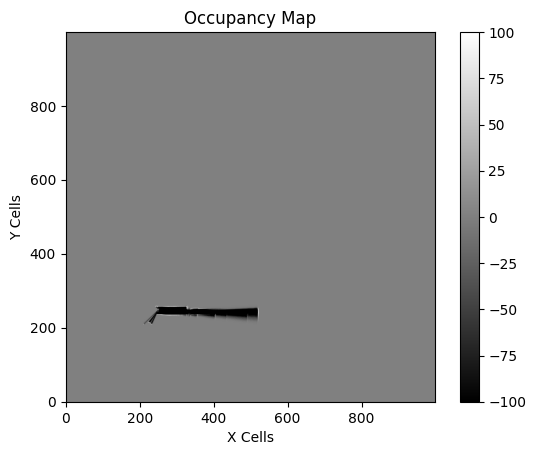

iteration 801
resampling done
iteration 802
resampling done
iteration 803
resampling done
iteration 804
resampling done
iteration 805
resampling done
iteration 806
resampling done
iteration 807
resampling done
iteration 808
resampling done
iteration 809
resampling done
iteration 810
resampling done
iteration 811
resampling done
iteration 812
resampling done
iteration 813
resampling done
iteration 814
resampling done
iteration 815
resampling done
iteration 816
resampling done
iteration 817
resampling done
iteration 818
resampling done
iteration 819
resampling done
iteration 820
resampling done
iteration 821
resampling done
iteration 822
resampling done
iteration 823
resampling done
iteration 824
resampling done
iteration 825
resampling done
iteration 826
resampling done
iteration 827
resampling done
iteration 828
resampling done
iteration 829
resampling done
iteration 830
resampling done
iteration 831
resampling done
iteration 832
resampling done
iteration 833
resampling done
iteration 

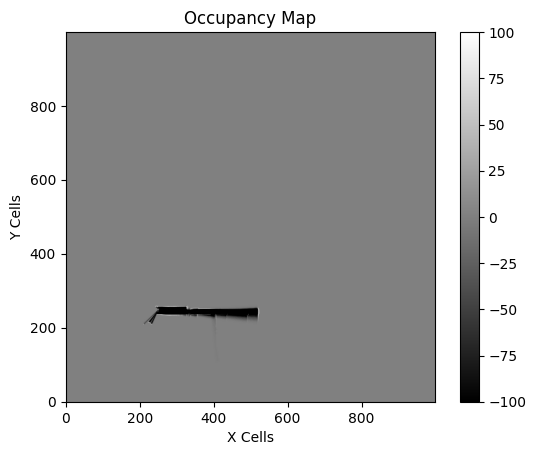

iteration 901
resampling done
iteration 902
resampling done
iteration 903
resampling done
iteration 904
resampling done
iteration 905
resampling done
iteration 906
resampling done
iteration 907
resampling done
iteration 908
resampling done
iteration 909
resampling done
iteration 910
resampling done
iteration 911
resampling done
iteration 912
resampling done
iteration 913
resampling done
iteration 914
resampling done
iteration 915
resampling done
iteration 916
resampling done
iteration 917
resampling done
iteration 918
resampling done
iteration 919
resampling done
iteration 920
resampling done
iteration 921
resampling done
iteration 922
resampling done
iteration 923
resampling done
iteration 924
resampling done
iteration 925
resampling done
iteration 926
resampling done
iteration 927
resampling done
iteration 928
resampling done
iteration 929
resampling done
iteration 930
resampling done
iteration 931
iteration 932
resampling done
iteration 933
resampling done
iteration 934
resampling d

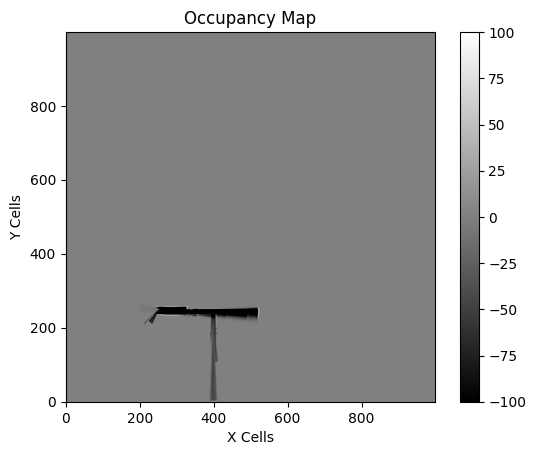

iteration 1001
iteration 1002
iteration 1003
iteration 1004
iteration 1005
resampling done
iteration 1006
iteration 1007
resampling done
iteration 1008
iteration 1009
iteration 1010
iteration 1011
resampling done
iteration 1012
iteration 1013
iteration 1014
iteration 1015
iteration 1016
iteration 1017
iteration 1018
iteration 1019
iteration 1020
iteration 1021
resampling done
iteration 1022
iteration 1023
iteration 1024
iteration 1025
iteration 1026
resampling done
iteration 1027
iteration 1028
iteration 1029
iteration 1030
resampling done
iteration 1031
iteration 1032
iteration 1033
iteration 1034
iteration 1035
iteration 1036
iteration 1037
iteration 1038
iteration 1039
iteration 1040
iteration 1041
iteration 1042
resampling done
iteration 1043
resampling done
iteration 1044
resampling done
iteration 1045
resampling done
iteration 1046
resampling done
iteration 1047
iteration 1048
iteration 1049
iteration 1050
iteration 1051
iteration 1052
iteration 1053
resampling done
iteration 105

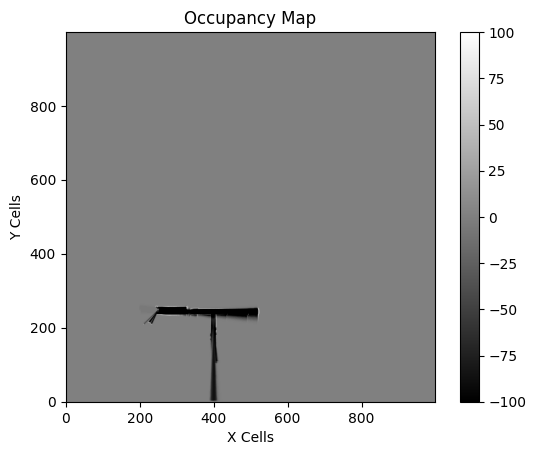

iteration 1101
iteration 1102
resampling done
iteration 1103
iteration 1104
iteration 1105
resampling done
iteration 1106
iteration 1107
resampling done
iteration 1108
iteration 1109
resampling done
iteration 1110
iteration 1111
iteration 1112
iteration 1113
iteration 1114
resampling done
iteration 1115
iteration 1116
iteration 1117
resampling done
iteration 1118
resampling done
iteration 1119
iteration 1120
resampling done
iteration 1121
iteration 1122
iteration 1123
resampling done
iteration 1124
iteration 1125
resampling done
iteration 1126
iteration 1127
iteration 1128
iteration 1129
resampling done
iteration 1130
iteration 1131
iteration 1132
resampling done
iteration 1133
resampling done
iteration 1134
iteration 1135
iteration 1136
iteration 1137
resampling done
iteration 1138
iteration 1139
iteration 1140
iteration 1141
resampling done
iteration 1142
iteration 1143
iteration 1144
iteration 1145
resampling done
iteration 1146
iteration 1147
resampling done
iteration 1148
iteratio

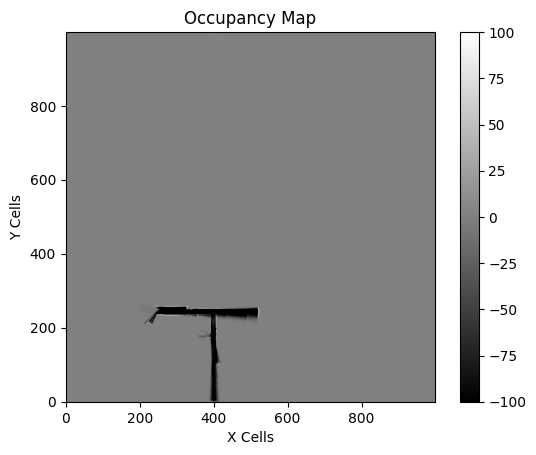

iteration 1201
resampling done
iteration 1202
resampling done
iteration 1203
iteration 1204
resampling done
iteration 1205
resampling done
iteration 1206
resampling done
iteration 1207
resampling done
iteration 1208
resampling done
iteration 1209
resampling done
iteration 1210
resampling done
iteration 1211
resampling done
iteration 1212
resampling done
iteration 1213
resampling done
iteration 1214
iteration 1215
resampling done
iteration 1216
resampling done
iteration 1217
iteration 1218
resampling done
iteration 1219
iteration 1220
resampling done
iteration 1221
iteration 1222
iteration 1223
resampling done
iteration 1224
iteration 1225
iteration 1226
resampling done
iteration 1227
iteration 1228
iteration 1229
iteration 1230
resampling done
iteration 1231
iteration 1232
iteration 1233
resampling done
iteration 1234
iteration 1235
iteration 1236
iteration 1237
iteration 1238
iteration 1239
iteration 1240
resampling done
iteration 1241
resampling done
iteration 1242
iteration 1243
res

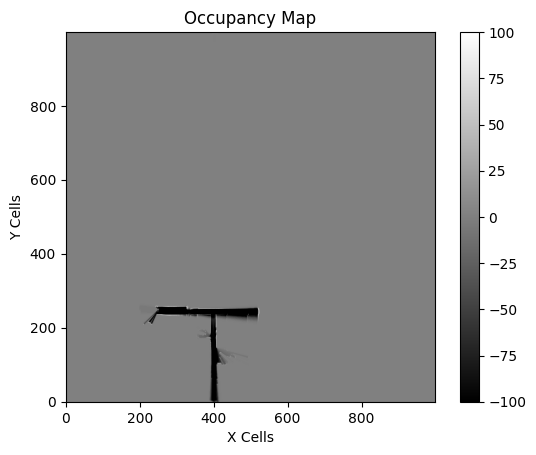

iteration 1301
resampling done
iteration 1302
iteration 1303
resampling done
iteration 1304
resampling done
iteration 1305
iteration 1306
resampling done
iteration 1307
iteration 1308
iteration 1309
resampling done
iteration 1310
iteration 1311
iteration 1312
resampling done
iteration 1313
resampling done
iteration 1314
iteration 1315
iteration 1316
resampling done
iteration 1317
resampling done
iteration 1318
iteration 1319
resampling done
iteration 1320
resampling done
iteration 1321
resampling done
iteration 1322
resampling done
iteration 1323
resampling done
iteration 1324
iteration 1325
resampling done
iteration 1326
iteration 1327
resampling done
iteration 1328
iteration 1329
resampling done
iteration 1330
iteration 1331
resampling done
iteration 1332
iteration 1333
resampling done
iteration 1334
resampling done
iteration 1335
resampling done
iteration 1336
resampling done
iteration 1337
resampling done
iteration 1338
resampling done
iteration 1339
resampling done
iteration 1340


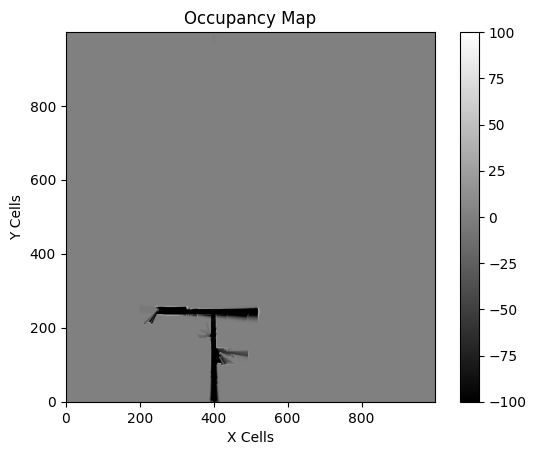

iteration 1401
resampling done
iteration 1402
iteration 1403
iteration 1404
iteration 1405
iteration 1406
iteration 1407
iteration 1408
iteration 1409
iteration 1410
resampling done
iteration 1411
iteration 1412
iteration 1413
iteration 1414
iteration 1415
iteration 1416
iteration 1417
iteration 1418
iteration 1419
iteration 1420
iteration 1421
resampling done
iteration 1422
iteration 1423
iteration 1424
iteration 1425
iteration 1426
iteration 1427
iteration 1428
iteration 1429
iteration 1430
iteration 1431
iteration 1432
iteration 1433
iteration 1434
iteration 1435
iteration 1436
iteration 1437
iteration 1438
iteration 1439
iteration 1440
resampling done
iteration 1441
iteration 1442
iteration 1443
iteration 1444
resampling done
iteration 1445
iteration 1446
iteration 1447
iteration 1448
iteration 1449
iteration 1450
iteration 1451
resampling done
iteration 1452
iteration 1453
resampling done
iteration 1454
resampling done
iteration 1455
resampling done
iteration 1456
resampling done


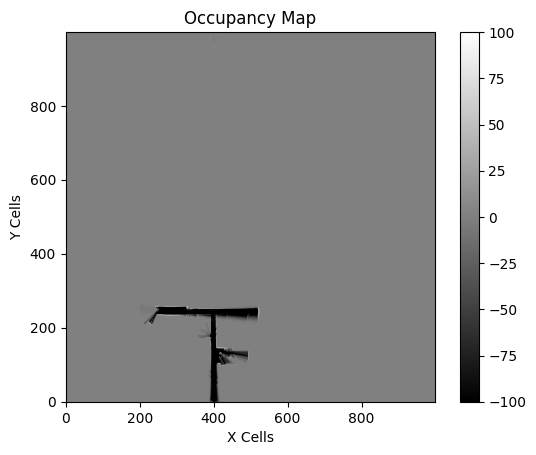

iteration 1501
iteration 1502
iteration 1503
iteration 1504
iteration 1505
resampling done
iteration 1506
iteration 1507
iteration 1508
resampling done
iteration 1509
iteration 1510
resampling done
iteration 1511
iteration 1512
iteration 1513
iteration 1514
resampling done
iteration 1515
iteration 1516
iteration 1517
iteration 1518
resampling done
iteration 1519
iteration 1520
iteration 1521
iteration 1522
resampling done
iteration 1523
iteration 1524
iteration 1525
resampling done
iteration 1526
iteration 1527
iteration 1528
resampling done
iteration 1529
iteration 1530
resampling done
iteration 1531
resampling done
iteration 1532
resampling done
iteration 1533
resampling done
iteration 1534
iteration 1535
iteration 1536
resampling done
iteration 1537
iteration 1538
resampling done
iteration 1539
iteration 1540
resampling done
iteration 1541
resampling done
iteration 1542
resampling done
iteration 1543
resampling done
iteration 1544
iteration 1545
resampling done
iteration 1546
resamp

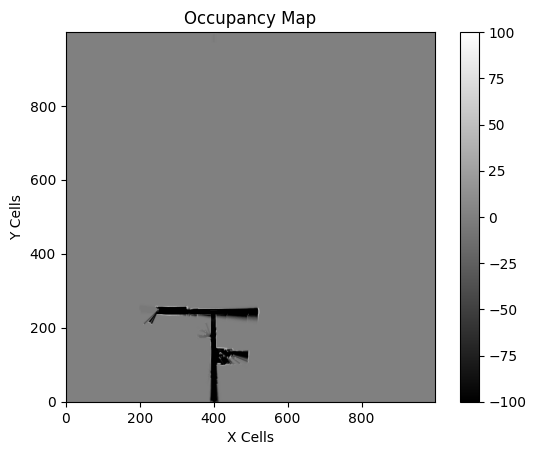

iteration 1601
resampling done
iteration 1602
resampling done
iteration 1603
resampling done
iteration 1604
resampling done
iteration 1605
resampling done
iteration 1606
resampling done
iteration 1607
iteration 1608
iteration 1609
resampling done
iteration 1610
resampling done
iteration 1611
iteration 1612
iteration 1613
iteration 1614
iteration 1615
iteration 1616
resampling done
iteration 1617
iteration 1618
iteration 1619
resampling done
iteration 1620
iteration 1621
iteration 1622
resampling done
iteration 1623
resampling done
iteration 1624
iteration 1625
resampling done
iteration 1626
iteration 1627
iteration 1628
iteration 1629
iteration 1630
resampling done
iteration 1631
iteration 1632
iteration 1633
iteration 1634
iteration 1635
iteration 1636
iteration 1637
iteration 1638
iteration 1639
iteration 1640
iteration 1641
iteration 1642
resampling done
iteration 1643
iteration 1644
resampling done
iteration 1645
iteration 1646
iteration 1647
resampling done
iteration 1648
resampli

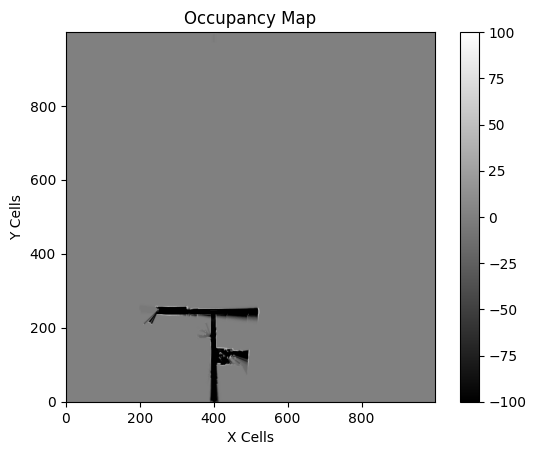

iteration 1701
iteration 1702
iteration 1703
iteration 1704
iteration 1705
iteration 1706
iteration 1707
iteration 1708
iteration 1709
resampling done
iteration 1710
iteration 1711
iteration 1712
resampling done
iteration 1713
iteration 1714
iteration 1715
iteration 1716
resampling done
iteration 1717
iteration 1718
iteration 1719
iteration 1720
iteration 1721
iteration 1722
iteration 1723
iteration 1724
resampling done
iteration 1725
iteration 1726
iteration 1727
iteration 1728
iteration 1729
iteration 1730
iteration 1731
iteration 1732
iteration 1733
iteration 1734
iteration 1735
iteration 1736
iteration 1737
iteration 1738
iteration 1739
iteration 1740
iteration 1741
iteration 1742
iteration 1743
iteration 1744
iteration 1745
resampling done
iteration 1746
iteration 1747
iteration 1748
iteration 1749
iteration 1750
iteration 1751
iteration 1752
iteration 1753
iteration 1754
iteration 1755
iteration 1756
iteration 1757
iteration 1758
iteration 1759
iteration 1760
iteration 1761
itera

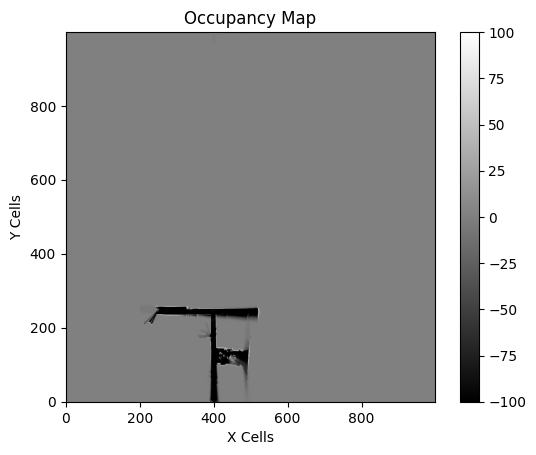

iteration 1801
iteration 1802
iteration 1803
iteration 1804
resampling done
iteration 1805
resampling done
iteration 1806
resampling done
iteration 1807
resampling done
iteration 1808
resampling done
iteration 1809
iteration 1810
iteration 1811
resampling done
iteration 1812
resampling done
iteration 1813
iteration 1814
iteration 1815
iteration 1816
iteration 1817
resampling done
iteration 1818
iteration 1819
iteration 1820
iteration 1821
iteration 1822
iteration 1823
iteration 1824
resampling done
iteration 1825
iteration 1826
resampling done
iteration 1827
iteration 1828
resampling done
iteration 1829
resampling done
iteration 1830
iteration 1831
iteration 1832
resampling done
iteration 1833
resampling done
iteration 1834
resampling done
iteration 1835
resampling done
iteration 1836
resampling done
iteration 1837
iteration 1838
iteration 1839
iteration 1840
iteration 1841
iteration 1842
iteration 1843
resampling done
iteration 1844
iteration 1845
iteration 1846
iteration 1847
iterati

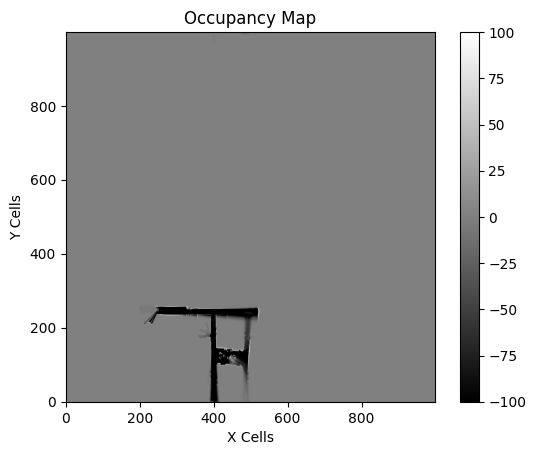

iteration 1901
iteration 1902
iteration 1903
resampling done
iteration 1904
iteration 1905
iteration 1906
iteration 1907
iteration 1908
resampling done
iteration 1909
resampling done
iteration 1910
iteration 1911
resampling done
iteration 1912
iteration 1913
resampling done
iteration 1914
iteration 1915
resampling done
iteration 1916
iteration 1917
iteration 1918
iteration 1919
resampling done
iteration 1920
iteration 1921
iteration 1922
iteration 1923
iteration 1924
iteration 1925
resampling done
iteration 1926
resampling done
iteration 1927
iteration 1928
iteration 1929
resampling done
iteration 1930
resampling done
iteration 1931
resampling done
iteration 1932
resampling done
iteration 1933
iteration 1934
resampling done
iteration 1935
iteration 1936
resampling done
iteration 1937
iteration 1938
iteration 1939
iteration 1940
iteration 1941
iteration 1942
resampling done
iteration 1943
iteration 1944
iteration 1945
iteration 1946
resampling done
iteration 1947
resampling done
iterati

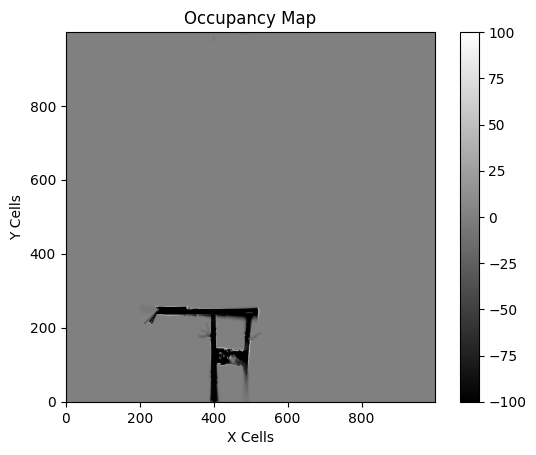

iteration 2001
iteration 2002
resampling done
iteration 2003
iteration 2004
iteration 2005
resampling done
iteration 2006
iteration 2007
iteration 2008
resampling done
iteration 2009
iteration 2010
resampling done
iteration 2011
iteration 2012
resampling done
iteration 2013
resampling done
iteration 2014
iteration 2015
resampling done
iteration 2016
resampling done
iteration 2017
iteration 2018
resampling done
iteration 2019
iteration 2020
resampling done
iteration 2021
iteration 2022
resampling done
iteration 2023
resampling done
iteration 2024
iteration 2025
resampling done
iteration 2026
iteration 2027
resampling done
iteration 2028
iteration 2029
iteration 2030
resampling done
iteration 2031
iteration 2032
resampling done
iteration 2033
iteration 2034
resampling done
iteration 2035
iteration 2036
resampling done
iteration 2037
iteration 2038
resampling done
iteration 2039
resampling done
iteration 2040
iteration 2041
resampling done
iteration 2042
iteration 2043
iteration 2044
iter

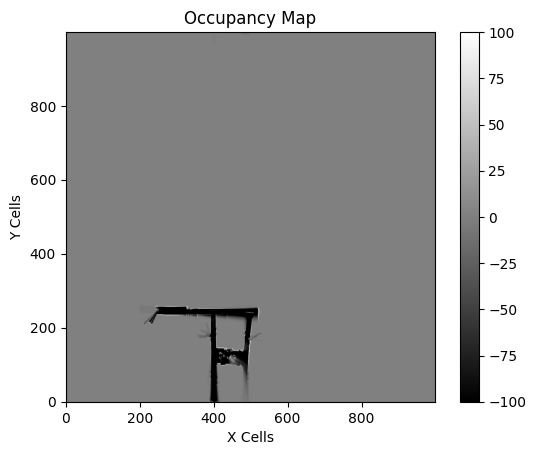

iteration 2101
iteration 2102
iteration 2103
resampling done
iteration 2104
iteration 2105
iteration 2106
iteration 2107
resampling done
iteration 2108
iteration 2109
resampling done
iteration 2110
resampling done
iteration 2111
resampling done
iteration 2112
resampling done
iteration 2113
resampling done
iteration 2114
resampling done
iteration 2115
resampling done
iteration 2116
resampling done
iteration 2117
resampling done
iteration 2118
resampling done
iteration 2119
resampling done
iteration 2120
resampling done
iteration 2121
resampling done
iteration 2122
resampling done
iteration 2123
resampling done
iteration 2124
resampling done
iteration 2125
resampling done
iteration 2126
resampling done
iteration 2127
resampling done
iteration 2128
resampling done
iteration 2129
resampling done
iteration 2130
resampling done
iteration 2131
resampling done
iteration 2132
resampling done
iteration 2133
resampling done
iteration 2134
resampling done
iteration 2135
resampling done
iteration 2

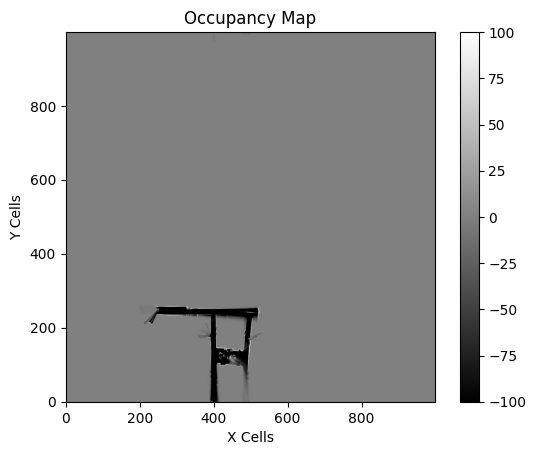

iteration 2201
resampling done
iteration 2202
resampling done
iteration 2203
resampling done
iteration 2204
resampling done
iteration 2205
resampling done
iteration 2206
resampling done
iteration 2207
resampling done
iteration 2208
resampling done
iteration 2209
resampling done
iteration 2210
resampling done
iteration 2211
iteration 2212
resampling done
iteration 2213
resampling done
iteration 2214
resampling done
iteration 2215
resampling done
iteration 2216
iteration 2217
iteration 2218
resampling done
iteration 2219
resampling done
iteration 2220
resampling done
iteration 2221
iteration 2222
iteration 2223
iteration 2224
iteration 2225
iteration 2226
resampling done
iteration 2227
resampling done
iteration 2228
resampling done
iteration 2229
resampling done
iteration 2230
iteration 2231
iteration 2232
resampling done
iteration 2233
iteration 2234
iteration 2235
iteration 2236
iteration 2237
resampling done
iteration 2238
iteration 2239
iteration 2240
iteration 2241
resampling done
i

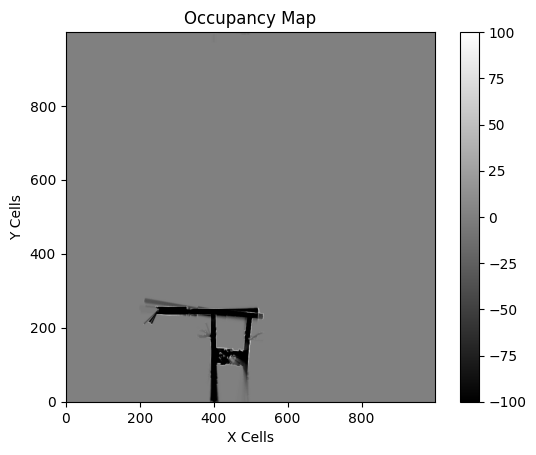

iteration 2301
iteration 2302
resampling done
iteration 2303
resampling done
iteration 2304
resampling done
iteration 2305
resampling done
iteration 2306
resampling done
iteration 2307
resampling done
iteration 2308
resampling done
iteration 2309
resampling done
iteration 2310
resampling done
iteration 2311
resampling done
iteration 2312
resampling done
iteration 2313
resampling done
iteration 2314
resampling done
iteration 2315
resampling done
iteration 2316
resampling done
iteration 2317
resampling done
iteration 2318
resampling done
iteration 2319
resampling done
iteration 2320
resampling done
iteration 2321
resampling done
iteration 2322
resampling done
iteration 2323
iteration 2324
resampling done
iteration 2325
resampling done
iteration 2326
iteration 2327
resampling done
iteration 2328
iteration 2329
resampling done
iteration 2330
iteration 2331
resampling done
iteration 2332
resampling done
iteration 2333
resampling done
iteration 2334
resampling done
iteration 2335
resampling 

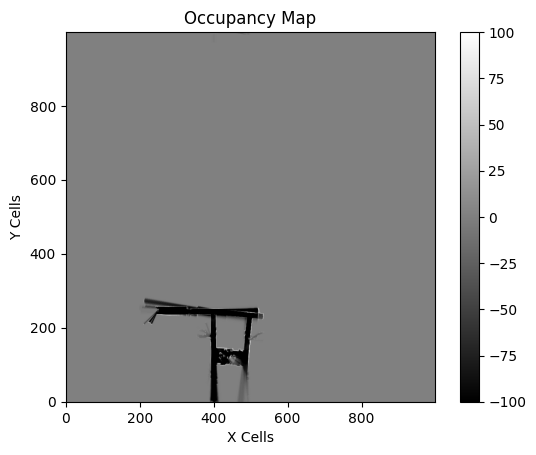

iteration 2401
resampling done
iteration 2402
resampling done
iteration 2403
resampling done
iteration 2404
resampling done
iteration 2405
resampling done
iteration 2406
resampling done
iteration 2407
resampling done
iteration 2408
resampling done
iteration 2409
resampling done
iteration 2410
resampling done
iteration 2411
resampling done
iteration 2412
resampling done
iteration 2413
resampling done
iteration 2414
resampling done
iteration 2415
resampling done
iteration 2416
resampling done
iteration 2417
resampling done
iteration 2418
resampling done
iteration 2419
resampling done
iteration 2420
resampling done
iteration 2421
resampling done
iteration 2422
resampling done
iteration 2423
resampling done
iteration 2424
resampling done
iteration 2425
resampling done
iteration 2426
resampling done
iteration 2427
resampling done
iteration 2428
resampling done
iteration 2429
resampling done
iteration 2430
resampling done
iteration 2431
resampling done
iteration 2432
resampling done
iteratio

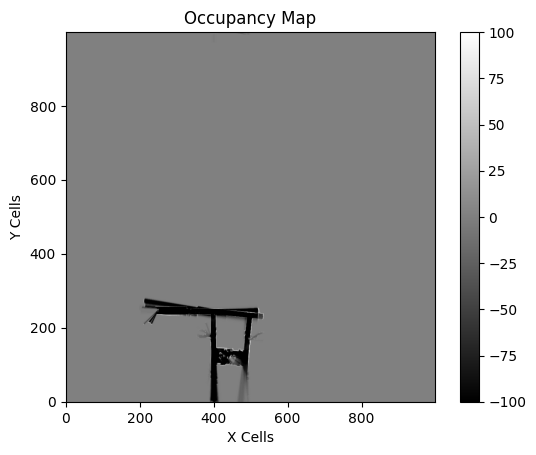

iteration 2501
resampling done
iteration 2502
resampling done
iteration 2503
resampling done
iteration 2504
resampling done
iteration 2505
resampling done
iteration 2506
resampling done
iteration 2507
resampling done
iteration 2508
resampling done
iteration 2509
resampling done
iteration 2510
resampling done
iteration 2511
resampling done
iteration 2512
resampling done
iteration 2513
resampling done
iteration 2514
resampling done
iteration 2515
resampling done
iteration 2516
resampling done
iteration 2517
resampling done
iteration 2518
resampling done
iteration 2519
resampling done
iteration 2520
resampling done
iteration 2521
resampling done
iteration 2522
resampling done
iteration 2523
resampling done
iteration 2524
resampling done
iteration 2525
resampling done
iteration 2526
resampling done
iteration 2527
resampling done
iteration 2528
resampling done
iteration 2529
resampling done
iteration 2530
resampling done
iteration 2531
resampling done
iteration 2532
resampling done
iteratio

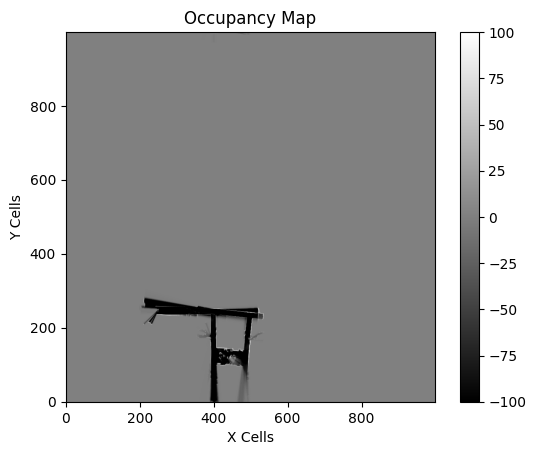

iteration 2601
resampling done
iteration 2602
resampling done
iteration 2603
resampling done
iteration 2604
iteration 2605
resampling done
iteration 2606
iteration 2607
resampling done
iteration 2608
resampling done
iteration 2609
iteration 2610
resampling done
iteration 2611
resampling done
iteration 2612
resampling done
iteration 2613
resampling done
iteration 2614
resampling done
iteration 2615
resampling done
iteration 2616
resampling done
iteration 2617
resampling done
iteration 2618
resampling done
iteration 2619
resampling done
iteration 2620
resampling done
iteration 2621
resampling done
iteration 2622
resampling done
iteration 2623
resampling done
iteration 2624
resampling done
iteration 2625
resampling done
iteration 2626
iteration 2627
resampling done
iteration 2628
resampling done
iteration 2629
resampling done
iteration 2630
resampling done
iteration 2631
resampling done
iteration 2632
resampling done
iteration 2633
resampling done
iteration 2634
resampling done
iteration 

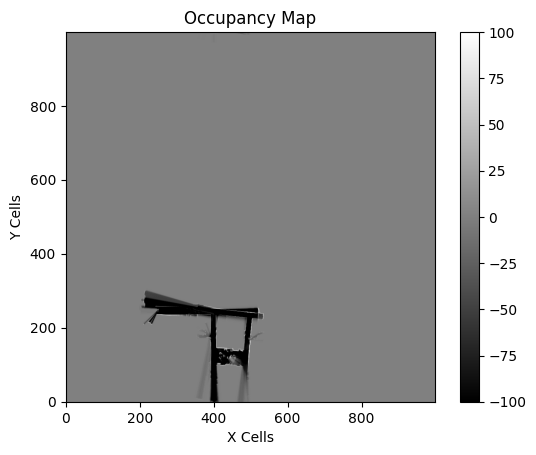

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
resampling done
iteration 2704
resampling done
iteration 2705
resampling done
iteration 2706
resampling done
iteration 2707
resampling done
iteration 2708
resampling done
iteration 2709
resampling done
iteration 2710
resampling done
iteration 2711
resampling done
iteration 2712
resampling done
iteration 2713
resampling done
iteration 2714
resampling done
iteration 2715
resampling done
iteration 2716
resampling done
iteration 2717
resampling done
iteration 2718
resampling done
iteration 2719
resampling done
iteration 2720
resampling done
iteration 2721
resampling done
iteration 2722
resampling done
iteration 2723
resampling done
iteration 2724
resampling done
iteration 2725
resampling done
iteration 2726
resampling done
iteration 2727
resampling done
iteration 2728
resampling done
iteration 2729
resampling done
iteration 2730
resampling done
iteration 2731
resampling done
iteration 2732
resampling done
iteratio

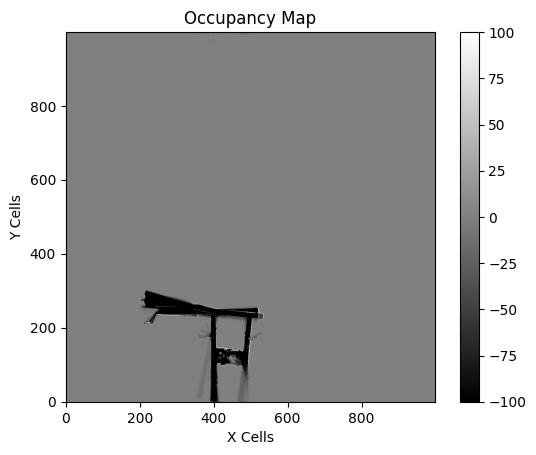

iteration 2801
resampling done
iteration 2802
resampling done
iteration 2803
resampling done
iteration 2804
resampling done
iteration 2805
resampling done
iteration 2806
resampling done
iteration 2807
resampling done
iteration 2808
resampling done
iteration 2809
resampling done
iteration 2810
resampling done
iteration 2811
resampling done
iteration 2812
resampling done
iteration 2813
resampling done
iteration 2814
resampling done
iteration 2815
resampling done
iteration 2816
resampling done
iteration 2817
resampling done
iteration 2818
resampling done
iteration 2819
resampling done
iteration 2820
resampling done
iteration 2821
resampling done
iteration 2822
resampling done
iteration 2823
resampling done
iteration 2824
resampling done
iteration 2825
resampling done
iteration 2826
resampling done
iteration 2827
resampling done
iteration 2828
resampling done
iteration 2829
resampling done
iteration 2830
resampling done
iteration 2831
resampling done
iteration 2832
resampling done
iteratio

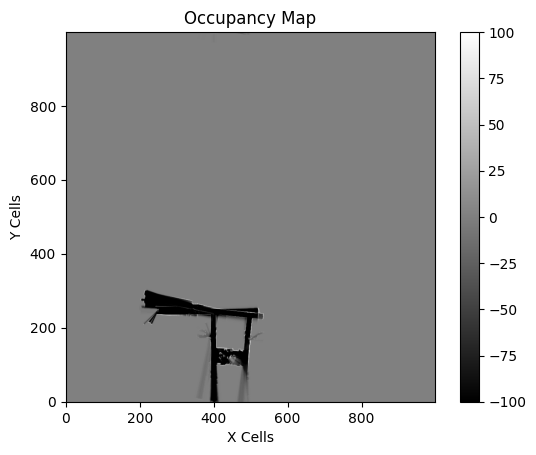

iteration 2901
resampling done
iteration 2902
resampling done
iteration 2903
resampling done
iteration 2904
resampling done
iteration 2905
resampling done
iteration 2906
resampling done
iteration 2907
resampling done
iteration 2908
resampling done
iteration 2909
resampling done
iteration 2910
iteration 2911
resampling done
iteration 2912
resampling done
iteration 2913
iteration 2914
resampling done
iteration 2915
resampling done
iteration 2916
resampling done
iteration 2917
resampling done
iteration 2918
iteration 2919
iteration 2920
resampling done
iteration 2921
iteration 2922
resampling done
iteration 2923
resampling done
iteration 2924
resampling done
iteration 2925
resampling done
iteration 2926
resampling done
iteration 2927
resampling done
iteration 2928
iteration 2929
resampling done
iteration 2930
resampling done
iteration 2931
iteration 2932
resampling done
iteration 2933
iteration 2934
iteration 2935
iteration 2936
resampling done
iteration 2937
iteration 2938
resampling don

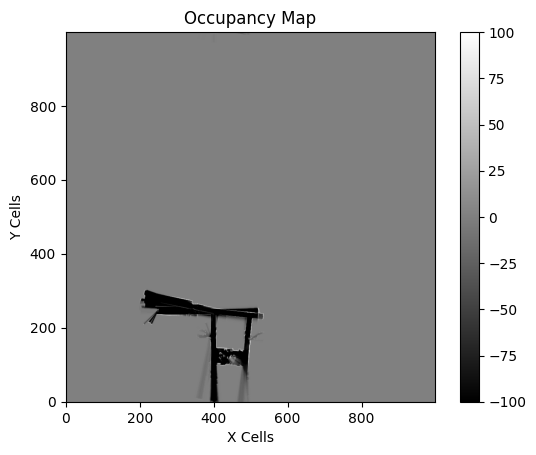

iteration 3001
resampling done
iteration 3002
iteration 3003
resampling done
iteration 3004
resampling done
iteration 3005
iteration 3006
iteration 3007
resampling done
iteration 3008
iteration 3009
resampling done
iteration 3010
resampling done
iteration 3011
resampling done
iteration 3012
iteration 3013
resampling done
iteration 3014
iteration 3015
iteration 3016
resampling done
iteration 3017
resampling done
iteration 3018
iteration 3019
resampling done
iteration 3020
iteration 3021
resampling done
iteration 3022
resampling done
iteration 3023
iteration 3024
resampling done
iteration 3025
resampling done
iteration 3026
resampling done
iteration 3027
iteration 3028
resampling done
iteration 3029
resampling done
iteration 3030
resampling done
iteration 3031
resampling done
iteration 3032
iteration 3033
iteration 3034
resampling done
iteration 3035
resampling done
iteration 3036
resampling done
iteration 3037
resampling done
iteration 3038
resampling done
iteration 3039
resampling done

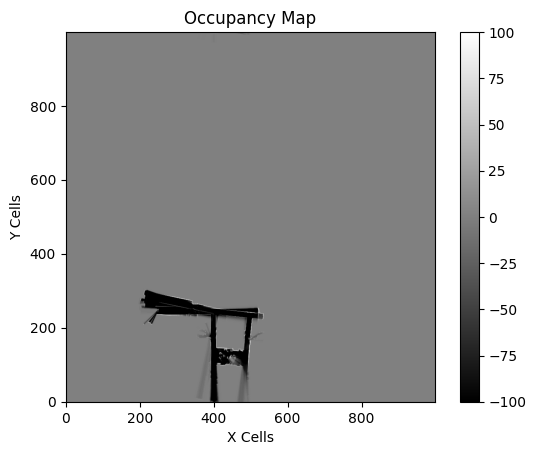

iteration 3101
iteration 3102
iteration 3103
iteration 3104
resampling done
iteration 3105
iteration 3106
resampling done
iteration 3107
iteration 3108
iteration 3109
iteration 3110
resampling done
iteration 3111
iteration 3112
iteration 3113
iteration 3114
resampling done
iteration 3115
iteration 3116
iteration 3117
resampling done
iteration 3118
resampling done
iteration 3119
resampling done
iteration 3120
resampling done
iteration 3121
resampling done
iteration 3122
resampling done
iteration 3123
resampling done
iteration 3124
iteration 3125
iteration 3126
resampling done
iteration 3127
resampling done
iteration 3128
resampling done
iteration 3129
iteration 3130
resampling done
iteration 3131
resampling done
iteration 3132
iteration 3133
iteration 3134
iteration 3135
resampling done
iteration 3136
resampling done
iteration 3137
resampling done
iteration 3138
iteration 3139
resampling done
iteration 3140
resampling done
iteration 3141
resampling done
iteration 3142
iteration 3143
ite

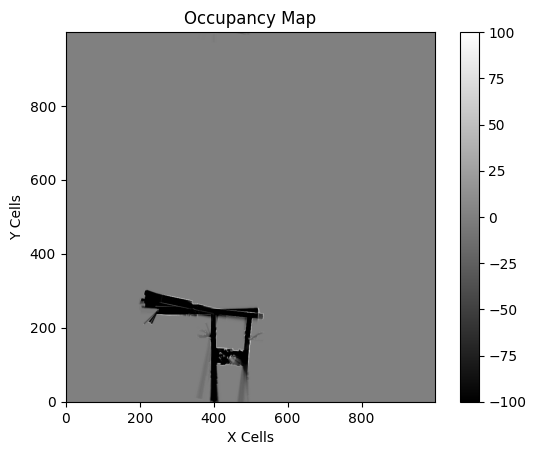

iteration 3201
resampling done
iteration 3202
resampling done
iteration 3203
resampling done
iteration 3204
resampling done
iteration 3205
resampling done
iteration 3206
resampling done
iteration 3207
iteration 3208
resampling done
iteration 3209
resampling done
iteration 3210
resampling done
iteration 3211
resampling done
iteration 3212
resampling done
iteration 3213
iteration 3214
iteration 3215
resampling done
iteration 3216
resampling done
iteration 3217
resampling done
iteration 3218
iteration 3219
resampling done
iteration 3220
iteration 3221
iteration 3222
iteration 3223
iteration 3224
iteration 3225
iteration 3226
iteration 3227
iteration 3228
iteration 3229
resampling done
iteration 3230
resampling done
iteration 3231
resampling done
iteration 3232
iteration 3233
resampling done
iteration 3234
iteration 3235
resampling done
iteration 3236
iteration 3237
iteration 3238
resampling done
iteration 3239
iteration 3240
resampling done
iteration 3241
iteration 3242
iteration 3243
ite

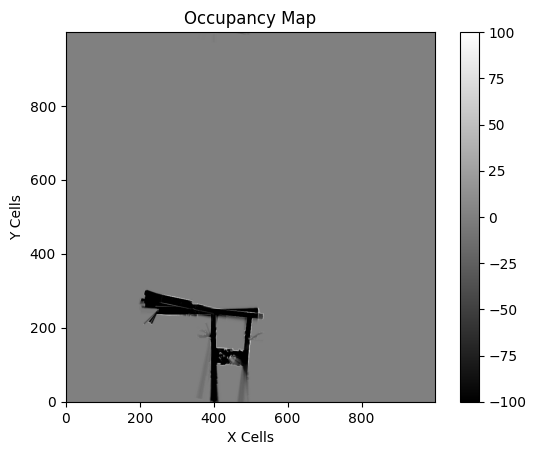

iteration 3301
resampling done
iteration 3302
iteration 3303
resampling done
iteration 3304
iteration 3305
iteration 3306
resampling done
iteration 3307
iteration 3308
iteration 3309
resampling done
iteration 3310
resampling done
iteration 3311
resampling done
iteration 3312
resampling done
iteration 3313
iteration 3314
resampling done
iteration 3315
resampling done
iteration 3316
resampling done
iteration 3317
resampling done
iteration 3318
resampling done
iteration 3319
resampling done
iteration 3320
resampling done
iteration 3321
resampling done
iteration 3322
resampling done
iteration 3323
resampling done
iteration 3324
resampling done
iteration 3325
resampling done
iteration 3326
resampling done
iteration 3327
resampling done
iteration 3328
iteration 3329
resampling done
iteration 3330
resampling done
iteration 3331
resampling done
iteration 3332
iteration 3333
resampling done
iteration 3334
resampling done
iteration 3335
resampling done
iteration 3336
resampling done
iteration 33

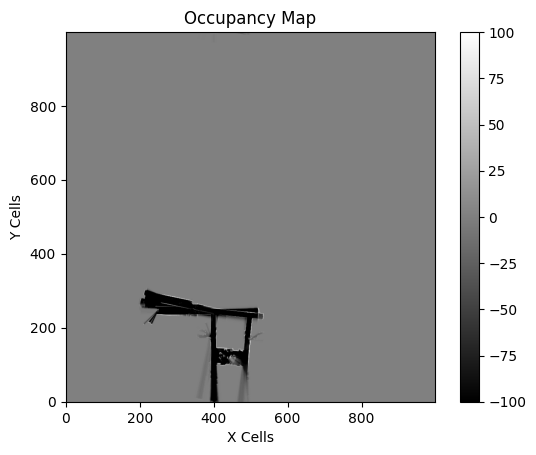

iteration 3401
iteration 3402
iteration 3403
iteration 3404
iteration 3405
iteration 3406
resampling done
iteration 3407
resampling done
iteration 3408
iteration 3409
iteration 3410
iteration 3411
resampling done
iteration 3412
iteration 3413
iteration 3414
resampling done
iteration 3415
iteration 3416
iteration 3417
iteration 3418
iteration 3419
iteration 3420
iteration 3421
iteration 3422
iteration 3423
resampling done
iteration 3424
iteration 3425
iteration 3426
iteration 3427
iteration 3428
iteration 3429
iteration 3430
iteration 3431
resampling done
iteration 3432
iteration 3433
iteration 3434
iteration 3435
resampling done
iteration 3436
iteration 3437
iteration 3438
resampling done
iteration 3439
iteration 3440
resampling done
iteration 3441
resampling done
iteration 3442
resampling done
iteration 3443
resampling done
iteration 3444
iteration 3445
resampling done
iteration 3446
resampling done
iteration 3447
resampling done
iteration 3448
iteration 3449
resampling done
iteration

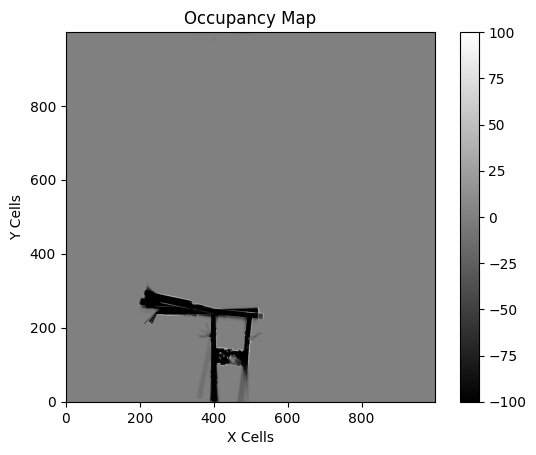

iteration 3501
iteration 3502
resampling done
iteration 3503
resampling done
iteration 3504
resampling done
iteration 3505
resampling done
iteration 3506
resampling done
iteration 3507
resampling done
iteration 3508
resampling done
iteration 3509
resampling done
iteration 3510
resampling done
iteration 3511
resampling done
iteration 3512
resampling done
iteration 3513
resampling done
iteration 3514
resampling done
iteration 3515
resampling done
iteration 3516
resampling done
iteration 3517
resampling done
iteration 3518
resampling done
iteration 3519
resampling done
iteration 3520
resampling done
iteration 3521
resampling done
iteration 3522
resampling done
iteration 3523
resampling done
iteration 3524
resampling done
iteration 3525
resampling done
iteration 3526
resampling done
iteration 3527
resampling done
iteration 3528
resampling done
iteration 3529
resampling done
iteration 3530
resampling done
iteration 3531
resampling done
iteration 3532
resampling done
iteration 3533
resamplin

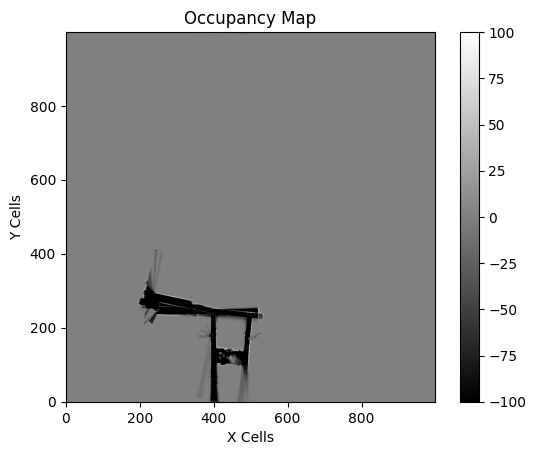

iteration 3601
resampling done
iteration 3602
resampling done
iteration 3603
resampling done
iteration 3604
resampling done
iteration 3605
iteration 3606
iteration 3607
resampling done
iteration 3608
iteration 3609
iteration 3610
resampling done
iteration 3611
iteration 3612
resampling done
iteration 3613
resampling done
iteration 3614
resampling done
iteration 3615
iteration 3616
iteration 3617
resampling done
iteration 3618
iteration 3619
resampling done
iteration 3620
resampling done
iteration 3621
resampling done
iteration 3622
iteration 3623
resampling done
iteration 3624
resampling done
iteration 3625
iteration 3626
resampling done
iteration 3627
iteration 3628
resampling done
iteration 3629
iteration 3630
iteration 3631
resampling done
iteration 3632
iteration 3633
resampling done
iteration 3634
resampling done
iteration 3635
iteration 3636
iteration 3637
iteration 3638
resampling done
iteration 3639
iteration 3640
iteration 3641
iteration 3642
resampling done
iteration 3643
ite

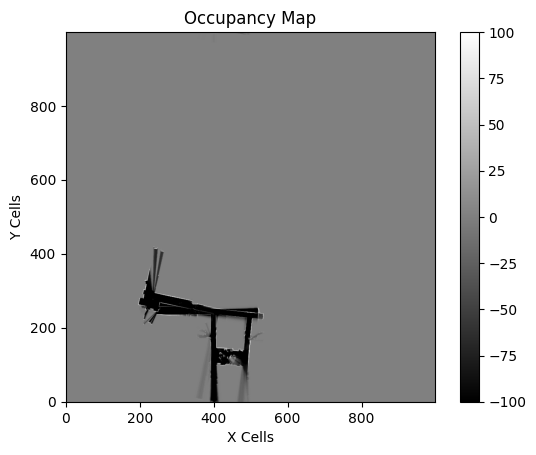

iteration 3701
iteration 3702
resampling done
iteration 3703
iteration 3704
resampling done
iteration 3705
iteration 3706
resampling done
iteration 3707
resampling done
iteration 3708
resampling done
iteration 3709
iteration 3710
iteration 3711
resampling done
iteration 3712
iteration 3713
resampling done
iteration 3714
iteration 3715
resampling done
iteration 3716
iteration 3717
iteration 3718
resampling done
iteration 3719
resampling done
iteration 3720
iteration 3721
resampling done
iteration 3722
resampling done
iteration 3723
resampling done
iteration 3724
iteration 3725
iteration 3726
iteration 3727
resampling done
iteration 3728
iteration 3729
iteration 3730
resampling done
iteration 3731
iteration 3732
iteration 3733
iteration 3734
iteration 3735
resampling done
iteration 3736
iteration 3737
resampling done
iteration 3738
iteration 3739
resampling done
iteration 3740
resampling done
iteration 3741
resampling done
iteration 3742
iteration 3743
resampling done
iteration 3744
resa

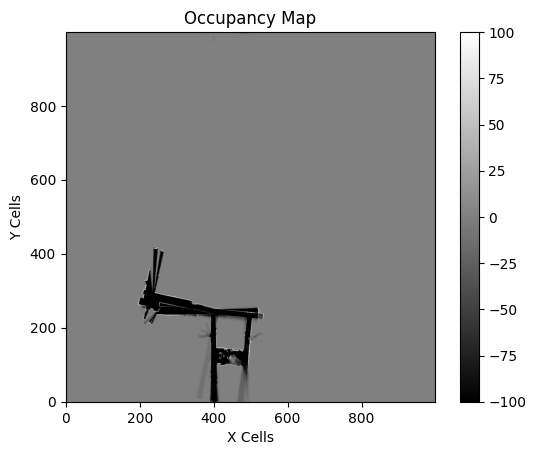

iteration 3801
iteration 3802
iteration 3803
resampling done
iteration 3804
iteration 3805
iteration 3806
iteration 3807
resampling done
iteration 3808


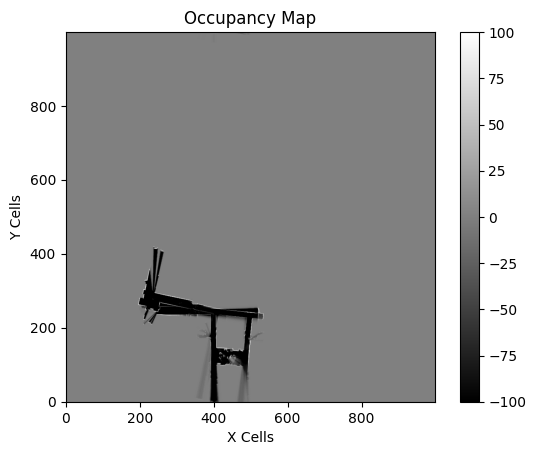

In [65]:
occupancymaps_all_3_good_width = lidar_hits_2(FL_3,FR_3,RL_3,RR_3,ts_enc_3,encoder_ticks_to_meters,width_between_wheels,1.7,lidar_3,matched_lidar_indices_3,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

iteration 0


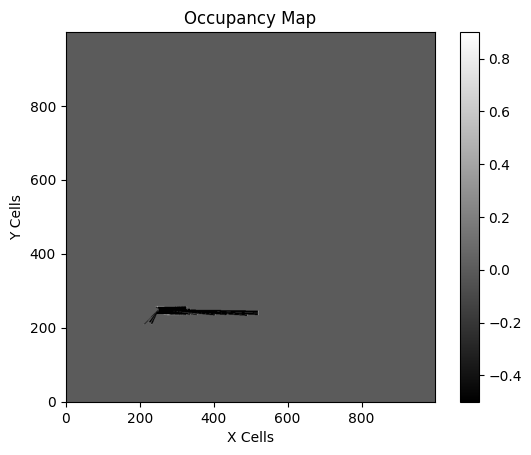

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
resampling done
iteration 29
resampling done
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
resampling done
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
resampling done
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration

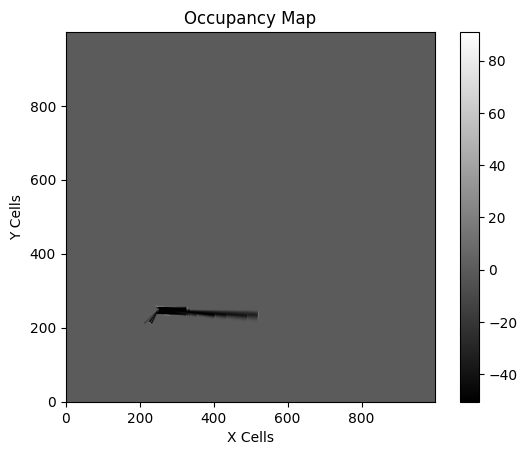

iteration 101
iteration 102
iteration 103
iteration 104
iteration 105
iteration 106
iteration 107
iteration 108
iteration 109
iteration 110
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
iteration 116
iteration 117
iteration 118
iteration 119
iteration 120
iteration 121
resampling done
iteration 122
iteration 123
iteration 124
iteration 125
iteration 126
iteration 127
iteration 128
resampling done
iteration 129
iteration 130
iteration 131
iteration 132
iteration 133
iteration 134
iteration 135
iteration 136
iteration 137
iteration 138
iteration 139
iteration 140
iteration 141
iteration 142
iteration 143
iteration 144
iteration 145
iteration 146
iteration 147
iteration 148
iteration 149
resampling done
iteration 150
iteration 151
iteration 152
iteration 153
iteration 154
iteration 155
iteration 156
iteration 157
iteration 158
iteration 159
iteration 160
iteration 161
iteration 162
resampling done
iteration 163
iteration 164
iteration 165
iteration 166
iteration 16

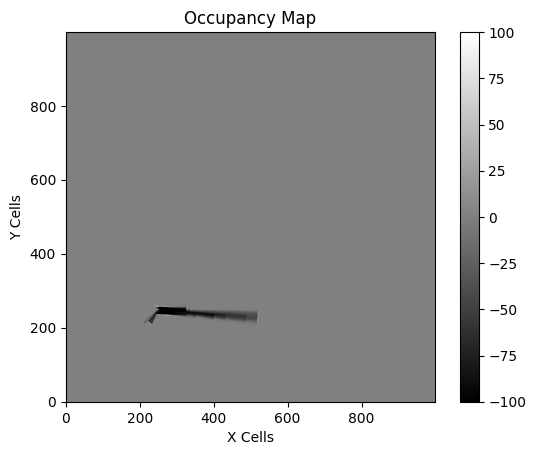

iteration 201
iteration 202
iteration 203
iteration 204
iteration 205
iteration 206
resampling done
iteration 207
iteration 208
iteration 209
iteration 210
iteration 211
iteration 212
iteration 213
iteration 214
iteration 215
iteration 216
iteration 217
iteration 218
iteration 219
resampling done
iteration 220
iteration 221
iteration 222
iteration 223
iteration 224
iteration 225
iteration 226
resampling done
iteration 227
iteration 228
iteration 229
iteration 230
iteration 231
iteration 232
iteration 233
iteration 234
iteration 235
iteration 236
iteration 237
resampling done
iteration 238
iteration 239
iteration 240
iteration 241
iteration 242
iteration 243
iteration 244
resampling done
iteration 245
iteration 246
iteration 247
iteration 248
iteration 249
iteration 250
iteration 251
iteration 252
iteration 253
iteration 254
iteration 255
iteration 256
iteration 257
iteration 258
iteration 259
iteration 260
iteration 261
iteration 262
iteration 263
iteration 264
iteration 265
iteration 

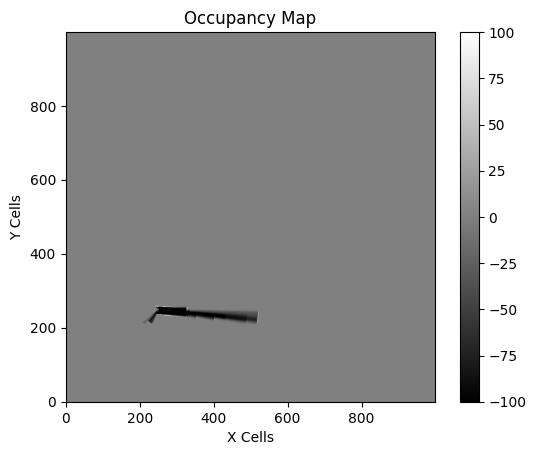

iteration 301
iteration 302
iteration 303
iteration 304
iteration 305
iteration 306
iteration 307
iteration 308
iteration 309
iteration 310
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
iteration 317
iteration 318
iteration 319
resampling done
iteration 320
iteration 321
iteration 322
iteration 323
iteration 324
iteration 325
iteration 326
iteration 327
iteration 328
iteration 329
iteration 330
iteration 331
iteration 332
iteration 333
iteration 334
iteration 335
iteration 336
iteration 337
iteration 338
iteration 339
iteration 340
resampling done
iteration 341
iteration 342
iteration 343
iteration 344
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
iteration 353
iteration 354
iteration 355
iteration 356
iteration 357
iteration 358
iteration 359
iteration 360
resampling done
iteration 361
iteration 362
resampling done
iteration 363
resampling done
iteration 364
resampling done
iteratio

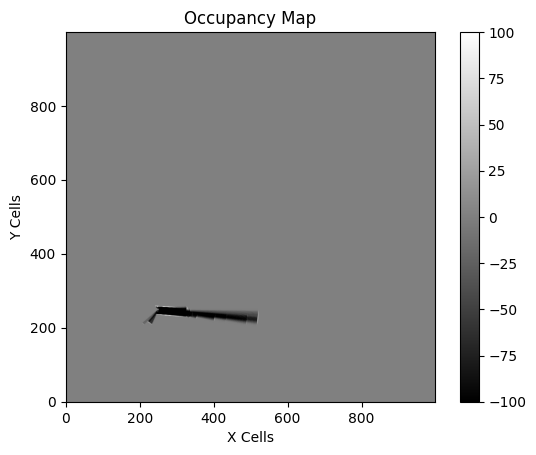

iteration 401
resampling done
iteration 402
iteration 403
resampling done
iteration 404
resampling done
iteration 405
resampling done
iteration 406
resampling done
iteration 407
resampling done
iteration 408
resampling done
iteration 409
resampling done
iteration 410
resampling done
iteration 411
resampling done
iteration 412
resampling done
iteration 413
resampling done
iteration 414
iteration 415
resampling done
iteration 416
resampling done
iteration 417
iteration 418
resampling done
iteration 419
iteration 420
iteration 421
iteration 422
iteration 423
iteration 424
iteration 425
iteration 426
iteration 427
iteration 428
iteration 429
resampling done
iteration 430
iteration 431
iteration 432
iteration 433
iteration 434
iteration 435
iteration 436
iteration 437
iteration 438
iteration 439
iteration 440
resampling done
iteration 441
iteration 442
iteration 443
iteration 444
iteration 445
iteration 446
iteration 447
iteration 448
iteration 449
iteration 450
resampling done
iteration 45

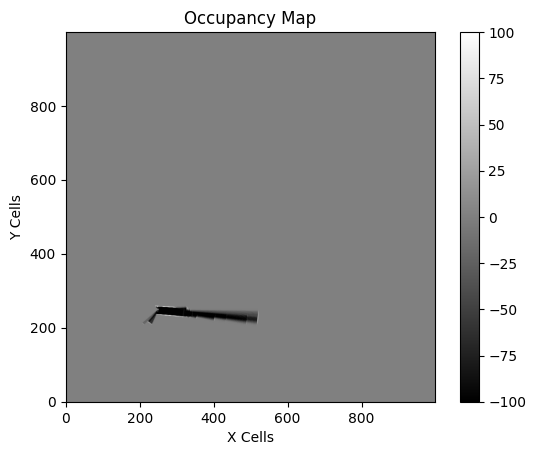

iteration 501
resampling done
iteration 502
resampling done
iteration 503
resampling done
iteration 504
resampling done
iteration 505
resampling done
iteration 506
resampling done
iteration 507
resampling done
iteration 508
resampling done
iteration 509
resampling done
iteration 510
resampling done
iteration 511
resampling done
iteration 512
resampling done
iteration 513
resampling done
iteration 514
resampling done
iteration 515
resampling done
iteration 516
resampling done
iteration 517
resampling done
iteration 518
resampling done
iteration 519
resampling done
iteration 520
resampling done
iteration 521
resampling done
iteration 522
resampling done
iteration 523
resampling done
iteration 524
resampling done
iteration 525
resampling done
iteration 526
resampling done
iteration 527
resampling done
iteration 528
resampling done
iteration 529
resampling done
iteration 530
resampling done
iteration 531
resampling done
iteration 532
resampling done
iteration 533
resampling done
iteration 

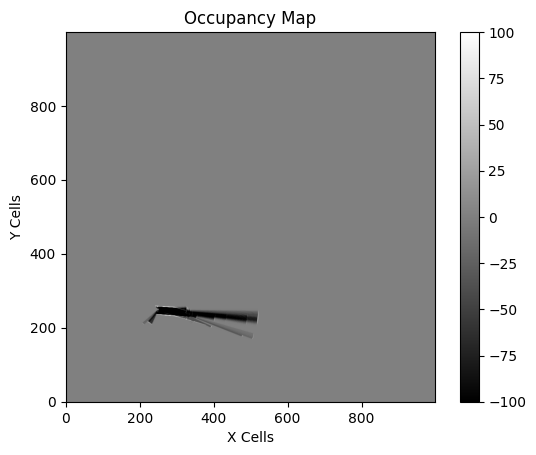

iteration 601
resampling done
iteration 602
resampling done
iteration 603
resampling done
iteration 604
resampling done
iteration 605
resampling done
iteration 606
resampling done
iteration 607
resampling done
iteration 608
resampling done
iteration 609
resampling done
iteration 610
resampling done
iteration 611
resampling done
iteration 612
resampling done
iteration 613
resampling done
iteration 614
resampling done
iteration 615
resampling done
iteration 616
resampling done
iteration 617
resampling done
iteration 618
resampling done
iteration 619
resampling done
iteration 620
resampling done
iteration 621
iteration 622
resampling done
iteration 623
iteration 624
resampling done
iteration 625
resampling done
iteration 626
iteration 627
resampling done
iteration 628
resampling done
iteration 629
iteration 630
resampling done
iteration 631
iteration 632
resampling done
iteration 633
resampling done
iteration 634
resampling done
iteration 635
resampling done
iteration 636
resampling done


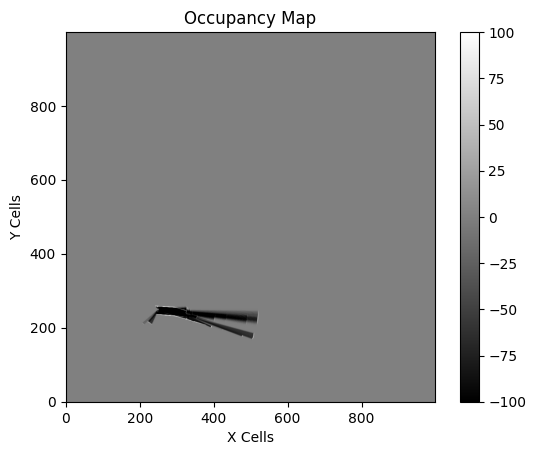

iteration 701
resampling done
iteration 702
resampling done
iteration 703
resampling done
iteration 704
resampling done
iteration 705
resampling done
iteration 706
resampling done
iteration 707
resampling done
iteration 708
resampling done
iteration 709
resampling done
iteration 710
resampling done
iteration 711
resampling done
iteration 712
resampling done
iteration 713
resampling done
iteration 714
resampling done
iteration 715
resampling done
iteration 716
resampling done
iteration 717
iteration 718
resampling done
iteration 719
resampling done
iteration 720
resampling done
iteration 721
iteration 722
resampling done
iteration 723
resampling done
iteration 724
resampling done
iteration 725
iteration 726
resampling done
iteration 727
resampling done
iteration 728
iteration 729
iteration 730
resampling done
iteration 731
iteration 732
iteration 733
iteration 734
iteration 735
resampling done
iteration 736
iteration 737
iteration 738
resampling done
iteration 739
resampling done
iterat

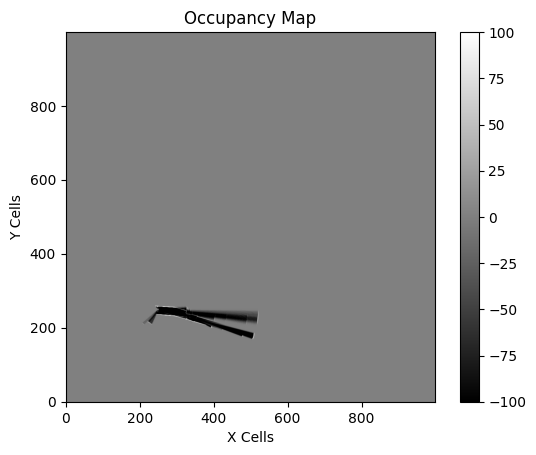

iteration 801
iteration 802
iteration 803
iteration 804
iteration 805
iteration 806
iteration 807
resampling done
iteration 808
iteration 809
iteration 810
iteration 811
iteration 812
iteration 813
iteration 814
iteration 815
iteration 816
iteration 817
iteration 818
iteration 819
iteration 820
resampling done
iteration 821
iteration 822
iteration 823
resampling done
iteration 824
iteration 825
iteration 826
iteration 827
iteration 828
iteration 829
iteration 830
resampling done
iteration 831
iteration 832
resampling done
iteration 833
resampling done
iteration 834
resampling done
iteration 835
iteration 836
resampling done
iteration 837
iteration 838
iteration 839
resampling done
iteration 840
iteration 841
iteration 842
resampling done
iteration 843
iteration 844
iteration 845
iteration 846
iteration 847
iteration 848
iteration 849
iteration 850
iteration 851
iteration 852
resampling done
iteration 853
iteration 854
iteration 855
iteration 856
iteration 857
iteration 858
iteration 85

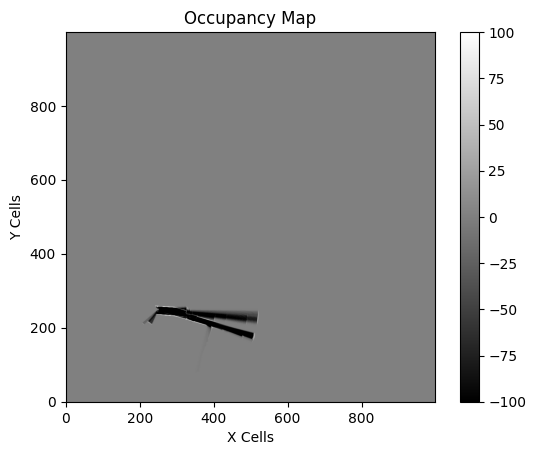

iteration 901
resampling done
iteration 902
resampling done
iteration 903
resampling done
iteration 904
resampling done
iteration 905
resampling done
iteration 906
resampling done
iteration 907
resampling done
iteration 908
resampling done
iteration 909
resampling done
iteration 910
resampling done
iteration 911
resampling done
iteration 912
resampling done
iteration 913
iteration 914
iteration 915
resampling done
iteration 916
iteration 917
resampling done
iteration 918
resampling done
iteration 919
iteration 920
resampling done
iteration 921
resampling done
iteration 922
iteration 923
iteration 924
resampling done
iteration 925
iteration 926
resampling done
iteration 927
resampling done
iteration 928
resampling done
iteration 929
resampling done
iteration 930
resampling done
iteration 931
resampling done
iteration 932
iteration 933
resampling done
iteration 934
iteration 935
resampling done
iteration 936
resampling done
iteration 937
resampling done
iteration 938
resampling done
iter

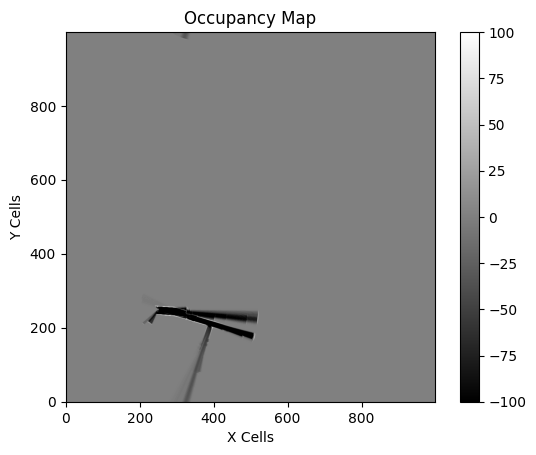

iteration 1001
iteration 1002
iteration 1003
resampling done
iteration 1004
iteration 1005
resampling done
iteration 1006
iteration 1007
iteration 1008
iteration 1009
resampling done
iteration 1010
iteration 1011
resampling done
iteration 1012
iteration 1013
resampling done
iteration 1014
iteration 1015
iteration 1016
iteration 1017
iteration 1018
iteration 1019
iteration 1020
iteration 1021
iteration 1022
iteration 1023
iteration 1024
resampling done
iteration 1025
iteration 1026
iteration 1027
iteration 1028
iteration 1029
iteration 1030
iteration 1031
resampling done
iteration 1032
resampling done
iteration 1033
resampling done
iteration 1034
iteration 1035
iteration 1036
iteration 1037
iteration 1038
resampling done
iteration 1039
iteration 1040
iteration 1041
iteration 1042
iteration 1043
resampling done
iteration 1044
iteration 1045
resampling done
iteration 1046
iteration 1047
iteration 1048
resampling done
iteration 1049
iteration 1050
iteration 1051
resampling done
iteration 1

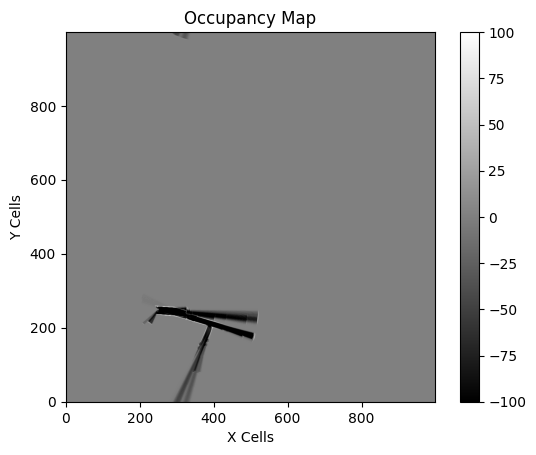

iteration 1101
resampling done
iteration 1102
resampling done
iteration 1103
resampling done
iteration 1104
resampling done
iteration 1105
resampling done
iteration 1106
resampling done
iteration 1107
resampling done
iteration 1108
resampling done
iteration 1109
resampling done
iteration 1110
resampling done
iteration 1111
resampling done
iteration 1112
resampling done
iteration 1113
resampling done
iteration 1114
resampling done
iteration 1115
resampling done
iteration 1116
resampling done
iteration 1117
resampling done
iteration 1118
resampling done
iteration 1119
resampling done
iteration 1120
resampling done
iteration 1121
resampling done
iteration 1122
resampling done
iteration 1123
resampling done
iteration 1124
resampling done
iteration 1125
resampling done
iteration 1126
resampling done
iteration 1127
iteration 1128
resampling done
iteration 1129
iteration 1130
resampling done
iteration 1131
resampling done
iteration 1132
resampling done
iteration 1133
resampling done
iteration

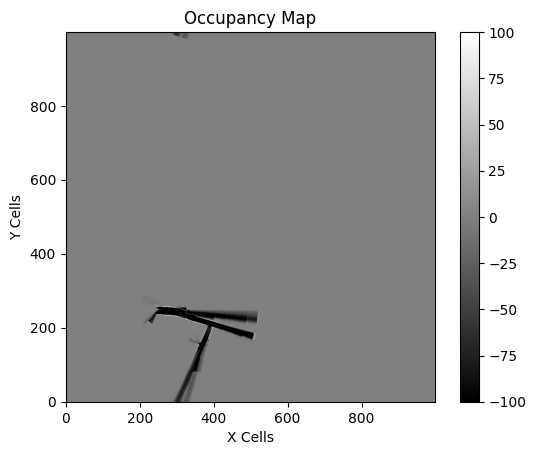

iteration 1201
resampling done
iteration 1202
resampling done
iteration 1203
resampling done
iteration 1204
iteration 1205
resampling done
iteration 1206
iteration 1207
resampling done
iteration 1208
resampling done
iteration 1209
iteration 1210
resampling done
iteration 1211
iteration 1212
resampling done
iteration 1213
resampling done
iteration 1214
iteration 1215
resampling done
iteration 1216
resampling done
iteration 1217
iteration 1218
iteration 1219
resampling done
iteration 1220
iteration 1221
iteration 1222
resampling done
iteration 1223
iteration 1224
iteration 1225
iteration 1226
iteration 1227
iteration 1228
resampling done
iteration 1229
iteration 1230
iteration 1231
iteration 1232
resampling done
iteration 1233
iteration 1234
resampling done
iteration 1235
iteration 1236
resampling done
iteration 1237
resampling done
iteration 1238
resampling done
iteration 1239
resampling done
iteration 1240
resampling done
iteration 1241
resampling done
iteration 1242
iteration 1243
ite

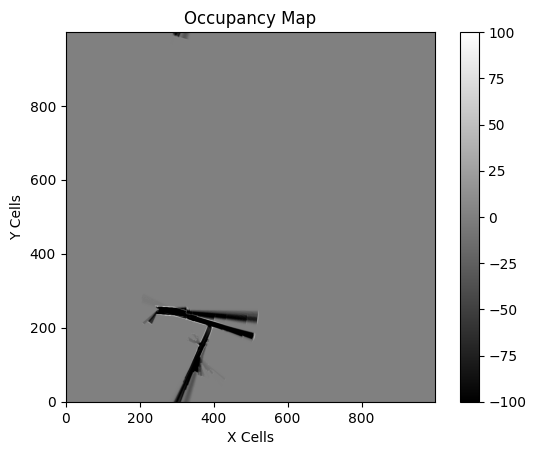

iteration 1301
resampling done
iteration 1302
resampling done
iteration 1303
resampling done
iteration 1304
resampling done
iteration 1305
resampling done
iteration 1306
resampling done
iteration 1307
resampling done
iteration 1308
resampling done
iteration 1309
resampling done
iteration 1310
resampling done
iteration 1311
resampling done
iteration 1312
resampling done
iteration 1313
resampling done
iteration 1314
resampling done
iteration 1315
resampling done
iteration 1316
resampling done
iteration 1317
resampling done
iteration 1318
resampling done
iteration 1319
resampling done
iteration 1320
resampling done
iteration 1321
resampling done
iteration 1322
resampling done
iteration 1323
resampling done
iteration 1324
resampling done
iteration 1325
resampling done
iteration 1326
resampling done
iteration 1327
resampling done
iteration 1328
resampling done
iteration 1329
resampling done
iteration 1330
resampling done
iteration 1331
resampling done
iteration 1332
resampling done
iteratio

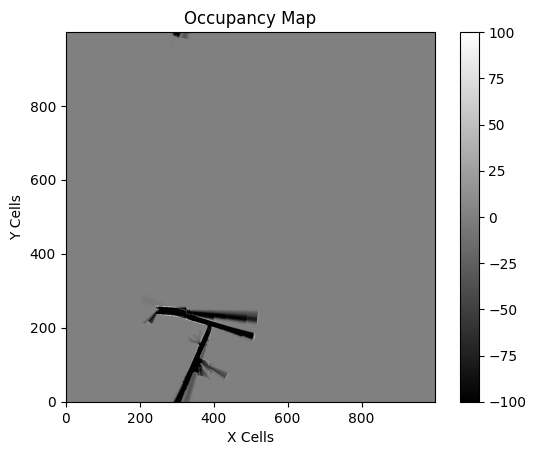

iteration 1401
resampling done
iteration 1402
resampling done
iteration 1403
iteration 1404
iteration 1405
iteration 1406
resampling done
iteration 1407
iteration 1408
resampling done
iteration 1409
iteration 1410
resampling done
iteration 1411
resampling done
iteration 1412
iteration 1413
iteration 1414
iteration 1415
iteration 1416
iteration 1417
iteration 1418
iteration 1419
iteration 1420
iteration 1421
iteration 1422
iteration 1423
iteration 1424
iteration 1425
resampling done
iteration 1426
iteration 1427
iteration 1428
iteration 1429
iteration 1430
iteration 1431
iteration 1432
iteration 1433
iteration 1434
iteration 1435
iteration 1436
iteration 1437
iteration 1438
iteration 1439
iteration 1440
iteration 1441
iteration 1442
iteration 1443
iteration 1444
resampling done
iteration 1445
iteration 1446
iteration 1447
iteration 1448
iteration 1449
resampling done
iteration 1450
iteration 1451
iteration 1452
iteration 1453
iteration 1454
iteration 1455
resampling done
iteration 1456


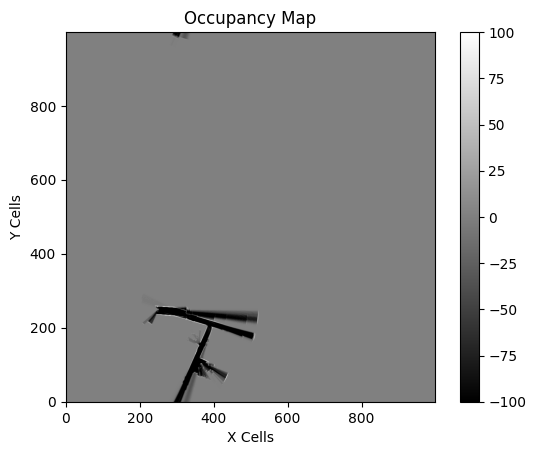

iteration 1501
iteration 1502
iteration 1503
resampling done
iteration 1504
iteration 1505
iteration 1506
iteration 1507
iteration 1508
resampling done
iteration 1509
iteration 1510
resampling done
iteration 1511
iteration 1512
iteration 1513
iteration 1514
iteration 1515
iteration 1516
resampling done
iteration 1517
resampling done
iteration 1518
iteration 1519
resampling done
iteration 1520
iteration 1521
resampling done
iteration 1522
resampling done
iteration 1523
resampling done
iteration 1524
resampling done
iteration 1525
resampling done
iteration 1526
iteration 1527
resampling done
iteration 1528
iteration 1529
resampling done
iteration 1530
iteration 1531
iteration 1532
iteration 1533
iteration 1534
iteration 1535
resampling done
iteration 1536
iteration 1537
iteration 1538
resampling done
iteration 1539
iteration 1540
iteration 1541
iteration 1542
iteration 1543
iteration 1544
iteration 1545
resampling done
iteration 1546
iteration 1547
iteration 1548
iteration 1549
iteration

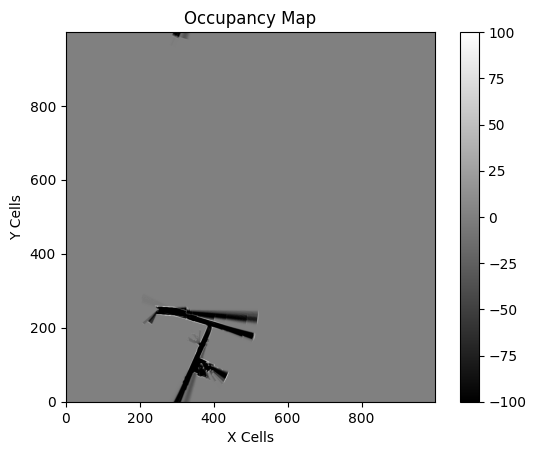

iteration 1601
resampling done
iteration 1602
iteration 1603
iteration 1604
iteration 1605
iteration 1606
resampling done
iteration 1607
iteration 1608
resampling done
iteration 1609
iteration 1610
iteration 1611
resampling done
iteration 1612
iteration 1613
iteration 1614
iteration 1615
iteration 1616
iteration 1617
resampling done
iteration 1618
iteration 1619
iteration 1620
iteration 1621
iteration 1622
resampling done
iteration 1623
resampling done
iteration 1624
iteration 1625
iteration 1626
iteration 1627
iteration 1628
iteration 1629
iteration 1630
iteration 1631
iteration 1632
iteration 1633
resampling done
iteration 1634
iteration 1635
iteration 1636
iteration 1637
iteration 1638
iteration 1639
iteration 1640
iteration 1641
resampling done
iteration 1642
iteration 1643
iteration 1644
resampling done
iteration 1645
iteration 1646
iteration 1647
iteration 1648
iteration 1649
resampling done
iteration 1650
iteration 1651
iteration 1652
resampling done
iteration 1653
iteration 165

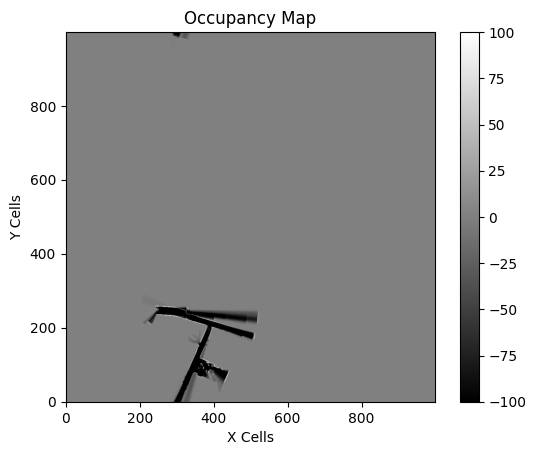

iteration 1701
iteration 1702
iteration 1703
iteration 1704
iteration 1705
iteration 1706
iteration 1707
iteration 1708
iteration 1709
iteration 1710
iteration 1711
iteration 1712
iteration 1713
iteration 1714
iteration 1715
iteration 1716
iteration 1717
iteration 1718
iteration 1719
iteration 1720
iteration 1721
iteration 1722
iteration 1723
iteration 1724
iteration 1725
iteration 1726
iteration 1727
iteration 1728
iteration 1729
iteration 1730
iteration 1731
iteration 1732
iteration 1733
iteration 1734
iteration 1735
iteration 1736
iteration 1737
iteration 1738
iteration 1739
iteration 1740
iteration 1741
iteration 1742
iteration 1743
iteration 1744
iteration 1745
iteration 1746
iteration 1747
iteration 1748
iteration 1749
iteration 1750
iteration 1751
iteration 1752
iteration 1753
iteration 1754
iteration 1755
iteration 1756
resampling done
iteration 1757
iteration 1758
iteration 1759
iteration 1760
iteration 1761
iteration 1762
iteration 1763
iteration 1764
iteration 1765
iteration

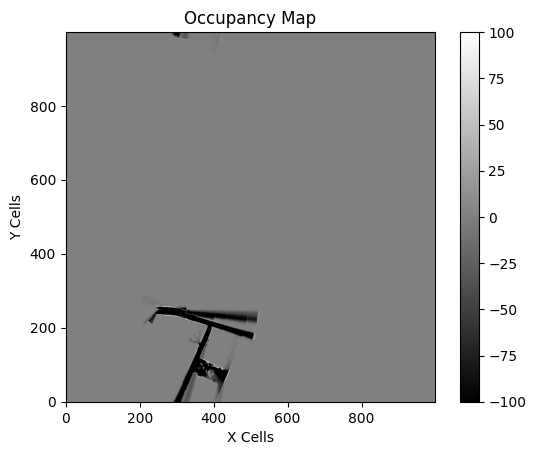

iteration 1801
iteration 1802
iteration 1803
iteration 1804
iteration 1805
iteration 1806
iteration 1807
resampling done
iteration 1808
iteration 1809
iteration 1810
resampling done
iteration 1811
resampling done
iteration 1812
iteration 1813
iteration 1814
resampling done
iteration 1815
iteration 1816
iteration 1817
resampling done
iteration 1818
resampling done
iteration 1819
iteration 1820
resampling done
iteration 1821
resampling done
iteration 1822
resampling done
iteration 1823
resampling done
iteration 1824
resampling done
iteration 1825
resampling done
iteration 1826
resampling done
iteration 1827
resampling done
iteration 1828
resampling done
iteration 1829
resampling done
iteration 1830
resampling done
iteration 1831
resampling done
iteration 1832
resampling done
iteration 1833
iteration 1834
resampling done
iteration 1835
resampling done
iteration 1836
resampling done
iteration 1837
resampling done
iteration 1838
resampling done
iteration 1839
iteration 1840
resampling done


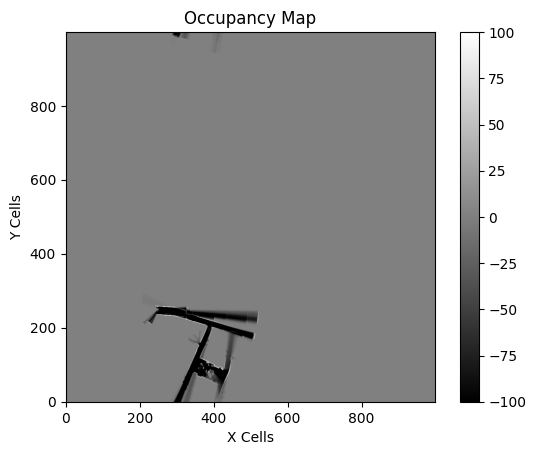

iteration 1901
iteration 1902
resampling done
iteration 1903
iteration 1904
iteration 1905
iteration 1906
iteration 1907
iteration 1908
iteration 1909
iteration 1910
resampling done
iteration 1911
iteration 1912
resampling done
iteration 1913
resampling done
iteration 1914
resampling done
iteration 1915
resampling done
iteration 1916
iteration 1917
iteration 1918
iteration 1919
iteration 1920
resampling done
iteration 1921
iteration 1922
iteration 1923
iteration 1924
iteration 1925
resampling done
iteration 1926
iteration 1927
iteration 1928
resampling done
iteration 1929
iteration 1930
iteration 1931
iteration 1932
iteration 1933
iteration 1934
resampling done
iteration 1935
iteration 1936
iteration 1937
resampling done
iteration 1938
iteration 1939
iteration 1940
iteration 1941
iteration 1942
iteration 1943
iteration 1944
iteration 1945
iteration 1946
iteration 1947
resampling done
iteration 1948
resampling done
iteration 1949
iteration 1950
resampling done
iteration 1951
iteration 1

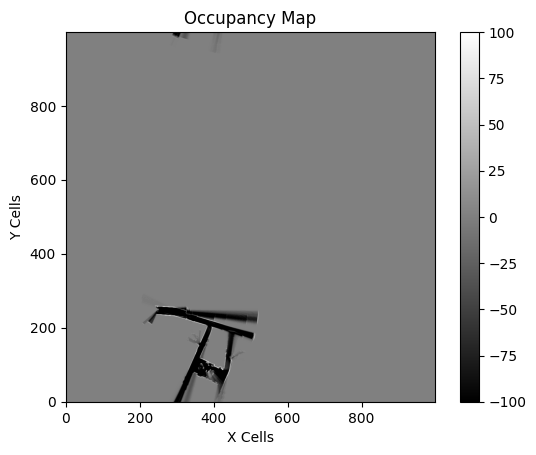

iteration 2001
iteration 2002
resampling done
iteration 2003
resampling done
iteration 2004
resampling done
iteration 2005
iteration 2006
resampling done
iteration 2007
iteration 2008
resampling done
iteration 2009
iteration 2010
resampling done
iteration 2011
resampling done
iteration 2012
resampling done
iteration 2013
resampling done
iteration 2014
resampling done
iteration 2015
resampling done
iteration 2016
resampling done
iteration 2017
resampling done
iteration 2018
iteration 2019
resampling done
iteration 2020
iteration 2021
resampling done
iteration 2022
resampling done
iteration 2023
iteration 2024
resampling done
iteration 2025
resampling done
iteration 2026
iteration 2027
resampling done
iteration 2028
resampling done
iteration 2029
resampling done
iteration 2030
resampling done
iteration 2031
iteration 2032
resampling done
iteration 2033
resampling done
iteration 2034
iteration 2035
iteration 2036
iteration 2037
iteration 2038
resampling done
iteration 2039
iteration 2040


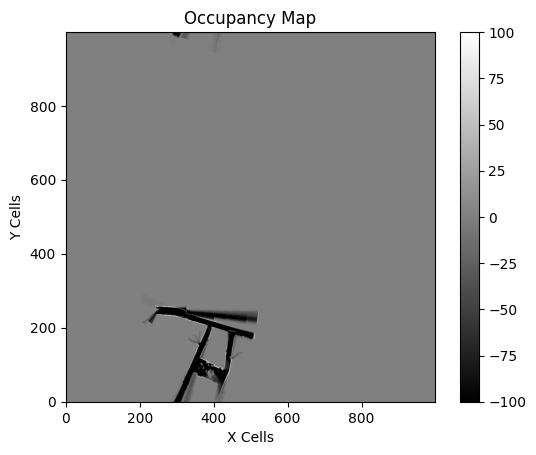

iteration 2101
iteration 2102
iteration 2103
resampling done
iteration 2104
iteration 2105
resampling done
iteration 2106
iteration 2107
resampling done
iteration 2108
resampling done
iteration 2109
resampling done
iteration 2110
resampling done
iteration 2111
resampling done
iteration 2112
resampling done
iteration 2113
resampling done
iteration 2114
iteration 2115
iteration 2116
resampling done
iteration 2117
resampling done
iteration 2118
iteration 2119
resampling done
iteration 2120
iteration 2121
iteration 2122
resampling done
iteration 2123
resampling done
iteration 2124
resampling done
iteration 2125
resampling done
iteration 2126
iteration 2127
iteration 2128
resampling done
iteration 2129
iteration 2130
iteration 2131
resampling done
iteration 2132
iteration 2133
resampling done
iteration 2134
resampling done
iteration 2135
iteration 2136
resampling done
iteration 2137
iteration 2138
iteration 2139
resampling done
iteration 2140
iteration 2141
iteration 2142
iteration 2143
res

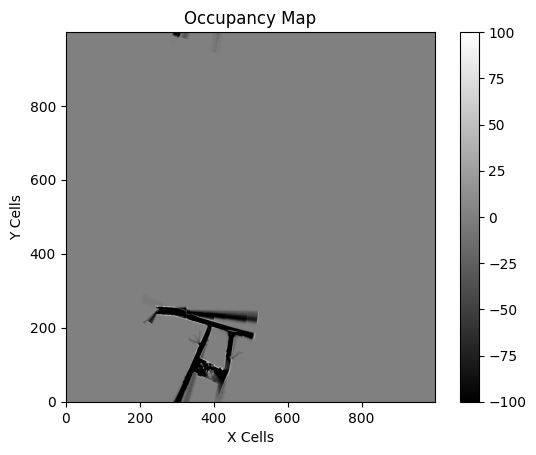

iteration 2201
resampling done
iteration 2202
resampling done
iteration 2203
resampling done
iteration 2204
resampling done
iteration 2205
resampling done
iteration 2206
resampling done
iteration 2207
resampling done
iteration 2208
resampling done
iteration 2209
resampling done
iteration 2210
resampling done
iteration 2211
iteration 2212
resampling done
iteration 2213
iteration 2214
iteration 2215
resampling done
iteration 2216
resampling done
iteration 2217
iteration 2218
resampling done
iteration 2219
iteration 2220
iteration 2221
resampling done
iteration 2222
iteration 2223
iteration 2224
iteration 2225
resampling done
iteration 2226
iteration 2227
iteration 2228
resampling done
iteration 2229
iteration 2230
iteration 2231
resampling done
iteration 2232
iteration 2233
iteration 2234
iteration 2235
iteration 2236
resampling done
iteration 2237
iteration 2238
resampling done
iteration 2239
iteration 2240
iteration 2241
resampling done
iteration 2242
resampling done
iteration 2243
res

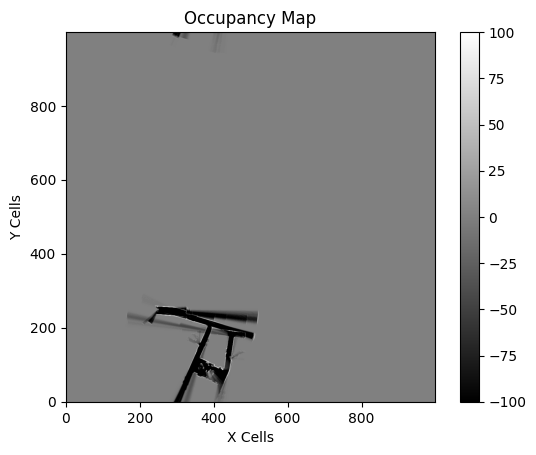

iteration 2301
resampling done
iteration 2302
resampling done
iteration 2303
resampling done
iteration 2304
resampling done
iteration 2305
resampling done
iteration 2306
resampling done
iteration 2307
resampling done
iteration 2308
resampling done
iteration 2309
resampling done
iteration 2310
resampling done
iteration 2311
resampling done
iteration 2312
resampling done
iteration 2313
resampling done
iteration 2314
resampling done
iteration 2315
iteration 2316
resampling done
iteration 2317
resampling done
iteration 2318
iteration 2319
iteration 2320
resampling done
iteration 2321
iteration 2322
resampling done
iteration 2323
iteration 2324
iteration 2325
iteration 2326
resampling done
iteration 2327
iteration 2328
iteration 2329
iteration 2330
resampling done
iteration 2331
iteration 2332
resampling done
iteration 2333
resampling done
iteration 2334
iteration 2335
resampling done
iteration 2336
resampling done
iteration 2337
resampling done
iteration 2338
iteration 2339
resampling done

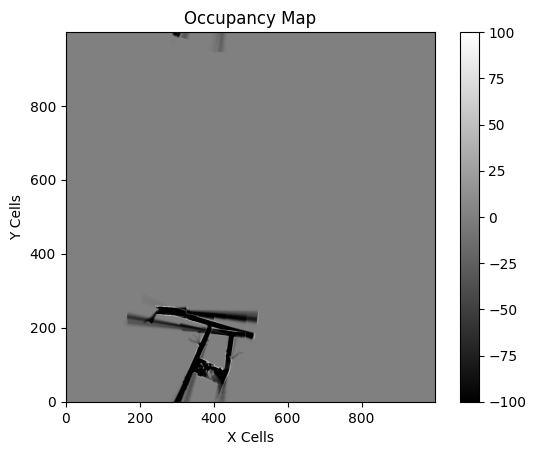

iteration 2401
resampling done
iteration 2402
resampling done
iteration 2403
resampling done
iteration 2404
resampling done
iteration 2405
resampling done
iteration 2406
resampling done
iteration 2407
resampling done
iteration 2408
iteration 2409
resampling done
iteration 2410
iteration 2411
resampling done
iteration 2412
iteration 2413
iteration 2414
resampling done
iteration 2415
resampling done
iteration 2416
iteration 2417
iteration 2418
iteration 2419
iteration 2420
iteration 2421
iteration 2422
resampling done
iteration 2423
iteration 2424
iteration 2425
iteration 2426
iteration 2427
iteration 2428
resampling done
iteration 2429
iteration 2430
iteration 2431
resampling done
iteration 2432
iteration 2433
resampling done
iteration 2434
iteration 2435
iteration 2436
iteration 2437
iteration 2438
iteration 2439
iteration 2440
iteration 2441
resampling done
iteration 2442
iteration 2443
iteration 2444
iteration 2445
iteration 2446
iteration 2447
iteration 2448
iteration 2449
iteration

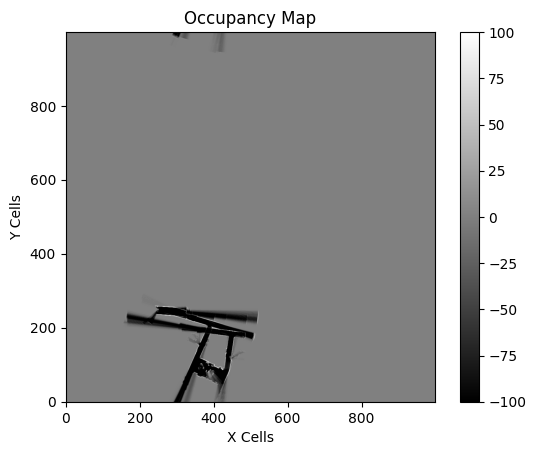

iteration 2501
resampling done
iteration 2502
resampling done
iteration 2503
resampling done
iteration 2504
resampling done
iteration 2505
resampling done
iteration 2506
resampling done
iteration 2507
resampling done
iteration 2508
resampling done
iteration 2509
resampling done
iteration 2510
resampling done
iteration 2511
resampling done
iteration 2512
resampling done
iteration 2513
resampling done
iteration 2514
resampling done
iteration 2515
resampling done
iteration 2516
resampling done
iteration 2517
resampling done
iteration 2518
resampling done
iteration 2519
resampling done
iteration 2520
resampling done
iteration 2521
resampling done
iteration 2522
resampling done
iteration 2523
resampling done
iteration 2524
resampling done
iteration 2525
resampling done
iteration 2526
resampling done
iteration 2527
resampling done
iteration 2528
resampling done
iteration 2529
resampling done
iteration 2530
resampling done
iteration 2531
resampling done
iteration 2532
resampling done
iteratio

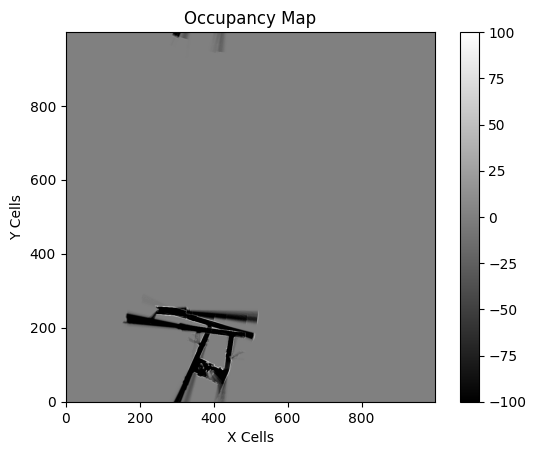

iteration 2601
resampling done
iteration 2602
resampling done
iteration 2603
resampling done
iteration 2604
resampling done
iteration 2605
resampling done
iteration 2606
resampling done
iteration 2607
resampling done
iteration 2608
resampling done
iteration 2609
resampling done
iteration 2610
resampling done
iteration 2611
resampling done
iteration 2612
resampling done
iteration 2613
resampling done
iteration 2614
resampling done
iteration 2615
resampling done
iteration 2616
resampling done
iteration 2617
resampling done
iteration 2618
resampling done
iteration 2619
resampling done
iteration 2620
resampling done
iteration 2621
resampling done
iteration 2622
resampling done
iteration 2623
resampling done
iteration 2624
resampling done
iteration 2625
resampling done
iteration 2626
resampling done
iteration 2627
resampling done
iteration 2628
resampling done
iteration 2629
resampling done
iteration 2630
resampling done
iteration 2631
resampling done
iteration 2632
resampling done
iteratio

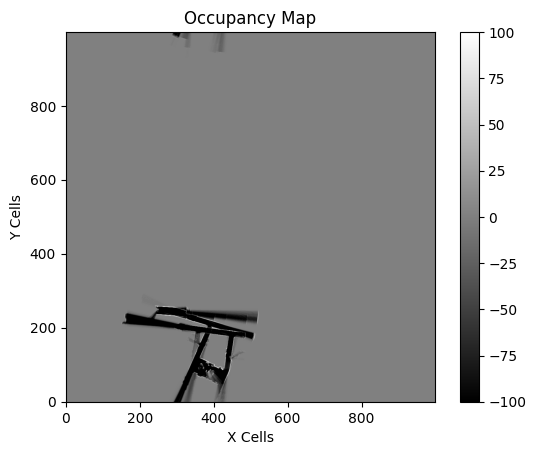

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
resampling done
iteration 2704
resampling done
iteration 2705
resampling done
iteration 2706
resampling done
iteration 2707
resampling done
iteration 2708
resampling done
iteration 2709
resampling done
iteration 2710
resampling done
iteration 2711
resampling done
iteration 2712
resampling done
iteration 2713
resampling done
iteration 2714
resampling done
iteration 2715
resampling done
iteration 2716
resampling done
iteration 2717
resampling done
iteration 2718
resampling done
iteration 2719
resampling done
iteration 2720
resampling done
iteration 2721
resampling done
iteration 2722
resampling done
iteration 2723
resampling done
iteration 2724
resampling done
iteration 2725
resampling done
iteration 2726
resampling done
iteration 2727
resampling done
iteration 2728
resampling done
iteration 2729
resampling done
iteration 2730
resampling done
iteration 2731
resampling done
iteration 2732
resampling done
iteratio

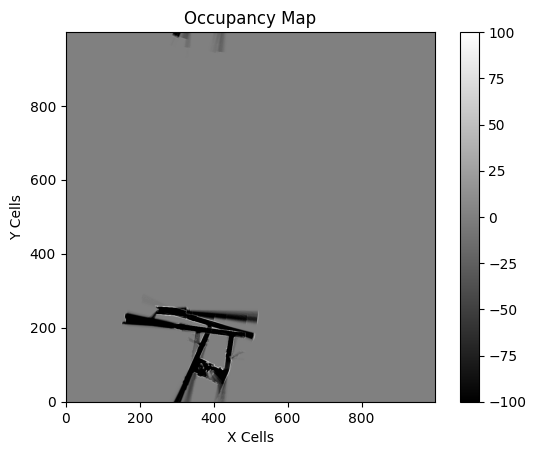

iteration 2801
resampling done
iteration 2802
resampling done
iteration 2803
iteration 2804
resampling done
iteration 2805
resampling done
iteration 2806
resampling done
iteration 2807
resampling done
iteration 2808
resampling done
iteration 2809
iteration 2810
resampling done
iteration 2811
resampling done
iteration 2812
iteration 2813
resampling done
iteration 2814
resampling done
iteration 2815
resampling done
iteration 2816
resampling done
iteration 2817
iteration 2818
resampling done
iteration 2819
iteration 2820
resampling done
iteration 2821
resampling done
iteration 2822
resampling done
iteration 2823
resampling done
iteration 2824
resampling done
iteration 2825
resampling done
iteration 2826
resampling done
iteration 2827
resampling done
iteration 2828
iteration 2829
resampling done
iteration 2830
resampling done
iteration 2831
resampling done
iteration 2832
resampling done
iteration 2833
resampling done
iteration 2834
resampling done
iteration 2835
resampling done
iteration 2

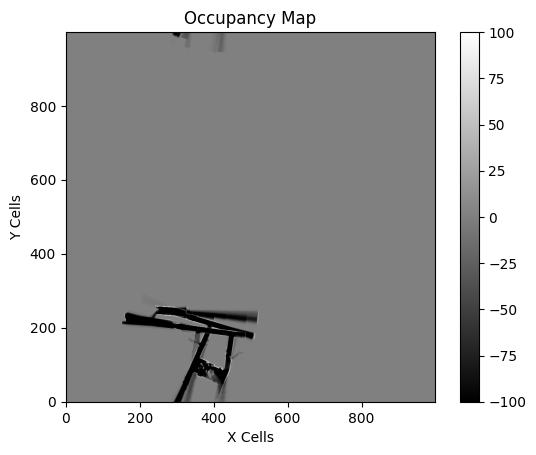

iteration 2901
resampling done
iteration 2902
resampling done
iteration 2903
resampling done
iteration 2904
resampling done
iteration 2905
resampling done
iteration 2906
resampling done
iteration 2907
resampling done
iteration 2908
resampling done
iteration 2909
resampling done
iteration 2910
resampling done
iteration 2911
resampling done
iteration 2912
resampling done
iteration 2913
resampling done
iteration 2914
resampling done
iteration 2915
iteration 2916
resampling done
iteration 2917
iteration 2918
iteration 2919
resampling done
iteration 2920
resampling done
iteration 2921
iteration 2922
iteration 2923
resampling done
iteration 2924
iteration 2925
iteration 2926
resampling done
iteration 2927
iteration 2928
iteration 2929
iteration 2930
iteration 2931
iteration 2932
iteration 2933
iteration 2934
resampling done
iteration 2935
resampling done
iteration 2936
resampling done
iteration 2937
resampling done
iteration 2938
resampling done
iteration 2939
resampling done
iteration 2940


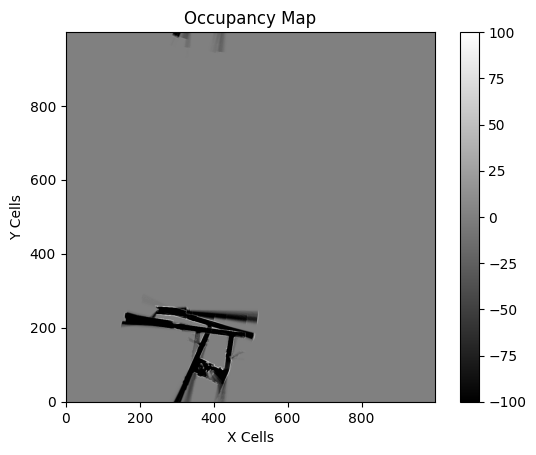

iteration 3001
resampling done
iteration 3002
iteration 3003
iteration 3004
resampling done
iteration 3005
resampling done
iteration 3006
iteration 3007
iteration 3008
resampling done
iteration 3009
iteration 3010
resampling done
iteration 3011
iteration 3012
resampling done
iteration 3013
iteration 3014
resampling done
iteration 3015
iteration 3016
resampling done
iteration 3017
resampling done
iteration 3018
resampling done
iteration 3019
resampling done
iteration 3020
resampling done
iteration 3021
resampling done
iteration 3022
resampling done
iteration 3023
resampling done
iteration 3024
resampling done
iteration 3025
resampling done
iteration 3026
resampling done
iteration 3027
resampling done
iteration 3028
resampling done
iteration 3029
resampling done
iteration 3030
resampling done
iteration 3031
resampling done
iteration 3032
resampling done
iteration 3033
resampling done
iteration 3034
resampling done
iteration 3035
resampling done
iteration 3036
resampling done
iteration 30

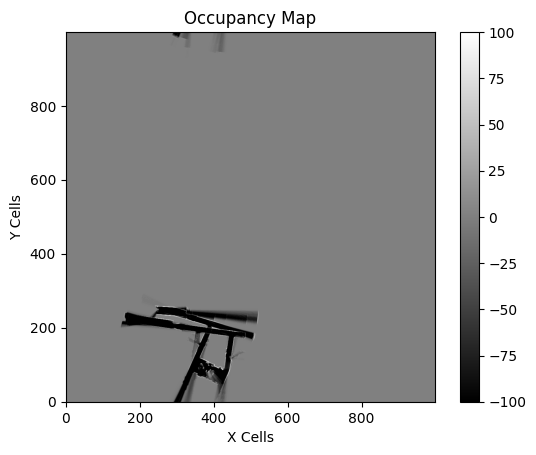

iteration 3101
iteration 3102
resampling done
iteration 3103
iteration 3104
resampling done
iteration 3105
resampling done
iteration 3106
iteration 3107
iteration 3108
resampling done
iteration 3109
iteration 3110
resampling done
iteration 3111
iteration 3112
iteration 3113
resampling done
iteration 3114
iteration 3115
iteration 3116
resampling done
iteration 3117
resampling done
iteration 3118
resampling done
iteration 3119
resampling done
iteration 3120
resampling done
iteration 3121
iteration 3122
resampling done
iteration 3123
resampling done
iteration 3124
resampling done
iteration 3125
resampling done
iteration 3126
resampling done
iteration 3127
resampling done
iteration 3128
resampling done
iteration 3129
resampling done
iteration 3130
resampling done
iteration 3131
resampling done
iteration 3132
resampling done
iteration 3133
resampling done
iteration 3134
resampling done
iteration 3135
resampling done
iteration 3136
resampling done
iteration 3137
resampling done
iteration 313

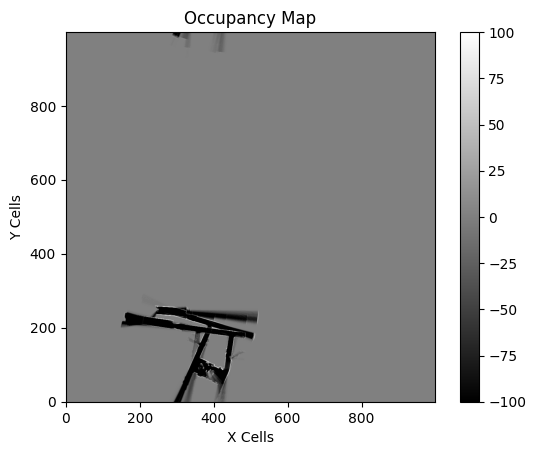

iteration 3201
resampling done
iteration 3202
resampling done
iteration 3203
resampling done
iteration 3204
resampling done
iteration 3205
resampling done
iteration 3206
resampling done
iteration 3207
resampling done
iteration 3208
resampling done
iteration 3209
resampling done
iteration 3210
resampling done
iteration 3211
resampling done
iteration 3212
resampling done
iteration 3213
iteration 3214
resampling done
iteration 3215
resampling done
iteration 3216
resampling done
iteration 3217
resampling done
iteration 3218
resampling done
iteration 3219
resampling done
iteration 3220
resampling done
iteration 3221
resampling done
iteration 3222
resampling done
iteration 3223
resampling done
iteration 3224
resampling done
iteration 3225
resampling done
iteration 3226
resampling done
iteration 3227
resampling done
iteration 3228
resampling done
iteration 3229
resampling done
iteration 3230
resampling done
iteration 3231
resampling done
iteration 3232
resampling done
iteration 3233
resamplin

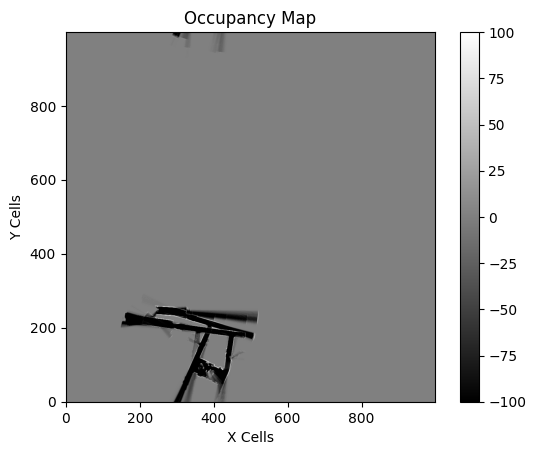

iteration 3301
resampling done
iteration 3302
resampling done
iteration 3303
resampling done
iteration 3304
resampling done
iteration 3305
resampling done
iteration 3306
resampling done
iteration 3307
resampling done
iteration 3308
resampling done
iteration 3309
resampling done
iteration 3310
resampling done
iteration 3311
resampling done
iteration 3312
resampling done
iteration 3313
resampling done
iteration 3314
resampling done
iteration 3315
resampling done
iteration 3316
resampling done
iteration 3317
resampling done
iteration 3318
resampling done
iteration 3319
resampling done
iteration 3320
resampling done
iteration 3321
resampling done
iteration 3322
resampling done
iteration 3323
resampling done
iteration 3324
resampling done
iteration 3325
resampling done
iteration 3326
resampling done
iteration 3327
resampling done
iteration 3328
resampling done
iteration 3329
resampling done
iteration 3330
resampling done
iteration 3331
resampling done
iteration 3332
resampling done
iteratio

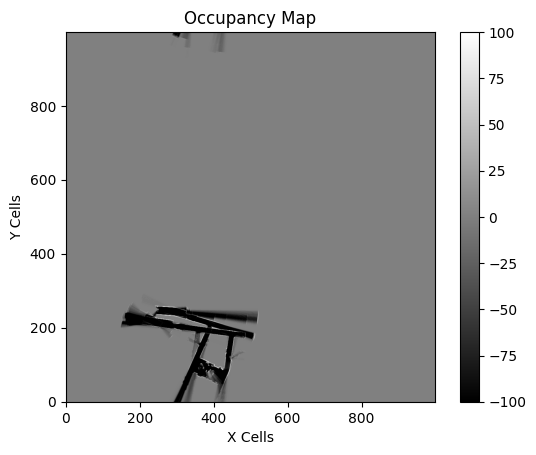

iteration 3401
resampling done
iteration 3402
resampling done
iteration 3403
resampling done
iteration 3404
resampling done
iteration 3405
resampling done
iteration 3406
resampling done
iteration 3407
resampling done
iteration 3408
resampling done
iteration 3409
resampling done
iteration 3410
resampling done
iteration 3411
resampling done
iteration 3412
resampling done
iteration 3413
resampling done
iteration 3414
resampling done
iteration 3415
resampling done
iteration 3416
resampling done
iteration 3417
resampling done
iteration 3418
resampling done
iteration 3419
resampling done
iteration 3420
resampling done
iteration 3421
resampling done
iteration 3422
resampling done
iteration 3423
resampling done
iteration 3424
resampling done
iteration 3425
resampling done
iteration 3426
resampling done
iteration 3427
resampling done
iteration 3428
resampling done
iteration 3429
resampling done
iteration 3430
resampling done
iteration 3431
resampling done
iteration 3432
resampling done
iteratio

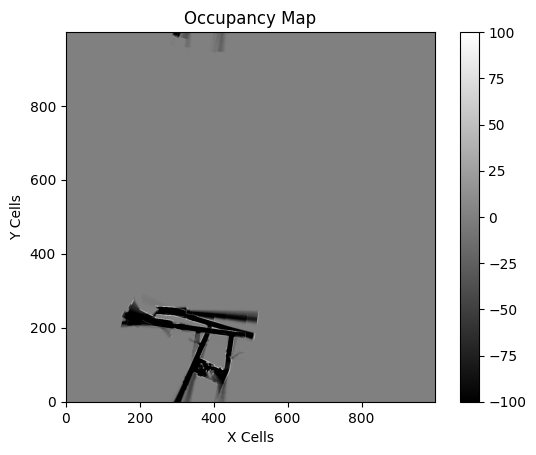

iteration 3501
resampling done
iteration 3502
resampling done
iteration 3503
resampling done
iteration 3504
resampling done
iteration 3505
resampling done
iteration 3506
resampling done
iteration 3507
resampling done
iteration 3508
resampling done
iteration 3509
resampling done
iteration 3510
resampling done
iteration 3511
resampling done
iteration 3512
resampling done
iteration 3513
resampling done
iteration 3514
resampling done
iteration 3515
resampling done
iteration 3516
resampling done
iteration 3517
resampling done
iteration 3518
resampling done
iteration 3519
resampling done
iteration 3520
resampling done
iteration 3521
resampling done
iteration 3522
resampling done
iteration 3523
resampling done
iteration 3524
resampling done
iteration 3525
resampling done
iteration 3526
resampling done
iteration 3527
resampling done
iteration 3528
resampling done
iteration 3529
resampling done
iteration 3530
resampling done
iteration 3531
resampling done
iteration 3532
resampling done
iteratio

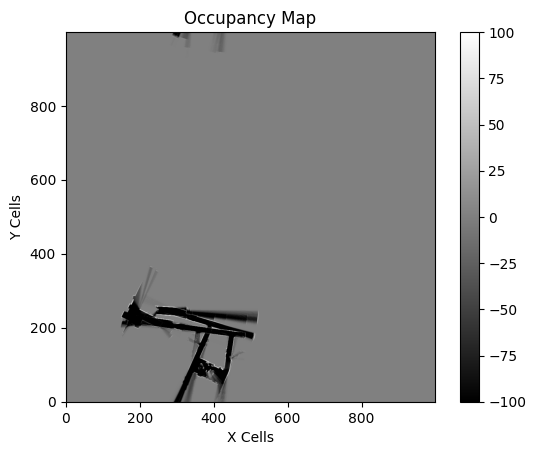

iteration 3601
resampling done
iteration 3602
iteration 3603
resampling done
iteration 3604
iteration 3605
resampling done
iteration 3606
iteration 3607
iteration 3608
iteration 3609
resampling done
iteration 3610
iteration 3611
resampling done
iteration 3612
iteration 3613
iteration 3614
iteration 3615
resampling done
iteration 3616
iteration 3617
resampling done
iteration 3618
iteration 3619
resampling done
iteration 3620
resampling done
iteration 3621
iteration 3622
iteration 3623
resampling done
iteration 3624
iteration 3625
iteration 3626
resampling done
iteration 3627
iteration 3628
iteration 3629
resampling done
iteration 3630
iteration 3631
iteration 3632
resampling done
iteration 3633
iteration 3634
iteration 3635
resampling done
iteration 3636
resampling done
iteration 3637
resampling done
iteration 3638
resampling done
iteration 3639
resampling done
iteration 3640
iteration 3641
iteration 3642
resampling done
iteration 3643
iteration 3644
iteration 3645
resampling done
itera

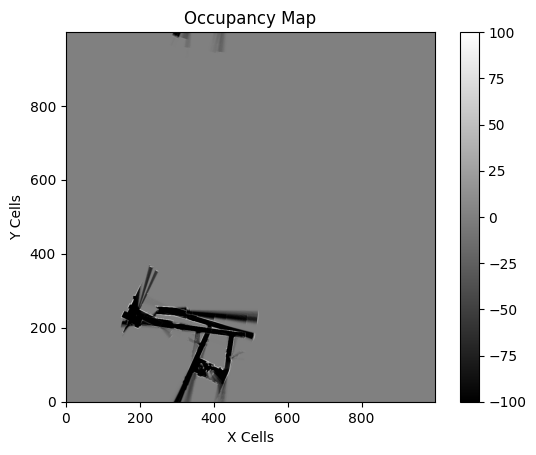

iteration 3701
iteration 3702
iteration 3703
resampling done
iteration 3704
iteration 3705
resampling done
iteration 3706
iteration 3707
resampling done
iteration 3708
resampling done
iteration 3709
iteration 3710
iteration 3711
resampling done
iteration 3712
iteration 3713
iteration 3714
iteration 3715
iteration 3716
iteration 3717
iteration 3718
iteration 3719
iteration 3720
resampling done
iteration 3721
iteration 3722
iteration 3723
iteration 3724
iteration 3725
iteration 3726
resampling done
iteration 3727
iteration 3728
iteration 3729
iteration 3730
iteration 3731
iteration 3732
iteration 3733
resampling done
iteration 3734
iteration 3735
iteration 3736
iteration 3737
resampling done
iteration 3738
iteration 3739
iteration 3740
resampling done
iteration 3741
iteration 3742
iteration 3743
iteration 3744
resampling done
iteration 3745
iteration 3746
iteration 3747
iteration 3748
resampling done
iteration 3749
iteration 3750
iteration 3751
iteration 3752
resampling done
iteration 37

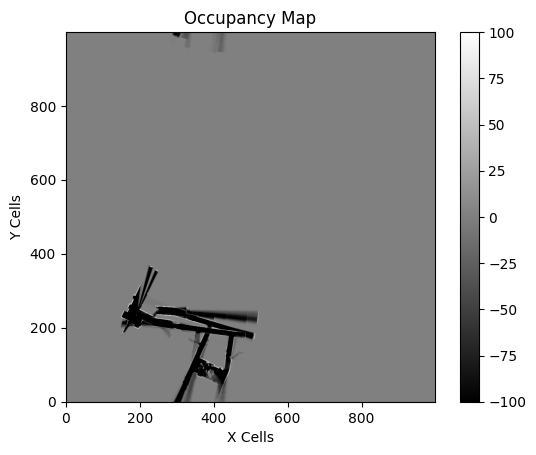

iteration 3801
iteration 3802
iteration 3803
iteration 3804
iteration 3805
iteration 3806
iteration 3807
resampling done
iteration 3808


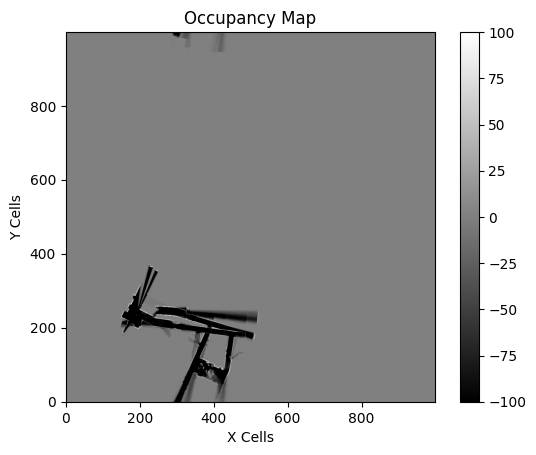

In [66]:
occupancymaps_all_3_bad_width = lidar_hits_2(FL_3,FR_3,RL_3,RR_3,ts_enc_3,encoder_ticks_to_meters,width_between_wheels,1.2,lidar_3,matched_lidar_indices_3,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

iteration 0


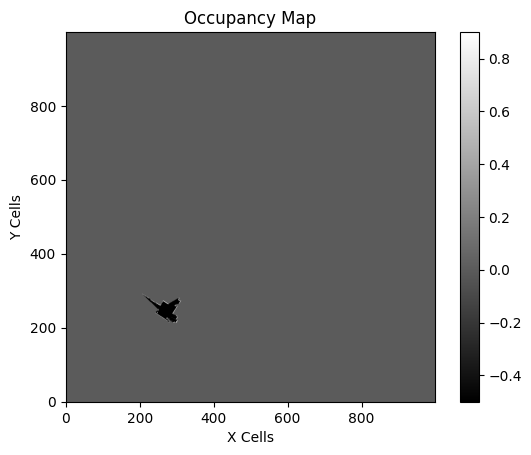

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
resampling done
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
resampling done
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
iteration 75
it

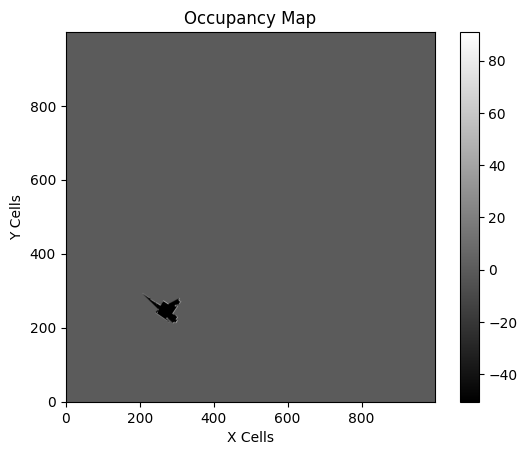

iteration 101
iteration 102
resampling done
iteration 103
iteration 104
iteration 105
iteration 106
resampling done
iteration 107
iteration 108
iteration 109
iteration 110
resampling done
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
iteration 116
iteration 117
iteration 118
iteration 119
iteration 120
resampling done
iteration 121
iteration 122
iteration 123
iteration 124
iteration 125
iteration 126
iteration 127
iteration 128
iteration 129
iteration 130
resampling done
iteration 131
iteration 132
iteration 133
iteration 134
iteration 135
resampling done
iteration 136
iteration 137
iteration 138
iteration 139
iteration 140
iteration 141
iteration 142
iteration 143
iteration 144
iteration 145
resampling done
iteration 146
iteration 147
iteration 148
iteration 149
iteration 150
iteration 151
iteration 152
iteration 153
iteration 154
iteration 155
resampling done
iteration 156
iteration 157
iteration 158
iteration 159
iteration 160
iteration 161
iteration 162
iter

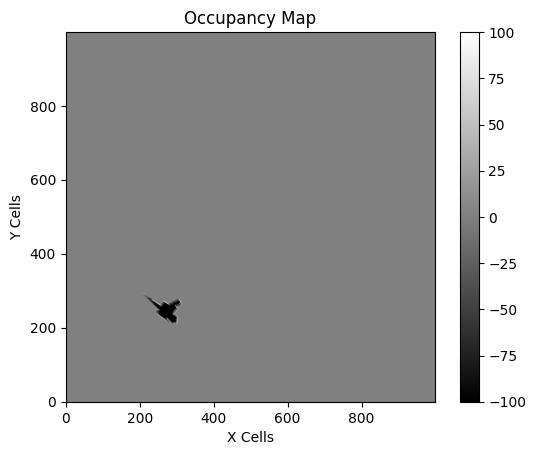

iteration 201
iteration 202
iteration 203
iteration 204
iteration 205
iteration 206
iteration 207
iteration 208
iteration 209
iteration 210
iteration 211
iteration 212
iteration 213
iteration 214
iteration 215
iteration 216
iteration 217
iteration 218
iteration 219
iteration 220
iteration 221
resampling done
iteration 222
iteration 223
iteration 224
iteration 225
iteration 226
iteration 227
iteration 228
iteration 229
iteration 230
iteration 231
iteration 232
iteration 233
resampling done
iteration 234
iteration 235
iteration 236
iteration 237
iteration 238
iteration 239
iteration 240
iteration 241
iteration 242
iteration 243
iteration 244
iteration 245
iteration 246
iteration 247
iteration 248
iteration 249
iteration 250
iteration 251
iteration 252
iteration 253
iteration 254
iteration 255
iteration 256
iteration 257
iteration 258
iteration 259
resampling done
iteration 260
iteration 261
iteration 262
iteration 263
iteration 264
iteration 265
iteration 266
iteration 267
iteration 268


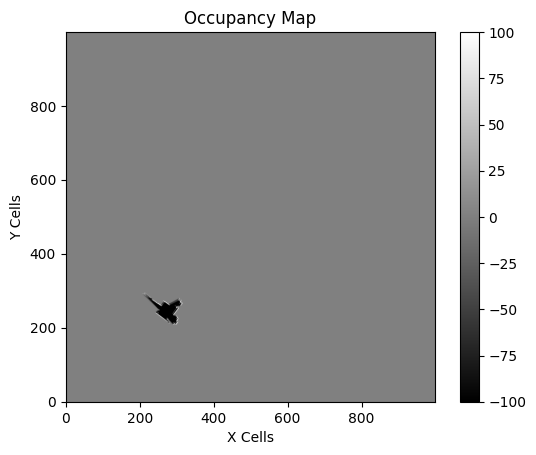

iteration 301
iteration 302
iteration 303
iteration 304
resampling done
iteration 305
iteration 306
iteration 307
iteration 308
iteration 309
iteration 310
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
iteration 317
iteration 318
iteration 319
iteration 320
iteration 321
iteration 322
resampling done
iteration 323
iteration 324
iteration 325
iteration 326
iteration 327
iteration 328
iteration 329
iteration 330
iteration 331
iteration 332
iteration 333
iteration 334
iteration 335
iteration 336
iteration 337
iteration 338
iteration 339
resampling done
iteration 340
iteration 341
iteration 342
iteration 343
iteration 344
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
iteration 353
iteration 354
iteration 355
iteration 356
iteration 357
iteration 358
iteration 359
iteration 360
iteration 361
iteration 362
iteration 363
resampling done
iteration 364
iteration 365
iteration 366
iteration 36

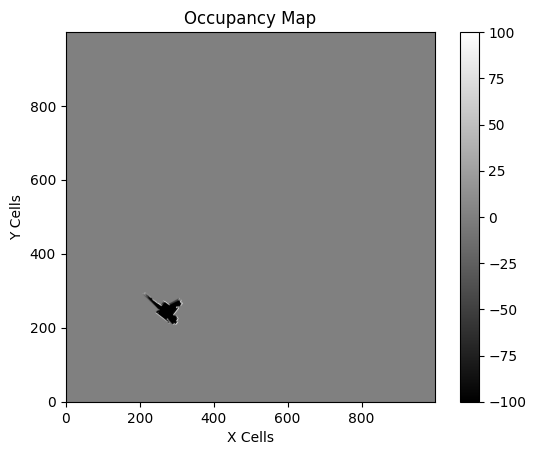

iteration 401
iteration 402
iteration 403
iteration 404
iteration 405
iteration 406
iteration 407
iteration 408
iteration 409
iteration 410
iteration 411
iteration 412
iteration 413
iteration 414
iteration 415
iteration 416
iteration 417
iteration 418
iteration 419
iteration 420
iteration 421
iteration 422
iteration 423
iteration 424
iteration 425
iteration 426
iteration 427
resampling done
iteration 428
iteration 429
iteration 430
iteration 431
iteration 432
iteration 433
iteration 434
iteration 435
iteration 436
iteration 437
iteration 438
iteration 439
iteration 440
iteration 441
iteration 442
iteration 443
iteration 444
resampling done
iteration 445
iteration 446
iteration 447
iteration 448
iteration 449
iteration 450
iteration 451
iteration 452
iteration 453
iteration 454
iteration 455
iteration 456
iteration 457
iteration 458
iteration 459
iteration 460
iteration 461
iteration 462
iteration 463
iteration 464
iteration 465
iteration 466
iteration 467
resampling done
iteration 468


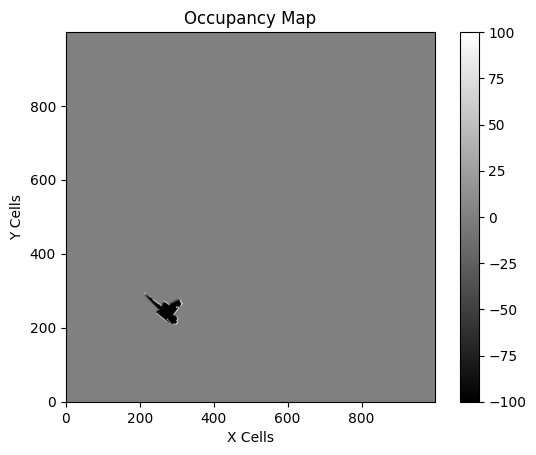

iteration 501
iteration 502
iteration 503
iteration 504
iteration 505
iteration 506
iteration 507
iteration 508
iteration 509
iteration 510
iteration 511
iteration 512
iteration 513
iteration 514
iteration 515
iteration 516
iteration 517
iteration 518
iteration 519
iteration 520
resampling done
iteration 521
iteration 522
iteration 523
iteration 524
iteration 525
iteration 526
iteration 527
iteration 528
iteration 529
iteration 530
iteration 531
iteration 532
iteration 533
iteration 534
iteration 535
iteration 536
iteration 537
iteration 538
iteration 539
iteration 540
iteration 541
iteration 542
iteration 543
resampling done
iteration 544
iteration 545
iteration 546
iteration 547
iteration 548
iteration 549
iteration 550
iteration 551
iteration 552
iteration 553
iteration 554
iteration 555
iteration 556
iteration 557
iteration 558
iteration 559
iteration 560
resampling done
iteration 561
iteration 562
iteration 563
iteration 564
resampling done
iteration 565
iteration 566
resampling d

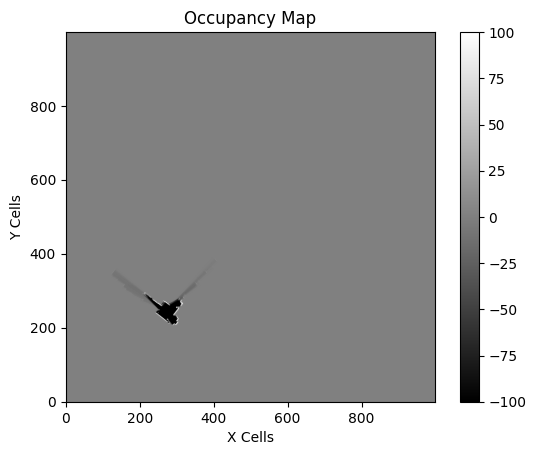

iteration 601
resampling done
iteration 602
iteration 603
iteration 604
iteration 605
resampling done
iteration 606
iteration 607
iteration 608
resampling done
iteration 609
resampling done
iteration 610
resampling done
iteration 611
iteration 612
resampling done
iteration 613
resampling done
iteration 614
resampling done
iteration 615
iteration 616
iteration 617
iteration 618
iteration 619
iteration 620
iteration 621
resampling done
iteration 622
iteration 623
iteration 624
iteration 625
iteration 626
resampling done
iteration 627
resampling done
iteration 628
iteration 629
iteration 630
resampling done
iteration 631
iteration 632
iteration 633
iteration 634
iteration 635
iteration 636
resampling done
iteration 637
iteration 638
iteration 639
iteration 640
resampling done
iteration 641
iteration 642
iteration 643
resampling done
iteration 644
resampling done
iteration 645
resampling done
iteration 646
resampling done
iteration 647
resampling done
iteration 648
resampling done
iteratio

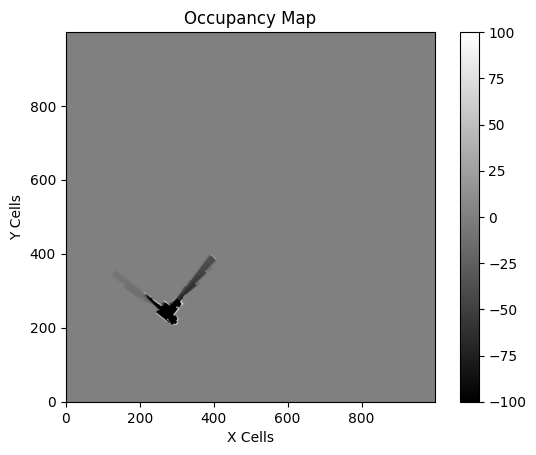

iteration 701
iteration 702
resampling done
iteration 703
iteration 704
iteration 705
iteration 706
iteration 707
iteration 708
iteration 709
iteration 710
iteration 711
iteration 712
iteration 713
iteration 714
iteration 715
iteration 716
iteration 717
iteration 718
iteration 719
iteration 720
iteration 721
iteration 722
iteration 723
iteration 724
iteration 725
iteration 726
iteration 727
iteration 728
iteration 729
iteration 730
iteration 731
iteration 732
iteration 733
iteration 734
iteration 735
iteration 736
iteration 737
iteration 738
iteration 739
iteration 740
iteration 741
iteration 742
iteration 743
iteration 744
iteration 745
iteration 746
resampling done
iteration 747
iteration 748
iteration 749
iteration 750
iteration 751
iteration 752
iteration 753
iteration 754
iteration 755
iteration 756
iteration 757
iteration 758
iteration 759
iteration 760
iteration 761
iteration 762
iteration 763
resampling done
iteration 764
iteration 765
iteration 766
iteration 767
iteration 768


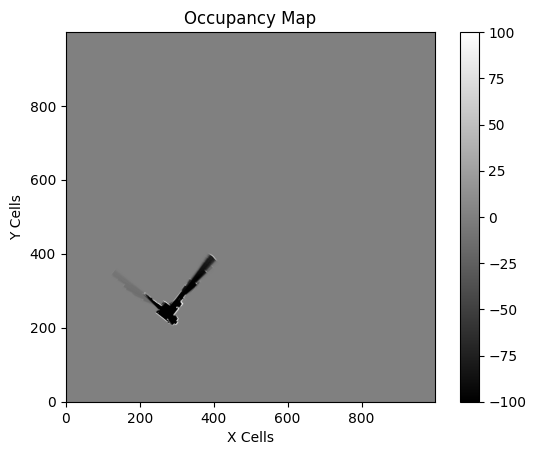

iteration 801
iteration 802
iteration 803
iteration 804
iteration 805
iteration 806
iteration 807
resampling done
iteration 808
resampling done
iteration 809
resampling done
iteration 810
iteration 811
iteration 812
resampling done
iteration 813
resampling done
iteration 814
resampling done
iteration 815
iteration 816
iteration 817
iteration 818
resampling done
iteration 819
iteration 820
iteration 821
iteration 822
iteration 823
iteration 824
iteration 825
resampling done
iteration 826
iteration 827
iteration 828
iteration 829
iteration 830
iteration 831
iteration 832
resampling done
iteration 833
iteration 834
iteration 835
iteration 836
iteration 837
iteration 838
iteration 839
resampling done
iteration 840
resampling done
iteration 841
iteration 842
iteration 843
iteration 844
iteration 845
resampling done
iteration 846
iteration 847
iteration 848
iteration 849
iteration 850
iteration 851
iteration 852
iteration 853
resampling done
iteration 854
iteration 855
iteration 856
iteratio

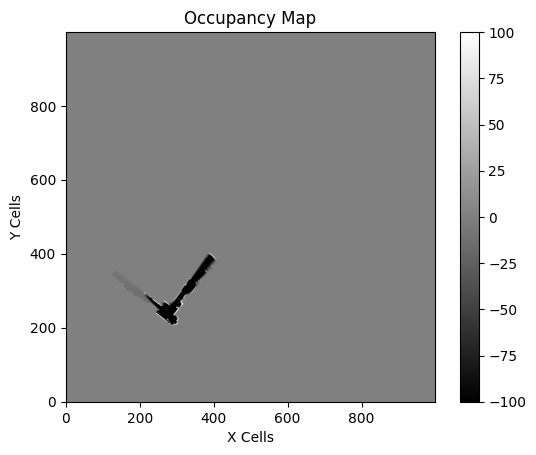

iteration 901
iteration 902
iteration 903
iteration 904
iteration 905
iteration 906
iteration 907
iteration 908
iteration 909
iteration 910
iteration 911
iteration 912
iteration 913
iteration 914
resampling done
iteration 915
iteration 916
iteration 917
resampling done
iteration 918
resampling done
iteration 919
resampling done
iteration 920
iteration 921
resampling done
iteration 922
resampling done
iteration 923
iteration 924
iteration 925
iteration 926
resampling done
iteration 927
iteration 928
iteration 929
iteration 930
iteration 931
resampling done
iteration 932
iteration 933
iteration 934
resampling done
iteration 935
iteration 936
iteration 937
resampling done
iteration 938
iteration 939
resampling done
iteration 940
iteration 941
iteration 942
resampling done
iteration 943
iteration 944
iteration 945
iteration 946
iteration 947
iteration 948
iteration 949
iteration 950
iteration 951
iteration 952
resampling done
iteration 953
iteration 954
iteration 955
iteration 956
resampli

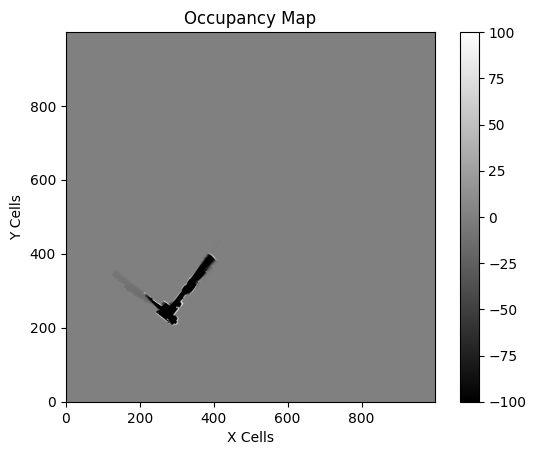

iteration 1001
iteration 1002
iteration 1003
resampling done
iteration 1004
iteration 1005
iteration 1006
iteration 1007
iteration 1008
resampling done
iteration 1009
iteration 1010
iteration 1011
iteration 1012
iteration 1013
resampling done
iteration 1014
iteration 1015
iteration 1016
iteration 1017
iteration 1018
resampling done
iteration 1019
iteration 1020
resampling done
iteration 1021
iteration 1022
iteration 1023
resampling done
iteration 1024
iteration 1025
resampling done
iteration 1026
iteration 1027
iteration 1028
iteration 1029
resampling done
iteration 1030
iteration 1031
iteration 1032
iteration 1033
iteration 1034
resampling done
iteration 1035
iteration 1036
iteration 1037
resampling done
iteration 1038
resampling done
iteration 1039
resampling done
iteration 1040
iteration 1041
resampling done
iteration 1042
iteration 1043
iteration 1044
iteration 1045
iteration 1046
iteration 1047
resampling done
iteration 1048
iteration 1049
iteration 1050
iteration 1051
iteration 1

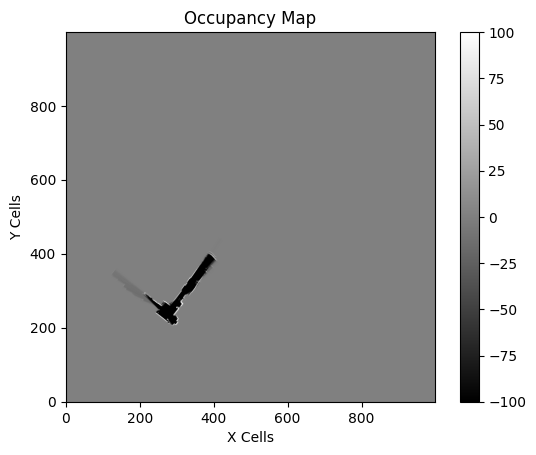

iteration 1101
iteration 1102
iteration 1103
iteration 1104
iteration 1105
iteration 1106
iteration 1107
iteration 1108
resampling done
iteration 1109
resampling done
iteration 1110
iteration 1111
resampling done
iteration 1112
iteration 1113
iteration 1114
resampling done
iteration 1115
iteration 1116
iteration 1117
iteration 1118
resampling done
iteration 1119
resampling done
iteration 1120
resampling done
iteration 1121
iteration 1122
resampling done
iteration 1123
iteration 1124
iteration 1125
resampling done
iteration 1126
iteration 1127
iteration 1128
iteration 1129
iteration 1130
iteration 1131
resampling done
iteration 1132
iteration 1133
iteration 1134
iteration 1135
iteration 1136
iteration 1137
iteration 1138
iteration 1139
resampling done
iteration 1140
resampling done
iteration 1141
iteration 1142
resampling done
iteration 1143
resampling done
iteration 1144
resampling done
iteration 1145
resampling done
iteration 1146
resampling done
iteration 1147
resampling done
iterati

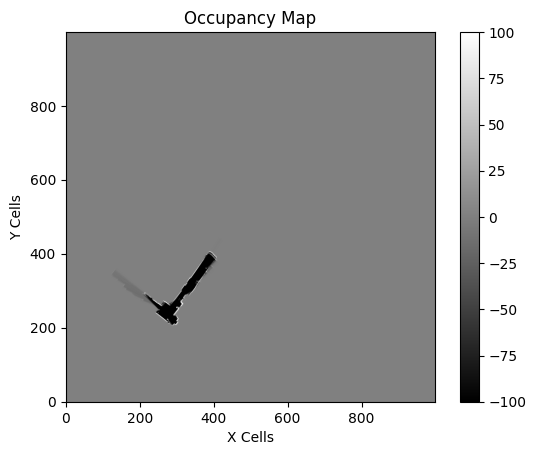

iteration 1201
iteration 1202
iteration 1203
resampling done
iteration 1204
iteration 1205
iteration 1206
iteration 1207
iteration 1208
iteration 1209
iteration 1210
iteration 1211
iteration 1212
iteration 1213
iteration 1214
iteration 1215
resampling done
iteration 1216
iteration 1217
iteration 1218
iteration 1219
iteration 1220
iteration 1221
iteration 1222
iteration 1223
iteration 1224
iteration 1225
iteration 1226
iteration 1227
iteration 1228
iteration 1229
iteration 1230
resampling done
iteration 1231
iteration 1232
iteration 1233
iteration 1234
iteration 1235
iteration 1236
iteration 1237
resampling done
iteration 1238
iteration 1239
iteration 1240
iteration 1241
iteration 1242
iteration 1243
iteration 1244
iteration 1245
iteration 1246
resampling done
iteration 1247
iteration 1248
iteration 1249
iteration 1250
iteration 1251
iteration 1252
iteration 1253
resampling done
iteration 1254
iteration 1255
iteration 1256
iteration 1257
iteration 1258
iteration 1259
iteration 1260
iter

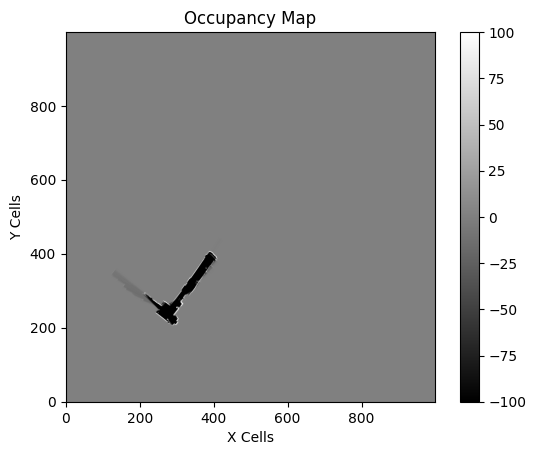

iteration 1301
resampling done
iteration 1302
iteration 1303
iteration 1304
iteration 1305
iteration 1306
iteration 1307
iteration 1308
iteration 1309
iteration 1310
iteration 1311
iteration 1312
iteration 1313
iteration 1314
iteration 1315
iteration 1316
resampling done
iteration 1317
iteration 1318
iteration 1319
iteration 1320
iteration 1321
iteration 1322
iteration 1323
iteration 1324
iteration 1325
iteration 1326
iteration 1327
resampling done
iteration 1328
iteration 1329
iteration 1330
iteration 1331
iteration 1332
resampling done
iteration 1333
iteration 1334
iteration 1335
resampling done
iteration 1336
resampling done
iteration 1337
resampling done
iteration 1338
resampling done
iteration 1339
resampling done
iteration 1340
resampling done
iteration 1341
resampling done
iteration 1342
resampling done
iteration 1343
resampling done
iteration 1344
resampling done
iteration 1345
iteration 1346
resampling done
iteration 1347
iteration 1348
resampling done
iteration 1349
iteration

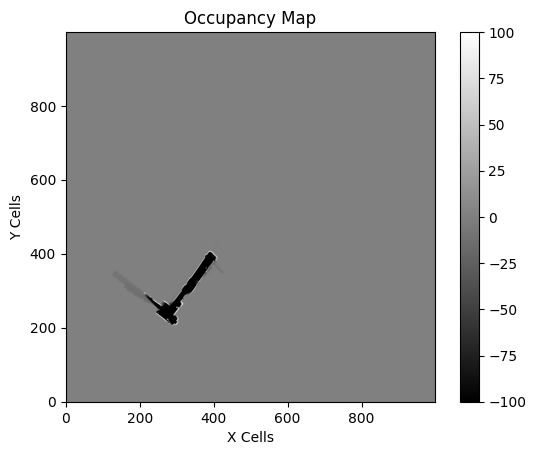

iteration 1401
iteration 1402
resampling done
iteration 1403
resampling done
iteration 1404
resampling done
iteration 1405
iteration 1406
iteration 1407
resampling done
iteration 1408
resampling done
iteration 1409
resampling done
iteration 1410
resampling done
iteration 1411
resampling done
iteration 1412
resampling done
iteration 1413
resampling done
iteration 1414
resampling done
iteration 1415
resampling done
iteration 1416
resampling done
iteration 1417
iteration 1418
iteration 1419
resampling done
iteration 1420
iteration 1421
resampling done
iteration 1422
iteration 1423
iteration 1424
iteration 1425
iteration 1426
resampling done
iteration 1427
iteration 1428
iteration 1429
iteration 1430
iteration 1431
iteration 1432
iteration 1433
resampling done
iteration 1434
iteration 1435
iteration 1436
iteration 1437
iteration 1438
iteration 1439
iteration 1440
iteration 1441
iteration 1442
iteration 1443
iteration 1444
iteration 1445
iteration 1446
iteration 1447
iteration 1448
resampli

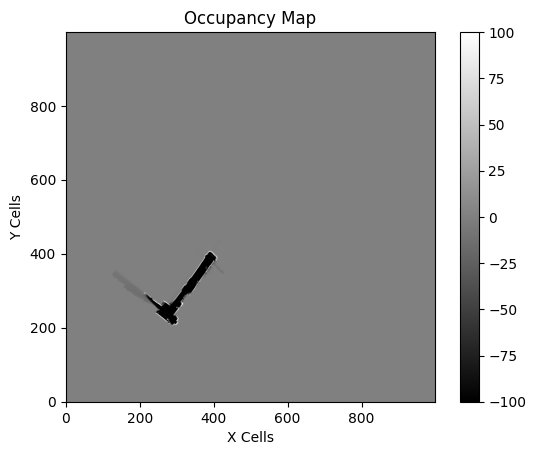

iteration 1501
iteration 1502
resampling done
iteration 1503
iteration 1504
iteration 1505
iteration 1506
iteration 1507
iteration 1508
iteration 1509
iteration 1510
iteration 1511
resampling done
iteration 1512
iteration 1513
iteration 1514
iteration 1515
iteration 1516
iteration 1517
iteration 1518
iteration 1519
iteration 1520
iteration 1521
iteration 1522
iteration 1523
iteration 1524
resampling done
iteration 1525
iteration 1526
iteration 1527
iteration 1528
iteration 1529
iteration 1530
iteration 1531
iteration 1532
iteration 1533
iteration 1534
iteration 1535
resampling done
iteration 1536
iteration 1537
iteration 1538
iteration 1539
iteration 1540
iteration 1541
iteration 1542
iteration 1543
iteration 1544
iteration 1545
iteration 1546
iteration 1547
iteration 1548
iteration 1549
iteration 1550
resampling done
iteration 1551
iteration 1552
iteration 1553
iteration 1554
iteration 1555
iteration 1556
iteration 1557
iteration 1558
iteration 1559
resampling done
iteration 1560
iter

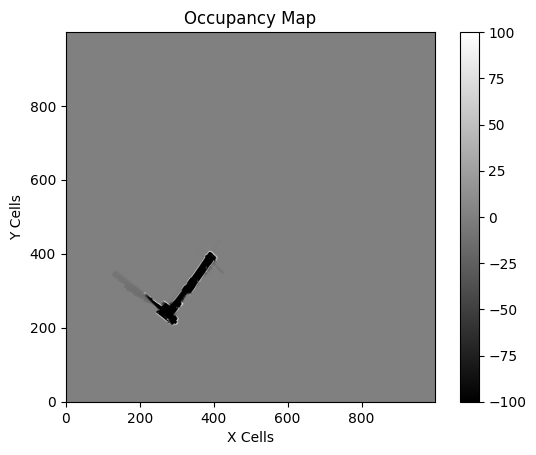

iteration 1601
iteration 1602
iteration 1603
iteration 1604
iteration 1605
iteration 1606
iteration 1607
iteration 1608
iteration 1609
iteration 1610
resampling done
iteration 1611
iteration 1612
iteration 1613
iteration 1614
iteration 1615
iteration 1616
iteration 1617
iteration 1618
iteration 1619
iteration 1620
iteration 1621
iteration 1622
iteration 1623
resampling done
iteration 1624
resampling done
iteration 1625
iteration 1626
resampling done
iteration 1627
iteration 1628
iteration 1629
iteration 1630
resampling done
iteration 1631
iteration 1632
iteration 1633
iteration 1634
iteration 1635
iteration 1636
iteration 1637
iteration 1638
iteration 1639
resampling done
iteration 1640
iteration 1641
iteration 1642
resampling done
iteration 1643
iteration 1644
iteration 1645
iteration 1646
resampling done
iteration 1647
resampling done
iteration 1648
resampling done
iteration 1649
resampling done
iteration 1650
resampling done
iteration 1651
resampling done
iteration 1652
iteration 16

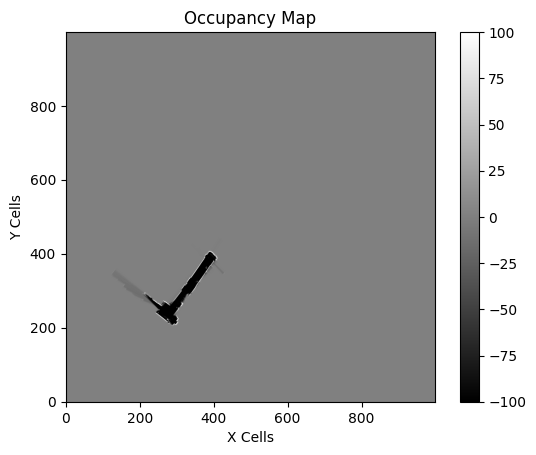

iteration 1701
iteration 1702
iteration 1703
iteration 1704
iteration 1705
iteration 1706
resampling done
iteration 1707
iteration 1708
iteration 1709
iteration 1710
iteration 1711
iteration 1712
iteration 1713
iteration 1714
iteration 1715
iteration 1716
iteration 1717
iteration 1718
iteration 1719
iteration 1720
iteration 1721
iteration 1722
iteration 1723
resampling done
iteration 1724
iteration 1725
iteration 1726
iteration 1727
iteration 1728
iteration 1729
iteration 1730
iteration 1731
iteration 1732
iteration 1733
iteration 1734
iteration 1735
iteration 1736
iteration 1737
iteration 1738
iteration 1739
iteration 1740
iteration 1741
resampling done
iteration 1742
iteration 1743
iteration 1744
iteration 1745
iteration 1746
iteration 1747
resampling done
iteration 1748
iteration 1749
iteration 1750
resampling done
iteration 1751
resampling done
iteration 1752
iteration 1753
resampling done
iteration 1754
resampling done
iteration 1755
iteration 1756
iteration 1757
iteration 1758
re

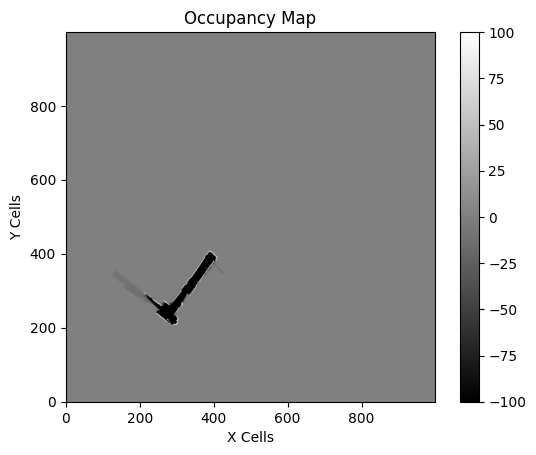

iteration 1801
iteration 1802
iteration 1803
iteration 1804
iteration 1805
iteration 1806
iteration 1807
iteration 1808
iteration 1809
resampling done
iteration 1810
iteration 1811
iteration 1812
iteration 1813
resampling done
iteration 1814
iteration 1815
iteration 1816
iteration 1817
resampling done
iteration 1818
iteration 1819
iteration 1820
resampling done
iteration 1821
iteration 1822
resampling done
iteration 1823
iteration 1824
iteration 1825
iteration 1826
resampling done
iteration 1827
iteration 1828
iteration 1829
resampling done
iteration 1830
iteration 1831
iteration 1832
iteration 1833
resampling done
iteration 1834
iteration 1835
resampling done
iteration 1836
iteration 1837
iteration 1838
iteration 1839
iteration 1840
iteration 1841
resampling done
iteration 1842
resampling done
iteration 1843
resampling done
iteration 1844
resampling done
iteration 1845
resampling done
iteration 1846
resampling done
iteration 1847
resampling done
iteration 1848
resampling done
iteratio

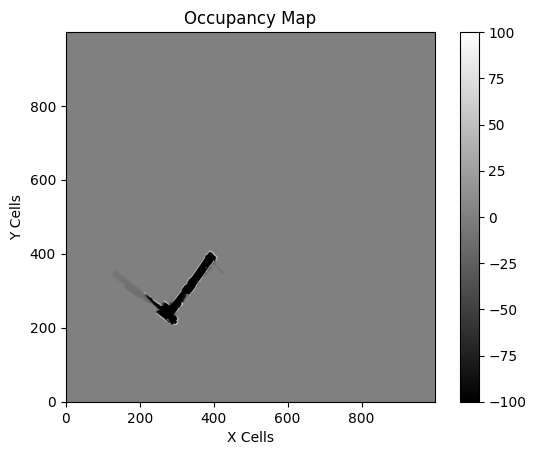

iteration 1901
iteration 1902
resampling done
iteration 1903
resampling done
iteration 1904
resampling done
iteration 1905
resampling done
iteration 1906
iteration 1907
resampling done
iteration 1908
iteration 1909
iteration 1910
iteration 1911
iteration 1912
iteration 1913
iteration 1914
iteration 1915
resampling done
iteration 1916
iteration 1917
iteration 1918
iteration 1919
iteration 1920
iteration 1921
iteration 1922
iteration 1923
iteration 1924
iteration 1925
iteration 1926
iteration 1927
iteration 1928
iteration 1929
resampling done
iteration 1930
iteration 1931
iteration 1932
iteration 1933
iteration 1934
iteration 1935
iteration 1936
iteration 1937
iteration 1938
resampling done
iteration 1939
iteration 1940
iteration 1941
iteration 1942
iteration 1943
iteration 1944
iteration 1945
iteration 1946
iteration 1947
resampling done
iteration 1948
iteration 1949
iteration 1950
iteration 1951
iteration 1952
iteration 1953
iteration 1954
iteration 1955
iteration 1956
iteration 1957
i

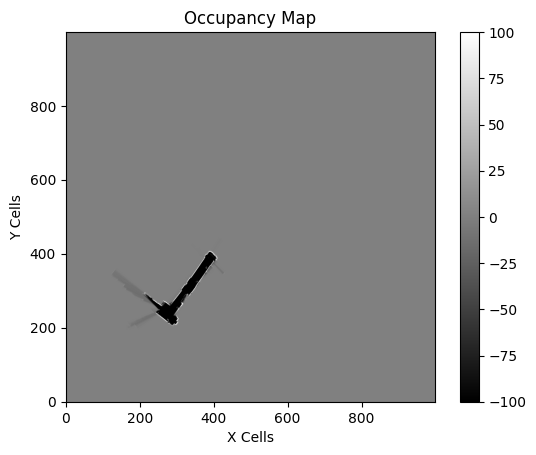

iteration 2001
resampling done
iteration 2002
resampling done
iteration 2003
resampling done
iteration 2004
resampling done
iteration 2005
resampling done
iteration 2006
resampling done
iteration 2007
resampling done
iteration 2008
iteration 2009
resampling done
iteration 2010
resampling done
iteration 2011
resampling done
iteration 2012
resampling done
iteration 2013
resampling done
iteration 2014
resampling done
iteration 2015
resampling done
iteration 2016
iteration 2017
resampling done
iteration 2018
iteration 2019
iteration 2020
iteration 2021
iteration 2022
iteration 2023
iteration 2024
iteration 2025
iteration 2026
iteration 2027
iteration 2028
iteration 2029
resampling done
iteration 2030
iteration 2031
iteration 2032
iteration 2033
iteration 2034
iteration 2035
resampling done
iteration 2036
iteration 2037
iteration 2038
iteration 2039
iteration 2040
iteration 2041
iteration 2042
iteration 2043
iteration 2044
resampling done
iteration 2045
iteration 2046
iteration 2047
iterati

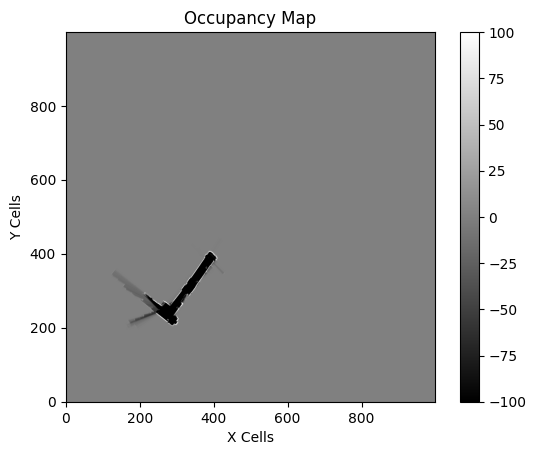

iteration 2101
iteration 2102
iteration 2103
iteration 2104
iteration 2105
iteration 2106
iteration 2107
iteration 2108
resampling done
iteration 2109
iteration 2110
iteration 2111
iteration 2112
iteration 2113
iteration 2114
iteration 2115
iteration 2116
iteration 2117
iteration 2118
iteration 2119
iteration 2120
iteration 2121
iteration 2122
iteration 2123
iteration 2124
iteration 2125
iteration 2126
iteration 2127
iteration 2128
resampling done
iteration 2129
iteration 2130
iteration 2131
iteration 2132
resampling done
iteration 2133
iteration 2134
iteration 2135
iteration 2136
resampling done
iteration 2137
iteration 2138
iteration 2139
iteration 2140
iteration 2141
iteration 2142
iteration 2143
iteration 2144
iteration 2145
iteration 2146
iteration 2147
iteration 2148
resampling done
iteration 2149
resampling done
iteration 2150
iteration 2151
resampling done
iteration 2152
resampling done
iteration 2153
resampling done
iteration 2154
iteration 2155
resampling done
iteration 2156


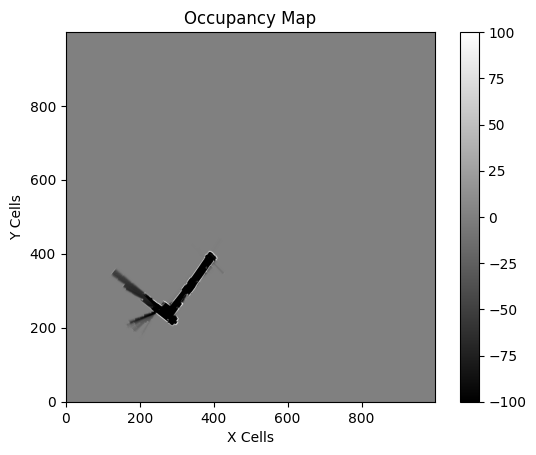

iteration 2201
iteration 2202
iteration 2203
iteration 2204
iteration 2205
iteration 2206
iteration 2207
iteration 2208
iteration 2209
resampling done
iteration 2210
iteration 2211
iteration 2212
iteration 2213
iteration 2214
iteration 2215
iteration 2216
iteration 2217
iteration 2218
iteration 2219
iteration 2220
iteration 2221
iteration 2222
iteration 2223
iteration 2224
iteration 2225
iteration 2226
iteration 2227
iteration 2228
iteration 2229
iteration 2230
iteration 2231
iteration 2232
iteration 2233
iteration 2234
iteration 2235
iteration 2236
iteration 2237
iteration 2238
iteration 2239
resampling done
iteration 2240
iteration 2241
iteration 2242
iteration 2243
iteration 2244
iteration 2245
iteration 2246
iteration 2247
iteration 2248
iteration 2249
iteration 2250
iteration 2251
iteration 2252
iteration 2253
iteration 2254
iteration 2255
iteration 2256
iteration 2257
iteration 2258
iteration 2259
resampling done
iteration 2260
iteration 2261
iteration 2262
iteration 2263
iterati

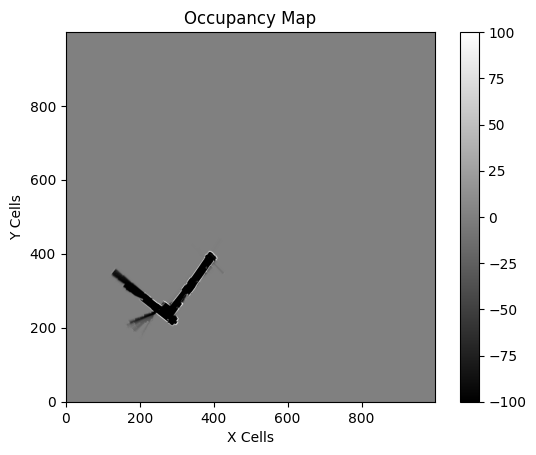

iteration 2301
resampling done
iteration 2302
resampling done
iteration 2303
iteration 2304
resampling done
iteration 2305
resampling done
iteration 2306
resampling done
iteration 2307
iteration 2308
iteration 2309
iteration 2310
iteration 2311
iteration 2312
iteration 2313
iteration 2314
iteration 2315
resampling done
iteration 2316
iteration 2317
resampling done
iteration 2318
iteration 2319
iteration 2320
iteration 2321
iteration 2322
resampling done
iteration 2323
iteration 2324
iteration 2325
iteration 2326
iteration 2327
iteration 2328
iteration 2329
iteration 2330
iteration 2331
iteration 2332
iteration 2333
resampling done
iteration 2334
iteration 2335
iteration 2336
iteration 2337
iteration 2338
iteration 2339
iteration 2340
iteration 2341
iteration 2342
iteration 2343
iteration 2344
iteration 2345
iteration 2346
iteration 2347
resampling done
iteration 2348
iteration 2349
iteration 2350
iteration 2351
iteration 2352
iteration 2353
iteration 2354
iteration 2355
iteration 2356


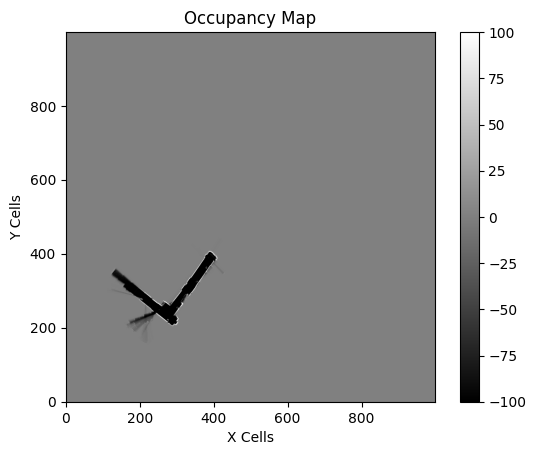

iteration 2401
iteration 2402
resampling done
iteration 2403
resampling done
iteration 2404
resampling done
iteration 2405
iteration 2406
resampling done
iteration 2407
iteration 2408
resampling done
iteration 2409
iteration 2410
resampling done
iteration 2411
resampling done
iteration 2412
resampling done
iteration 2413
resampling done
iteration 2414
resampling done
iteration 2415
resampling done
iteration 2416
iteration 2417
iteration 2418
iteration 2419
iteration 2420
iteration 2421
iteration 2422
resampling done
iteration 2423
iteration 2424
resampling done
iteration 2425
resampling done
iteration 2426
iteration 2427
iteration 2428
resampling done
iteration 2429
iteration 2430
iteration 2431
resampling done
iteration 2432
resampling done
iteration 2433
iteration 2434
iteration 2435
resampling done
iteration 2436
iteration 2437
iteration 2438
iteration 2439
iteration 2440
iteration 2441
iteration 2442
iteration 2443
iteration 2444
iteration 2445
iteration 2446
resampling done
iterat

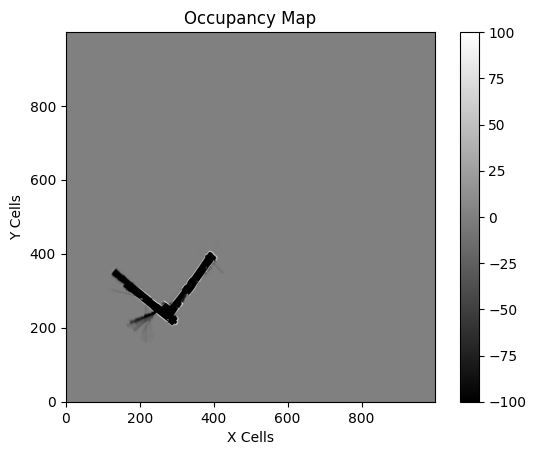

iteration 2501
iteration 2502
iteration 2503
resampling done
iteration 2504
iteration 2505
iteration 2506
resampling done
iteration 2507
iteration 2508
iteration 2509
resampling done
iteration 2510
iteration 2511
iteration 2512
resampling done
iteration 2513
iteration 2514
iteration 2515
iteration 2516
iteration 2517
resampling done
iteration 2518
iteration 2519
iteration 2520
iteration 2521
iteration 2522
resampling done
iteration 2523
iteration 2524
iteration 2525
iteration 2526
resampling done
iteration 2527
iteration 2528
iteration 2529
iteration 2530
iteration 2531
iteration 2532
iteration 2533
iteration 2534
resampling done
iteration 2535
iteration 2536
iteration 2537
iteration 2538
iteration 2539
iteration 2540
resampling done
iteration 2541
iteration 2542
iteration 2543
resampling done
iteration 2544
iteration 2545
iteration 2546
iteration 2547
iteration 2548
resampling done
iteration 2549
resampling done
iteration 2550
iteration 2551
resampling done
iteration 2552
resampling d

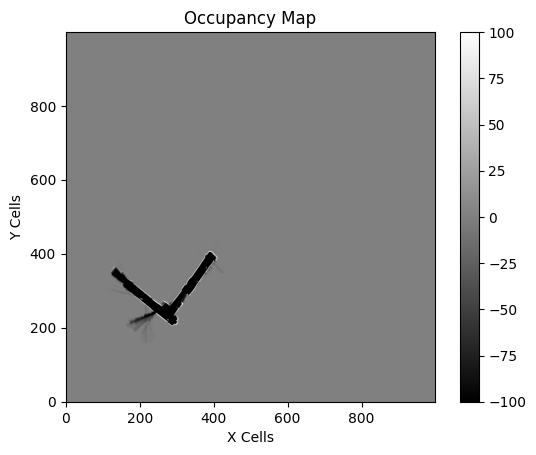

iteration 2601
iteration 2602
iteration 2603
iteration 2604
resampling done
iteration 2605
iteration 2606
iteration 2607
iteration 2608
iteration 2609
iteration 2610
iteration 2611
resampling done
iteration 2612
iteration 2613
iteration 2614
iteration 2615
iteration 2616
resampling done
iteration 2617
iteration 2618
iteration 2619
iteration 2620
iteration 2621
iteration 2622
iteration 2623
resampling done
iteration 2624
iteration 2625
resampling done
iteration 2626
iteration 2627
iteration 2628
resampling done
iteration 2629
iteration 2630
iteration 2631
iteration 2632
iteration 2633
iteration 2634
resampling done
iteration 2635
iteration 2636
iteration 2637
iteration 2638
iteration 2639
resampling done
iteration 2640
iteration 2641
iteration 2642
resampling done
iteration 2643
iteration 2644
resampling done
iteration 2645
resampling done
iteration 2646
iteration 2647
resampling done
iteration 2648
resampling done
iteration 2649
resampling done
iteration 2650
resampling done
iteration 

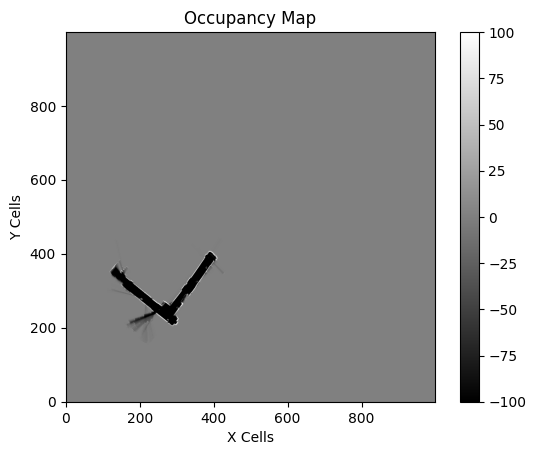

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
resampling done
iteration 2704
resampling done
iteration 2705
resampling done
iteration 2706
resampling done
iteration 2707
resampling done
iteration 2708
resampling done
iteration 2709
resampling done
iteration 2710
resampling done
iteration 2711
resampling done
iteration 2712
resampling done
iteration 2713
resampling done
iteration 2714
resampling done
iteration 2715
resampling done
iteration 2716
resampling done
iteration 2717
resampling done
iteration 2718
resampling done
iteration 2719
resampling done
iteration 2720
resampling done
iteration 2721
resampling done
iteration 2722
resampling done
iteration 2723
resampling done
iteration 2724
resampling done
iteration 2725
resampling done
iteration 2726
resampling done
iteration 2727
resampling done
iteration 2728
resampling done
iteration 2729
iteration 2730
resampling done
iteration 2731
iteration 2732
iteration 2733
iteration 2734
resampling done
iteration 

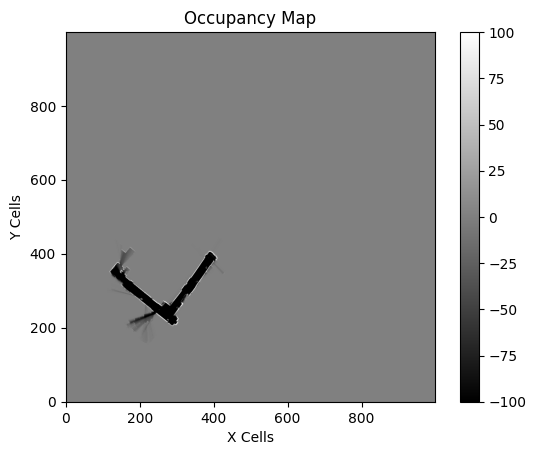

iteration 2801
iteration 2802
resampling done
iteration 2803
iteration 2804
iteration 2805
iteration 2806
iteration 2807
iteration 2808
iteration 2809
iteration 2810
iteration 2811
iteration 2812
iteration 2813
resampling done
iteration 2814
iteration 2815
resampling done
iteration 2816
resampling done
iteration 2817
resampling done
iteration 2818
iteration 2819
resampling done
iteration 2820
iteration 2821
iteration 2822
resampling done
iteration 2823
iteration 2824
iteration 2825
iteration 2826
iteration 2827
resampling done
iteration 2828
iteration 2829
iteration 2830
iteration 2831
resampling done
iteration 2832
iteration 2833
iteration 2834
iteration 2835
iteration 2836
iteration 2837
iteration 2838
iteration 2839
iteration 2840
iteration 2841
iteration 2842
iteration 2843
iteration 2844
iteration 2845
iteration 2846
iteration 2847
resampling done
iteration 2848
iteration 2849
iteration 2850
iteration 2851
iteration 2852
iteration 2853
iteration 2854
resampling done
iteration 2855

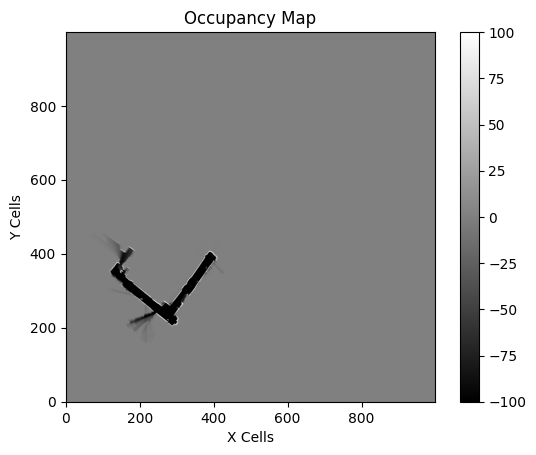

iteration 2901
iteration 2902
iteration 2903
iteration 2904
iteration 2905
iteration 2906
iteration 2907
iteration 2908
iteration 2909
resampling done
iteration 2910
iteration 2911
iteration 2912
iteration 2913
iteration 2914
iteration 2915
iteration 2916
iteration 2917
resampling done
iteration 2918
resampling done
iteration 2919
iteration 2920
iteration 2921
iteration 2922
resampling done
iteration 2923
iteration 2924
iteration 2925
iteration 2926
iteration 2927
iteration 2928
iteration 2929
iteration 2930
iteration 2931
iteration 2932
iteration 2933
resampling done
iteration 2934
iteration 2935
iteration 2936
resampling done
iteration 2937
iteration 2938
resampling done
iteration 2939
resampling done
iteration 2940
iteration 2941
resampling done
iteration 2942
iteration 2943
resampling done
iteration 2944
iteration 2945
iteration 2946
resampling done
iteration 2947
iteration 2948
iteration 2949
resampling done
iteration 2950
resampling done
iteration 2951
resampling done
iteration 2

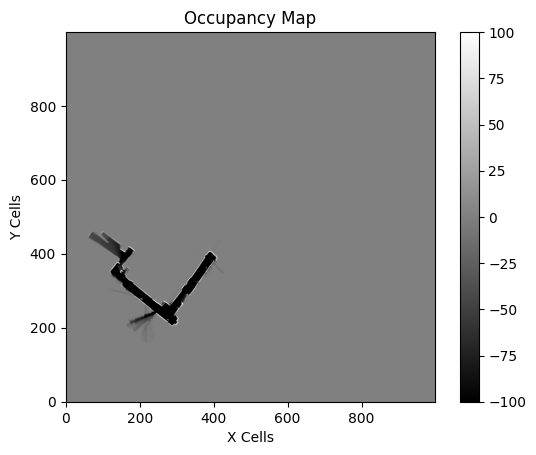

iteration 3001
iteration 3002
iteration 3003
iteration 3004
iteration 3005
iteration 3006
resampling done
iteration 3007
iteration 3008
iteration 3009
iteration 3010
iteration 3011
iteration 3012
iteration 3013
iteration 3014
iteration 3015
iteration 3016
iteration 3017
iteration 3018
resampling done
iteration 3019
iteration 3020
iteration 3021
iteration 3022
iteration 3023
iteration 3024
iteration 3025
iteration 3026
iteration 3027
iteration 3028
iteration 3029
iteration 3030
iteration 3031
iteration 3032
iteration 3033
iteration 3034
iteration 3035
iteration 3036
iteration 3037
iteration 3038
iteration 3039
iteration 3040
resampling done
iteration 3041
iteration 3042
iteration 3043
iteration 3044
iteration 3045
iteration 3046
iteration 3047
iteration 3048
iteration 3049
iteration 3050
iteration 3051
iteration 3052
iteration 3053
iteration 3054
iteration 3055
resampling done
iteration 3056
iteration 3057
iteration 3058
iteration 3059
iteration 3060
iteration 3061
iteration 3062
iterat

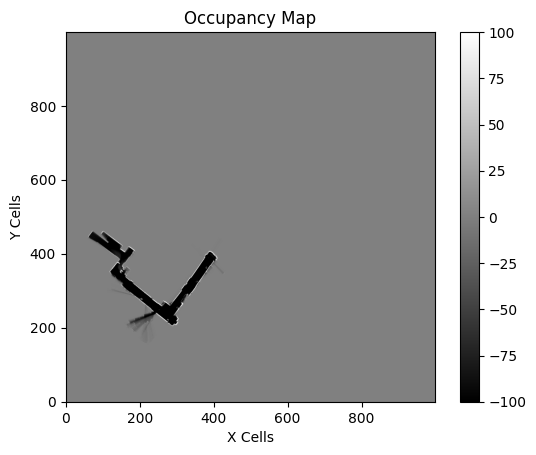

iteration 3101
iteration 3102
resampling done
iteration 3103
iteration 3104
iteration 3105
iteration 3106
iteration 3107
iteration 3108
iteration 3109
iteration 3110
iteration 3111
iteration 3112
iteration 3113
iteration 3114
iteration 3115
resampling done
iteration 3116
iteration 3117
iteration 3118
iteration 3119
iteration 3120
iteration 3121
iteration 3122
iteration 3123
iteration 3124
iteration 3125
iteration 3126
iteration 3127
iteration 3128
iteration 3129
iteration 3130
iteration 3131
iteration 3132
resampling done
iteration 3133
iteration 3134
iteration 3135
iteration 3136
iteration 3137
iteration 3138
iteration 3139
iteration 3140
resampling done
iteration 3141
iteration 3142
iteration 3143
resampling done
iteration 3144
resampling done
iteration 3145
iteration 3146
resampling done
iteration 3147
resampling done
iteration 3148
resampling done
iteration 3149
resampling done
iteration 3150
resampling done
iteration 3151
resampling done
iteration 3152
resampling done
iteration 31

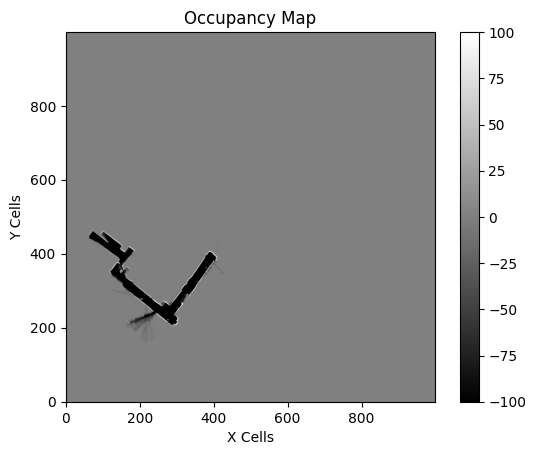

iteration 3201
iteration 3202
iteration 3203
iteration 3204
iteration 3205
iteration 3206
iteration 3207
resampling done
iteration 3208
iteration 3209
iteration 3210
iteration 3211
iteration 3212
iteration 3213
resampling done
iteration 3214
iteration 3215
iteration 3216
iteration 3217
iteration 3218
iteration 3219
iteration 3220
iteration 3221
iteration 3222
resampling done
iteration 3223
resampling done
iteration 3224
iteration 3225
iteration 3226
resampling done
iteration 3227
resampling done
iteration 3228
resampling done
iteration 3229
resampling done
iteration 3230
iteration 3231
resampling done
iteration 3232
iteration 3233
resampling done
iteration 3234
resampling done
iteration 3235
resampling done
iteration 3236
resampling done
iteration 3237
iteration 3238
resampling done
iteration 3239
iteration 3240
resampling done
iteration 3241
iteration 3242
resampling done
iteration 3243
iteration 3244
iteration 3245
iteration 3246
resampling done
iteration 3247
resampling done
iterati

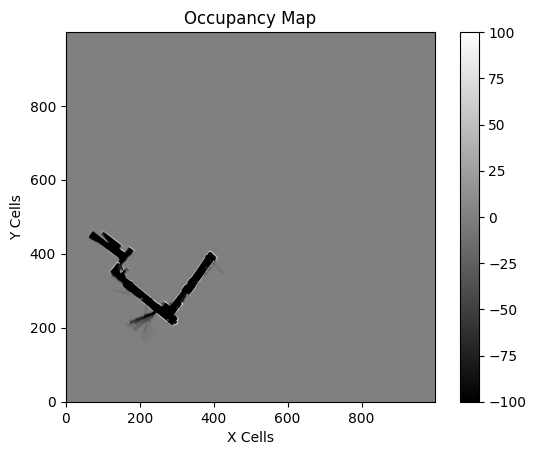

iteration 3301
resampling done
iteration 3302
iteration 3303
iteration 3304
resampling done
iteration 3305
iteration 3306
resampling done
iteration 3307
iteration 3308
iteration 3309
iteration 3310
resampling done
iteration 3311
iteration 3312
iteration 3313
iteration 3314
resampling done
iteration 3315
iteration 3316
iteration 3317
iteration 3318
iteration 3319
iteration 3320
iteration 3321
resampling done
iteration 3322
iteration 3323
iteration 3324
iteration 3325
resampling done
iteration 3326
iteration 3327
iteration 3328
iteration 3329
iteration 3330
resampling done
iteration 3331
iteration 3332
iteration 3333
resampling done
iteration 3334
resampling done
iteration 3335
resampling done
iteration 3336
resampling done
iteration 3337
resampling done
iteration 3338
resampling done
iteration 3339
resampling done
iteration 3340
iteration 3341
resampling done
iteration 3342
iteration 3343
iteration 3344
iteration 3345
iteration 3346
iteration 3347
iteration 3348
resampling done
iteratio

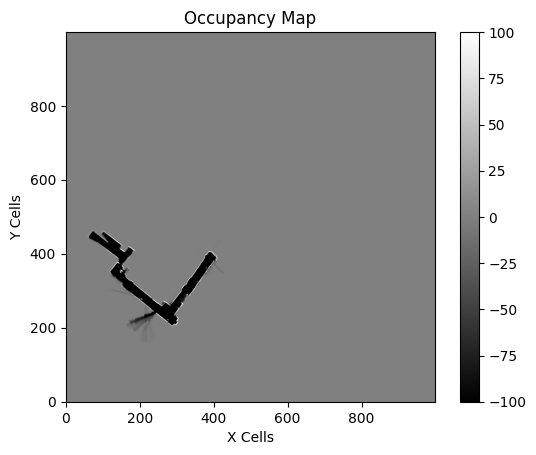

iteration 3401
resampling done
iteration 3402
resampling done
iteration 3403
iteration 3404
resampling done
iteration 3405
resampling done
iteration 3406
resampling done
iteration 3407
iteration 3408
resampling done
iteration 3409
resampling done
iteration 3410
resampling done
iteration 3411
resampling done
iteration 3412
iteration 3413
resampling done
iteration 3414
iteration 3415
resampling done
iteration 3416
resampling done
iteration 3417
resampling done
iteration 3418
resampling done
iteration 3419
resampling done
iteration 3420
resampling done
iteration 3421
resampling done
iteration 3422
iteration 3423
resampling done
iteration 3424
resampling done
iteration 3425
resampling done
iteration 3426
resampling done
iteration 3427
resampling done
iteration 3428
resampling done
iteration 3429
resampling done
iteration 3430
resampling done
iteration 3431
resampling done
iteration 3432
resampling done
iteration 3433
resampling done
iteration 3434
resampling done
iteration 3435
resampling 

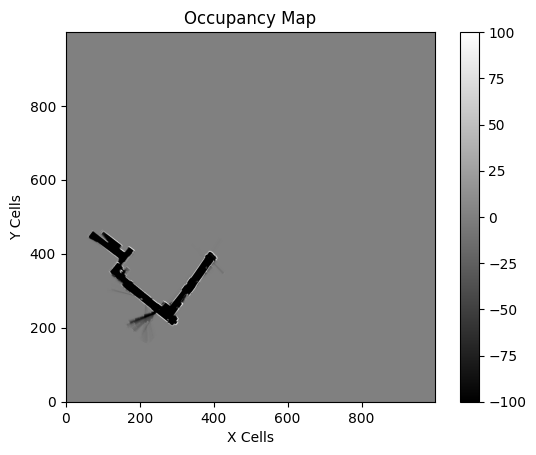

iteration 3501
resampling done
iteration 3502
resampling done
iteration 3503
resampling done
iteration 3504
resampling done
iteration 3505
resampling done
iteration 3506
resampling done
iteration 3507
resampling done
iteration 3508
resampling done
iteration 3509
resampling done
iteration 3510
resampling done
iteration 3511
resampling done
iteration 3512
resampling done
iteration 3513
resampling done
iteration 3514
resampling done
iteration 3515
resampling done
iteration 3516
resampling done
iteration 3517
resampling done
iteration 3518
resampling done
iteration 3519
resampling done
iteration 3520
resampling done
iteration 3521
resampling done
iteration 3522
resampling done
iteration 3523
resampling done
iteration 3524
resampling done
iteration 3525
resampling done
iteration 3526
resampling done
iteration 3527
resampling done
iteration 3528
resampling done
iteration 3529
resampling done
iteration 3530
resampling done
iteration 3531
resampling done
iteration 3532
resampling done
iteratio

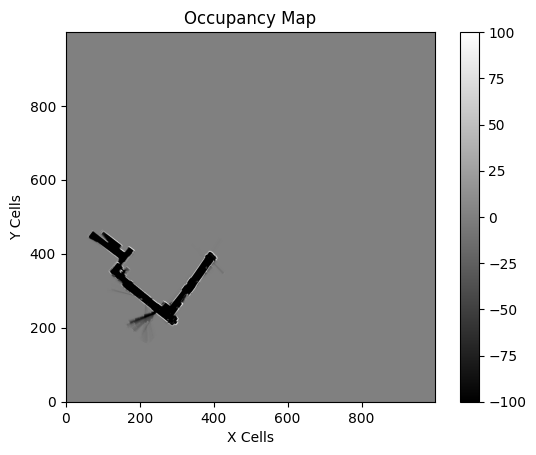

iteration 3601
resampling done
iteration 3602
resampling done
iteration 3603
resampling done
iteration 3604
resampling done
iteration 3605
resampling done
iteration 3606
resampling done
iteration 3607
resampling done
iteration 3608
resampling done
iteration 3609
resampling done
iteration 3610
resampling done
iteration 3611
resampling done
iteration 3612
resampling done
iteration 3613
resampling done
iteration 3614
resampling done
iteration 3615
resampling done
iteration 3616
resampling done
iteration 3617
resampling done
iteration 3618
resampling done
iteration 3619
resampling done
iteration 3620
resampling done
iteration 3621
resampling done
iteration 3622
resampling done
iteration 3623
resampling done
iteration 3624
resampling done
iteration 3625
resampling done
iteration 3626
resampling done
iteration 3627
resampling done
iteration 3628
resampling done
iteration 3629
resampling done
iteration 3630
resampling done
iteration 3631
resampling done
iteration 3632
resampling done
iteratio

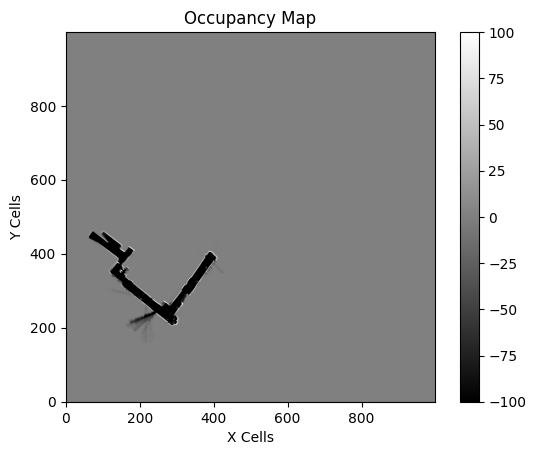

iteration 3701
resampling done
iteration 3702
iteration 3703
iteration 3704
iteration 3705
iteration 3706
iteration 3707
iteration 3708
iteration 3709
iteration 3710
iteration 3711
iteration 3712
iteration 3713
resampling done
iteration 3714
iteration 3715
iteration 3716
resampling done
iteration 3717
iteration 3718
iteration 3719
iteration 3720
iteration 3721
iteration 3722
iteration 3723
iteration 3724
resampling done
iteration 3725
iteration 3726
iteration 3727
iteration 3728
iteration 3729
iteration 3730
iteration 3731
iteration 3732
iteration 3733
iteration 3734
resampling done
iteration 3735
iteration 3736
iteration 3737
iteration 3738
iteration 3739
iteration 3740
iteration 3741
iteration 3742
iteration 3743
iteration 3744
iteration 3745
resampling done
iteration 3746
resampling done
iteration 3747
iteration 3748
resampling done
iteration 3749
resampling done
iteration 3750
iteration 3751
resampling done
iteration 3752
iteration 3753
iteration 3754
resampling done
iteration 3755

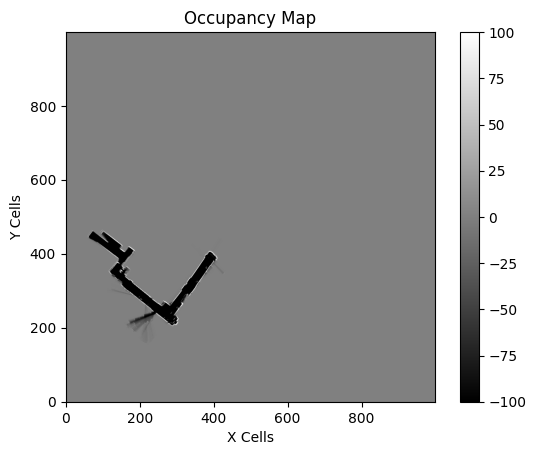

iteration 3801
iteration 3802
iteration 3803
iteration 3804
iteration 3805
iteration 3806
iteration 3807
iteration 3808
resampling done
iteration 3809
iteration 3810
iteration 3811
iteration 3812
iteration 3813
iteration 3814
iteration 3815
iteration 3816
iteration 3817
iteration 3818
iteration 3819
resampling done
iteration 3820
iteration 3821
iteration 3822
iteration 3823
iteration 3824
iteration 3825
resampling done
iteration 3826
iteration 3827
iteration 3828
iteration 3829
iteration 3830
iteration 3831
iteration 3832
iteration 3833
iteration 3834
iteration 3835
iteration 3836
iteration 3837
iteration 3838
iteration 3839
resampling done
iteration 3840
iteration 3841
iteration 3842
iteration 3843
iteration 3844
iteration 3845
iteration 3846
iteration 3847
iteration 3848
iteration 3849
iteration 3850
resampling done
iteration 3851
iteration 3852
iteration 3853
iteration 3854
iteration 3855
iteration 3856
iteration 3857
iteration 3858
iteration 3859
iteration 3860
resampling done
iter

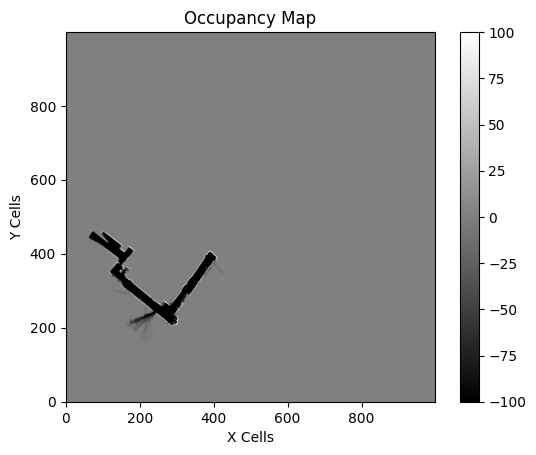

iteration 3901
iteration 3902
iteration 3903
resampling done
iteration 3904
iteration 3905
iteration 3906
iteration 3907
iteration 3908
iteration 3909
resampling done
iteration 3910
resampling done
iteration 3911
iteration 3912
resampling done
iteration 3913
resampling done
iteration 3914
iteration 3915
iteration 3916
iteration 3917
iteration 3918
iteration 3919
iteration 3920
iteration 3921
iteration 3922
iteration 3923
iteration 3924
iteration 3925
iteration 3926
iteration 3927
iteration 3928
iteration 3929
resampling done
iteration 3930
iteration 3931
iteration 3932
iteration 3933
iteration 3934
iteration 3935
iteration 3936
iteration 3937
iteration 3938
iteration 3939
iteration 3940
iteration 3941
iteration 3942
iteration 3943
iteration 3944
iteration 3945
iteration 3946
iteration 3947
iteration 3948
iteration 3949
resampling done
iteration 3950
iteration 3951
iteration 3952
iteration 3953
iteration 3954
iteration 3955
iteration 3956
iteration 3957
iteration 3958
iteration 3959
ite

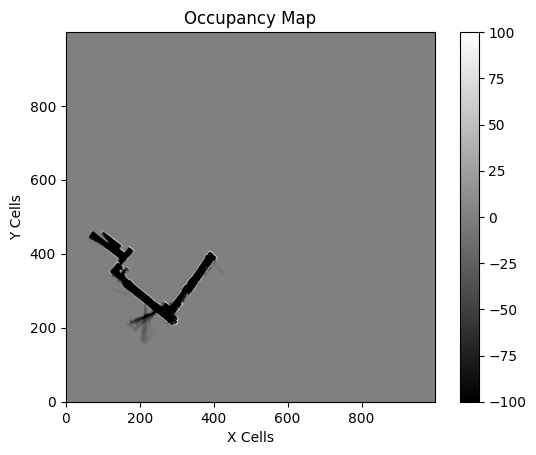

iteration 4001
iteration 4002
resampling done
iteration 4003
resampling done
iteration 4004
resampling done
iteration 4005
resampling done
iteration 4006
resampling done
iteration 4007
resampling done
iteration 4008
iteration 4009
resampling done
iteration 4010
resampling done
iteration 4011
iteration 4012
iteration 4013
iteration 4014
resampling done
iteration 4015
resampling done
iteration 4016
iteration 4017
iteration 4018
resampling done
iteration 4019
iteration 4020
iteration 4021
iteration 4022
resampling done
iteration 4023
iteration 4024
resampling done
iteration 4025
resampling done
iteration 4026
resampling done
iteration 4027
resampling done
iteration 4028
resampling done
iteration 4029
resampling done
iteration 4030
resampling done
iteration 4031
resampling done
iteration 4032
iteration 4033
resampling done
iteration 4034
iteration 4035
resampling done
iteration 4036
resampling done
iteration 4037
resampling done
iteration 4038
iteration 4039
iteration 4040
resampling done


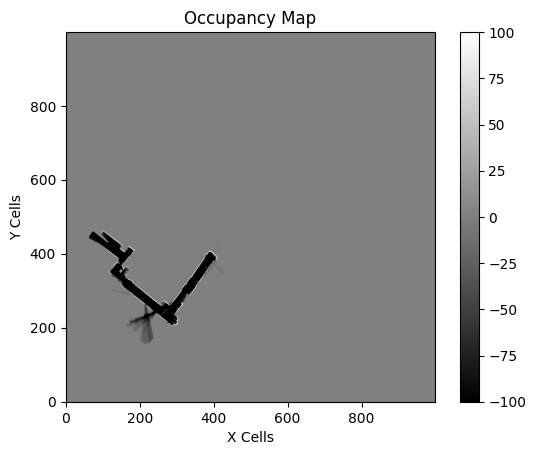

iteration 4101
iteration 4102
iteration 4103
iteration 4104
iteration 4105
iteration 4106
iteration 4107
iteration 4108
resampling done
iteration 4109
iteration 4110
iteration 4111
iteration 4112
resampling done
iteration 4113
iteration 4114
iteration 4115
iteration 4116
iteration 4117
iteration 4118
iteration 4119
iteration 4120
resampling done
iteration 4121
iteration 4122
resampling done
iteration 4123
iteration 4124
iteration 4125
iteration 4126
resampling done
iteration 4127
iteration 4128
iteration 4129
iteration 4130
iteration 4131
resampling done
iteration 4132
iteration 4133
iteration 4134
iteration 4135
iteration 4136
resampling done
iteration 4137
iteration 4138
iteration 4139
iteration 4140
resampling done
iteration 4141
resampling done
iteration 4142
resampling done
iteration 4143
resampling done
iteration 4144
resampling done
iteration 4145
resampling done
iteration 4146
resampling done
iteration 4147
iteration 4148
resampling done
iteration 4149
resampling done
iteration

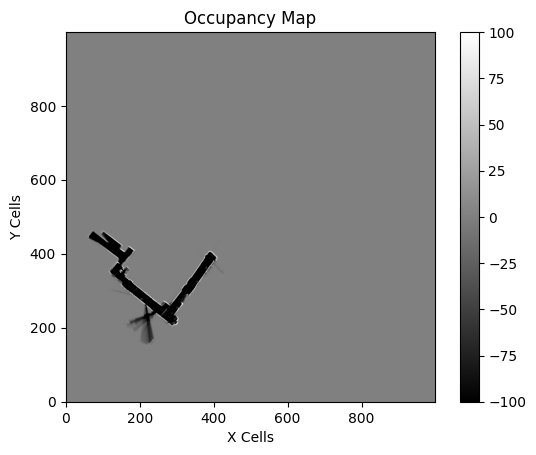

iteration 4201
iteration 4202
iteration 4203
iteration 4204
iteration 4205
iteration 4206
iteration 4207
iteration 4208
iteration 4209
iteration 4210
iteration 4211
resampling done
iteration 4212
iteration 4213
iteration 4214
iteration 4215
iteration 4216
iteration 4217
iteration 4218
iteration 4219
iteration 4220
resampling done
iteration 4221
iteration 4222
iteration 4223
iteration 4224
iteration 4225
iteration 4226
iteration 4227
iteration 4228
iteration 4229
resampling done
iteration 4230
resampling done
iteration 4231
resampling done
iteration 4232
resampling done
iteration 4233
resampling done
iteration 4234
resampling done
iteration 4235
resampling done
iteration 4236
resampling done
iteration 4237
resampling done
iteration 4238
resampling done
iteration 4239
resampling done
iteration 4240
resampling done
iteration 4241
resampling done
iteration 4242
resampling done
iteration 4243
resampling done
iteration 4244
resampling done
iteration 4245
resampling done
iteration 4246
resamp

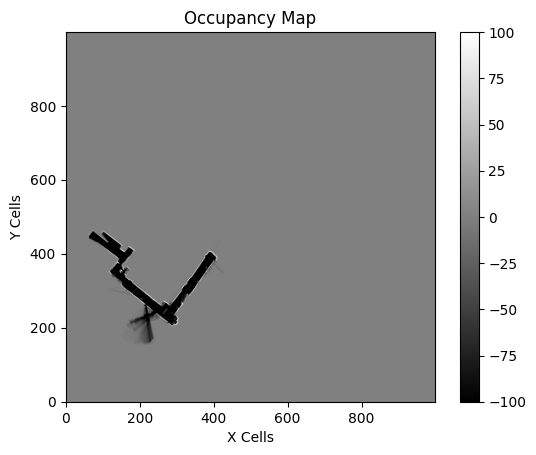

iteration 4301
resampling done
iteration 4302
resampling done
iteration 4303
resampling done
iteration 4304
resampling done
iteration 4305
resampling done
iteration 4306
resampling done
iteration 4307
resampling done
iteration 4308
resampling done
iteration 4309
resampling done
iteration 4310
resampling done
iteration 4311
resampling done
iteration 4312
resampling done
iteration 4313
resampling done
iteration 4314
resampling done
iteration 4315
resampling done
iteration 4316
resampling done
iteration 4317
resampling done
iteration 4318
resampling done
iteration 4319
resampling done
iteration 4320
resampling done
iteration 4321
resampling done
iteration 4322
resampling done
iteration 4323
resampling done
iteration 4324
resampling done
iteration 4325
resampling done
iteration 4326
resampling done
iteration 4327
resampling done
iteration 4328
resampling done
iteration 4329
resampling done
iteration 4330
resampling done
iteration 4331
resampling done
iteration 4332
resampling done
iteratio

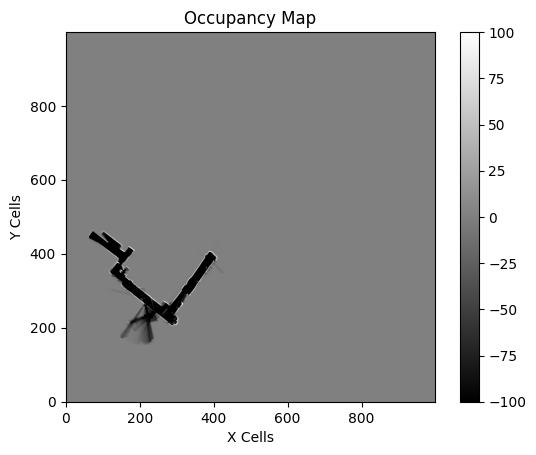

iteration 4401
resampling done
iteration 4402
resampling done
iteration 4403
resampling done
iteration 4404
resampling done
iteration 4405
resampling done
iteration 4406
resampling done
iteration 4407
resampling done
iteration 4408
resampling done
iteration 4409
resampling done
iteration 4410
resampling done
iteration 4411
resampling done
iteration 4412
resampling done
iteration 4413
resampling done
iteration 4414
resampling done
iteration 4415
resampling done
iteration 4416
resampling done
iteration 4417
resampling done
iteration 4418
resampling done
iteration 4419
resampling done
iteration 4420
resampling done
iteration 4421
resampling done
iteration 4422
resampling done
iteration 4423
resampling done
iteration 4424
resampling done
iteration 4425
resampling done
iteration 4426
resampling done
iteration 4427
resampling done
iteration 4428
resampling done
iteration 4429
resampling done
iteration 4430
resampling done
iteration 4431
resampling done
iteration 4432
resampling done
iteratio

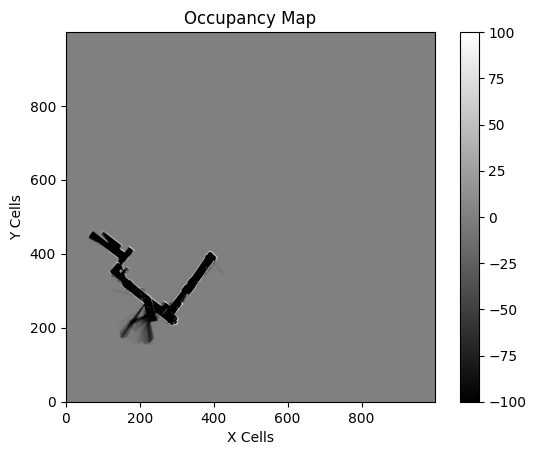

iteration 4501
iteration 4502
resampling done
iteration 4503
resampling done
iteration 4504
iteration 4505
iteration 4506
resampling done
iteration 4507
resampling done
iteration 4508
resampling done
iteration 4509
iteration 4510
iteration 4511
iteration 4512
resampling done
iteration 4513
resampling done
iteration 4514
resampling done
iteration 4515
resampling done
iteration 4516
resampling done
iteration 4517
resampling done
iteration 4518
resampling done
iteration 4519
resampling done
iteration 4520
resampling done
iteration 4521
resampling done
iteration 4522
resampling done
iteration 4523
resampling done
iteration 4524
resampling done
iteration 4525
resampling done
iteration 4526
resampling done
iteration 4527
resampling done
iteration 4528
resampling done
iteration 4529
resampling done
iteration 4530
resampling done
iteration 4531
resampling done
iteration 4532
resampling done
iteration 4533
resampling done
iteration 4534
resampling done
iteration 4535
resampling done
iteration 4

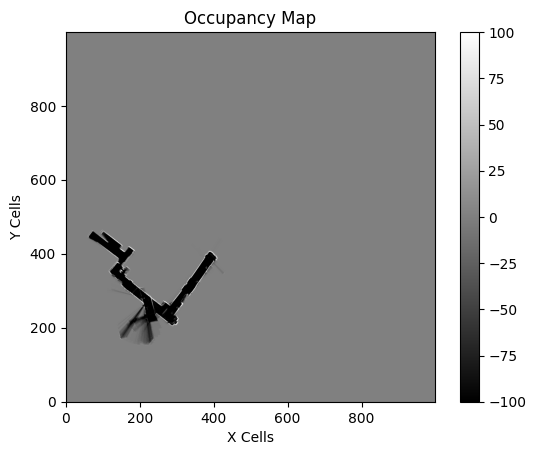

iteration 4601
resampling done
iteration 4602
resampling done
iteration 4603
resampling done
iteration 4604
resampling done
iteration 4605
resampling done
iteration 4606
resampling done
iteration 4607
resampling done
iteration 4608
resampling done
iteration 4609
resampling done
iteration 4610
resampling done
iteration 4611
resampling done
iteration 4612
resampling done
iteration 4613
resampling done
iteration 4614
resampling done
iteration 4615
resampling done
iteration 4616
resampling done
iteration 4617
resampling done
iteration 4618
resampling done
iteration 4619
resampling done
iteration 4620
resampling done
iteration 4621
resampling done
iteration 4622
resampling done
iteration 4623
resampling done
iteration 4624
resampling done
iteration 4625
resampling done
iteration 4626
resampling done
iteration 4627
resampling done
iteration 4628
resampling done
iteration 4629
resampling done
iteration 4630
resampling done
iteration 4631
resampling done
iteration 4632
resampling done
iteratio

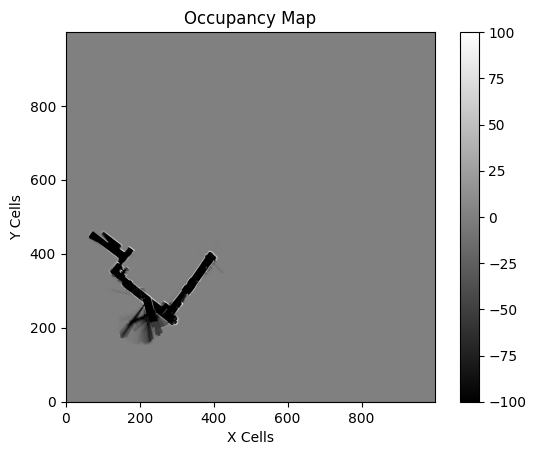

iteration 4701
resampling done
iteration 4702
resampling done
iteration 4703
resampling done
iteration 4704
resampling done
iteration 4705
resampling done
iteration 4706
resampling done
iteration 4707
resampling done
iteration 4708
resampling done
iteration 4709
resampling done
iteration 4710
resampling done
iteration 4711
resampling done
iteration 4712
resampling done
iteration 4713
resampling done
iteration 4714
resampling done
iteration 4715
resampling done
iteration 4716
resampling done
iteration 4717
resampling done
iteration 4718
resampling done
iteration 4719
resampling done
iteration 4720
resampling done
iteration 4721
resampling done
iteration 4722
resampling done
iteration 4723
resampling done
iteration 4724
resampling done
iteration 4725
resampling done
iteration 4726
resampling done
iteration 4727
resampling done
iteration 4728
resampling done
iteration 4729
iteration 4730
iteration 4731
resampling done
iteration 4732
resampling done
iteration 4733
iteration 4734
resampling

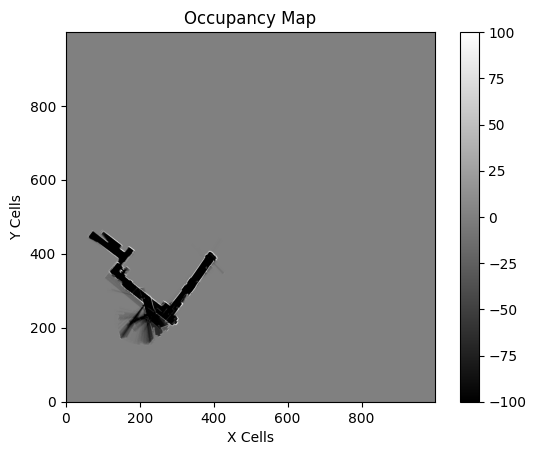

iteration 4801
resampling done
iteration 4802
resampling done
iteration 4803
resampling done
iteration 4804
resampling done
iteration 4805
resampling done
iteration 4806
resampling done
iteration 4807
resampling done
iteration 4808
resampling done
iteration 4809
resampling done
iteration 4810
resampling done
iteration 4811
resampling done
iteration 4812
resampling done
iteration 4813
resampling done
iteration 4814
resampling done
iteration 4815
resampling done
iteration 4816
resampling done
iteration 4817
resampling done
iteration 4818
resampling done
iteration 4819
resampling done
iteration 4820
resampling done
iteration 4821
resampling done
iteration 4822
resampling done
iteration 4823
resampling done
iteration 4824
resampling done
iteration 4825
resampling done
iteration 4826
resampling done
iteration 4827
resampling done
iteration 4828
resampling done
iteration 4829
resampling done
iteration 4830
resampling done
iteration 4831
resampling done
iteration 4832
resampling done
iteratio

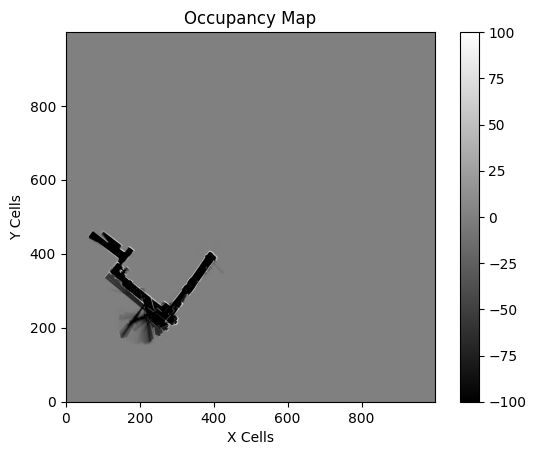

iteration 4901
resampling done
iteration 4902
resampling done
iteration 4903
resampling done
iteration 4904
resampling done
iteration 4905
resampling done
iteration 4906
resampling done
iteration 4907
resampling done
iteration 4908
resampling done
iteration 4909
iteration 4910
resampling done
iteration 4911
iteration 4912
resampling done
iteration 4913
iteration 4914
resampling done
iteration 4915
resampling done
iteration 4916
resampling done
iteration 4917
iteration 4918
resampling done
iteration 4919
resampling done
iteration 4920
resampling done
iteration 4921
iteration 4922
resampling done
iteration 4923
resampling done
iteration 4924
resampling done
iteration 4925
iteration 4926
resampling done
iteration 4927
resampling done
iteration 4928
resampling done
iteration 4929
resampling done
iteration 4930
resampling done
iteration 4931
iteration 4932
resampling done
iteration 4933
iteration 4934
resampling done
iteration 4935
iteration 4936
resampling done
iteration 4937
iteration 493

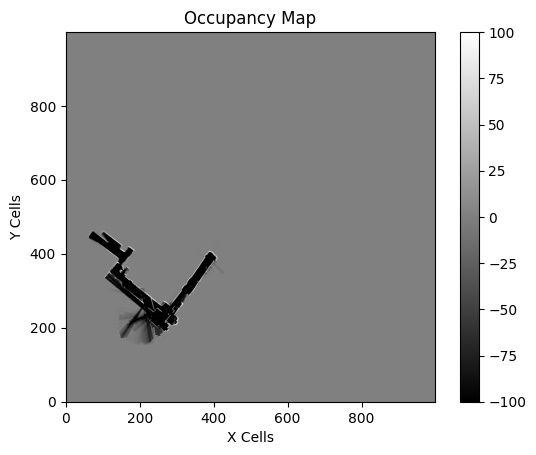

iteration 5001
resampling done
iteration 5002
resampling done
iteration 5003
resampling done
iteration 5004
resampling done
iteration 5005
resampling done
iteration 5006
resampling done
iteration 5007
resampling done
iteration 5008
resampling done
iteration 5009
resampling done
iteration 5010
iteration 5011
resampling done
iteration 5012
iteration 5013
iteration 5014
iteration 5015
resampling done
iteration 5016
iteration 5017
iteration 5018
iteration 5019
iteration 5020
resampling done
iteration 5021
resampling done
iteration 5022
iteration 5023
iteration 5024
iteration 5025
iteration 5026
resampling done
iteration 5027
resampling done
iteration 5028
iteration 5029
iteration 5030
resampling done
iteration 5031
iteration 5032
iteration 5033
iteration 5034
iteration 5035
iteration 5036
iteration 5037
iteration 5038
iteration 5039
resampling done
iteration 5040
iteration 5041
iteration 5042
iteration 5043
iteration 5044
resampling done
iteration 5045
iteration 5046
iteration 5047
iterati

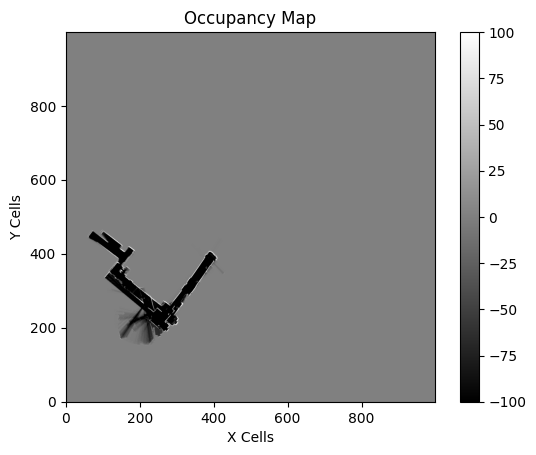

iteration 5101
iteration 5102
iteration 5103
resampling done
iteration 5104
resampling done
iteration 5105
resampling done
iteration 5106
resampling done
iteration 5107
iteration 5108
resampling done
iteration 5109
iteration 5110
resampling done
iteration 5111
resampling done
iteration 5112
resampling done
iteration 5113
iteration 5114
resampling done
iteration 5115
iteration 5116
iteration 5117
iteration 5118
resampling done
iteration 5119
iteration 5120
iteration 5121
iteration 5122
resampling done
iteration 5123
iteration 5124
iteration 5125
iteration 5126
resampling done
iteration 5127
iteration 5128
iteration 5129
iteration 5130
resampling done
iteration 5131
iteration 5132
resampling done
iteration 5133
iteration 5134
iteration 5135
iteration 5136
iteration 5137
resampling done
iteration 5138
iteration 5139
iteration 5140
iteration 5141
iteration 5142
iteration 5143
iteration 5144
resampling done
iteration 5145
iteration 5146
iteration 5147
iteration 5148
iteration 5149
iteration

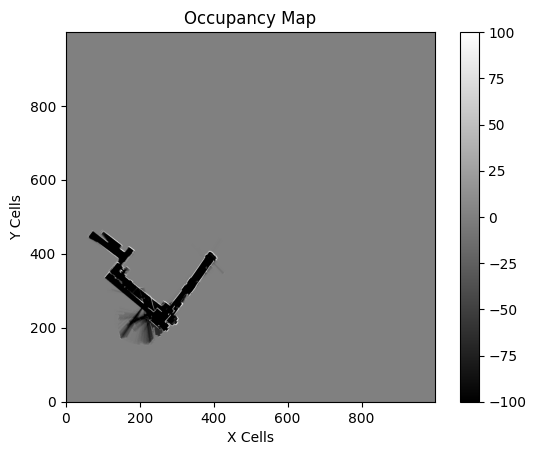

iteration 5201
resampling done
iteration 5202
iteration 5203
iteration 5204
iteration 5205
iteration 5206
iteration 5207
iteration 5208
resampling done
iteration 5209
iteration 5210
iteration 5211
resampling done
iteration 5212
iteration 5213
iteration 5214
iteration 5215
iteration 5216
iteration 5217
resampling done
iteration 5218
iteration 5219
resampling done
iteration 5220
iteration 5221
iteration 5222
iteration 5223
iteration 5224
iteration 5225
resampling done
iteration 5226
iteration 5227
iteration 5228
iteration 5229
iteration 5230
iteration 5231
iteration 5232
iteration 5233
resampling done
iteration 5234
iteration 5235
resampling done
iteration 5236
iteration 5237
iteration 5238
iteration 5239
resampling done
iteration 5240
iteration 5241
resampling done
iteration 5242
resampling done
iteration 5243
resampling done
iteration 5244
resampling done
iteration 5245
resampling done
iteration 5246
resampling done


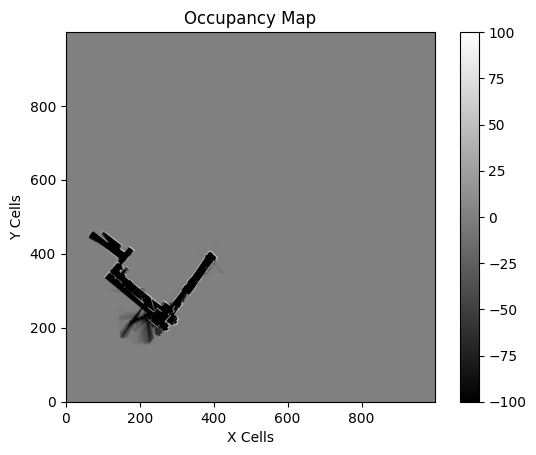

In [67]:
occupancymaps_all_2_good_width = lidar_hits_2(FL_2,FR_2,RL_2,RR_2,ts_enc_2,encoder_ticks_to_meters,width_between_wheels,1.7,lidar_2,matched_lidar_indices_2,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

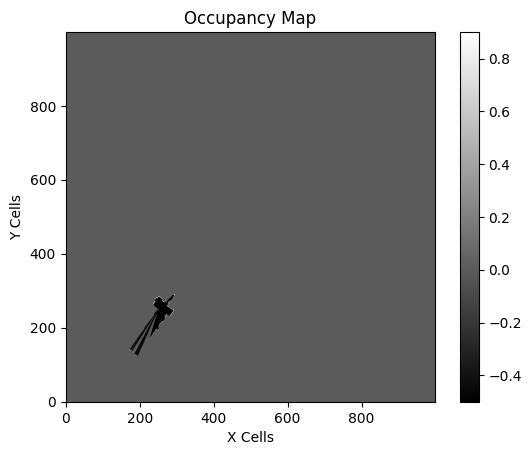

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
resampling done
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
resampling done
iteration 75
it

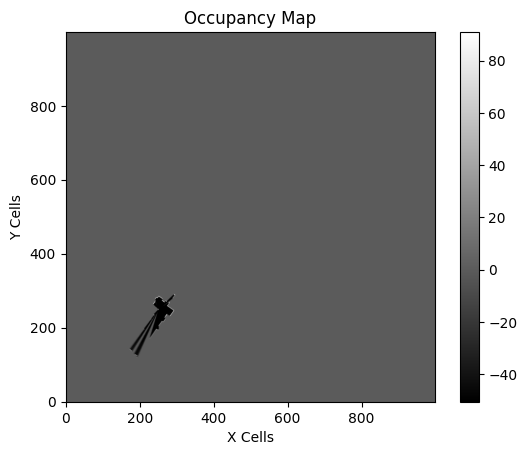

iteration 101
iteration 102
iteration 103
iteration 104
iteration 105
resampling done
iteration 106
iteration 107
iteration 108
iteration 109
iteration 110
iteration 111
iteration 112
iteration 113
iteration 114
iteration 115
iteration 116
resampling done
iteration 117
iteration 118
resampling done
iteration 119
iteration 120
iteration 121
iteration 122
iteration 123
iteration 124
resampling done
iteration 125
iteration 126
iteration 127
iteration 128
iteration 129
iteration 130
iteration 131
resampling done
iteration 132
iteration 133
iteration 134
iteration 135
iteration 136
resampling done
iteration 137
resampling done
iteration 138
resampling done
iteration 139
resampling done
iteration 140
resampling done
iteration 141
iteration 142
iteration 143
iteration 144
iteration 145
iteration 146
iteration 147
resampling done
iteration 148
iteration 149
iteration 150
iteration 151
iteration 152
iteration 153
iteration 154
iteration 155
iteration 156
iteration 157
iteration 158
iteration 15

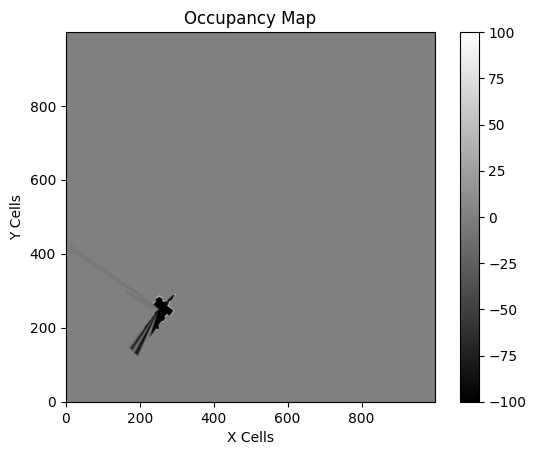

iteration 201
resampling done
iteration 202
resampling done
iteration 203
resampling done
iteration 204
resampling done
iteration 205
resampling done
iteration 206
resampling done
iteration 207
resampling done
iteration 208
resampling done
iteration 209
resampling done
iteration 210
resampling done
iteration 211
resampling done
iteration 212
iteration 213
resampling done
iteration 214
resampling done
iteration 215
iteration 216
resampling done
iteration 217
iteration 218
iteration 219
resampling done
iteration 220
iteration 221
resampling done
iteration 222
iteration 223
iteration 224
iteration 225
iteration 226
iteration 227
iteration 228
resampling done
iteration 229
iteration 230
iteration 231
iteration 232
iteration 233
resampling done
iteration 234
iteration 235
resampling done
iteration 236
iteration 237
iteration 238
resampling done
iteration 239
iteration 240
iteration 241
resampling done
iteration 242
iteration 243
resampling done
iteration 244
iteration 245
iteration 246
iter

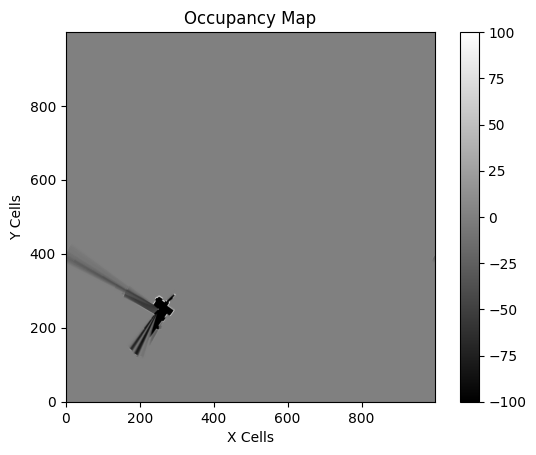

iteration 301
iteration 302
iteration 303
iteration 304
iteration 305
iteration 306
iteration 307
iteration 308
iteration 309
resampling done
iteration 310
iteration 311
iteration 312
iteration 313
iteration 314
iteration 315
iteration 316
iteration 317
iteration 318
iteration 319
iteration 320
iteration 321
iteration 322
iteration 323
resampling done
iteration 324
iteration 325
iteration 326
iteration 327
iteration 328
iteration 329
iteration 330
resampling done
iteration 331
iteration 332
iteration 333
iteration 334
iteration 335
iteration 336
iteration 337
iteration 338
iteration 339
resampling done
iteration 340
resampling done
iteration 341
iteration 342
iteration 343
iteration 344
iteration 345
iteration 346
iteration 347
iteration 348
iteration 349
iteration 350
iteration 351
iteration 352
iteration 353
iteration 354
iteration 355
iteration 356
iteration 357
resampling done
iteration 358
resampling done
iteration 359
iteration 360
iteration 361
iteration 362
iteration 363
iterat

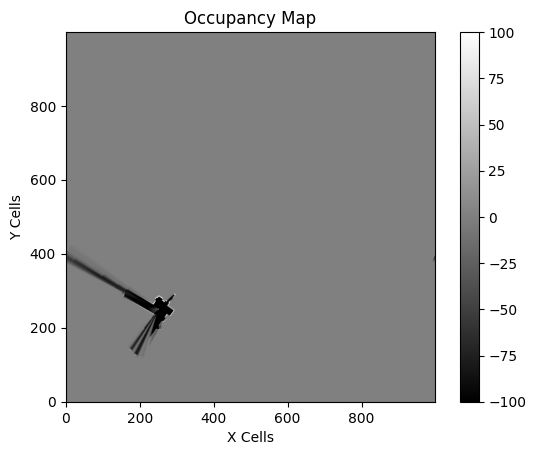

iteration 401
iteration 402
iteration 403
iteration 404
iteration 405
iteration 406
resampling done
iteration 407
iteration 408
iteration 409
iteration 410
iteration 411
iteration 412
iteration 413
iteration 414
iteration 415
iteration 416
resampling done
iteration 417
iteration 418
iteration 419
iteration 420
iteration 421
iteration 422
resampling done
iteration 423
resampling done
iteration 424
iteration 425
iteration 426
iteration 427
iteration 428
resampling done
iteration 429
iteration 430
iteration 431
iteration 432
iteration 433
resampling done
iteration 434
resampling done
iteration 435
resampling done
iteration 436
iteration 437
resampling done
iteration 438
iteration 439
iteration 440
iteration 441
iteration 442
iteration 443
resampling done
iteration 444
iteration 445
iteration 446
iteration 447
iteration 448
iteration 449
iteration 450
iteration 451
iteration 452
resampling done
iteration 453
iteration 454
iteration 455
iteration 456
iteration 457
iteration 458
iteration 45

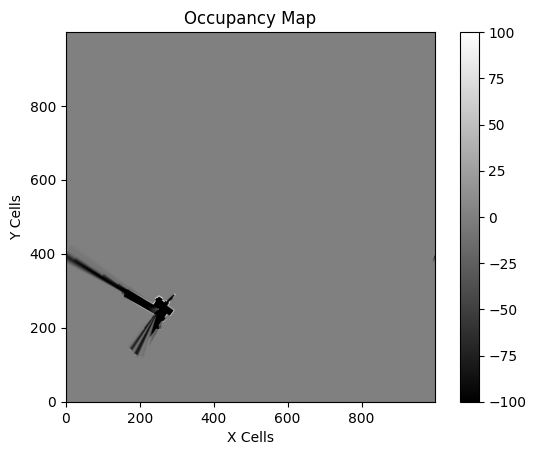

iteration 501
iteration 502
iteration 503
iteration 504
iteration 505
resampling done
iteration 506
iteration 507
iteration 508
resampling done
iteration 509
iteration 510
iteration 511
iteration 512
resampling done
iteration 513
resampling done
iteration 514
iteration 515
iteration 516
iteration 517
iteration 518
resampling done
iteration 519
iteration 520
iteration 521
iteration 522
resampling done
iteration 523
iteration 524
iteration 525
iteration 526
iteration 527
resampling done
iteration 528
iteration 529
iteration 530
iteration 531
iteration 532
resampling done
iteration 533
iteration 534
iteration 535
iteration 536
iteration 537
iteration 538
iteration 539
iteration 540
iteration 541
iteration 542
iteration 543
iteration 544
iteration 545
iteration 546
resampling done
iteration 547
iteration 548
iteration 549
iteration 550
iteration 551
iteration 552
iteration 553
iteration 554
iteration 555
iteration 556
resampling done
iteration 557
resampling done
iteration 558
iteration 55

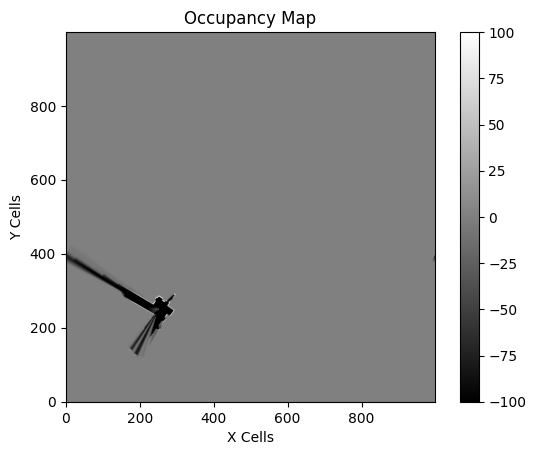

iteration 601
iteration 602
resampling done
iteration 603
resampling done
iteration 604
iteration 605
iteration 606
iteration 607
iteration 608
iteration 609
resampling done
iteration 610
iteration 611
iteration 612
iteration 613
resampling done
iteration 614
iteration 615
iteration 616
iteration 617
iteration 618
iteration 619
iteration 620
iteration 621
iteration 622
iteration 623
resampling done
iteration 624
resampling done
iteration 625
iteration 626
resampling done
iteration 627
resampling done
iteration 628
iteration 629
resampling done
iteration 630
resampling done
iteration 631
iteration 632
resampling done
iteration 633
resampling done
iteration 634
resampling done
iteration 635
iteration 636
resampling done
iteration 637
resampling done
iteration 638
resampling done
iteration 639
resampling done
iteration 640
resampling done
iteration 641
resampling done
iteration 642
resampling done
iteration 643
resampling done
iteration 644
resampling done
iteration 645
resampling done
it

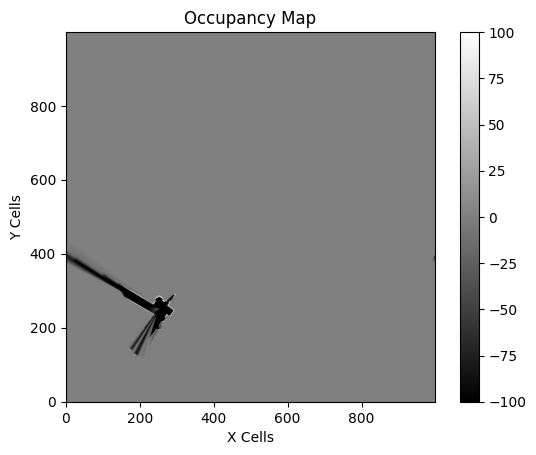

iteration 701
iteration 702
iteration 703
iteration 704
iteration 705
resampling done
iteration 706
iteration 707
iteration 708
iteration 709
iteration 710
iteration 711
iteration 712
iteration 713
iteration 714
iteration 715
iteration 716
iteration 717
resampling done
iteration 718
resampling done
iteration 719
resampling done
iteration 720
resampling done
iteration 721
iteration 722
iteration 723
iteration 724
iteration 725
iteration 726
iteration 727
iteration 728
iteration 729
iteration 730
iteration 731
resampling done
iteration 732
iteration 733
iteration 734
iteration 735
iteration 736
iteration 737
resampling done
iteration 738
iteration 739
iteration 740
iteration 741
iteration 742
iteration 743
iteration 744
iteration 745
iteration 746
iteration 747
iteration 748
resampling done
iteration 749
iteration 750
iteration 751
iteration 752
iteration 753
resampling done
iteration 754
iteration 755
iteration 756
iteration 757
iteration 758
resampling done
iteration 759
iteration 760


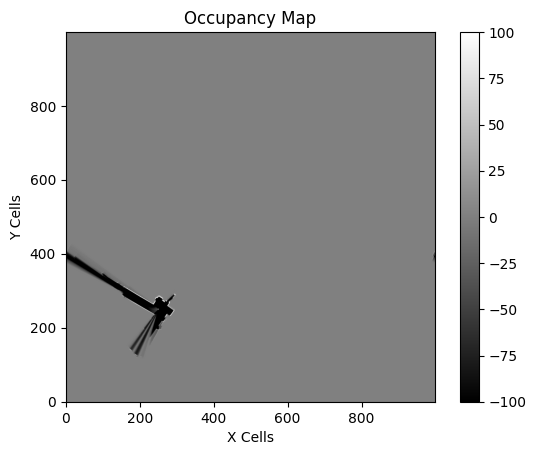

iteration 801
resampling done
iteration 802
resampling done
iteration 803
resampling done
iteration 804
resampling done
iteration 805
resampling done
iteration 806
resampling done
iteration 807
resampling done
iteration 808
resampling done
iteration 809
resampling done
iteration 810
resampling done
iteration 811
resampling done
iteration 812
resampling done
iteration 813
resampling done
iteration 814
resampling done
iteration 815
resampling done
iteration 816
resampling done
iteration 817
resampling done
iteration 818
resampling done
iteration 819
resampling done
iteration 820
resampling done
iteration 821
resampling done
iteration 822
resampling done
iteration 823
resampling done
iteration 824
resampling done
iteration 825
resampling done
iteration 826
resampling done
iteration 827
resampling done
iteration 828
resampling done
iteration 829
resampling done
iteration 830
resampling done
iteration 831
resampling done
iteration 832
resampling done
iteration 833
resampling done
iteration 

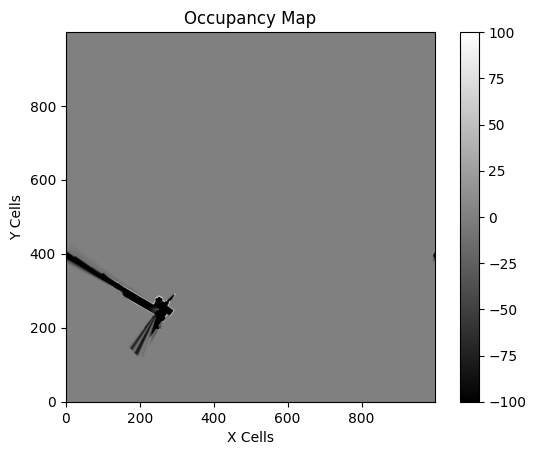

iteration 901
iteration 902
iteration 903
iteration 904
iteration 905
iteration 906
iteration 907
resampling done
iteration 908
iteration 909
iteration 910
iteration 911
iteration 912
iteration 913
resampling done
iteration 914
resampling done
iteration 915
resampling done
iteration 916
iteration 917
iteration 918
resampling done
iteration 919
iteration 920
resampling done
iteration 921
resampling done
iteration 922
iteration 923
resampling done
iteration 924
resampling done
iteration 925
resampling done
iteration 926
resampling done
iteration 927
resampling done
iteration 928
resampling done
iteration 929
iteration 930
iteration 931
resampling done
iteration 932
resampling done
iteration 933
resampling done
iteration 934
resampling done
iteration 935
iteration 936
resampling done
iteration 937
iteration 938
iteration 939
iteration 940
resampling done
iteration 941
iteration 942
resampling done
iteration 943
resampling done
iteration 944
resampling done
iteration 945
resampling done
it

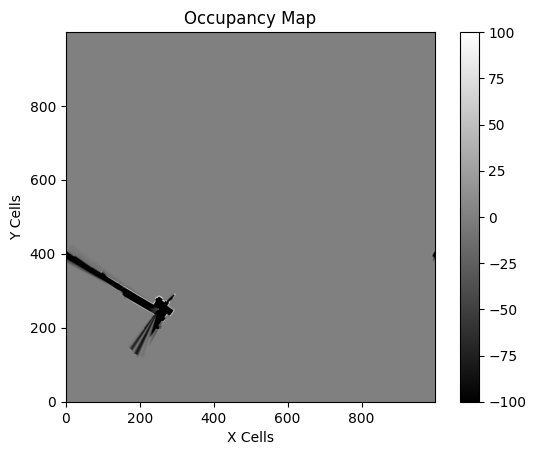

iteration 1001
resampling done
iteration 1002
resampling done
iteration 1003
resampling done
iteration 1004
resampling done
iteration 1005
resampling done
iteration 1006
resampling done
iteration 1007
resampling done
iteration 1008
resampling done
iteration 1009
resampling done
iteration 1010
resampling done
iteration 1011
resampling done
iteration 1012
resampling done
iteration 1013
resampling done
iteration 1014
resampling done
iteration 1015
resampling done
iteration 1016
resampling done
iteration 1017
resampling done
iteration 1018
resampling done
iteration 1019
resampling done
iteration 1020
resampling done
iteration 1021
resampling done
iteration 1022
resampling done
iteration 1023
resampling done
iteration 1024
resampling done
iteration 1025
resampling done
iteration 1026
resampling done
iteration 1027
resampling done
iteration 1028
resampling done
iteration 1029
resampling done
iteration 1030
resampling done
iteration 1031
resampling done
iteration 1032
resampling done
iteratio

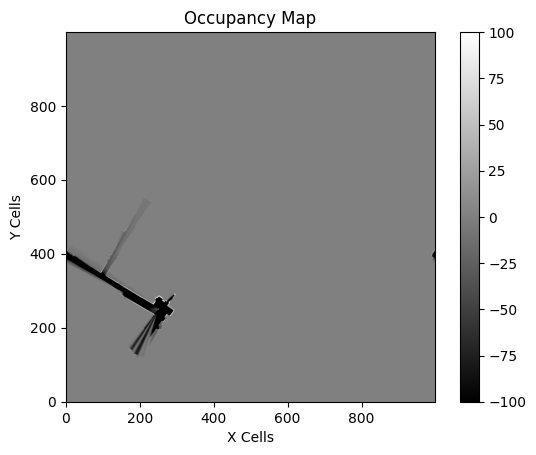

iteration 1101
resampling done
iteration 1102
resampling done
iteration 1103
resampling done
iteration 1104
resampling done
iteration 1105
resampling done
iteration 1106
resampling done
iteration 1107
resampling done
iteration 1108
resampling done
iteration 1109
resampling done
iteration 1110
resampling done
iteration 1111
resampling done
iteration 1112
resampling done
iteration 1113
resampling done
iteration 1114
resampling done
iteration 1115
resampling done
iteration 1116
resampling done
iteration 1117
resampling done
iteration 1118
resampling done
iteration 1119
resampling done
iteration 1120
resampling done
iteration 1121
resampling done
iteration 1122
resampling done
iteration 1123
resampling done
iteration 1124
resampling done
iteration 1125
resampling done
iteration 1126
resampling done
iteration 1127
resampling done
iteration 1128
resampling done
iteration 1129
resampling done
iteration 1130
resampling done
iteration 1131
resampling done
iteration 1132
resampling done
iteratio

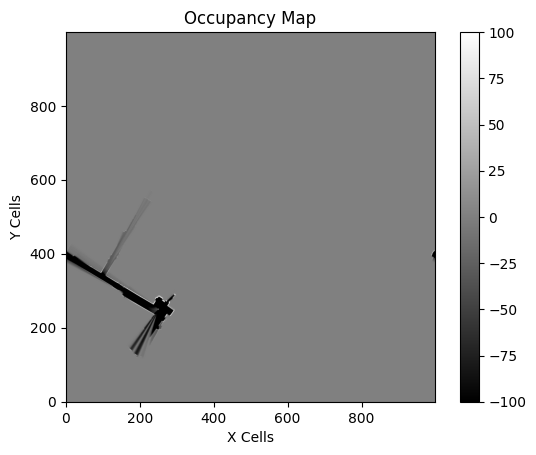

iteration 1201
resampling done
iteration 1202
resampling done
iteration 1203
resampling done
iteration 1204
resampling done
iteration 1205
resampling done
iteration 1206
resampling done
iteration 1207
resampling done
iteration 1208
resampling done
iteration 1209
resampling done
iteration 1210
resampling done
iteration 1211
resampling done
iteration 1212
resampling done
iteration 1213
resampling done
iteration 1214
resampling done
iteration 1215
resampling done
iteration 1216
resampling done
iteration 1217
resampling done
iteration 1218
resampling done
iteration 1219
resampling done
iteration 1220
resampling done
iteration 1221
resampling done
iteration 1222
resampling done
iteration 1223
resampling done
iteration 1224
resampling done
iteration 1225
resampling done
iteration 1226
resampling done
iteration 1227
resampling done
iteration 1228
resampling done
iteration 1229
resampling done
iteration 1230
resampling done
iteration 1231
resampling done
iteration 1232
resampling done
iteratio

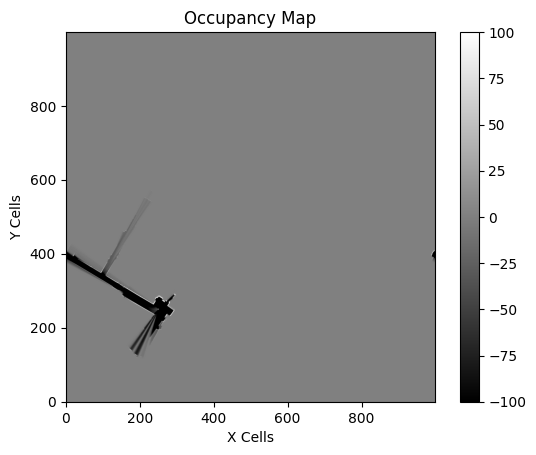

iteration 1301
resampling done
iteration 1302
resampling done
iteration 1303
resampling done
iteration 1304
resampling done
iteration 1305
resampling done
iteration 1306
resampling done
iteration 1307
resampling done
iteration 1308
resampling done
iteration 1309
resampling done
iteration 1310
resampling done
iteration 1311
resampling done
iteration 1312
resampling done
iteration 1313
resampling done
iteration 1314
resampling done
iteration 1315
resampling done
iteration 1316
resampling done
iteration 1317
resampling done
iteration 1318
resampling done
iteration 1319
resampling done
iteration 1320
resampling done
iteration 1321
resampling done
iteration 1322
resampling done
iteration 1323
resampling done
iteration 1324
resampling done
iteration 1325
resampling done
iteration 1326
resampling done
iteration 1327
resampling done
iteration 1328
resampling done
iteration 1329
resampling done
iteration 1330
resampling done
iteration 1331
resampling done
iteration 1332
resampling done
iteratio

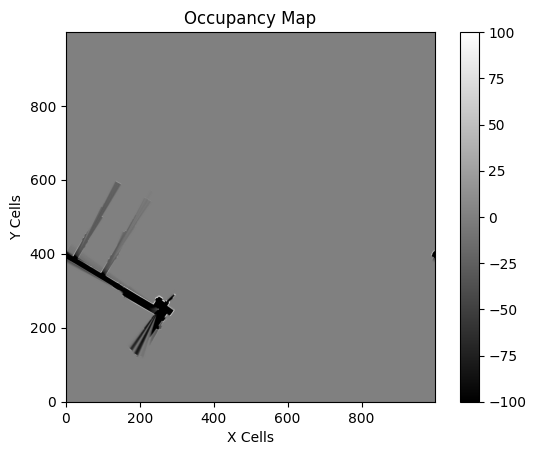

iteration 1401
resampling done
iteration 1402
resampling done
iteration 1403
resampling done
iteration 1404
resampling done
iteration 1405
resampling done
iteration 1406
resampling done
iteration 1407
resampling done
iteration 1408
resampling done
iteration 1409
resampling done
iteration 1410
resampling done
iteration 1411
resampling done
iteration 1412
iteration 1413
resampling done
iteration 1414
iteration 1415
iteration 1416
iteration 1417
iteration 1418
resampling done
iteration 1419
iteration 1420
iteration 1421
iteration 1422
iteration 1423
iteration 1424
iteration 1425
iteration 1426
iteration 1427
iteration 1428
iteration 1429
iteration 1430
iteration 1431
resampling done
iteration 1432
iteration 1433
iteration 1434
iteration 1435
resampling done
iteration 1436
iteration 1437
iteration 1438
resampling done
iteration 1439
iteration 1440
iteration 1441
iteration 1442
iteration 1443
iteration 1444
iteration 1445
iteration 1446
resampling done
iteration 1447
iteration 1448
iteratio

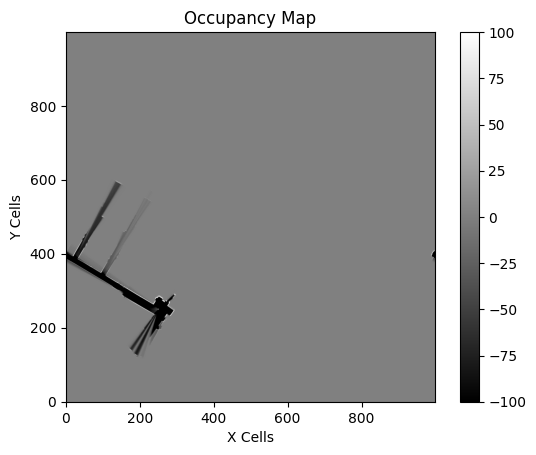

iteration 1501
iteration 1502
iteration 1503
iteration 1504
iteration 1505
iteration 1506
iteration 1507
iteration 1508
iteration 1509
iteration 1510
iteration 1511
iteration 1512
iteration 1513
iteration 1514
iteration 1515
resampling done
iteration 1516
iteration 1517
iteration 1518
iteration 1519
iteration 1520
iteration 1521
iteration 1522
iteration 1523
iteration 1524
iteration 1525
iteration 1526
iteration 1527
iteration 1528
iteration 1529
iteration 1530
iteration 1531
iteration 1532
iteration 1533
iteration 1534
iteration 1535
iteration 1536
resampling done
iteration 1537
iteration 1538
iteration 1539
iteration 1540
iteration 1541
iteration 1542
iteration 1543
iteration 1544
iteration 1545
iteration 1546
iteration 1547
iteration 1548
iteration 1549
iteration 1550
resampling done
iteration 1551
iteration 1552
iteration 1553
iteration 1554
iteration 1555
iteration 1556
resampling done
iteration 1557
iteration 1558
iteration 1559
iteration 1560
iteration 1561
iteration 1562
iterat

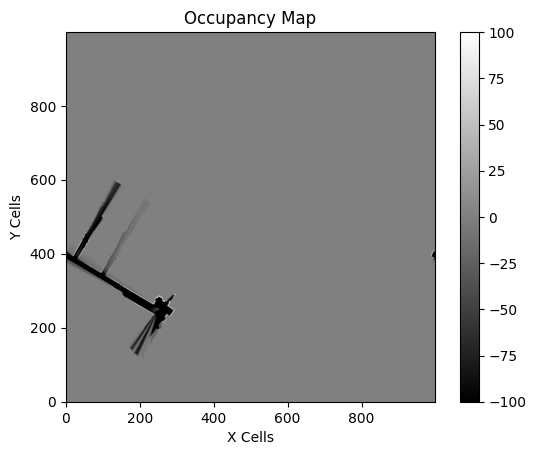

iteration 1601
resampling done
iteration 1602
resampling done
iteration 1603
resampling done
iteration 1604
iteration 1605
resampling done
iteration 1606
iteration 1607
iteration 1608
iteration 1609
iteration 1610
iteration 1611
iteration 1612
iteration 1613
resampling done
iteration 1614
iteration 1615
iteration 1616
iteration 1617
iteration 1618
iteration 1619
resampling done
iteration 1620
iteration 1621
iteration 1622
iteration 1623
iteration 1624
iteration 1625
resampling done
iteration 1626
iteration 1627
iteration 1628
iteration 1629
iteration 1630
iteration 1631
iteration 1632
iteration 1633
iteration 1634
iteration 1635
iteration 1636
iteration 1637
resampling done
iteration 1638
iteration 1639
iteration 1640
iteration 1641
iteration 1642
iteration 1643
resampling done
iteration 1644
iteration 1645
iteration 1646
iteration 1647
iteration 1648
iteration 1649
iteration 1650
resampling done
iteration 1651
iteration 1652
iteration 1653
iteration 1654
iteration 1655
iteration 1656


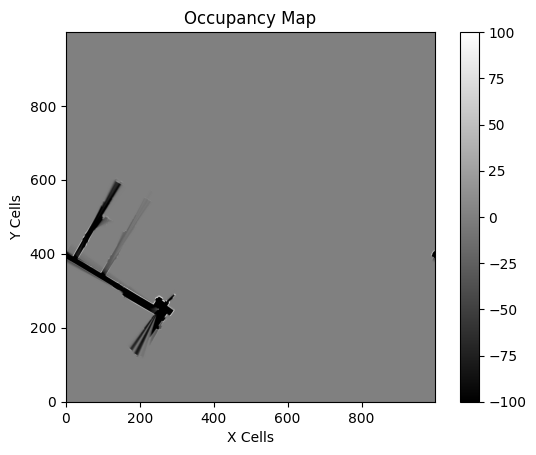

iteration 1701
resampling done
iteration 1702
resampling done
iteration 1703
iteration 1704
iteration 1705
resampling done
iteration 1706
iteration 1707
iteration 1708
resampling done
iteration 1709
resampling done
iteration 1710
resampling done
iteration 1711
resampling done
iteration 1712
resampling done
iteration 1713
resampling done
iteration 1714
resampling done
iteration 1715
iteration 1716
iteration 1717
resampling done
iteration 1718
iteration 1719
iteration 1720
iteration 1721
iteration 1722
iteration 1723
iteration 1724
iteration 1725
iteration 1726
resampling done
iteration 1727
iteration 1728
iteration 1729
iteration 1730
resampling done
iteration 1731
iteration 1732
iteration 1733
iteration 1734
resampling done
iteration 1735
iteration 1736
iteration 1737
iteration 1738
iteration 1739
iteration 1740
resampling done
iteration 1741
iteration 1742
resampling done
iteration 1743
iteration 1744
iteration 1745
resampling done
iteration 1746
resampling done
iteration 1747
iterati

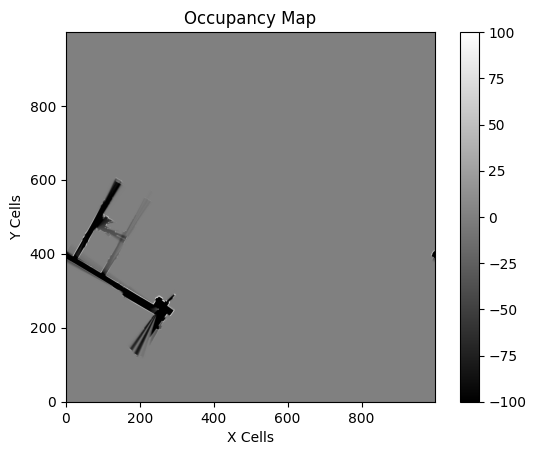

iteration 1801
iteration 1802
resampling done
iteration 1803
resampling done
iteration 1804
resampling done
iteration 1805
resampling done
iteration 1806
resampling done
iteration 1807
resampling done
iteration 1808
resampling done
iteration 1809
resampling done
iteration 1810
iteration 1811
iteration 1812
resampling done
iteration 1813
resampling done
iteration 1814
resampling done
iteration 1815
resampling done
iteration 1816
resampling done
iteration 1817
resampling done
iteration 1818
resampling done
iteration 1819
resampling done
iteration 1820
resampling done
iteration 1821
resampling done
iteration 1822
resampling done
iteration 1823
iteration 1824
resampling done
iteration 1825
iteration 1826
resampling done
iteration 1827
iteration 1828
resampling done
iteration 1829
iteration 1830
iteration 1831
iteration 1832
resampling done
iteration 1833
iteration 1834
resampling done
iteration 1835
iteration 1836
iteration 1837
iteration 1838
resampling done
iteration 1839
iteration 1840


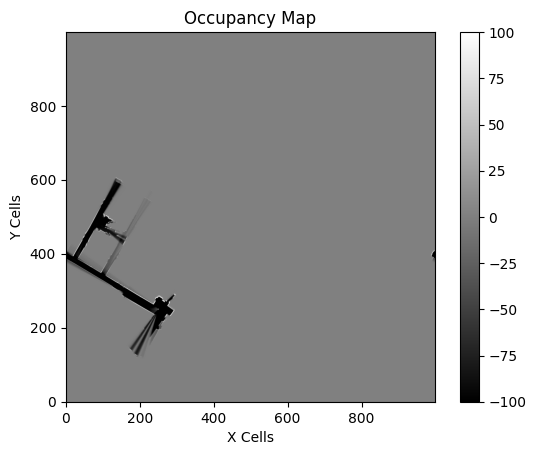

iteration 1901
iteration 1902
resampling done
iteration 1903
iteration 1904
iteration 1905
iteration 1906
iteration 1907
iteration 1908
resampling done
iteration 1909
iteration 1910
iteration 1911
resampling done
iteration 1912
iteration 1913
resampling done
iteration 1914
resampling done
iteration 1915
resampling done
iteration 1916
resampling done
iteration 1917
resampling done
iteration 1918
resampling done
iteration 1919
iteration 1920
resampling done
iteration 1921
resampling done
iteration 1922
iteration 1923
iteration 1924
resampling done
iteration 1925
resampling done
iteration 1926
resampling done
iteration 1927
resampling done
iteration 1928
resampling done
iteration 1929
resampling done
iteration 1930
resampling done
iteration 1931
resampling done
iteration 1932
resampling done
iteration 1933
iteration 1934
resampling done
iteration 1935
resampling done
iteration 1936
resampling done
iteration 1937
resampling done
iteration 1938
resampling done
iteration 1939
resampling done

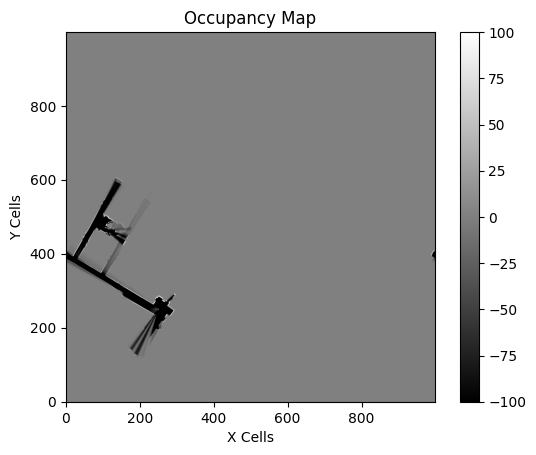

iteration 2001
resampling done
iteration 2002
iteration 2003
iteration 2004
iteration 2005
resampling done
iteration 2006
iteration 2007
iteration 2008
iteration 2009
iteration 2010
iteration 2011
iteration 2012
iteration 2013
iteration 2014
iteration 2015
resampling done
iteration 2016
iteration 2017
resampling done
iteration 2018
iteration 2019
iteration 2020
iteration 2021
iteration 2022
resampling done
iteration 2023
iteration 2024
iteration 2025
iteration 2026
iteration 2027
iteration 2028
resampling done
iteration 2029
iteration 2030
iteration 2031
iteration 2032
iteration 2033
resampling done
iteration 2034
resampling done
iteration 2035
iteration 2036
iteration 2037
iteration 2038
iteration 2039
iteration 2040
iteration 2041
iteration 2042
iteration 2043
iteration 2044
iteration 2045
iteration 2046
iteration 2047
iteration 2048
iteration 2049
iteration 2050
iteration 2051
iteration 2052
iteration 2053
iteration 2054
iteration 2055
iteration 2056
resampling done
iteration 2057
i

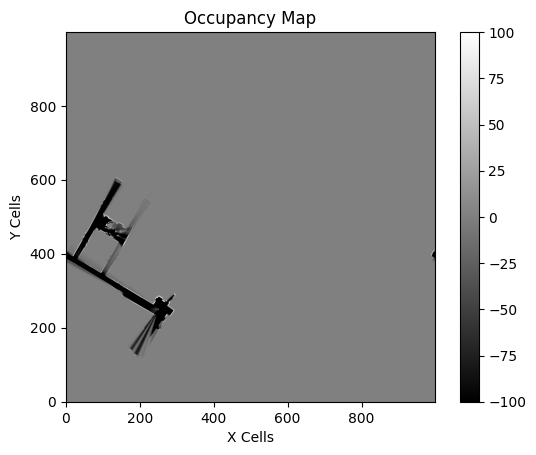

iteration 2101
iteration 2102
iteration 2103
iteration 2104
iteration 2105
iteration 2106
iteration 2107
iteration 2108
iteration 2109
iteration 2110
iteration 2111
iteration 2112
iteration 2113
iteration 2114
iteration 2115
iteration 2116
iteration 2117
iteration 2118
iteration 2119
iteration 2120
iteration 2121
iteration 2122
iteration 2123
iteration 2124
iteration 2125
iteration 2126
iteration 2127
iteration 2128
iteration 2129
iteration 2130
iteration 2131
iteration 2132
resampling done
iteration 2133
iteration 2134
iteration 2135
iteration 2136
iteration 2137
iteration 2138
iteration 2139
iteration 2140
iteration 2141
iteration 2142
iteration 2143
iteration 2144
iteration 2145
iteration 2146
iteration 2147
resampling done
iteration 2148
iteration 2149
iteration 2150
iteration 2151
iteration 2152
iteration 2153
iteration 2154
iteration 2155
iteration 2156
iteration 2157
iteration 2158
iteration 2159
iteration 2160
iteration 2161
resampling done
iteration 2162
iteration 2163
iterati

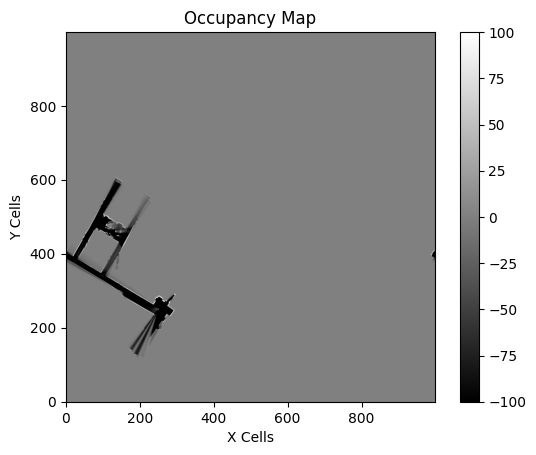

iteration 2201
resampling done
iteration 2202
resampling done
iteration 2203
resampling done
iteration 2204
iteration 2205
resampling done
iteration 2206
resampling done
iteration 2207
resampling done
iteration 2208
resampling done
iteration 2209
resampling done
iteration 2210
resampling done
iteration 2211
resampling done
iteration 2212
resampling done
iteration 2213
resampling done
iteration 2214
resampling done
iteration 2215
resampling done
iteration 2216
resampling done
iteration 2217
resampling done
iteration 2218
iteration 2219
resampling done
iteration 2220
iteration 2221
iteration 2222
iteration 2223
resampling done
iteration 2224
iteration 2225
iteration 2226
iteration 2227
iteration 2228
resampling done
iteration 2229
iteration 2230
iteration 2231
iteration 2232
iteration 2233
iteration 2234
resampling done
iteration 2235
iteration 2236
iteration 2237
resampling done
iteration 2238
iteration 2239
iteration 2240
iteration 2241
resampling done
iteration 2242
resampling done
it

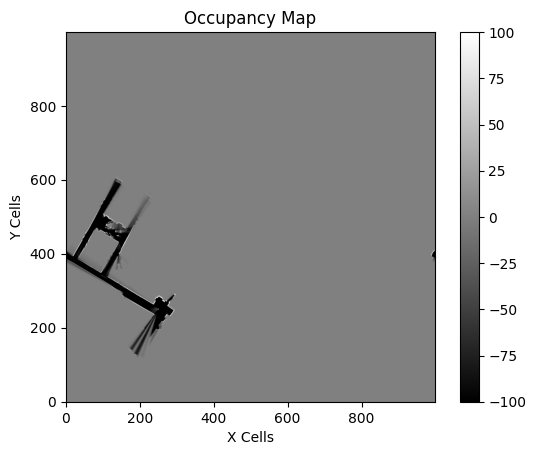

iteration 2301
resampling done
iteration 2302
resampling done
iteration 2303
resampling done
iteration 2304
resampling done
iteration 2305
resampling done
iteration 2306
resampling done
iteration 2307
resampling done
iteration 2308
resampling done
iteration 2309
resampling done
iteration 2310
resampling done
iteration 2311
resampling done
iteration 2312
resampling done
iteration 2313
resampling done
iteration 2314
resampling done
iteration 2315
resampling done
iteration 2316
resampling done
iteration 2317
resampling done
iteration 2318
resampling done
iteration 2319
resampling done
iteration 2320
resampling done
iteration 2321
resampling done
iteration 2322
resampling done
iteration 2323
resampling done
iteration 2324
resampling done
iteration 2325
resampling done
iteration 2326
resampling done
iteration 2327
resampling done
iteration 2328
resampling done
iteration 2329
resampling done
iteration 2330
resampling done
iteration 2331
resampling done
iteration 2332
resampling done
iteratio

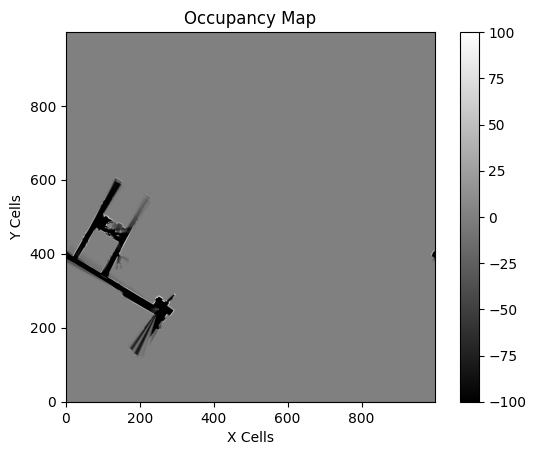

iteration 2401
resampling done
iteration 2402
resampling done
iteration 2403
resampling done
iteration 2404
resampling done
iteration 2405
resampling done
iteration 2406
resampling done
iteration 2407
resampling done
iteration 2408
resampling done
iteration 2409
resampling done
iteration 2410
resampling done
iteration 2411
resampling done
iteration 2412
resampling done
iteration 2413
resampling done
iteration 2414
resampling done
iteration 2415
resampling done
iteration 2416
resampling done
iteration 2417
resampling done
iteration 2418
resampling done
iteration 2419
resampling done
iteration 2420
resampling done
iteration 2421
resampling done
iteration 2422
resampling done
iteration 2423
resampling done
iteration 2424
resampling done
iteration 2425
resampling done
iteration 2426
resampling done
iteration 2427
resampling done
iteration 2428
resampling done
iteration 2429
resampling done
iteration 2430
resampling done
iteration 2431
resampling done
iteration 2432
resampling done
iteratio

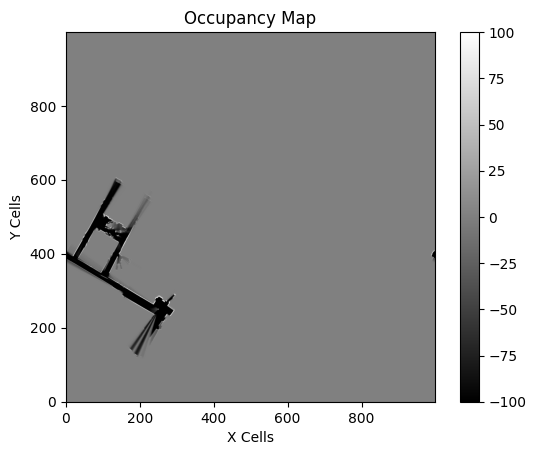

iteration 2501
resampling done
iteration 2502
resampling done
iteration 2503
resampling done
iteration 2504
resampling done
iteration 2505
resampling done
iteration 2506
resampling done
iteration 2507
resampling done
iteration 2508
resampling done
iteration 2509
resampling done
iteration 2510
resampling done
iteration 2511
resampling done
iteration 2512
resampling done
iteration 2513
resampling done
iteration 2514
resampling done
iteration 2515
resampling done
iteration 2516
resampling done
iteration 2517
resampling done
iteration 2518
resampling done
iteration 2519
resampling done
iteration 2520
resampling done
iteration 2521
resampling done
iteration 2522
resampling done
iteration 2523
resampling done
iteration 2524
resampling done
iteration 2525
resampling done
iteration 2526
resampling done
iteration 2527
resampling done
iteration 2528
resampling done
iteration 2529
resampling done
iteration 2530
resampling done
iteration 2531
resampling done
iteration 2532
resampling done
iteratio

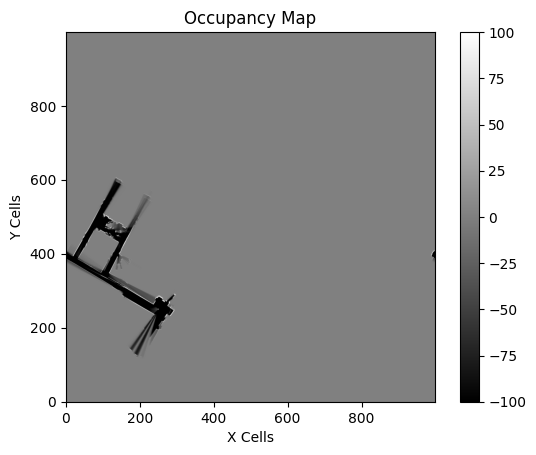

iteration 2601
resampling done
iteration 2602
resampling done
iteration 2603
iteration 2604
resampling done
iteration 2605
resampling done
iteration 2606
iteration 2607
iteration 2608
resampling done
iteration 2609
resampling done
iteration 2610
iteration 2611
resampling done
iteration 2612
iteration 2613
resampling done
iteration 2614
resampling done
iteration 2615
resampling done
iteration 2616
resampling done
iteration 2617
iteration 2618
resampling done
iteration 2619
resampling done
iteration 2620
resampling done
iteration 2621
resampling done
iteration 2622
resampling done
iteration 2623
resampling done
iteration 2624
resampling done
iteration 2625
resampling done
iteration 2626
resampling done
iteration 2627
resampling done
iteration 2628
resampling done
iteration 2629
resampling done
iteration 2630
resampling done
iteration 2631
resampling done
iteration 2632
iteration 2633
resampling done
iteration 2634
resampling done
iteration 2635
resampling done
iteration 2636
resampling d

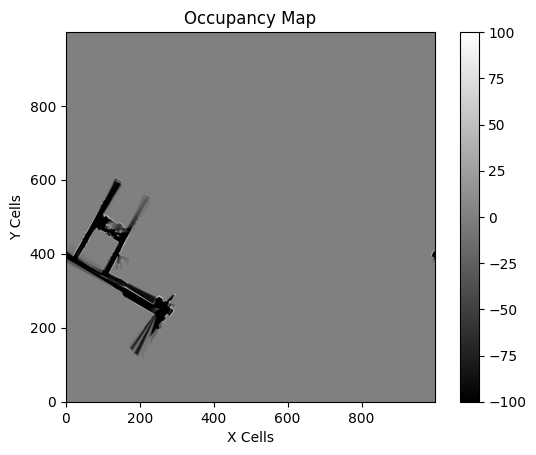

iteration 2701
resampling done
iteration 2702
resampling done
iteration 2703
resampling done
iteration 2704
resampling done
iteration 2705
resampling done
iteration 2706
resampling done
iteration 2707
resampling done
iteration 2708
resampling done
iteration 2709
resampling done
iteration 2710
resampling done
iteration 2711
resampling done
iteration 2712
resampling done
iteration 2713
resampling done
iteration 2714
resampling done
iteration 2715
resampling done
iteration 2716
resampling done
iteration 2717
resampling done
iteration 2718
resampling done
iteration 2719
resampling done
iteration 2720
resampling done
iteration 2721
resampling done
iteration 2722
resampling done
iteration 2723
resampling done
iteration 2724
resampling done
iteration 2725
iteration 2726
resampling done
iteration 2727
iteration 2728
resampling done
iteration 2729
resampling done
iteration 2730
resampling done
iteration 2731
iteration 2732
iteration 2733
iteration 2734
iteration 2735
iteration 2736
iteration 27

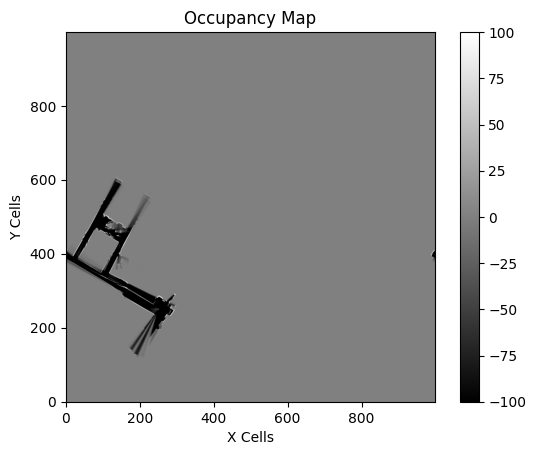

iteration 2801
resampling done
iteration 2802
resampling done
iteration 2803
resampling done
iteration 2804
resampling done
iteration 2805
resampling done
iteration 2806
resampling done
iteration 2807
resampling done
iteration 2808
resampling done
iteration 2809
resampling done
iteration 2810
resampling done
iteration 2811
resampling done
iteration 2812
resampling done
iteration 2813
resampling done
iteration 2814
resampling done
iteration 2815
resampling done
iteration 2816
resampling done
iteration 2817
resampling done
iteration 2818
resampling done
iteration 2819
resampling done
iteration 2820
resampling done
iteration 2821
resampling done
iteration 2822
resampling done
iteration 2823
resampling done
iteration 2824
resampling done
iteration 2825
resampling done
iteration 2826
resampling done
iteration 2827
resampling done
iteration 2828
resampling done
iteration 2829
resampling done
iteration 2830
resampling done
iteration 2831
resampling done
iteration 2832
resampling done
iteratio

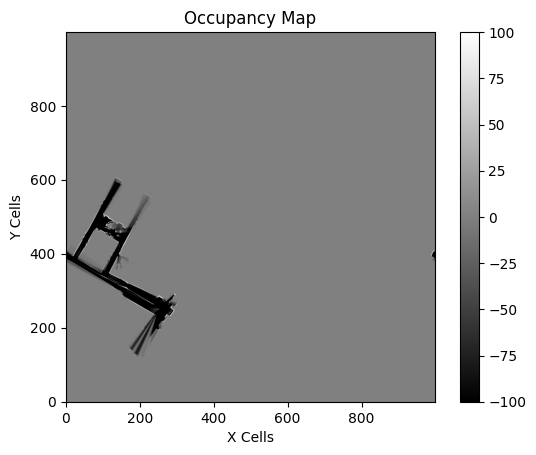

iteration 2901
resampling done
iteration 2902
resampling done
iteration 2903
resampling done
iteration 2904
resampling done
iteration 2905
resampling done
iteration 2906
resampling done
iteration 2907
resampling done
iteration 2908
resampling done
iteration 2909
resampling done
iteration 2910
resampling done
iteration 2911
resampling done
iteration 2912
resampling done
iteration 2913
resampling done
iteration 2914
resampling done
iteration 2915
resampling done
iteration 2916
resampling done
iteration 2917
resampling done
iteration 2918
resampling done
iteration 2919
resampling done
iteration 2920
resampling done
iteration 2921
resampling done
iteration 2922
resampling done
iteration 2923
resampling done
iteration 2924
resampling done
iteration 2925
resampling done
iteration 2926
resampling done
iteration 2927
resampling done
iteration 2928
resampling done
iteration 2929
resampling done
iteration 2930
resampling done
iteration 2931
resampling done
iteration 2932
resampling done
iteratio

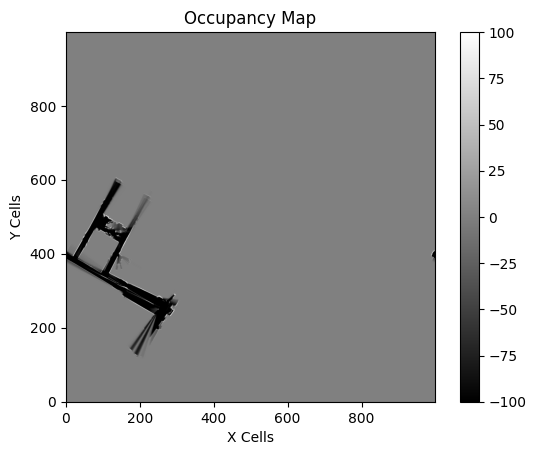

iteration 3001
iteration 3002
resampling done
iteration 3003
iteration 3004
resampling done
iteration 3005
resampling done
iteration 3006
resampling done
iteration 3007
resampling done
iteration 3008
iteration 3009
resampling done
iteration 3010
resampling done
iteration 3011
resampling done
iteration 3012
resampling done
iteration 3013
resampling done
iteration 3014
resampling done
iteration 3015
resampling done
iteration 3016
resampling done
iteration 3017
resampling done
iteration 3018
resampling done
iteration 3019
resampling done
iteration 3020
resampling done
iteration 3021
resampling done
iteration 3022
resampling done
iteration 3023
resampling done
iteration 3024
resampling done
iteration 3025
resampling done
iteration 3026
resampling done
iteration 3027
resampling done
iteration 3028
resampling done
iteration 3029
iteration 3030
resampling done
iteration 3031
resampling done
iteration 3032
resampling done
iteration 3033
resampling done
iteration 3034
resampling done
iteration 

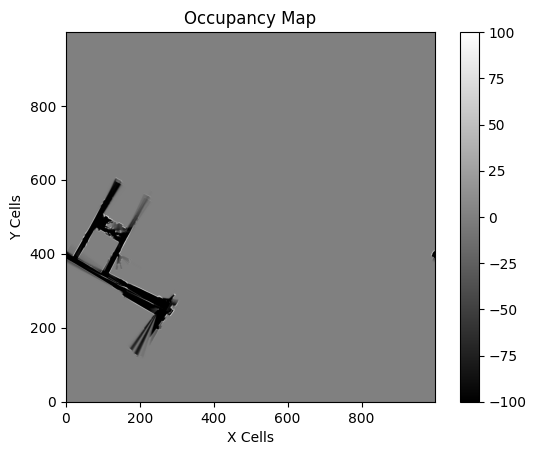

iteration 3101
resampling done
iteration 3102
resampling done
iteration 3103
iteration 3104
resampling done
iteration 3105
iteration 3106
resampling done
iteration 3107
iteration 3108
iteration 3109
iteration 3110
resampling done
iteration 3111
iteration 3112
iteration 3113
iteration 3114
iteration 3115
resampling done
iteration 3116
resampling done
iteration 3117
resampling done
iteration 3118
iteration 3119
iteration 3120
iteration 3121
iteration 3122
iteration 3123
resampling done
iteration 3124
iteration 3125
iteration 3126
resampling done
iteration 3127
iteration 3128
iteration 3129
iteration 3130
iteration 3131
iteration 3132
iteration 3133
iteration 3134
iteration 3135
iteration 3136
iteration 3137
iteration 3138
resampling done
iteration 3139
iteration 3140
resampling done
iteration 3141
iteration 3142
iteration 3143
iteration 3144
iteration 3145
iteration 3146
iteration 3147
iteration 3148
iteration 3149
resampling done
iteration 3150
iteration 3151
iteration 3152
resampling d

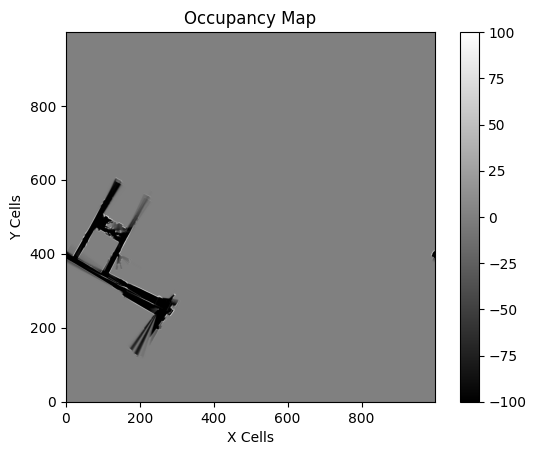

iteration 3201
iteration 3202
iteration 3203
resampling done
iteration 3204
resampling done
iteration 3205
iteration 3206
iteration 3207
iteration 3208
iteration 3209
iteration 3210
iteration 3211
iteration 3212
iteration 3213
iteration 3214
iteration 3215
iteration 3216
iteration 3217
resampling done
iteration 3218
iteration 3219
iteration 3220
iteration 3221
iteration 3222
iteration 3223
iteration 3224
iteration 3225
iteration 3226
iteration 3227
iteration 3228
iteration 3229
resampling done
iteration 3230
iteration 3231
iteration 3232
iteration 3233
iteration 3234
resampling done
iteration 3235
resampling done
iteration 3236
iteration 3237
resampling done
iteration 3238
iteration 3239
iteration 3240
iteration 3241
resampling done
iteration 3242
iteration 3243
iteration 3244
iteration 3245
iteration 3246
iteration 3247
resampling done
iteration 3248
iteration 3249
resampling done
iteration 3250
resampling done
iteration 3251
resampling done
iteration 3252
resampling done
iteration 32

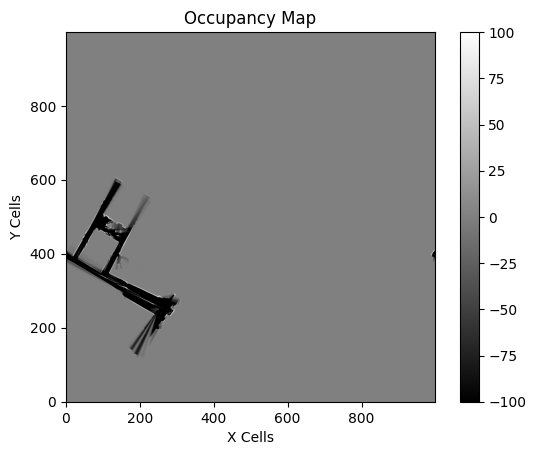

iteration 3301
iteration 3302
iteration 3303
iteration 3304
iteration 3305
iteration 3306
resampling done
iteration 3307
resampling done
iteration 3308
iteration 3309
iteration 3310
iteration 3311
iteration 3312
resampling done
iteration 3313
iteration 3314
iteration 3315
iteration 3316
iteration 3317
iteration 3318
iteration 3319
iteration 3320
iteration 3321
iteration 3322
iteration 3323
iteration 3324
iteration 3325
iteration 3326
iteration 3327
iteration 3328
resampling done
iteration 3329
iteration 3330
iteration 3331
iteration 3332
iteration 3333
iteration 3334
iteration 3335
iteration 3336
iteration 3337
iteration 3338
iteration 3339
resampling done
iteration 3340
iteration 3341
iteration 3342
iteration 3343
iteration 3344
resampling done
iteration 3345
iteration 3346
iteration 3347
iteration 3348
iteration 3349
iteration 3350
resampling done
iteration 3351
iteration 3352
iteration 3353
iteration 3354
iteration 3355
resampling done
iteration 3356
resampling done
iteration 3357
i

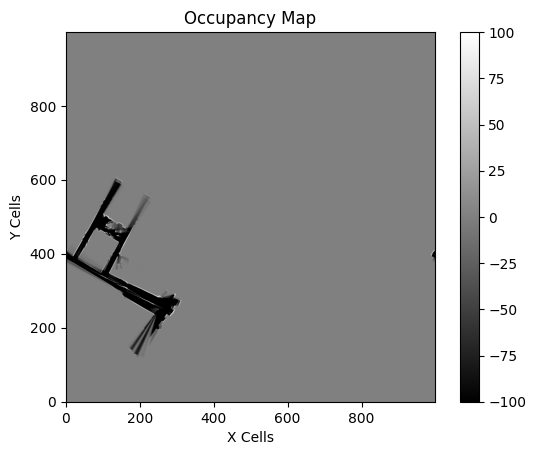

iteration 3401
resampling done
iteration 3402
resampling done
iteration 3403
resampling done
iteration 3404
resampling done
iteration 3405
resampling done
iteration 3406
resampling done
iteration 3407
iteration 3408
iteration 3409
resampling done
iteration 3410
iteration 3411
resampling done
iteration 3412
resampling done
iteration 3413
iteration 3414
resampling done
iteration 3415
iteration 3416
resampling done
iteration 3417
iteration 3418
iteration 3419
iteration 3420
resampling done
iteration 3421
iteration 3422
iteration 3423
resampling done
iteration 3424
resampling done
iteration 3425
resampling done
iteration 3426
resampling done
iteration 3427
resampling done
iteration 3428
resampling done
iteration 3429
iteration 3430
resampling done
iteration 3431
resampling done
iteration 3432
resampling done
iteration 3433
iteration 3434
iteration 3435
resampling done
iteration 3436
iteration 3437
resampling done
iteration 3438
iteration 3439
iteration 3440
iteration 3441
iteration 3442
re

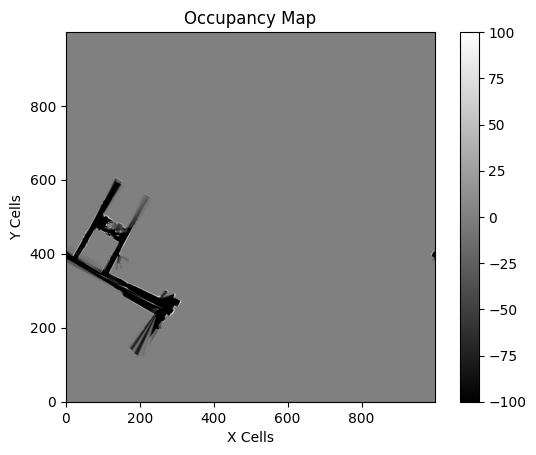

iteration 3501
iteration 3502
resampling done
iteration 3503
iteration 3504
iteration 3505
resampling done
iteration 3506
iteration 3507
resampling done
iteration 3508
iteration 3509
iteration 3510
iteration 3511
iteration 3512
iteration 3513
iteration 3514
iteration 3515
resampling done
iteration 3516
iteration 3517
resampling done
iteration 3518
iteration 3519
iteration 3520
iteration 3521
resampling done
iteration 3522
iteration 3523
iteration 3524
iteration 3525
iteration 3526
iteration 3527
iteration 3528
iteration 3529
iteration 3530
iteration 3531
resampling done
iteration 3532
iteration 3533
iteration 3534
iteration 3535
iteration 3536
iteration 3537
iteration 3538
iteration 3539
resampling done
iteration 3540
iteration 3541
iteration 3542
iteration 3543
iteration 3544
iteration 3545
iteration 3546
resampling done
iteration 3547
iteration 3548
iteration 3549
resampling done
iteration 3550
iteration 3551
iteration 3552
iteration 3553
iteration 3554
iteration 3555
iteration 3556


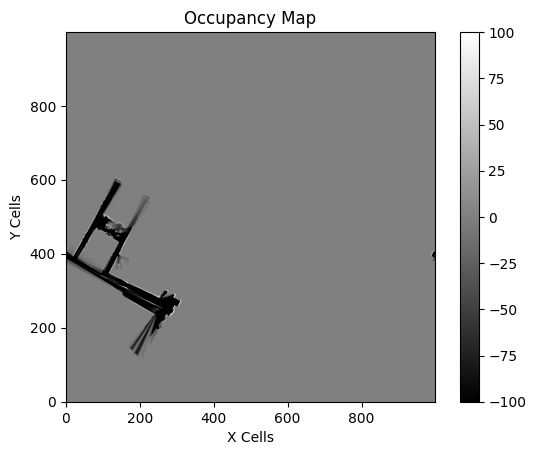

iteration 3601
iteration 3602
iteration 3603
iteration 3604
resampling done
iteration 3605
iteration 3606
iteration 3607
iteration 3608
iteration 3609
iteration 3610
iteration 3611
iteration 3612
iteration 3613
iteration 3614
iteration 3615
resampling done
iteration 3616
iteration 3617
resampling done
iteration 3618
iteration 3619
iteration 3620
iteration 3621
iteration 3622
iteration 3623
iteration 3624
resampling done
iteration 3625
iteration 3626
iteration 3627
iteration 3628
iteration 3629
iteration 3630
iteration 3631
iteration 3632
iteration 3633
iteration 3634
iteration 3635
iteration 3636
iteration 3637
iteration 3638
iteration 3639
resampling done
iteration 3640
iteration 3641
resampling done
iteration 3642
iteration 3643
resampling done
iteration 3644
iteration 3645
iteration 3646
iteration 3647
iteration 3648
iteration 3649
iteration 3650
iteration 3651
iteration 3652
resampling done
iteration 3653
iteration 3654
resampling done
iteration 3655
iteration 3656
resampling done


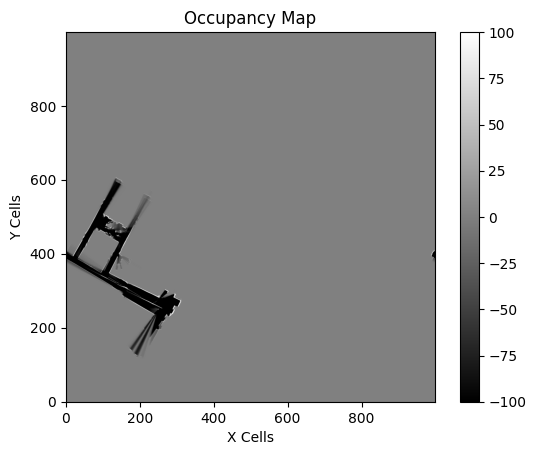

iteration 3701
iteration 3702
iteration 3703
resampling done
iteration 3704
iteration 3705
iteration 3706
iteration 3707
iteration 3708
iteration 3709
iteration 3710
iteration 3711
iteration 3712
iteration 3713
iteration 3714
iteration 3715
iteration 3716
resampling done
iteration 3717
resampling done
iteration 3718
iteration 3719
iteration 3720
resampling done
iteration 3721
iteration 3722
iteration 3723
iteration 3724
iteration 3725
iteration 3726
iteration 3727
resampling done
iteration 3728
iteration 3729
iteration 3730
iteration 3731
resampling done
iteration 3732
iteration 3733
iteration 3734
iteration 3735
iteration 3736
iteration 3737
iteration 3738
iteration 3739
iteration 3740
iteration 3741
iteration 3742
resampling done
iteration 3743
iteration 3744
iteration 3745
iteration 3746
iteration 3747
iteration 3748
iteration 3749
iteration 3750
iteration 3751
iteration 3752
iteration 3753
iteration 3754
iteration 3755
iteration 3756
iteration 3757
resampling done
iteration 3758
it

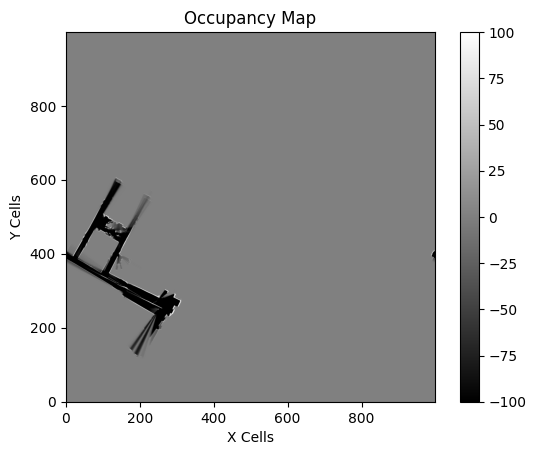

iteration 3801
iteration 3802
iteration 3803
iteration 3804
iteration 3805
iteration 3806
iteration 3807
iteration 3808
iteration 3809
iteration 3810
resampling done
iteration 3811
iteration 3812
iteration 3813
resampling done
iteration 3814
iteration 3815
iteration 3816
iteration 3817
iteration 3818
resampling done
iteration 3819
iteration 3820
resampling done
iteration 3821
resampling done
iteration 3822
iteration 3823
iteration 3824
iteration 3825
iteration 3826
iteration 3827
iteration 3828
iteration 3829
iteration 3830
resampling done
iteration 3831
iteration 3832
resampling done
iteration 3833
iteration 3834
resampling done
iteration 3835
iteration 3836
iteration 3837
iteration 3838
resampling done
iteration 3839
resampling done
iteration 3840
iteration 3841
resampling done
iteration 3842
iteration 3843
iteration 3844
iteration 3845
iteration 3846
iteration 3847
iteration 3848
iteration 3849
iteration 3850
iteration 3851
iteration 3852
iteration 3853
resampling done
iteration 385

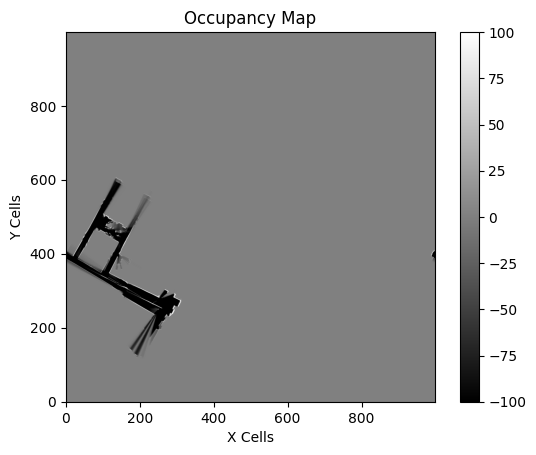

In [69]:
occupancymaps_all_4_good_width = lidar_hits_2(FL_4,FR_4,RL_4,RR_4,ts_enc_4,encoder_ticks_to_meters,width_between_wheels,1.7,lidar_4,matched_lidar_indices_4,adjust_x,adjust_y,map_cell_size,maxmap,init_map_size,log_odds_for_occupied,log_odds_for_empty,num_particles,n_eff_min,noise_covariance,occmap_minval,occmap_maxval)

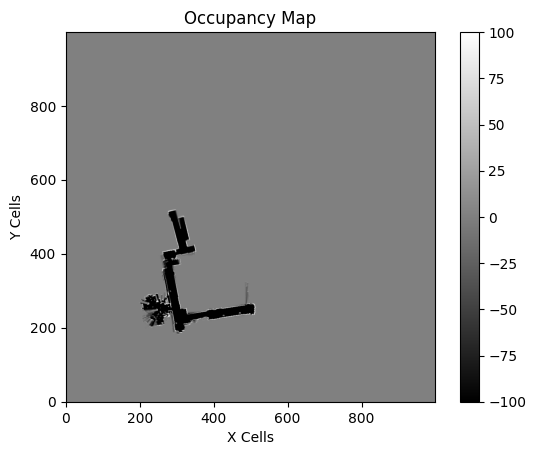

In [70]:
plot_occupancy_map(occupancymaps_all_0_good_width[-1])

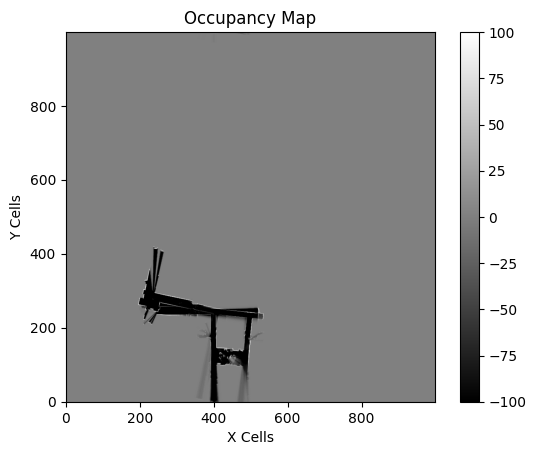

In [71]:
plot_occupancy_map(occupancymaps_all_3_good_width[-1])

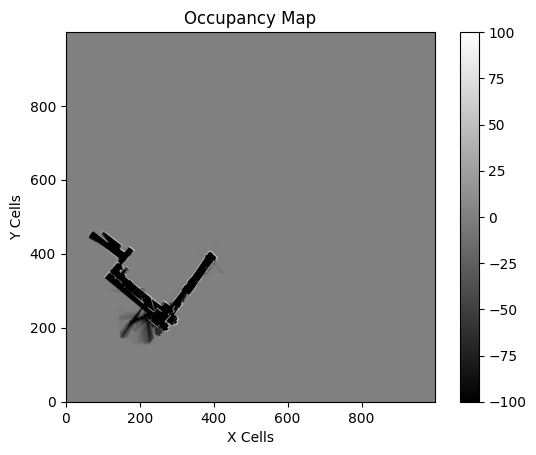

In [72]:
plot_occupancy_map(occupancymaps_all_2_good_width[-1])

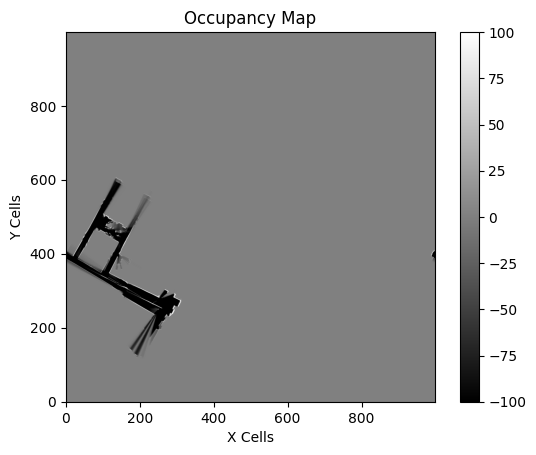

In [73]:
plot_occupancy_map(occupancymaps_all_4_good_width[-1])

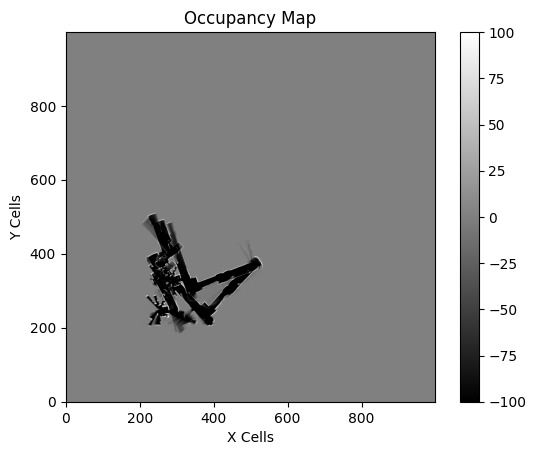

In [74]:
plot_occupancy_map(occupancymaps_all_0_bad_width[-1])

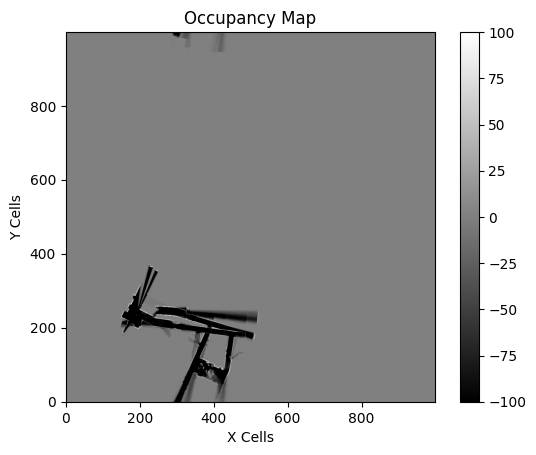

In [75]:
plot_occupancy_map(occupancymaps_all_3_bad_width[-1])